# Ruoss/Ward Single-cell RNA Seq (scRNASeq) Analysis - Finding MSCs in BMAC samples - EXCLUDING JTW02

* Art Nasamran, UCSD, CCBB
* September 2018

This analysis notebook is heavily based on the Satija Lab tutorial, ["Seurat - Guided Clustering Tutorial"](https://satijalab.org/seurat/pbmc3k_tutorial.html). Prior to this notebook, the scRNASeq data were aligned, counted, and aggregated using [Cell Ranger v.2.2.0 (10X Genomics) software.](https://support.10xgenomics.com/single-cell-gene-expression/software/pipelines/latest/what-is-cell-ranger)

In [157]:
#save(cells, file = "20190220_bmac_msc_cells.RData")

In [158]:
load("20190220_bmac_msc_cells.RData")

In [159]:
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,labels,pt.size,Dominici,Ghaz_surf,Jia,Silva,Silva78,Ghaz_c3c5_lib
AAACCTGAGAAACCAT-1,5360,41716,bmac_msc_nojtw02,JTW01,0.02879543,5,5,14,10,18,Cultured MSCs,0.05,yes,no,yes,no,yes,no
AAACCTGAGCGATTCT-1,2309,7932,bmac_msc_nojtw02,JTW01,0.08827238,8,9,10,5,11,Cultured MSCs,0.05,no,no,yes,no,yes,no
AAACCTGCACAAGCCC-1,3437,14686,bmac_msc_nojtw02,JTW01,0.02404468,1,1,3,8,7,Cultured MSCs,0.05,no,no,no,no,no,no
AAACCTGCAGATGAGC-1,3773,21028,bmac_msc_nojtw02,JTW01,0.03143876,5,5,1,17,9,Cultured MSCs,0.05,no,no,yes,no,yes,no
AAACCTGGTGCGCTTG-1,3978,21707,bmac_msc_nojtw02,JTW01,0.03382021,1,1,3,8,12,Cultured MSCs,0.05,no,no,no,no,yes,no
AAACCTGTCACCACCT-1,6547,58719,bmac_msc_nojtw02,JTW01,0.02635434,5,5,14,10,18,Cultured MSCs,0.05,yes,no,yes,no,yes,no


## Create a count matrix
Prior to running this notebook, use the cellranger aggr function to combine samples into a count matrix. The following command was used to create the count matrix:
* NOTE: JTW04 and JTW09 were excluded due to poor quality measurements
    * Low fraction reads confidently mapped to transcriptome
    * Low RNA read Q30 fraction
    * Low fraction reads in cells

aggr csv for all, "all_samples.csv"

    library_id,molecule_h5
    JTW01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW01/outs/molecule_info.h5
    JTW02,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW02/outs/molecule_info.h5
    JTW03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW03/outs/molecule_info.h5
    JTW05,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW05/outs/molecule_info.h5
    JTW06,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW06/outs/molecule_info.h5
    JTW07,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW07/outs/molecule_info.h5
    JTW08,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW08/outs/molecule_info.h5
    JTW10,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW10/outs/molecule_info.h5
    MG01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG01/outs/molecule_info.h5
    MG02,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG02/outs/molecule_info.h5
    MG03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG03/outs/molecule_info.h5    

In [ ]:
# The following commands were run using a shell script. 
# They can also be run in this notebook using a python kernel.
cellranger=/mnt/data1/art/software/CellRanger/cellranger-2.2.0/cellranger

In [ ]:
# All samples
!cd /mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results
!$cellranger aggr --id=all \
                  --csv=all_samples.csv \
                  --normalize=none \
                  --localmem 16
# END Python kernel usage. Switch back to R for the remainder of the notebook.

## Quality Control

In [1]:
# All
IRdisplay::display_html('<iframe src="web_summary.html" width=1000, height=1000></iframe> ')

# Load Seurat objects
* Load count matrices from Cell Ranger
* Select genes for the alignment procedure. The tutorial chooses the union of the top 1,000 genes with the highest dispersion (variance/mean) from both datasets.

In [2]:
#install.packages('remotes')
#remotes::install_github("UCSF-TI/fake-hdf5r")

In [1]:
#install.packages("Seurat")
library(Seurat)

Loading required package: ggplot2
Loading required package: cowplot

Attaching package: ‘cowplot’

The following object is masked from ‘package:ggplot2’:

    ggsave

Loading required package: Matrix


In [2]:
# Load cellranger object
cells.data <- Read10X(data.dir = "/home/ec2-user/art/ruoss/all_samples/outs/filtered_gene_bc_matrices_mex/GRCh38/")

In [3]:
dim(cells.data)
sum(cells.data)

[1] 33694 16524

[1] 128472931

# Remove JTW02 (purchased BMAC sample)
* JTW02 cells have a "-2" suffix
* expect 673 cells

In [6]:
jtw02.cells <- grep("-2$", colnames(cells.data))
length(jtw02.cells)

[1] 673

In [8]:
cells.data <- cells.data[,-jtw02.cells]
dim(cells.data)

[1] 33694 15851

# Cell QC and filtering

[Ilicic et al. Classification of low quality cells from single-cell RNA-seq data, Genome Biology 2016](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-016-0888-1)
* Find and remove low quality cells prior to downstream analysis
* High proportions of mitochondrial genes are indicative of low quality cells (Ilicic et al 2016). 

In [10]:
15851 * 0.001 # 0.1% of cells

[1] 15.851

In [11]:
# Parameters
# min.cells - include genes with detected expression in at least this many cells (~0.1% of the data)
# FilterCells - keep cells that have >200 genes
# NormalizeData - log-normalization
# ScaleData - scales and centers genes in the dataset
#           - removes unwanted sources of variation by creating linear models to predict gene expression

cells <- CreateSeuratObject(raw.data = cells.data, project = "bmac_msc_nojtw02", min.cells = 16, min.genes = 200) 

### Add sample information to metadata

In [12]:
samples <- read.csv(file.path("/home/ec2-user/art/ruoss/all_samples/outs", "aggregation_csv.csv"), stringsAsFactors = F)

In [13]:
samples$libcodes <- c(1:nrow(samples))

In [14]:
samples

library_id,molecule_h5,libcodes
JTW01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW01/outs/molecule_info.h5,1
JTW02,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW02/outs/molecule_info.h5,2
JTW03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW03/outs/molecule_info.h5,3
JTW05,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW05/outs/molecule_info.h5,4
JTW06,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW06/outs/molecule_info.h5,5
JTW07,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW07/outs/molecule_info.h5,6
JTW08,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW08/outs/molecule_info.h5,7
JTW10,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW10/outs/molecule_info.h5,8
MG01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG01/outs/molecule_info.h5,9
MG02,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG02/outs/molecule_info.h5,10


In [15]:
# Remove JTW02
samples <- samples[-2,]
samples

,library_id,molecule_h5,libcodes
1,JTW01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW01/outs/molecule_info.h5,1
3,JTW03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW03/outs/molecule_info.h5,3
4,JTW05,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW05/outs/molecule_info.h5,4
5,JTW06,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW06/outs/molecule_info.h5,5
6,JTW07,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW07/outs/molecule_info.h5,6
7,JTW08,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW08/outs/molecule_info.h5,7
8,JTW10,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW10/outs/molecule_info.h5,8
9,MG01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG01/outs/molecule_info.h5,9
10,MG02,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG02/outs/molecule_info.h5,10
11,MG03,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/MG03/outs/molecule_info.h5,11


In [16]:
cellcodes <- as.data.frame(cells@raw.data@Dimnames[[2]])
colnames(cellcodes) <- "barcodes"
rownames(cellcodes) <- cellcodes$barcodes
cellcodes$libcodes <- as.numeric(gsub(pattern=".+-", replacement="", cellcodes$barcodes))

In [17]:
require(dplyr)
tmp <- left_join(cellcodes, samples, by = "libcodes")
dim(tmp)
head(tmp)

Loading required package: dplyr

Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



[1] 14451     4

barcodes,libcodes,library_id,molecule_h5
AAACCTGAGAAACCAT-1,1,JTW01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW01/outs/molecule_info.h5
AAACCTGAGCGATTCT-1,1,JTW01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW01/outs/molecule_info.h5
AAACCTGCACAAGCCC-1,1,JTW01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW01/outs/molecule_info.h5
AAACCTGCAGATGAGC-1,1,JTW01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW01/outs/molecule_info.h5
AAACCTGGTGCGCTTG-1,1,JTW01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW01/outs/molecule_info.h5
AAACCTGTCACCACCT-1,1,JTW01,/mnt/data1/art/20180911_Ruoss_BMAC_scRNASeq/results/JTW01/outs/molecule_info.h5


In [18]:
rownames(tmp) <- tmp$barcodes

In [19]:
tmp <- tmp["library_id"]

In [20]:
cells <- AddMetaData(object = cells, metadata = tmp, col.name = "library_id")

In [28]:
head(cells@meta.data)
table(cells@meta.data$library_id)

,nGene,nUMI,orig.ident,library_id,percent.mito
AAACCTGAGAAACCAT-1,5360,41716,bmac_msc_nojtw02,JTW01,0.02879543
AAACCTGAGCGATTCT-1,2309,7932,bmac_msc_nojtw02,JTW01,0.08827238
AAACCTGCACAAGCCC-1,3437,14686,bmac_msc_nojtw02,JTW01,0.02404468
AAACCTGCAGATGAGC-1,3773,21028,bmac_msc_nojtw02,JTW01,0.03143876
AAACCTGGTGCGCTTG-1,3978,21707,bmac_msc_nojtw02,JTW01,0.03382021
AAACCTGTCACCACCT-1,6547,58719,bmac_msc_nojtw02,JTW01,0.02635434



JTW01 JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG01  MG02  MG03 
 2978   780  1759  1016   676   563  1166  1112  1294   935 

In [22]:
# Mitochondrial genes
cells.mito.genes <- grep(pattern = "^MT-", x = rownames(x = cells@data), value = TRUE)
cells.percent.mito <- Matrix::colSums(cells@raw.data[cells.mito.genes, ])/Matrix::colSums(cells@raw.data)
cells <- AddMetaData(object = cells, metadata = cells.percent.mito, col.name = "percent.mito")

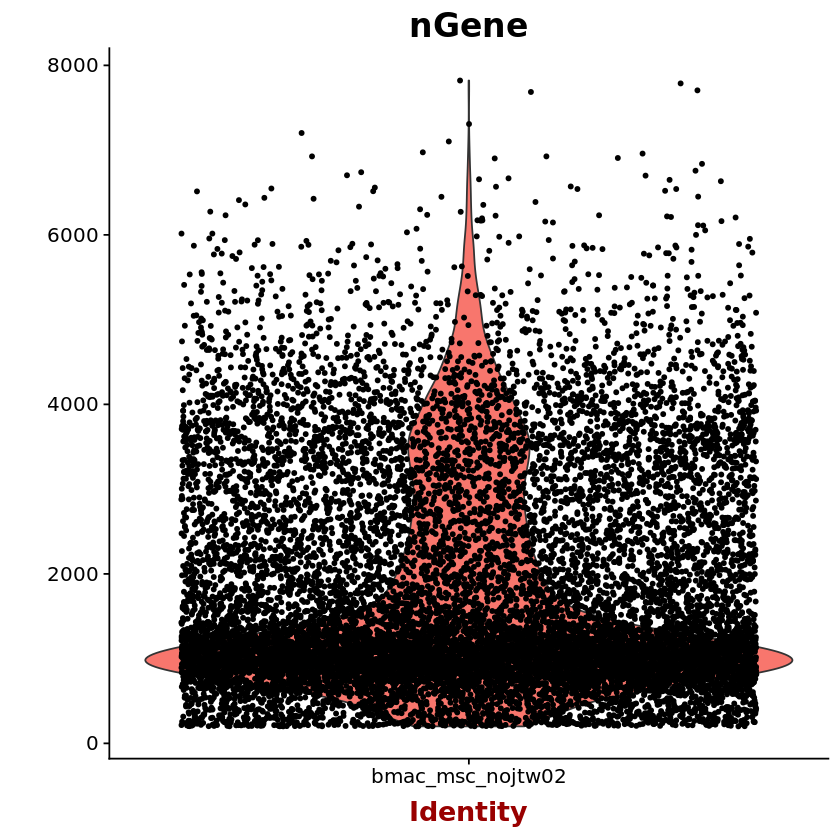

In [23]:
# QC
VlnPlot(object = cells, features.plot = "nGene")

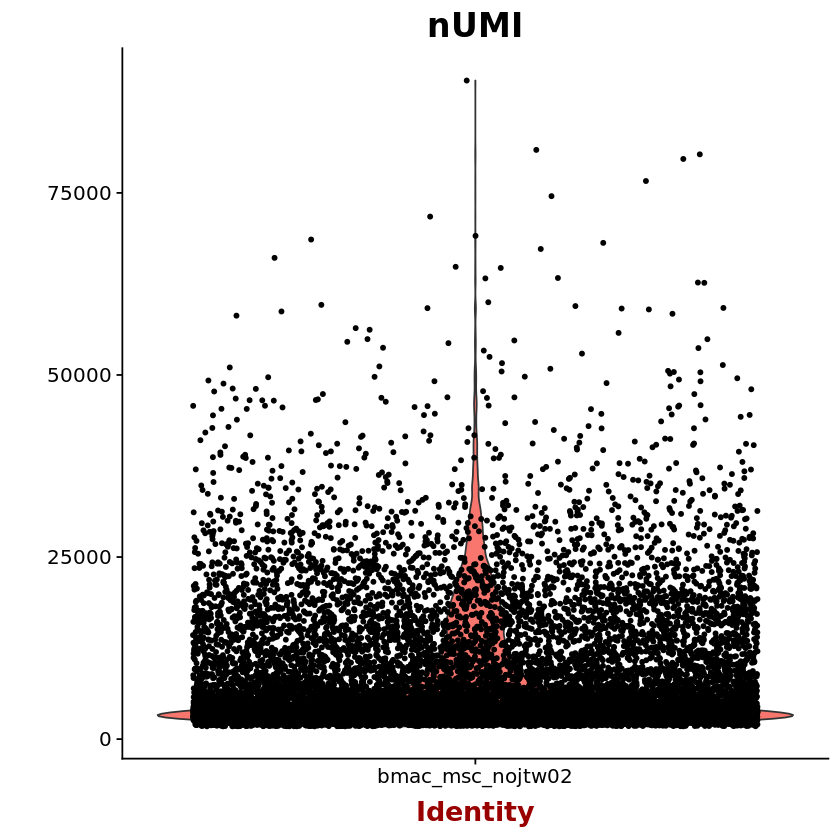

In [24]:
VlnPlot(object = cells, features.plot = "nUMI")

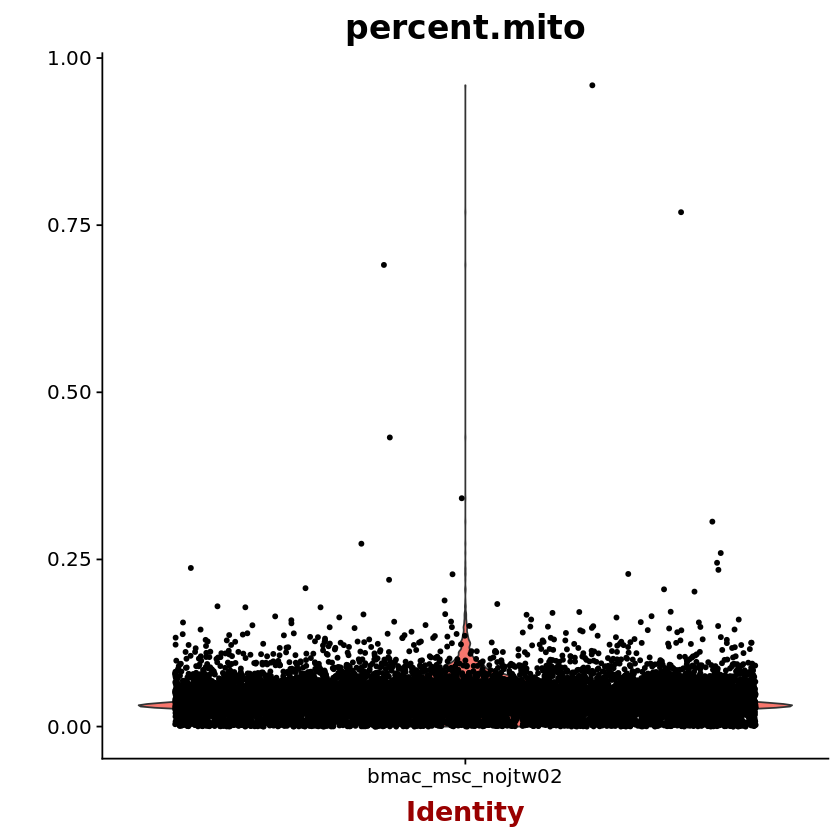

In [25]:
VlnPlot(object = cells, features.plot = "percent.mito")

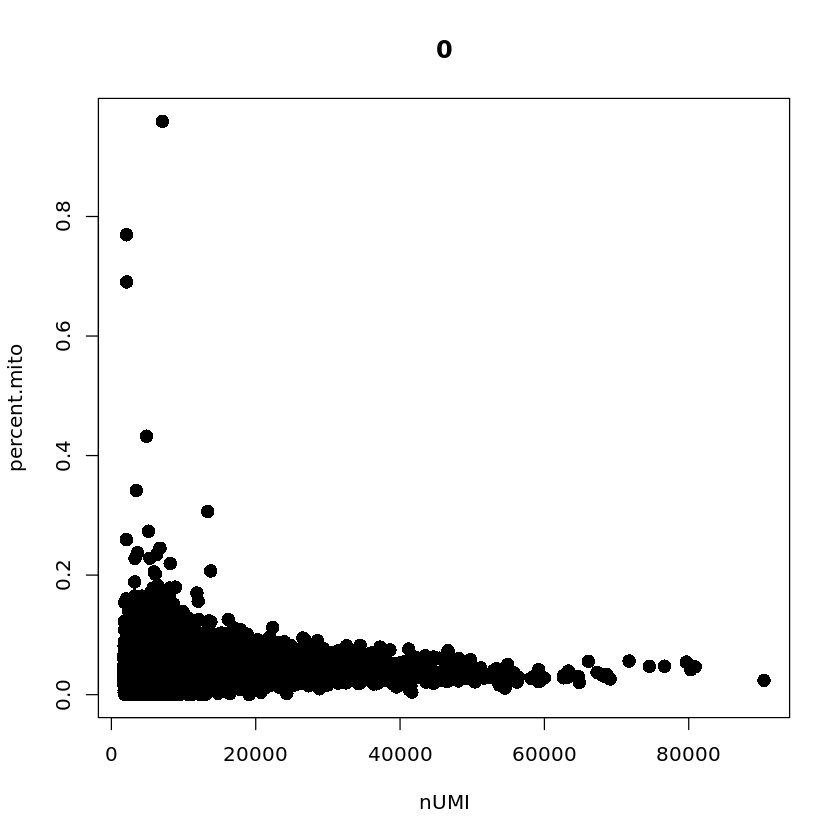

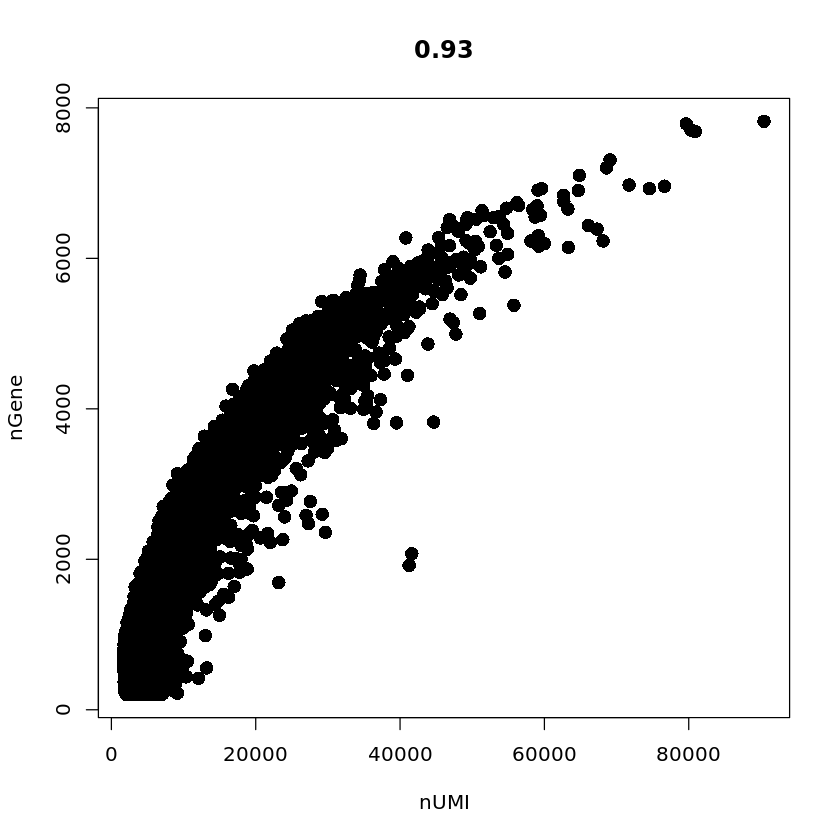

In [26]:
GenePlot(object = cells, gene1 = "nUMI", gene2 = "percent.mito")
GenePlot(object = cells, gene1 = "nUMI", gene2 = "nGene")

BMAC cells
* Filter out cells that have unique gene counts of less than 750
* Filter percent.mito > 0.15

In [27]:
cells <- FilterCells(cells, 
                     subset.names = c("nGene", "percent.mito"), 
                     low.thresholds = c(750, -Inf), 
                     high.thresholds = c(Inf, 0.15))
# Filter by nGene only
# cells <- FilterCells(cells, subset.names = "nGene", low.thresholds = 40, high.thresholds = Inf)

# Normalization

In [29]:
cells <- NormalizeData(cells, normalization.method = "LogNormalize")

# Detection of variable genes across the single cells
"Seurat calculates highly variable genes and focuses on these for downstream analysis. FindVariableGenes calculates the average expression and dispersion for each gene, places these genes into bins, and then calculates a z-score for dispersion within each bin. This helps control for the relationship between variability and average expression. This function is unchanged from (Macosko et al.), but new methods for variable gene expression identification are coming soon. We suggest that users set these parameters to mark visual outliers on the dispersion plot, but the exact parameter settings may vary based on the data type, heterogeneity in the sample, and normalization strategy. The parameters here identify ~2,000 variable genes, and represent typical parameter settings for UMI data that is normalized to a total of 1e4 molecules." (Satija Lab)

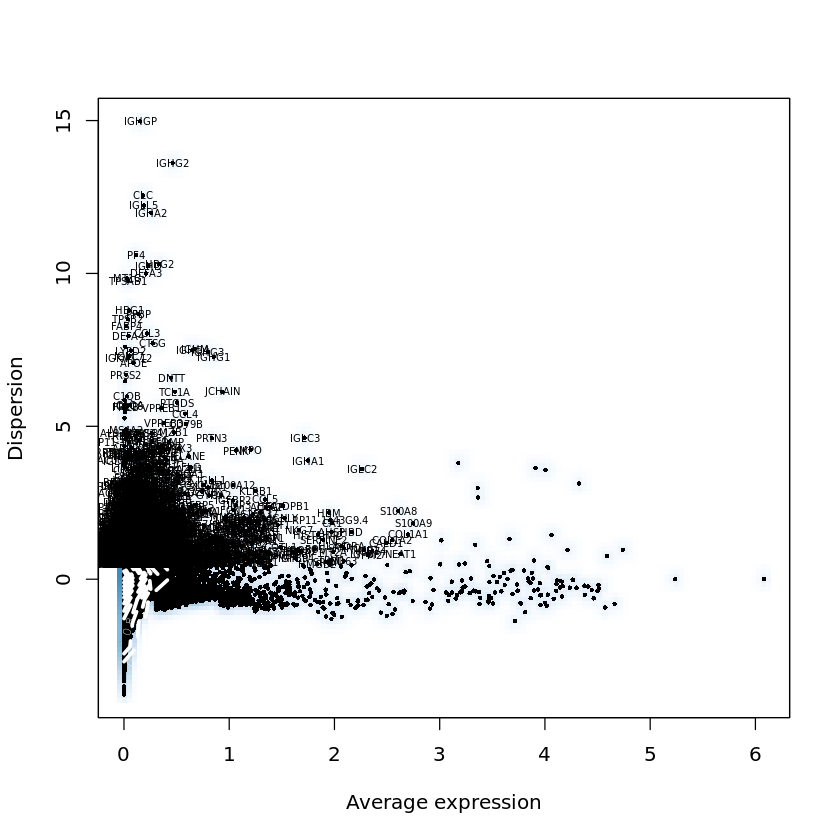

In [30]:
cells <- FindVariableGenes(object = cells, mean.function = ExpMean, dispersion.function = LogVMR, 
    x.low.cutoff = 0.0125, x.high.cutoff = 3, y.cutoff = 0.5)

In [31]:
length(cells@var.genes)

[1] 2964

# Scaling the data and removing unwanted sources of variation
"Your single cell dataset likely contains ‘uninteresting’ sources of variation. This could include not only technical noise, but batch effects, or even biological sources of variation (cell cycle stage). As suggested in Buettner et al, NBT, 2015, regressing these signals out of the analysis can improve downstream dimensionality reduction and clustering. To mitigate the effect of these signals, Seurat constructs linear models to predict gene expression based on user-defined variables. The scaled z-scored residuals of these models are stored in the scale.data slot, and are used for dimensionality reduction and clustering.

We can regress out cell-cell variation in gene expression driven by batch (if applicable), cell alignment rate (as provided by Drop-seq tools for Drop-seq data), the number of detected molecules, and mitochondrial gene expression. For cycling cells, we can also learn a ‘cell-cycle’ score (see example here) and regress this out as well. In this simple example here for post-mitotic blood cells, we regress on the number of detected molecules per cell as well as the percentage mitochondrial gene content.

Seurat v2.0 implements this regression as part of the data scaling process. Therefore, the RegressOut function has been deprecated, and replaced with the vars.to.regress argument in ScaleData." (Satija Lab)

In [32]:
cells <- ScaleData(object = cells, vars.to.regress = c("nUMI", "percent.mito"))

Regressing out: nUMI, percent.mito



Time Elapsed:  2.28224676052729 mins

Scaling data matrix


In [33]:
cells

An object of class seurat in project bmac_msc_nojtw02 
 17692 genes across 12279 samples.

# Perform linear dimensional reduction
* PCA on the scaled data and variable genes of interest

In [34]:
cells <- RunPCA(object = cells, 
                pc.genes = cells@var.genes, 
                do.print = TRUE, 
                pcs.print = 1:5,
                genes.print = 5)

[1] "PC1"
[1] "HMGB2"    "LMO2"     "CD36"     "KCNH2"    "KIAA0101"
[1] ""
[1] "COL1A2" "COL1A1" "CALD1"  "SPARC"  "MMP2"  
[1] ""
[1] ""
[1] "PC2"
[1] "GYPC"  "AHSP"  "PRDX2" "CA1"   "SMIM1"
[1] ""
[1] "FCN1"   "CSTA"   "TYROBP" "LST1"   "MNDA"  
[1] ""
[1] ""
[1] "PC3"
[1] "IL32" "CD3D" "CD3E" "HCST" "TRAC"
[1] ""
[1] "BLVRB" "GYPA"  "CA2"   "GYPB"  "AHSP" 
[1] ""
[1] ""
[1] "PC4"
[1] "GIMAP7"  "GIMAP4"  "FCN1"    "BLVRB"   "S100A12"
[1] ""
[1] "MZB1"    "TCF4"    "SPIB"    "FAM129C" "CD79A"  
[1] ""
[1] ""
[1] "PC5"
[1] "LTB"  "CCR7" "LEF1" "CD27" "MAL" 
[1] ""
[1] "GZMB"  "NKG7"  "KLRD1" "GNLY"  "GZMA" 
[1] ""
[1] ""


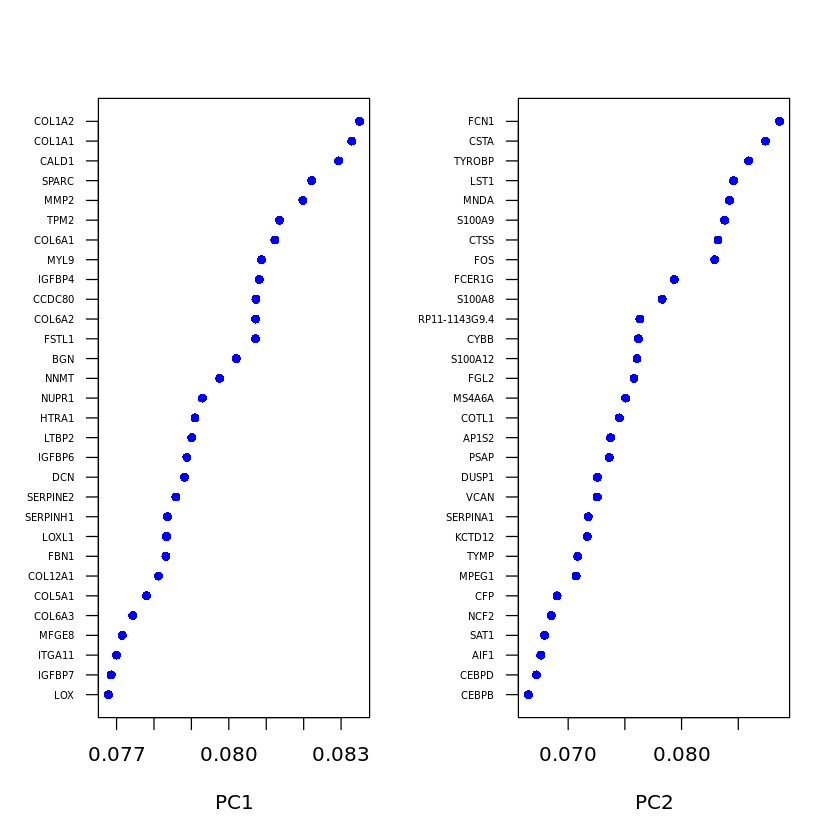

In [35]:
# Visualize results of PCA
VizPCA(object = cells, pcs.use = 1:2)

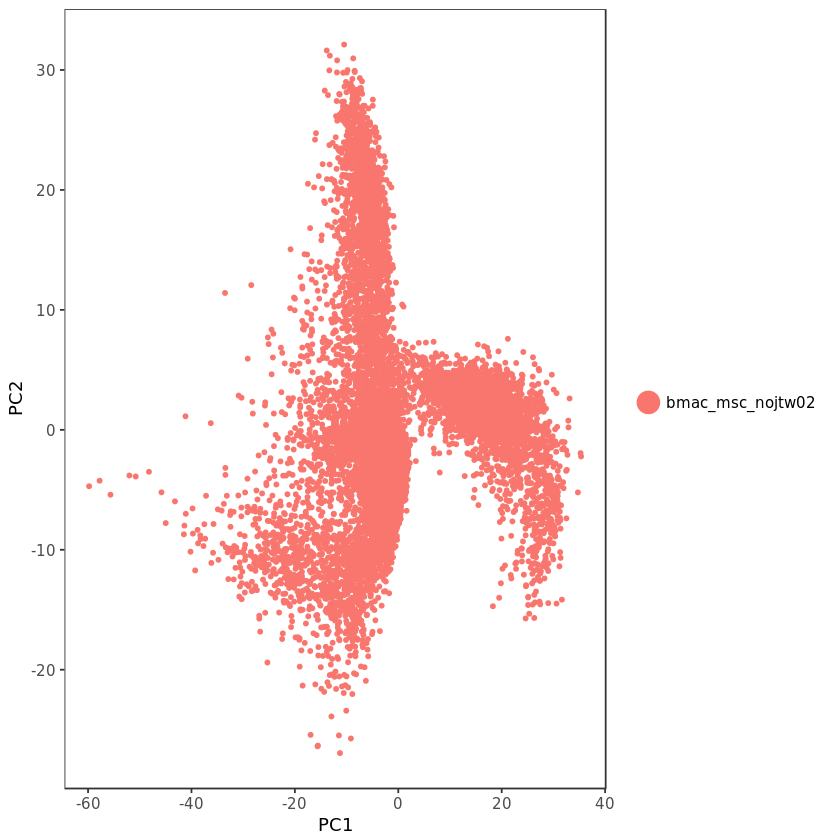

In [36]:
PCAPlot(object = cells, dim.1 = 1, dim.2 = 2)

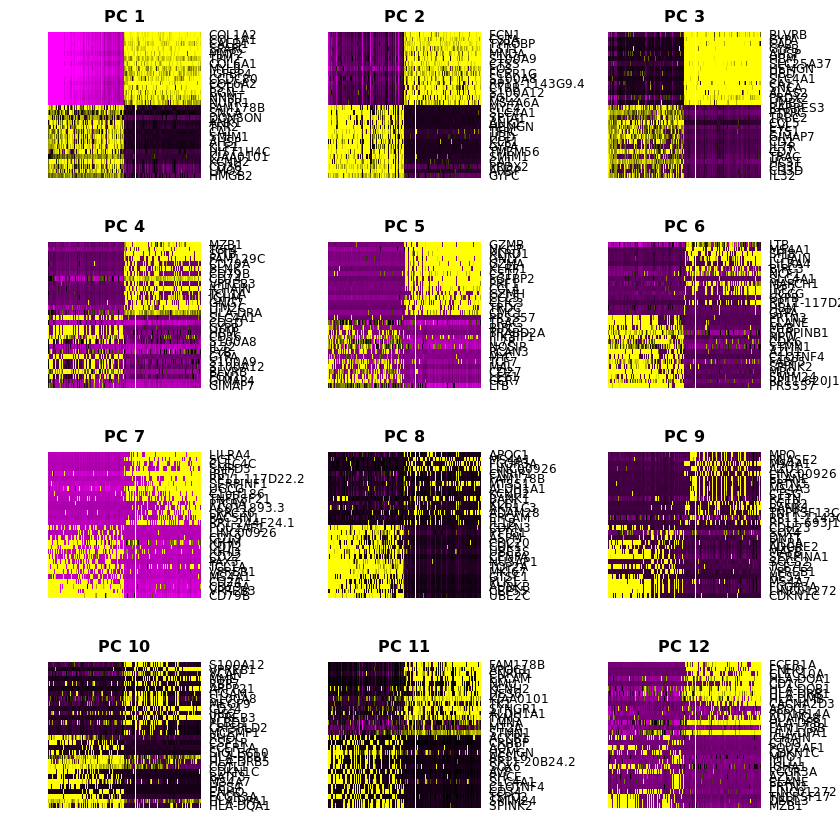

In [37]:
PCHeatmap(object = cells, 
          pc.use = 1:12, 
          cells.use = 500, 
          do.balanced = TRUE, 
          label.columns = FALSE, 
          use.full = FALSE)

## Determine statistically significant principal components
"To overcome the extensive technical noise in any single gene for scRNA-seq data, Seurat clusters cells based on their PCA scores, with each PC essentially representing a ‘metagene’ that combines information across a correlated gene set. Determining how many PCs to include downstream is therefore an important step.

In Macosko et al, we implemented a resampling test inspired by the jackStraw procedure. We randomly permute a subset of the data (1% by default) and rerun PCA, constructing a ‘null distribution’ of gene scores, and repeat this procedure. We identify ‘significant’ PCs as those who have a strong enrichment of low p-value genes." (Satija Lab)

### JackStraw plot

In [38]:
# Computationally intensive
#cells <- JackStraw(object = cells, num.replicate = 100, display.progress = FALSE)

In [39]:
#JackStrawPlot(object = cells, PCs = 1:20)

### Elbow plot
"PC selection – identifying the true dimensionality of a dataset – is an important step for Seurat, but can be challenging/uncertain for the user. We therefore suggest these three approaches to consider. The first is more supervised, exploring PCs to determine relevant sources of heterogeneity, and could be used in conjunction with GSEA for example. The second implements a statistical test based on a random null model, but is time-consuming for large datasets, and may not return a clear PC cutoff. The third is a heuristic that is commonly used, and can be calculated instantly. In this example, all three approaches yielded similar results, but we might have been justified in choosing anything between PC 7-10 as a cutoff. We followed the jackStraw here, admittedly buoyed by seeing the PCHeatmap returning interpretable signals (including canonical dendritic cell markers) throughout these PCs. Though the results are only subtly affected by small shifts in this cutoff (you can test below), we strongly suggest always explore the PCs they choose to include downstream." (Satija Lab)

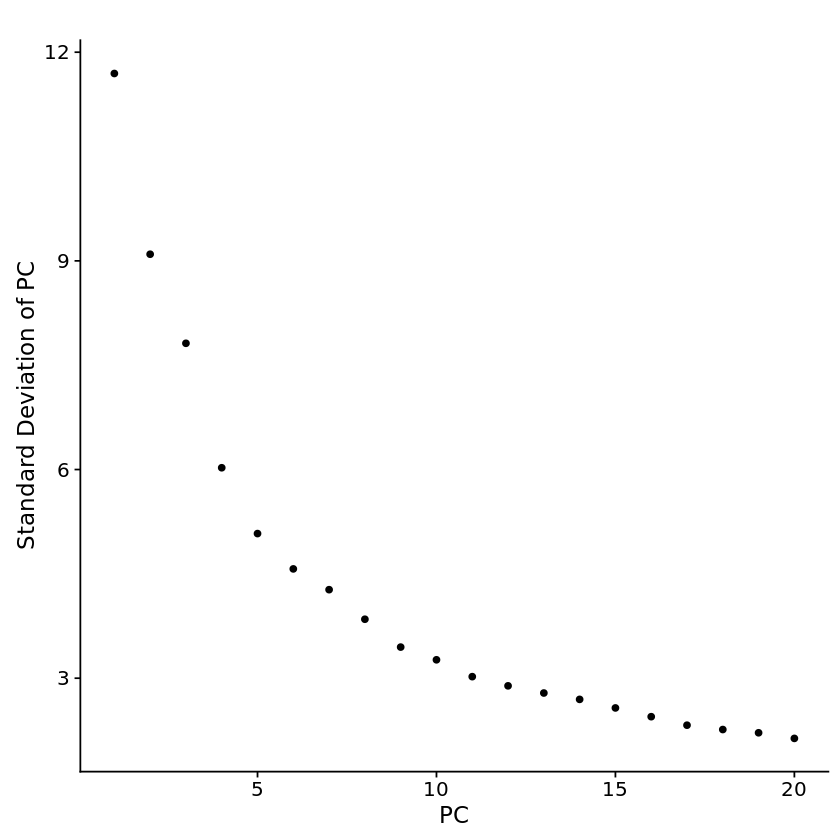

In [40]:
PCElbowPlot(object = cells)

# Cluster the cells
"Seurat now includes an graph-based clustering approach compared to (Macosko et al.). Importantly, the distance metric which drives the clustering analysis (based on previously identified PCs) remains the same. However, our approach to partioning the cellular distance matrix into clusters has dramatically improved. Our approach was heavily inspired by recent manuscripts which applied graph-based clustering approaches to scRNA-seq data [SNN-Cliq, Xu and Su, Bioinformatics, 2015] and CyTOF data [PhenoGraph, Levine et al., Cell, 2015]. Briefly, these methods embed cells in a graph structure - for example a K-nearest neighbor (KNN) graph, with edges drawn between cells with similar gene expression patterns, and then attempt to partition this graph into highly interconnected ‘quasi-cliques’ or ‘communities’. As in PhenoGraph, we first construct a KNN graph based on the euclidean distance in PCA space, and refine the edge weights between any two cells based on the shared overlap in their local neighborhoods (Jaccard similarity). To cluster the cells, we apply modularity optimization techniques such as the Louvain algorithm (default) or SLM [SLM, Blondel et al., Journal of Statistical Mechanics], to iteratively group cells together, with the goal of optimizing the standard modularity function.

The FindClusters function implements the procedure, and contains a resolution parameter that sets the ‘granularity’ of the downstream clustering, with increased values leading to a greater number of clusters. We find that setting this parameter between 0.6-1.2 typically returns good results for single cell datasets of around 3K cells. Optimal resolution often increases for larger datasets. The clusters are saved in the object@ident slot." (Satija Lab)


In [41]:
# Set seed for reproducibility
seed <- 7

cells <- FindClusters(object = cells, 
                      reduction.type = "pca", 
                      dims.use = 1:15, 
                      resolution = c(0.5, 0.6, 0.8, 1.0, 1.5),
                      #resolution = 0.6, 
                      print.output = 0, 
                      save.SNN = TRUE,
                      random.seed = seed)

In [42]:
# Compare the numbers of clusters for each resolution
head(cells@meta.data)
sapply(grep("^res",colnames(cells@meta.data),value = TRUE),
       function(x) length(unique(cells@meta.data[,x])))

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5
AAACCTGAGAAACCAT-1,5360,41716,bmac_msc_nojtw02,JTW01,0.02879543,5,5,14,10,18
AAACCTGAGCGATTCT-1,2309,7932,bmac_msc_nojtw02,JTW01,0.08827238,8,9,10,5,11
AAACCTGCACAAGCCC-1,3437,14686,bmac_msc_nojtw02,JTW01,0.02404468,1,1,3,8,7
AAACCTGCAGATGAGC-1,3773,21028,bmac_msc_nojtw02,JTW01,0.03143876,5,5,1,17,9
AAACCTGGTGCGCTTG-1,3978,21707,bmac_msc_nojtw02,JTW01,0.03382021,1,1,3,8,12
AAACCTGTCACCACCT-1,6547,58719,bmac_msc_nojtw02,JTW01,0.02635434,5,5,14,10,18


res.0.5 res.0.6 res.0.8   res.1 res.1.5 
     15      16      19      21      25

# Run non-linear dimensional reduction (tSNE)
"Seurat continues to use tSNE as a powerful tool to visualize and explore these datasets. While we no longer advise clustering directly on tSNE components, cells within the graph-based clusters determined above should co-localize on the tSNE plot. This is because the tSNE aims to place cells with similar local neighborhoods in high-dimensional space together in low-dimensional space. As input to the tSNE, we suggest using the same PCs as input to the clustering analysis, although computing the tSNE based on scaled gene expression is also supported using the genes.use argument." (Satija Lab)

In [46]:
cells <- RunTSNE(cells, dim.use = 1:15, k.seed = seed)

In [47]:
# Create plots for each resolution
p0.5 <- TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.0.5")
p0.6 <- TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.0.6")
p0.8 <- TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.0.8")
p1.0 <- TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.1")
p1.5 <- TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5, group.by = "res.1.5")

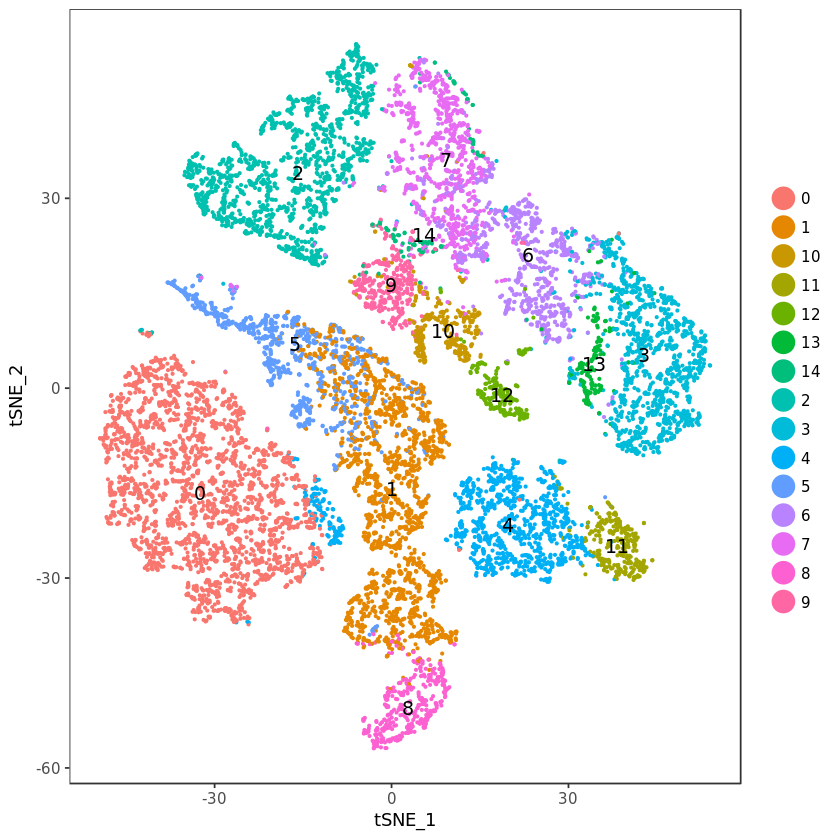

In [48]:
plot(p0.5)

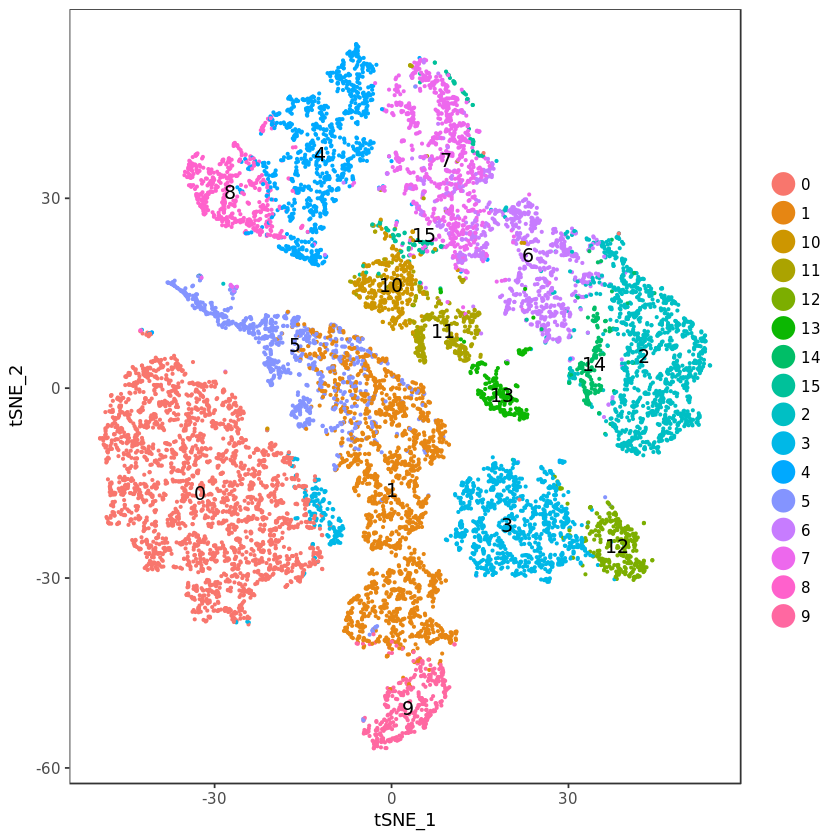

In [49]:
plot(p0.6)

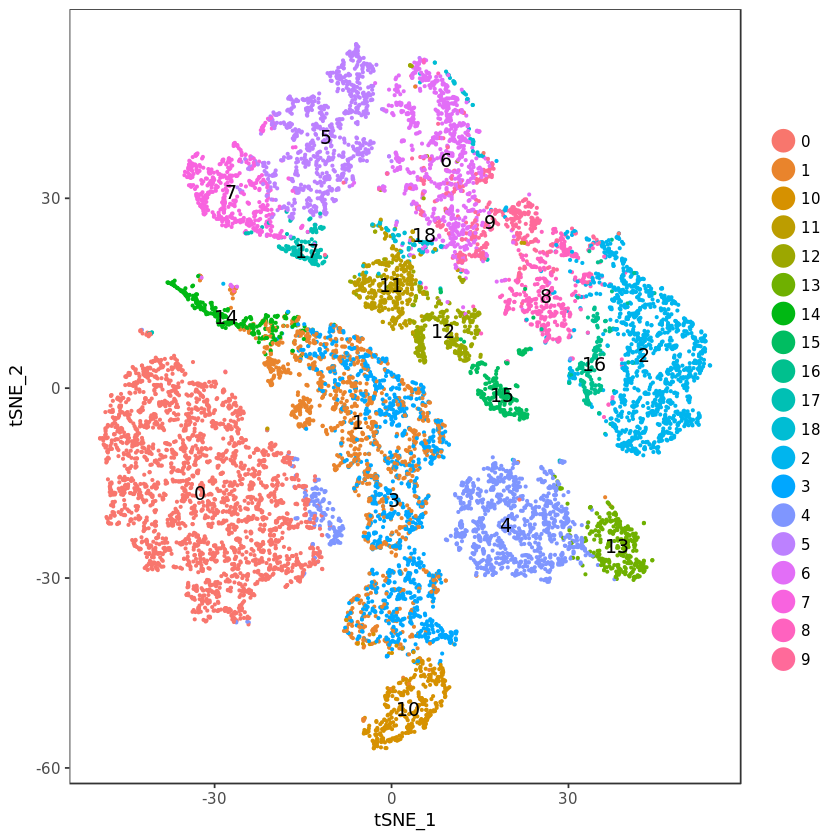

In [50]:
plot(p0.8)

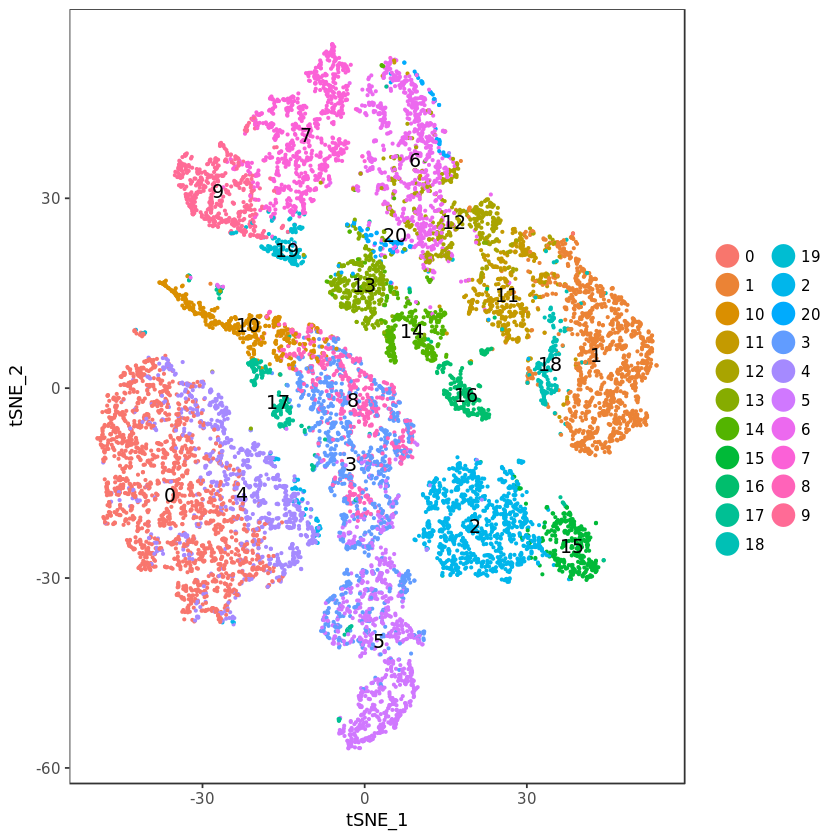

In [51]:
plot(p1.0)

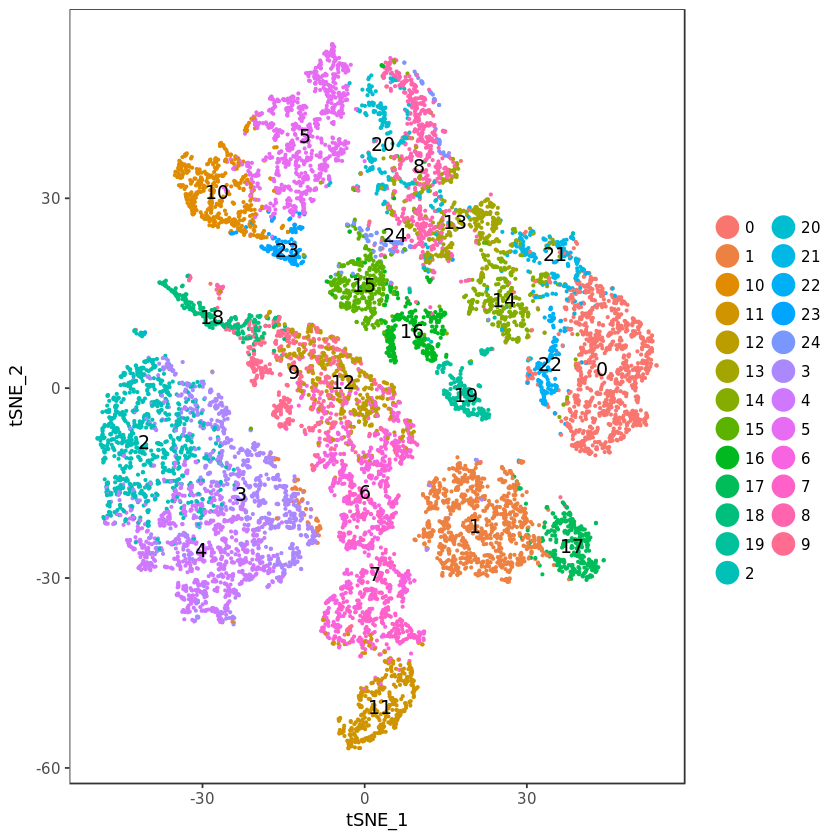

In [52]:
plot(p1.5)

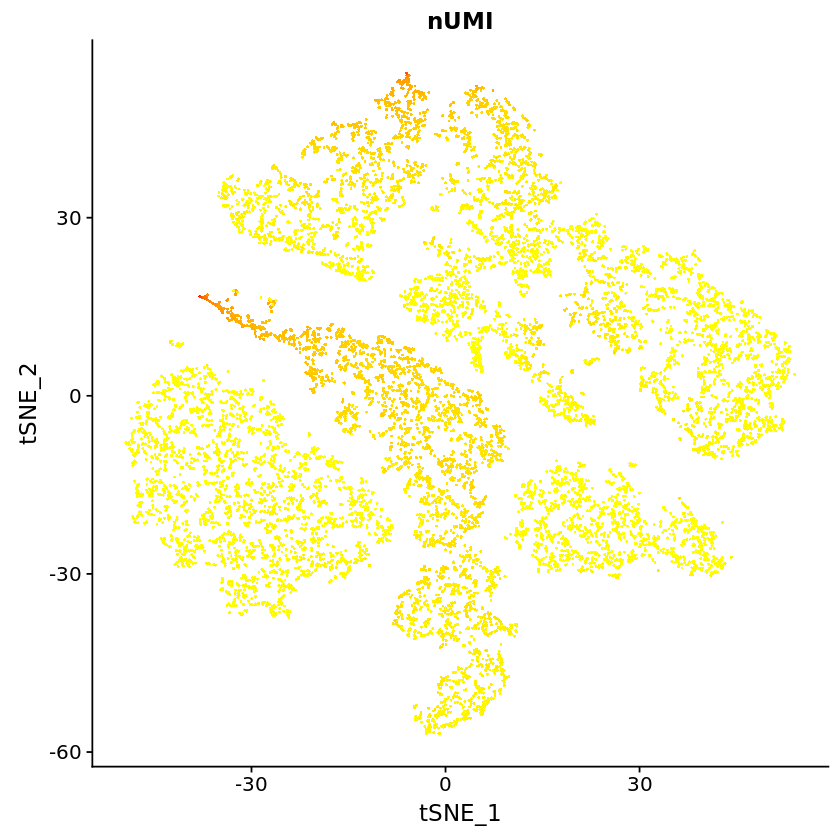

In [53]:
FeaturePlot(cells, features.plot = c("nUMI"), pt.size = 0.5)

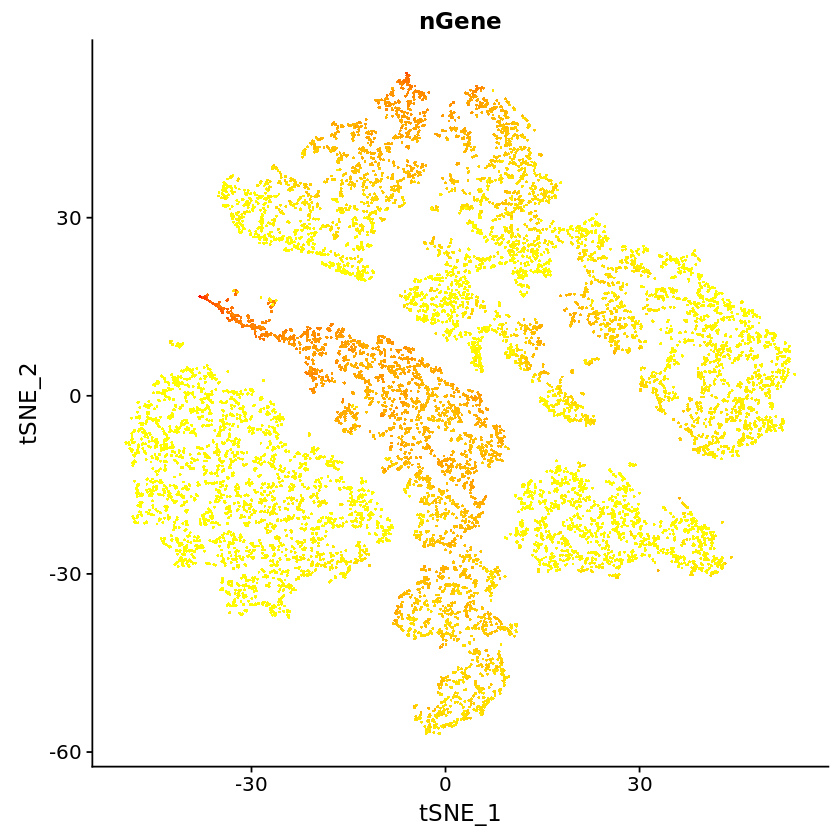

In [54]:
FeaturePlot(cells, features.plot = c("nGene"), pt.size = 0.5)

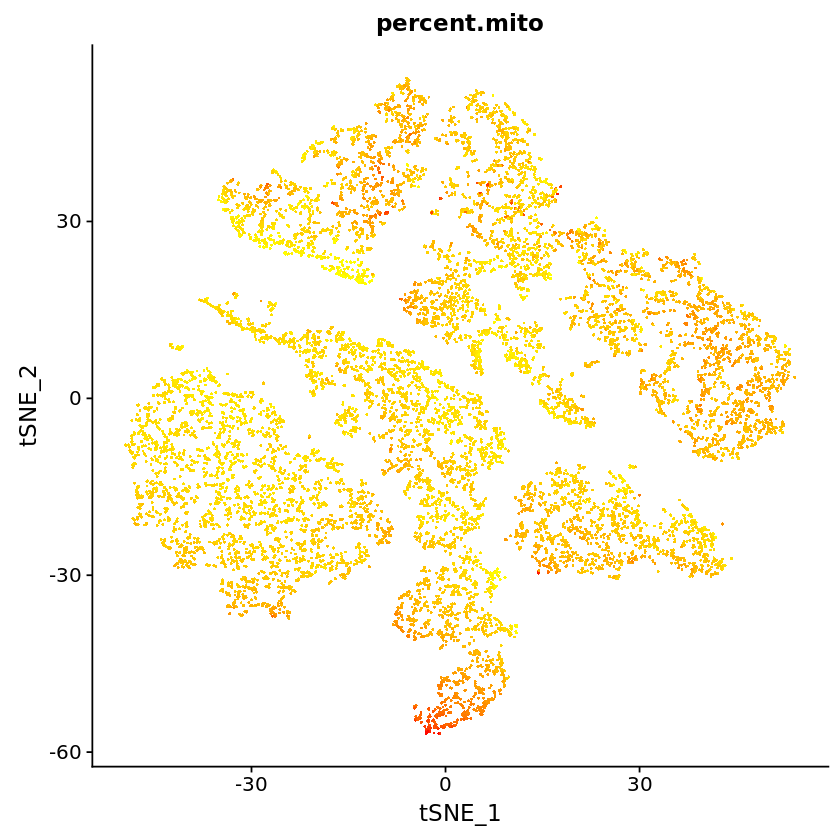

In [55]:
FeaturePlot(cells, features.plot = c("percent.mito"), pt.size = 0.5)

In [56]:
# Choose clustering resolution 
cells <- SetAllIdent(cells, id = "res.0.6")
table(cells@ident, cells@meta.data$orig.ident)

    
     bmac_msc_nojtw02
  0              2461
  1              1738
  2              1168
  3              1065
  4               953
  5               854
  6               831
  7               791
  8               493
  9               396
  10              364
  11              329
  12              305
  13              240
  14              172
  15              119

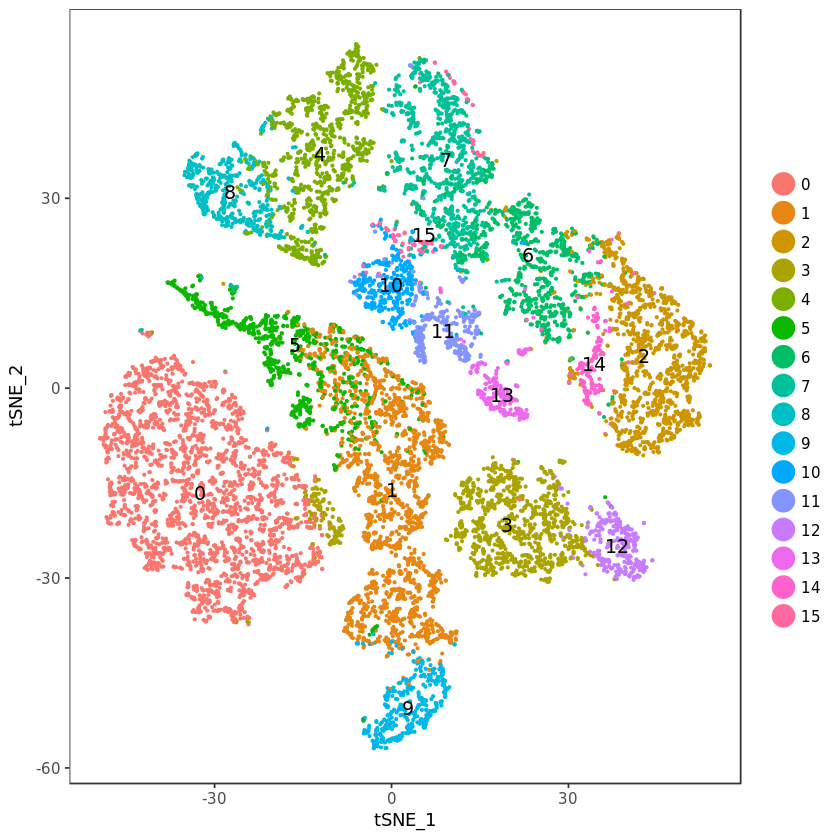

In [57]:
# Visualization
TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5)#, group.by = "res.0.6")

In [ ]:
# Save plots
#png("p1.png")
#plot(p1)
#dev.off()

In [58]:
saveRDS(cells, file = "BMAC_MSC_noJTW02_cells.rds")

# Find differentially expressed genes (cluster biomarkers)
"Seurat can help you find markers that define clusters via differential expression. By default, it identifes positive and negative markers of a single cluster (specified in ident.1), compared to all other cells. FindAllMarkers automates this process for all clusters, but you can also test groups of clusters vs. each other, or against all cells.

The min.pct argument requires a gene to be detected at a minimum percentage in either of the two groups of cells, and the thresh.test argument requires a gene to be differentially expressed (on average) by some amount between the two groups. You can set both of these to 0, but with a dramatic increase in time - since this will test a large number of genes that are unlikely to be highly discriminatory. As another option to speed up these computations, max.cells.per.ident can be set. This will downsample each identity class to have no more cells than whatever this is set to. While there is generally going to be a loss in power, the speed increases can be significiant and the most highly differentially expressed genes will likely still rise to the top." (Satija Lab)

In [59]:
# Number of clusters and comparison name for saving tables
n_clust <- c(0:15)

In [60]:
#?FindMarkers

In [60]:
# min.pct - only test genes that are detected in a minimum fraction of min.pct cells in either of 2 populations.
#         - meant to speed up the function by not testing genes that are infrequently expressed
for (i in n_clust){
    name <- paste("Cluster", i, ".markers", sep = "")
    name <- FindMarkers(cells, ident.1 = i, min.pct = 0.1, print.bar = FALSE)
    write.csv(name, file = paste("BMAC_MSC_noJTW02_Cluster", i, "Conserved_Markers.csv", sep = "_"), quote = FALSE, row.names = TRUE)
}

In [61]:
#cluster0.markers <- FindMarkers(cells, ident.1 = 0, grouping.var = "condition", print.bar = FALSE)
#head(cluster0.markers)

In [62]:
#cluster1.markers <- FindMarkers(cells, ident.1 = 1, grouping.var = "condition", print.bar = FALSE)
#head(cluster1.markers)

In [63]:
#cluster2.markers <- FindMarkers(cells, ident.1 = 2, grouping.var = "condition", print.bar = FALSE)
#head(cluster2.markers)

In [64]:
#cluster3.markers <- FindMarkers(cells, ident.1 = 3, grouping.var = "condition", print.bar = FALSE)
#head(cluster3.markers)

In [65]:
#cluster4.markers <- FindMarkers(cells, ident.1 = 4, grouping.var = "condition", print.bar = FALSE)
#head(cluster4.markers)

In [66]:
#cluster5.markers <- FindMarkers(cells, ident.1 = 5, grouping.var = "condition", print.bar = FALSE)
#head(cluster5.markers)

In [67]:
#cluster6.markers <- FindMarkers(cells, ident.1 = 6, grouping.var = "condition", print.bar = FALSE)
#head(cluster6.markers)

In [68]:
#cluster7.markers <- FindMarkers(cells, ident.1 = 7, grouping.var = "condition", print.bar = FALSE)
#head(cluster7.markers)

In [ ]:
cluster8.markers <- FindMarkers(cells, ident.1 = 8, grouping.var = "condition", print.bar = FALSE)
head(cluster8.markers)

In [ ]:
cluster9.markers <- FindMarkers(cells, ident.1 = 9, grouping.var = "condition", print.bar = FALSE)
head(cluster9.markers)

In [ ]:
cluster10.markers <- FindMarkers(cells, ident.1 = 10, grouping.var = "condition", print.bar = FALSE)
head(cluster10.markers)

In [ ]:
cluster11.markers <- FindMarkers(cells, ident.1 = 11, grouping.var = "condition", print.bar = FALSE)
head(cluster11.markers)

In [ ]:
cluster12.markers <- FindMarkers(cells, ident.1 = 12, grouping.var = "condition", print.bar = FALSE)
head(cluster12.markers)

In [ ]:
cluster13.markers <- FindMarkers(cells, ident.1 = 13, grouping.var = "condition", print.bar = FALSE)
head(cluster13.markers)

In [ ]:
cluster14.markers <- FindMarkers(cells, ident.1 = 14, grouping.var = "condition", print.bar = FALSE)
head(cluster14.markers)

In [ ]:
cluster15.markers <- FindMarkers(cells, ident.1 = 15, grouping.var = "condition", print.bar = FALSE)
head(cluster15.markers)

In [ ]:
cluster16.markers <- FindMarkers(cells, ident.1 = 16, grouping.var = "condition", print.bar = FALSE)
head(cluster16.markers)

In [ ]:
# FindAllMarkers(combined)

## Look for clusters that need to be combined or split
Compare and contrast defining gene lists between clusters based on a cluster tree. Combine clusters that share defining genes. Consult with researchers/literature to see if the combinations make sense.

Finished averaging RNA for cluster 0
Finished averaging RNA for cluster 1
Finished averaging RNA for cluster 2
Finished averaging RNA for cluster 3
Finished averaging RNA for cluster 4
Finished averaging RNA for cluster 5
Finished averaging RNA for cluster 6
Finished averaging RNA for cluster 7
Finished averaging RNA for cluster 8
Finished averaging RNA for cluster 9
Finished averaging RNA for cluster 10
Finished averaging RNA for cluster 11
Finished averaging RNA for cluster 12
Finished averaging RNA for cluster 13
Finished averaging RNA for cluster 14
Finished averaging RNA for cluster 15


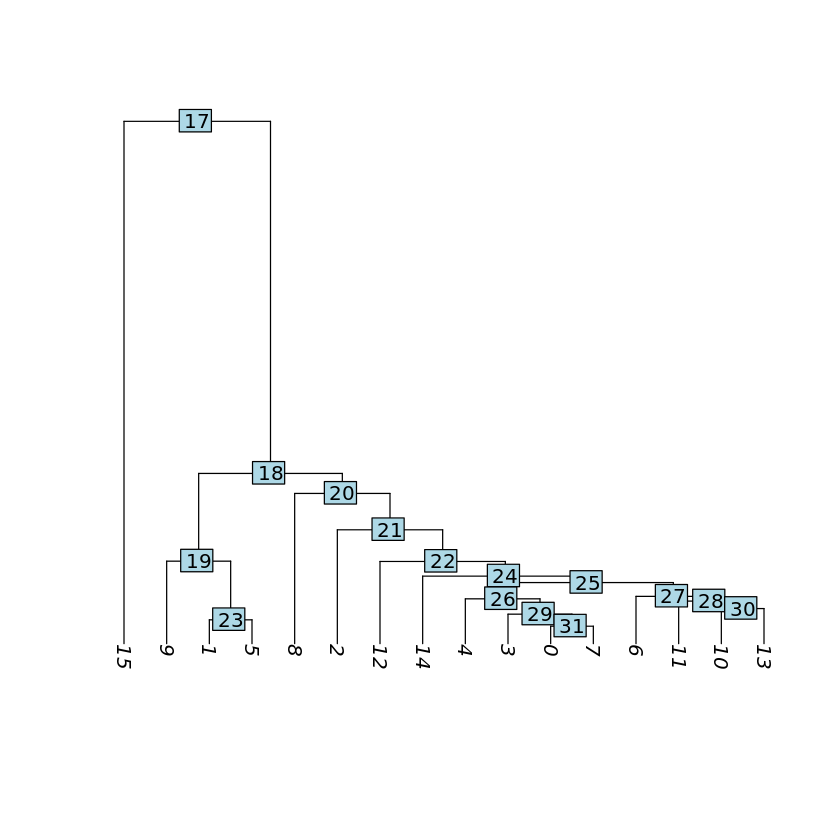

In [69]:
# Build a tree relating the average cell from each cluster. Estimated based on a distance matrix constructed in gene expression space
cells <- BuildClusterTree(cells,
                          do.reorder = FALSE,
                          reorder.numeric = FALSE,
                          do.plot = TRUE)

### Combine clusters (if necessary) and redo conserved markers lists

In [ ]:
#current.cluster.ids <- c(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13)
#new.cluster.ids <- c(0, 1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12)
#combined@ident <- plyr::mapvalues(x = combined@ident, from = current.cluster.ids, to = new.cluster.ids)

In [ ]:
#TSNEPlot(object = combined, do.label = TRUE, pt.size = 0.5)

In [ ]:
# After combining originally named clusters 1 and 2
#combined <- BuildClusterTree(combined,
#                             do.reorder = FALSE,
#                             reorder.numeric = FALSE,
#                             do.plot = TRUE)

In [ ]:
# Enter new nclust and redo conserved markers lists
#n_clust <- c(0:12)
#for (i in n_clust){
#    name <- paste("cluster", i, ".markers", sep = "")
#    name <- FindConservedMarkers(combined, ident.1 = i, grouping.var = "condition", print.bar = FALSE)
#    write.csv(name, file = paste(comp, "cluster", i, "Conserved_Markers_Adjusted.csv", sep = "_"), quote = FALSE, row.names = TRUE)
#}

# Look for MSC transcription profiles defined by select publications
* Gene Expression Profile of Human Bone Marrow Stromal Cells: High-Throughput Expressed Sequence Tag Sequencing Analysis. [Jia et al. 2002](https://www.sciencedirect.com/science/article/pii/S0888754301966832?via%3Dihub) 
* The Profile of Gene Expression of Human Marrow Mesenchymal Stem Cells. [Silva et al. 2003](https://doi.org/10.1634/stemcells.21-6-661)
* Minimal criteria for defining multipotent mesenchymal stromal cells. The International Society for Cellular Therapy position statement. [Dominici et al. 2006](https://www.ncbi.nlm.nih.gov/pubmed/16923606)
* Human Primary Bone Marrow Mesenchymal Stromal Cells and Their in vitro Progenies Display Distinct Transcriptional Profile Signatures. [Ghazanfari et al. 2017](https://www.nature.com/articles/s41598-017-09449-x)

## Jia et al. definition

In [70]:
jia <- c("FN1", "COL1A2", "COL1A1", "SPARC", "EEF1A1", "ACTG1", "ACTB", "TAGLN", "FTH1") 
jia2 <- c("ANXA2", "CTGF", "TGFBI", "VIM", "IGFBP4", "RPLP0", "DCN", "COL3A1", "CALU") 
jia3 <- c("TIMP1", "THBS1", "FTL", "COL5A2")
# not found: K-ALPHA-1, PAI1,
# changed ANX2 -> ANXA2

In [27]:
jia_all <- c("FN1", "COL1A2", "COL1A1", "SPARC", "EEF1A1", "ACTG1", "ACTB", "TAGLN", "FTH1", 
             "ANXA2", "CTGF", "TGFBI", "VIM", "IGFBP4", "RPLP0", "DCN", "COL3A1", "CALU",
             "TIMP1", "THBS1", "FTL", "COL5A2", "SERPINE1", "TUBA1A") 

In [28]:
jia_all.exp <- cells@data[jia_all, ]
dim(jia_all.exp)
jia_all.exp_zeros <- colSums(jia_all.exp == 0)

[1]    24 12279

In [29]:
length(which(jia_all.exp_zeros == 0))

[1] 1738

In [6]:
length(which(jia_all.exp_zeros <= 1))

[1] 2621

In [30]:
jia_all.expgenes <- which(jia_all.exp_zeros == 0)

In [31]:
cells@meta.data$Jia <- rep("no", nrow(cells@meta.data))
cells@meta.data[jia_all.expgenes,]$Jia <- rep("yes", length(jia_all.expgenes))
#cells@meta.data[jia_all.expgenes,] <- rep("yes", length(jia_all.expgenes))
table(cells@meta.data$Jia)


   no   yes 
10541  1738 

In [32]:
table(cells@meta.data[jia_all.expgenes,]$library_id)


JTW01 
 1738 

In [33]:
table(cells@meta.data$library_id)


JTW01 JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG01  MG02  MG03 
 2978   780  1759  1016   676   563  1166  1112  1294   935 

In [85]:
pjia <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Jia", pt.size = 0.05, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue"), no.legend = TRUE) #+ ggtitle("Cells expressing all 22 Jia et al. genes") 
tiff(filename = "20190207_Figures/Fig1_Jia.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(pjia)
dev.off()

png 
  2

In [64]:
# Adapted from user leonfodoulian https://github.com/satijalab/seurat/issues/528
# Get mean expression of genes of interest per cell
mean.exp <- colMeans(x = cells@data[jia_all, ], na.rm = TRUE)

# Add mean expression values in 'object@meta.data$gene.set.score'
if (all(names(x = mean.exp) == rownames(x = cells@meta.data))) {
  cat("Cell names order match in 'mean.exp' and 'object@meta.data':\n", 
      "adding gene set mean expression values in 'object@meta.data$gene.set.score'")
  cells@meta.data$'Jia et al. Positive Markers' <- mean.exp
}

Cell names order match in 'mean.exp' and 'object@meta.data':
 adding gene set mean expression values in 'object@meta.data$gene.set.score'

In [67]:
png(filename = "Jia_Pos_allcells.png",
    width = 1500, height = 1500, units = "px", res = 300)
FeaturePlot(object = cells, features.plot = "Jia et al. Positive Markers", 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
dev.off()

png 
  2

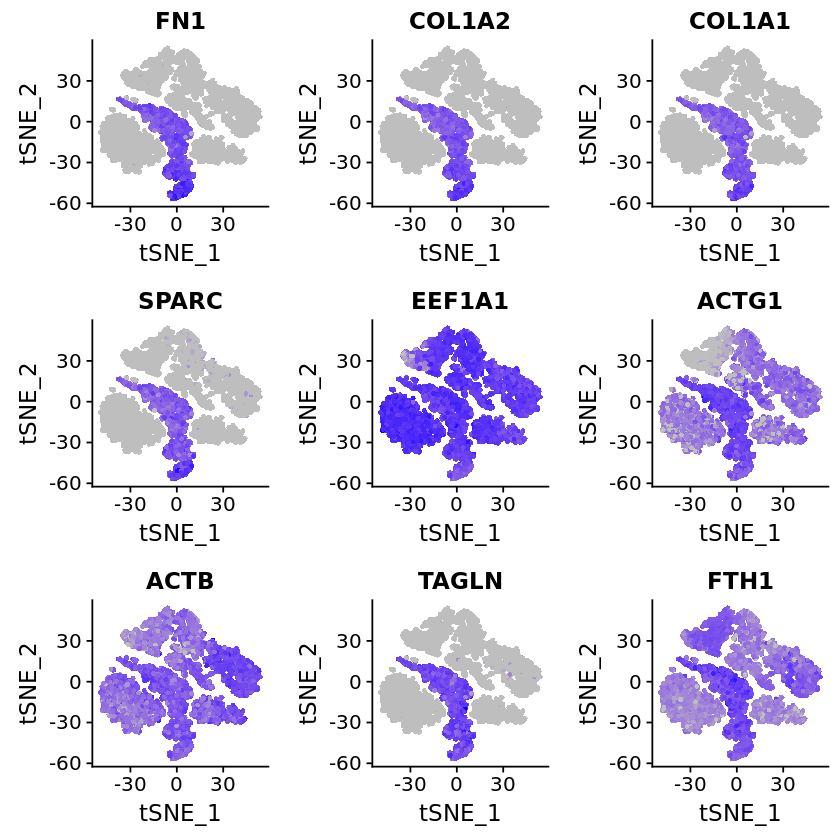

In [71]:
FeaturePlot(object = cells, features.plot = jia, cols.use = c("grey", "blue"), reduction.use = "tsne")

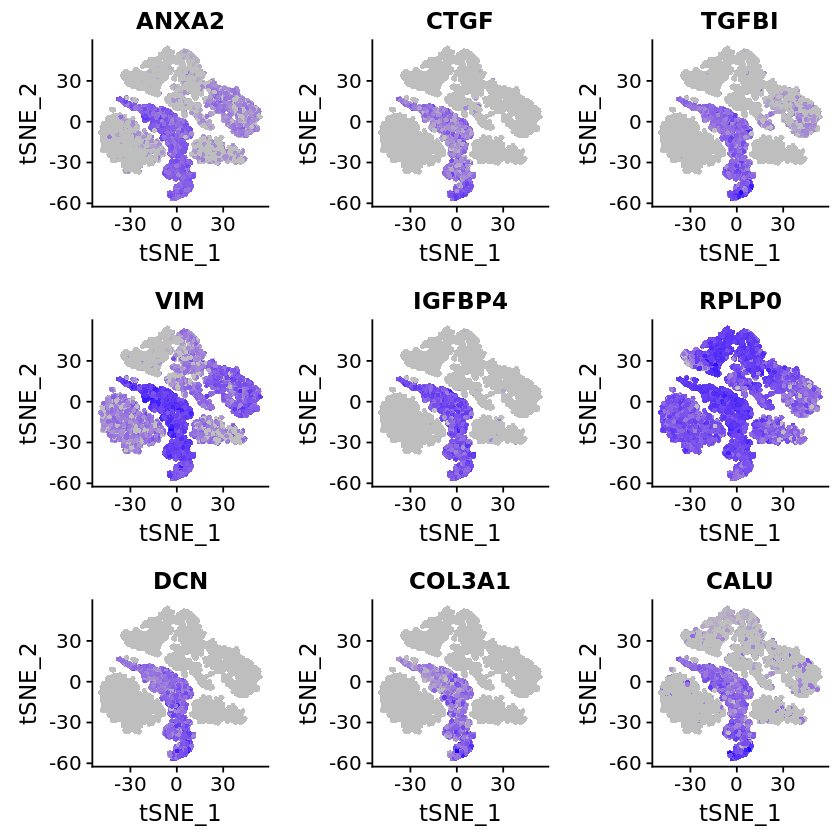

In [72]:
FeaturePlot(object = cells, features.plot = jia2, cols.use = c("grey", "blue"), reduction.use = "tsne")

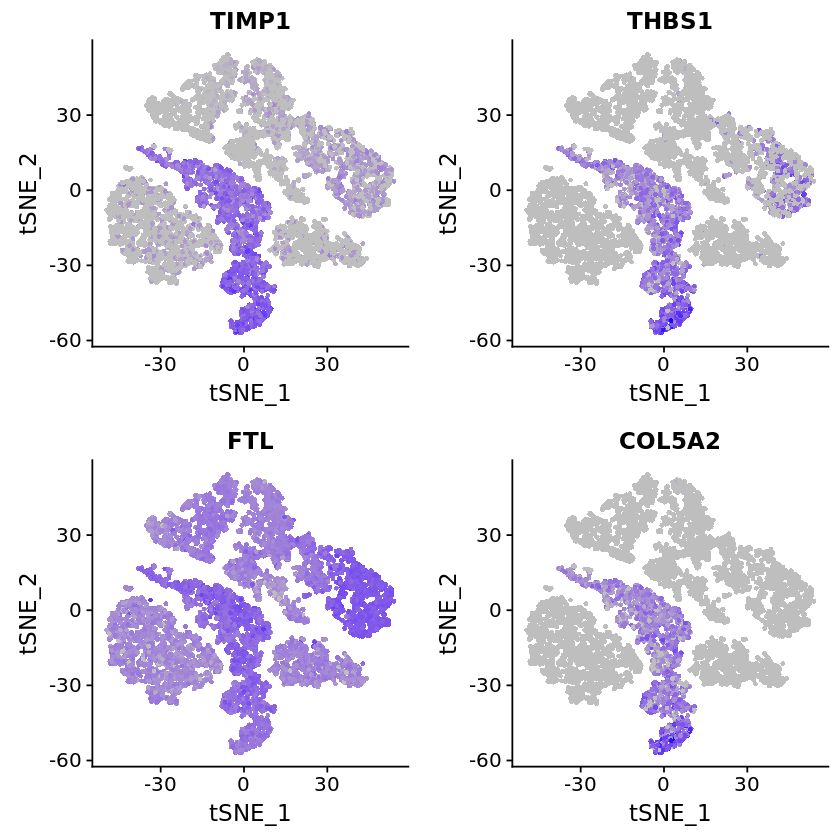

In [73]:
FeaturePlot(object = cells, features.plot = jia3, cols.use = c("grey", "blue"), reduction.use = "tsne")

## Silva et al. defintion
From Table 3 of the publication, "Exclusively or highly represented in MSC1: collagens type I and type VI, SPARC, matrix metalloproteinase 2 (gelatinase), transforming growth factor β1 induced, eukaryotic translation elongation factor 1 alpha 1, fibronectin 1, light peptide 9 of myosin, transgelin, calgranulin A, heat shock protein 47, latent transforming growth factor β binding protein 2, gap junction protein alpha 1, biglycan, annexin A2, IGF binding proteins 4 and 6, hemeoxygenase 1, tropomyosin 2, connective growth factor, brain abundant membrane attached signal protein 1, galectin 1, nexin, integrins alpha 2 and alpha V, endocytic receptor, CD151 antigen." Silva et al. also noted, "tags for these transcripts were at least 50 times more abundant in the MSC as compared with CD34."

In [74]:
silva <- c("COL1A1", "COL4A1", "SPARC", "MMP2", "TGFB1", "EEF1A1", "FN1", "MYL9", "TAGLN")
silva2 <- c("LTBP2", "GJA1", "BGN", "ANXA2", "IGFBP4", "IGFBP6", "HMOX1", "TPM2", "CTGF") 
silva3 <- c("LGALS1", "SNX1", "ITGA2", "ITGA5", "CD151")
# not found: ANX2, CAL1H
# From https://www.genecards.org/cgi-bin/carddisp.pl?gene=ANXA2 - previous HGNC symbols for ANXA2: ANX2, CAL1H

In [36]:
silva_all <- c("COL1A1", "COL4A1", "SPARC", "MMP2", "TGFB1", "EEF1A1", "FN1", "MYL9", "TAGLN",
               "LTBP2", "GJA1", "BGN", "ANXA2", "IGFBP4", "IGFBP6", "HMOX1", "TPM2", "CTGF", 
               "LGALS1", "SNX1", "ITGA2", "ITGA5", "CD151")

In [69]:
# Adapted from user leonfodoulian https://github.com/satijalab/seurat/issues/528
# Get mean expression of genes of interest per cell
mean.exp <- colMeans(x = cells@data[silva_all, ], na.rm = TRUE)

# Add mean expression values in 'object@meta.data$gene.set.score'
if (all(names(x = mean.exp) == rownames(x = cells@meta.data))) {
  cat("Cell names order match in 'mean.exp' and 'object@meta.data':\n", 
      "adding gene set mean expression values in 'object@meta.data$gene.set.score'")
  cells@meta.data$'Silva et al. Positive Markers' <- mean.exp
}

Cell names order match in 'mean.exp' and 'object@meta.data':
 adding gene set mean expression values in 'object@meta.data$gene.set.score'

In [71]:
png(filename = "Silva_Pos_allcells.png",
    width = 1500, height = 1500, units = "px", res = 300)
FeaturePlot(object = cells, features.plot = "Silva et al. Positive Markers", 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
dev.off()

png 
  2

In [108]:
length(silva_all)

[1] 23

In [37]:
silva_all.exp <- cells@data[silva_all, ]
dim(silva_all.exp)
silva_all.exp_zeros <- colSums(silva_all.exp == 0)
silva_all.expgenes <- which(silva_all.exp_zeros == 0)

[1]    23 12279

In [38]:
cells@meta.data$Silva <- rep("no", nrow(cells@meta.data))
cells@meta.data[silva_all.expgenes,]$Silva <- rep("yes", length(silva_all.expgenes))
table(cells@meta.data$Silva)


   no   yes 
12258    21 

In [16]:
table(cells@meta.data[silva_all.expgenes,]$library_id)


JTW01 
   21 

In [77]:
psilva <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Silva", pt.size = 0.05, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue"), no.legend = TRUE) #+ ggtitle("Cells expressing all 23 Silva et al. genes") 
tiff(filename = "20190207_Figures/Fig1_23Silva.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(psilva)
dev.off()

png 
  2

In [40]:
silva_all.expgenes78 <- which(silva_all.exp_zeros <= 2)

In [41]:
cells@meta.data$Silva78 <- rep("no", nrow(cells@meta.data))
cells@meta.data[silva_all.expgenes78,]$Silva78 <- rep("yes", length(silva_all.expgenes78))
table(cells@meta.data$Silva78)


   no   yes 
11151  1128 

In [42]:
table(cells@meta.data[silva_all.expgenes78,]$library_id)


JTW01 
 1128 

In [22]:
21/23

[1] 0.9130435

In [70]:
?DimPlot

In [74]:
psilva78 <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Silva78", pt.size = 0.05, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue"), no.legend = TRUE) #+ ggtitle("Cells expressing at least 91% (21/23) of Silva et al. genes")
#psilva78 <- psilva78 + theme(plot.title = element_text(size = 10))
tiff(filename = "20190207_Figures/Fig1_21Silva.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(psilva78)
dev.off()

png 
  2

In [27]:
hsc_all <- c("THY1", "CD34")
hsc_all.exp <- cells@data[hsc_all, ]
dim(hsc_all.exp)
hsc_all.exp_zeros <- colSums(hsc_all.exp == 0)
hsc_all.expgenes <- which(hsc_all.exp_zeros == 0)

[1]     2 12279

In [29]:
cells@meta.data$Hsc <- rep("no", nrow(cells@meta.data))
cells@meta.data[hsc_all.expgenes,]$Hsc <- rep("yes", length(hsc_all.expgenes))
table(cells@meta.data$Hsc)


   no   yes 
12267    12 

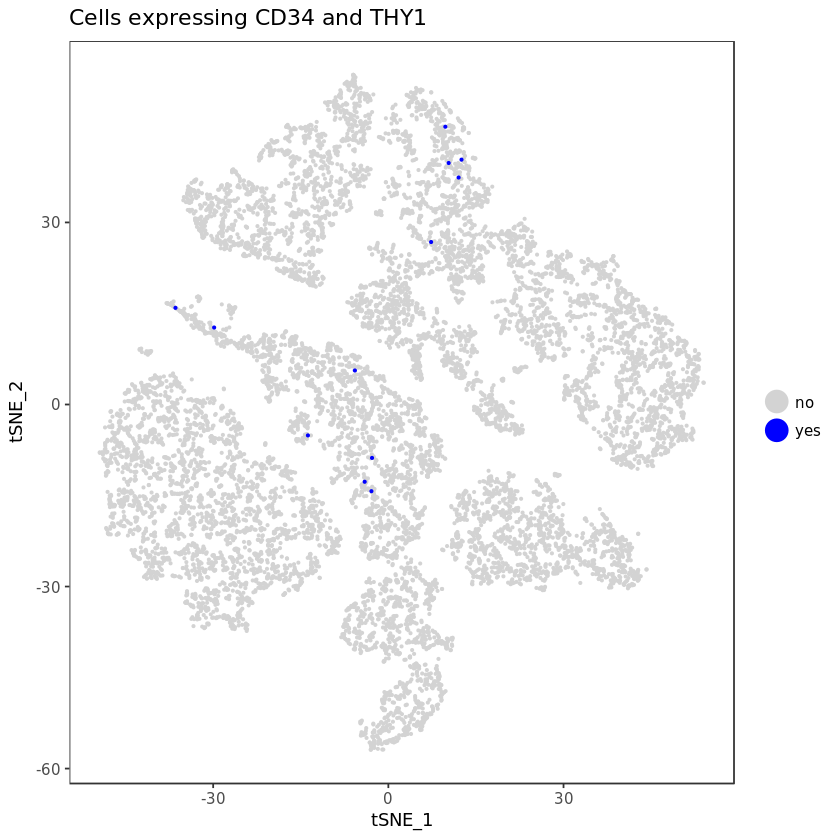

In [32]:
DimPlot(object = cells, reduction.use = "tsne", group.by = "Hsc", pt.size = 0.5, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue")) + ggtitle("Cells expressing CD34 and THY1")

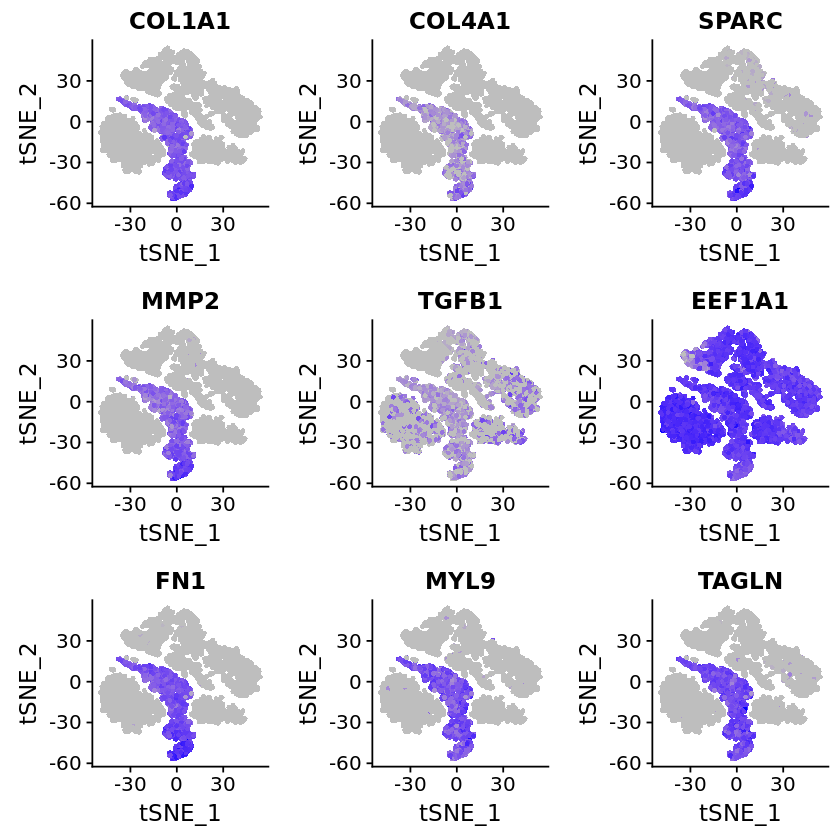

In [75]:
FeaturePlot(object = cells, features.plot = silva, cols.use = c("grey", "blue"), reduction.use = "tsne")

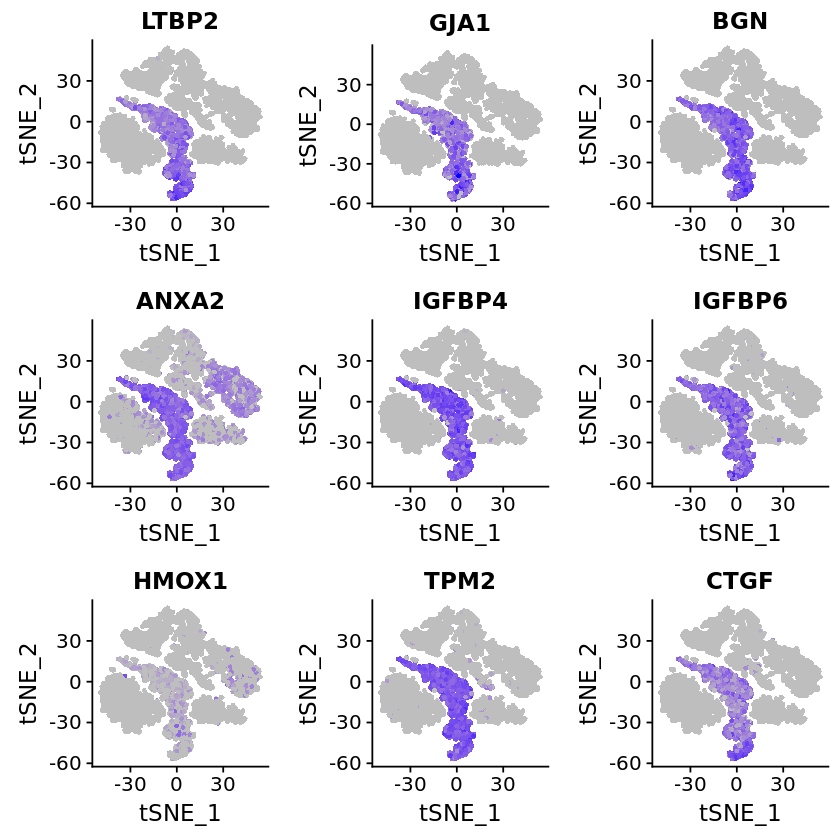

In [76]:
FeaturePlot(object = cells, features.plot = silva2, cols.use = c("grey", "blue"), reduction.use = "tsne")

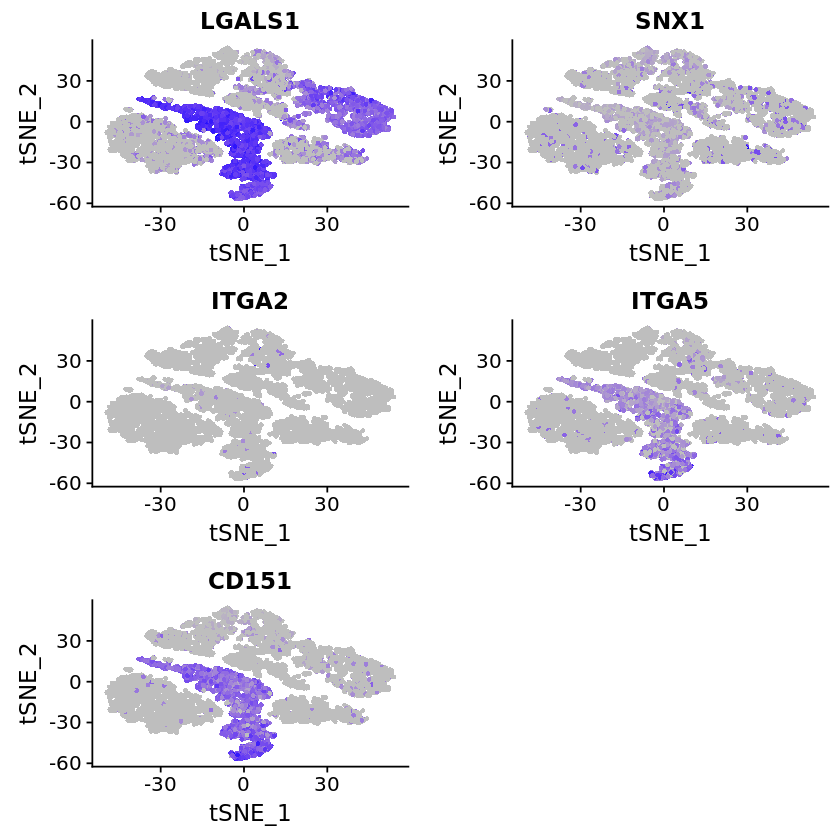

In [77]:
FeaturePlot(object = cells, features.plot = silva3, cols.use = c("grey", "blue"), reduction.use = "tsne")

## Dominici et al. definition
"First, MSC must be plastic-adherent when maintained in standard culture conditions. Second, MSC must express CD105, CD73 and CD90, and lack expression of CD45, CD34, CD14 or CD11b, CD79alpha or CD19 and HLA-DR surface molecules. Third, MSC must differentiate to osteoblasts, adipocytes and chondroblasts in vitro. While these criteria will probably require modification as new knowledge unfolds, we believe this minimal set of standard criteria will foster a more uniform characterization of MSC and facilitate the exchange of data among investigators."
* We can test the first two criteria given the data

In [62]:
dominici_pos <- c("ENG", "NT5E", "THY1") 
dominici_neg <- c("PTPRC", "CD34", "CD14", "CD79A", "CD19", "HLA-DRA")#, "HLA-DRB1", "HLA-DRB5")
# CD105 -> ENG
# CD73 -> NT5E
# CD90 -> THY1
# CD45 -> PTPRC
# Note: CD11B not found

In [55]:
# Adapted from user leonfodoulian https://github.com/satijalab/seurat/issues/528
# Get mean expression of genes of interest per cell
mean.exp <- colMeans(x = cells@data[dominici_pos, ], na.rm = TRUE)

# Add mean expression values in 'object@meta.data$gene.set.score'
if (all(names(x = mean.exp) == rownames(x = cells@meta.data))) {
  cat("Cell names order match in 'mean.exp' and 'object@meta.data':\n", 
      "adding gene set mean expression values in 'object@meta.data$gene.set.score'")
  cells@meta.data$'Dominici et al. Positive Markers' <- mean.exp
}

Cell names order match in 'mean.exp' and 'object@meta.data':
 adding gene set mean expression values in 'object@meta.data$gene.set.score'

In [60]:
# Plot mean expression using Seurat::FeaturePlot()
png(filename = "Dominici_Pos_allcells.png",
    width = 1500, height = 1500, units = "px", res = 300)
FeaturePlot(object = cells, features.plot = "Dominici et al. Positive Markers", 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
dev.off()

png 
  2

In [57]:
# Adapted from user leonfodoulian https://github.com/satijalab/seurat/issues/528

# Get mean expression of genes of interest per cell
mean.exp <- colMeans(x = cells@data[dominici_neg, ], na.rm = TRUE)

# Add mean expression values in 'object@meta.data$gene.set.score'
if (all(names(x = mean.exp) == rownames(x = cells@meta.data))) {
  cat("Cell names order match in 'mean.exp' and 'object@meta.data':\n", 
      "adding gene set mean expression values in 'object@meta.data$gene.set.score'")
  cells@meta.data$'Dominici et al. Negative Markers' <- mean.exp
}

Cell names order match in 'mean.exp' and 'object@meta.data':
 adding gene set mean expression values in 'object@meta.data$gene.set.score'

In [61]:
png(filename = "Dominici_Neg_allcells.png",
    width = 1500, height = 1500, units = "px", res = 300)
FeaturePlot(object = cells, features.plot = "Dominici et al. Negative Markers", 
                            cols.use = c("grey", "blue"), reduction.use = "tsne")
dev.off()

png 
  2

In [63]:
dominici_pos.exp <- cells@data[dominici_pos, ]
dim(dominici_pos.exp)
dominici_pos.exp_zeros <- colSums(dominici_pos.exp == 0)
dominici_pos.expgenes <- which(dominici_pos.exp_zeros == 0)

[1]     3 12279

In [64]:
dominici_neg.exp <- cells@data[dominici_neg, ]
dim(dominici_neg.exp)
dominici_neg.exp_zeros <- colSums(dominici_neg.exp == 0)
dominici_neg.expgenes <- which(dominici_neg.exp_zeros == length(dominici_neg))

[1]     6 12279

In [65]:
dominici_match <- intersect(dominici_pos.expgenes, dominici_neg.expgenes)

In [16]:
cells@meta.data$Dominici <- rep("no", nrow(cells@meta.data))
cells@meta.data[dominici_match,]$Dominici <- rep("yes", length(dominici_match))
table(cells@meta.data$Dominici)


   no   yes 
10925  1354 

In [17]:
table(cells@meta.data[dominici_match,]$library_id)


JTW01 
 1354 

In [66]:
table(cells@meta.data$library_id)


JTW01 JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG01  MG02  MG03 
 2978   780  1759  1016   676   563  1166  1112  1294   935 

In [81]:
pdominici <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Dominici", pt.size = 0.05, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue"), no.legend = TRUE)# + ggtitle("Cells matching Dominici et al. MSC profile") 
tiff(filename = "20190207_Figures/Fig1_Dominici.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(pdominici)
dev.off()

png 
  2

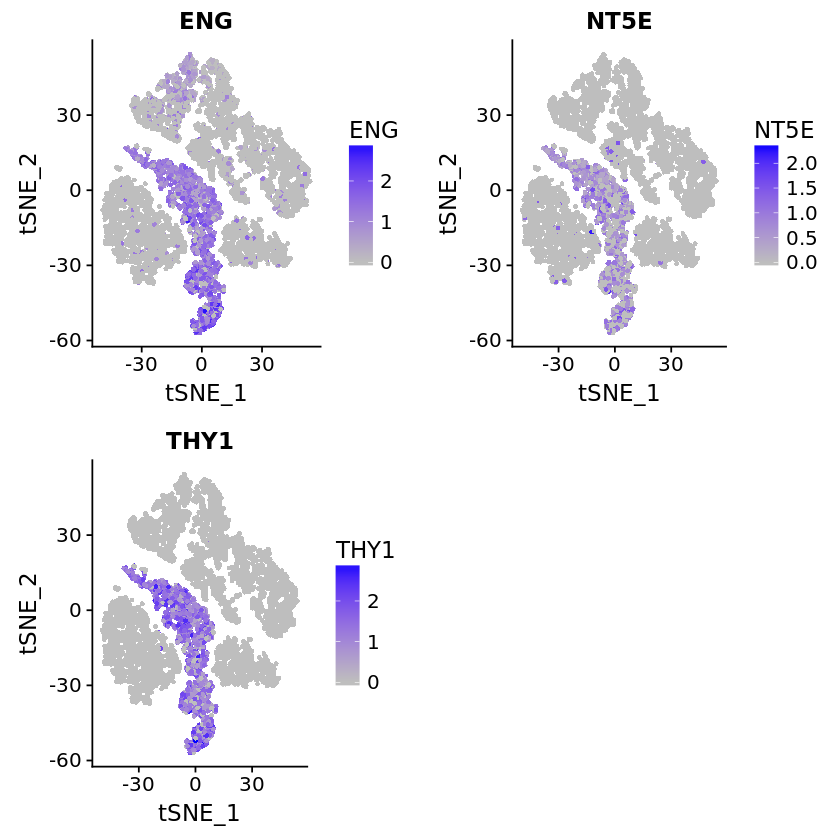

In [79]:
FeaturePlot(object = cells, features.plot = dominici_pos, cols.use = c("grey", "blue"), reduction.use = "tsne",
            no.legend = FALSE)

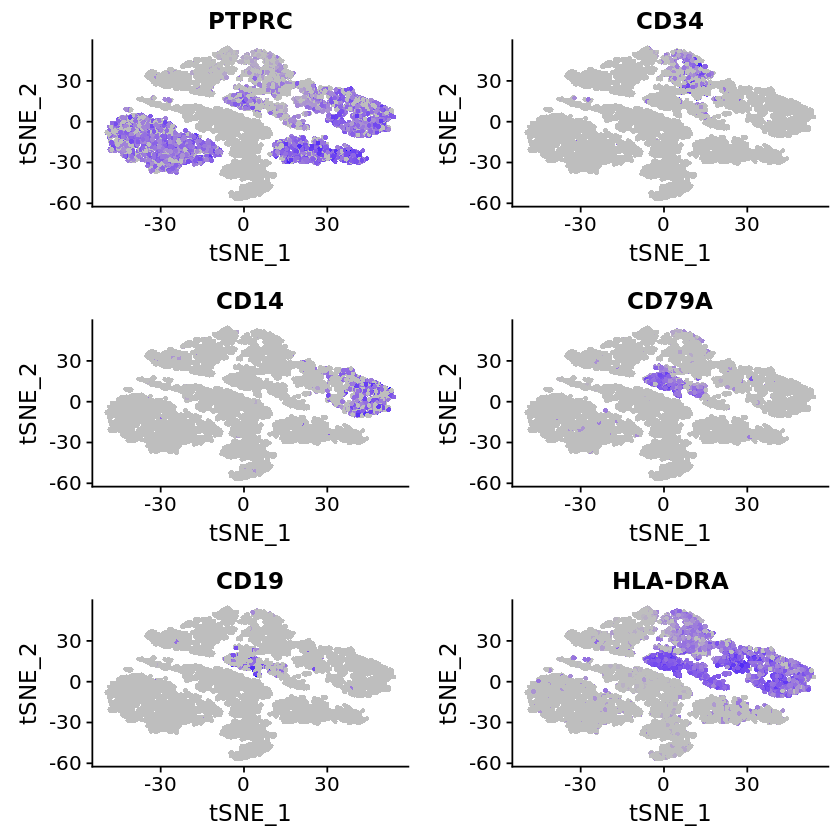

In [80]:
FeaturePlot(object = cells, features.plot = dominici_neg, cols.use = c("grey", "blue"), reduction.use = "tsne")

## Ghazanfari et al. definition
Surface marker profile: "lin−/CD45−/CD31−/CD71−/CD235−/CD271+"

Conventional markers: "Identification and characterization of primary BM-MSCs has conventionally relied on prospective isolation usually by a combination of two or more surface markers. Reported markers for primary BM-MSCs include CD271 (LNGFR)6, CD106 (VCAM-1) and STRO-17, CD146 (MCAM)8, CD90 (THY-1)9, CD105 (Endoglin)10, frizzled-9 and SSEA-411, CD51 (ITGaV)12, CD140a (PDGFRa)12, SUSD2 (W5C5)13, MSCA-114, CD230 (PrP)15 and LEPR16."

Shared markers between primary and sphere cultured MSCs (clusters 3 and 5): "Among the 16 different clusters, numbers 3 and 5 showed similar gene expression levels in primary and sphere cultured cells, while they were clearly different in the adherent cultured cells. Thus, these clusters are likely to contain possible candidate genes that are involved in maintaining BM-MSC stem cell properties in sphere cultures, e.g. in vivo self-renewal capacity. Therefore, these clusters were chosen for a more detailed analysis." - Lists of genes found in Supplementary Table S1

### Ghazanfari et al. surface marker profile

In [20]:
# Look for all negative except CD271
ghaz_surface <- c("PTPRC", "PECAM1", "TFRC", "GYPA", "NGFR")
# LIN not found
# CD45 -> PTPRC
# CD31 -> PECAM1
# CD71 -> TFRC
# CD235a -> GYPA
# CD271 -> NGFR

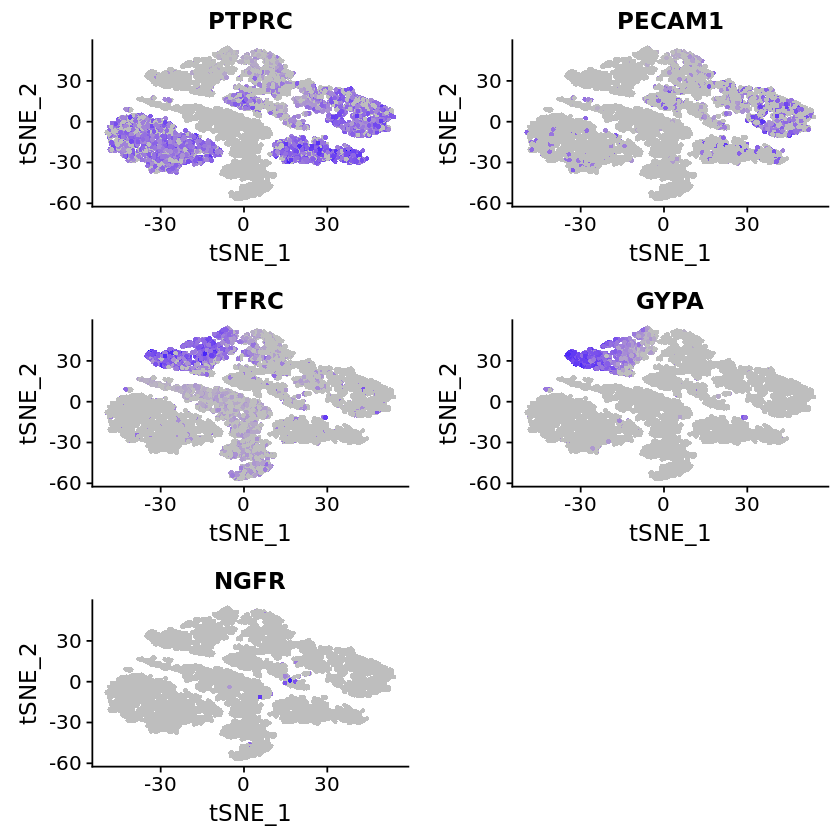

In [308]:
FeaturePlot(object = cells, features.plot = ghaz_surface, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [21]:
ghaz_surf_pos <- c("NGFR")
ghaz_surf_neg <- c("PTPRC", "PECAM1", "TFRC", "GYPA")

In [22]:
ghaz_surf_pos.exp <- cells@data[ghaz_surf_pos, ]
#dim(ghaz_surf_pos.exp)
#ghaz_surf_pos.exp_zeros <- colSums(ghaz_surf_pos.exp == 0)
ghaz_surf_pos.expgenes <- which(ghaz_surf_pos.exp != 0)

In [36]:
head(ghaz_surf_pos.exp)

AAACCTGAGAAACCAT-1 AAACCTGAGCGATTCT-1 AAACCTGCACAAGCCC-1 AAACCTGCAGATGAGC-1 
                 0                  0                  0                  0 
AAACCTGGTGCGCTTG-1 AAACCTGTCACCACCT-1 
                 0                  0

In [23]:
ghaz_surf_neg.exp <- cells@data[ghaz_surf_neg, ]
dim(ghaz_surf_neg.exp)
ghaz_surf_neg.exp_zeros <- colSums(ghaz_surf_neg.exp == 0)
ghaz_surf_neg.expgenes <- which(ghaz_surf_neg.exp_zeros == length(ghaz_surf_neg))

[1]     4 12279

In [24]:
ghaz_surf_match <- intersect(ghaz_surf_pos.expgenes, ghaz_surf_neg.expgenes)

In [25]:
cells@meta.data$Ghaz_surf <- rep("no", nrow(cells@meta.data))
cells@meta.data[ghaz_surf_match,]$Ghaz_surf <- rep("yes", length(ghaz_surf_match))
table(cells@meta.data$Ghaz_surf)


   no   yes 
12256    23 

In [40]:
table(cells@meta.data[ghaz_surf_match,]$library_id)


JTW01 JTW05 JTW06 JTW10 
   14     2     4     3 

In [67]:
table(cells@meta.data$library_id)


JTW01 JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG01  MG02  MG03 
 2978   780  1759  1016   676   563  1166  1112  1294   935 

In [68]:
780+1759+1016+676+563+1166+1112+1294+935

[1] 9301

In [83]:
pghaz_surf <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Ghaz_surf", pt.size = 0.05, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue"), no.legend = TRUE) #+ ggtitle("Cells matching Ghazanfari et al. MSC surface marker profile") 
tiff(filename = "20190207_Figures/Fig1_Ghaz_surface.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(pghaz_surf)
dev.off()

png 
  2

### Ghazanfari et al. conventional MSC markers (citing a couple other publications)

In [83]:
ghaz_con_all <- c("NGFR", "VCAM1", "MCAM", "THY1", "ENG", "FZD9", "ITGAV", "PDGFRA", "SUSD2", "ALPL", "PRNP", "LEPR")
# CD271 and LNGFR -> NGFR
# STRO1/STRO-1 not found
# SSEA4/SSEA-4 not found
# CD51 -> ITGAV
# MSCA-1 -> ALPL
# CD230 -> PRNP

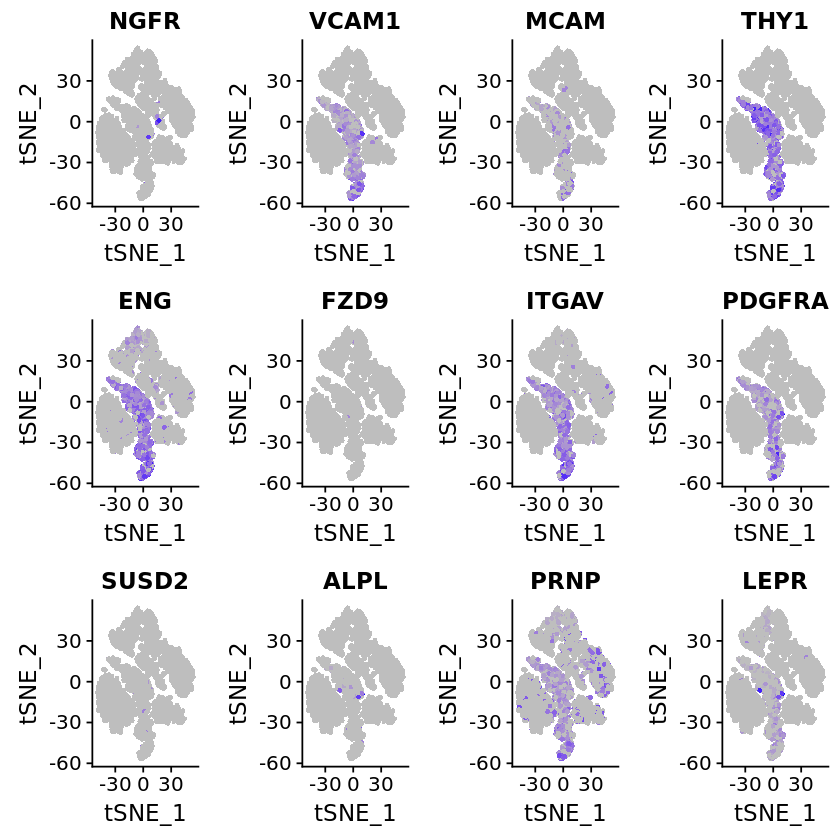

In [84]:
FeaturePlot(object = cells, features.plot = ghaz_con_all, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [166]:
ghaz_con_all.exp <- cells@data[ghaz_con_all, ]
dim(ghaz_con_all.exp)
ghaz_con_all.exp_zeros <- colSums(ghaz_con_all.exp == 0)
ghaz_con_all.expgenes <- which(ghaz_con_all.exp_zeros == 0)

[1]    12 12528

In [167]:
cells@meta.data$Ghaz_con <- rep("no", nrow(cells@meta.data))
cells@meta.data[ghaz_con_all.expgenes,]$Ghaz_con <- rep("yes", length(ghaz_con_all.expgenes))
table(cells@meta.data$Ghaz_con)
table(cells@meta.data[ghaz_con_all.expgenes,]$library_id)


   no 
12528 

< table of extent 0 >

In [170]:
ghaz_con_67.expgenes <- which(ghaz_con_all.exp_zeros <= 4)
cells@meta.data$Ghaz_con <- rep("no", nrow(cells@meta.data))
cells@meta.data[ghaz_con_67.expgenes,]$Ghaz_con <- rep("yes", length(ghaz_con_67.expgenes))
table(cells@meta.data$Ghaz_con)
table(cells@meta.data[ghaz_con_67.expgenes,]$library_id)


   no   yes 
12375   153 


JTW01 
  153 

In [174]:
pghaz_con <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Ghaz_con", pt.size = 0.5, do.return = TRUE,
        plot.order = "yes", cols.use = c("light grey", "blue")) + ggtitle("Cells expressing 67% (8/12) Ghazanfari et al. conventional primary BM-MSC markers")
pghaz_con <- pghaz_con + theme(plot.title = element_text(size = 6))
png(filename = "Ghaz_conventional67_binary_allcells.png",
    width = 1500, height = 1500, units = "px", res = 300)
plot(pghaz_con)
dev.off()

png 
  2

### Ghazanfari et al. cluster 3 expressed genes

In [85]:
ghaz_clust3 <- c("CTSC", "TNFRSF1B", "STOM", "APBB1IP", "HLA-E", "FOSB", "PSME1", "SLC7A2", "APOL3")
ghaz_clust3.2 <- c("ZFP36", "GLDN",  "AIM1", "HLA-DRB1", "PAIP2", "MRPS31", "PSAP", "BST2", "NUP88")
ghaz_clust3.3 <- c("LIPA", "EXOSC10", "CCDC130", "CSTF2", "TBP", "SNRNP40", "APOE", "HLA-B", "SDHA")
ghaz_clust3.4 <- c("HNRNPF", "CYBA", "HLA-F", "B2M", "PARP12", "HIST2H2AC", "NXF1", "ITM2B", "LARP4")
ghaz_clust3.5 <- c("PSMB9", "NUP62", "SLC44A1", "C1QTNF1", "OLFML2B", "IFI16", "DUSP1", "PSMB8", "HMGB3")
ghaz_clust3.6 <- c("PPT1", "EIF2B5", "FAU", "CITED4", "GTPBP6", "TMEM218", "EIF4A3", "PTPRA", "NOP58")
ghaz_clust3.7 <- c("FOS", "STK11IP", "NDRG1", "SERPING1", "EML3", "MFSD1", "RFX5", "HLX", "MAPKAPK2")
ghaz_clust3.8 <- c("PPM1G", "WDR86", "HACL1", "DPP4", "CD68", "SEPP1", "RGS2", "FAM96A", "MAPKAPK3") 
ghaz_clust3.9 <- c("C11orf73", "NAV2", "VCAM1", "SNRPB", "EGR1", "PCID2", "OAS2", "PSME2", "ALPL")
ghaz_clust3.10 <- c("GSDMD", "SLC15A3", "HLA-G", "PDGFRA", "PTK6", "ADD3", "PIM2", "S1PR3", "RHOBTB1")
ghaz_clust3.11 <- c("SMAP2", "CDH7", "CMTM7", "SUPT7L", "TMEM30A", "HIST2H2AA4", "GMDS", "CTSC", "GRWD1")
ghaz_clust3.12 <- c("C19orf48", "UNG", "TMEM69", "HSDL2", "PPARG", "PCCA", "RIBC1", "PTPN12", "DNAJA1")
# Not found: "HLA-DRB6", "ECGF1", "C7orf11", "HLA-H", "FLJ37786", "OR6C76", "HCP5", 
#            "DDX39", "C22orf9", "ARMET", "NPHS2", "ZC3H11B", "KCNJ3", "FLJ42842", 
#            "LINGO4", "UCHL5IP", "LITRK4", "TCEB3C", "MIR658", "FABP5L2", 

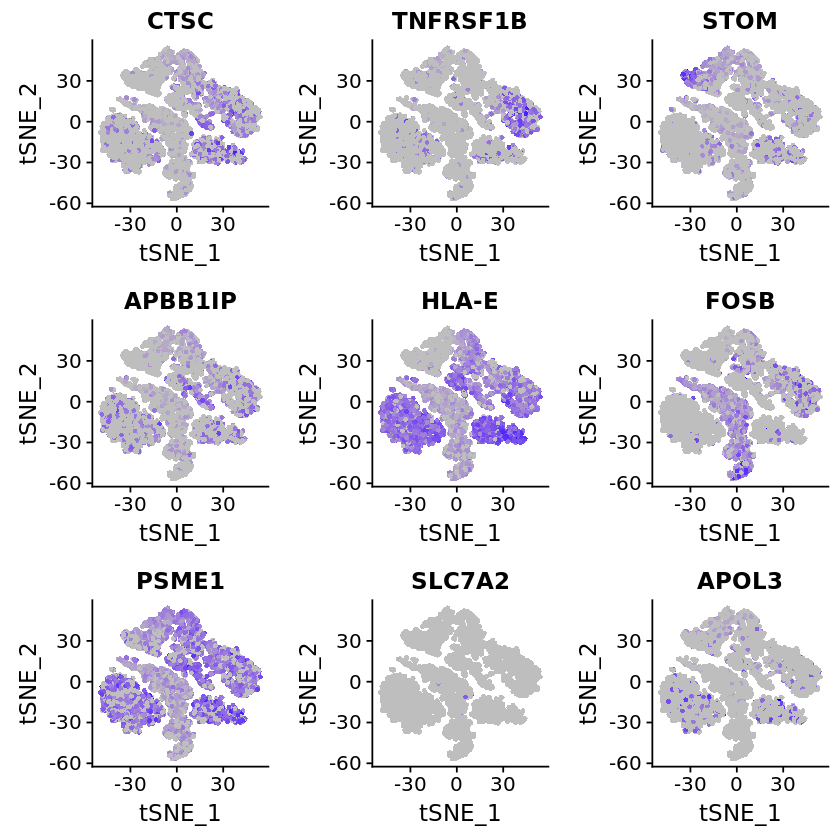

In [86]:
FeaturePlot(object = cells, features.plot = ghaz_clust3, cols.use = c("grey", "blue"), reduction.use = "tsne")

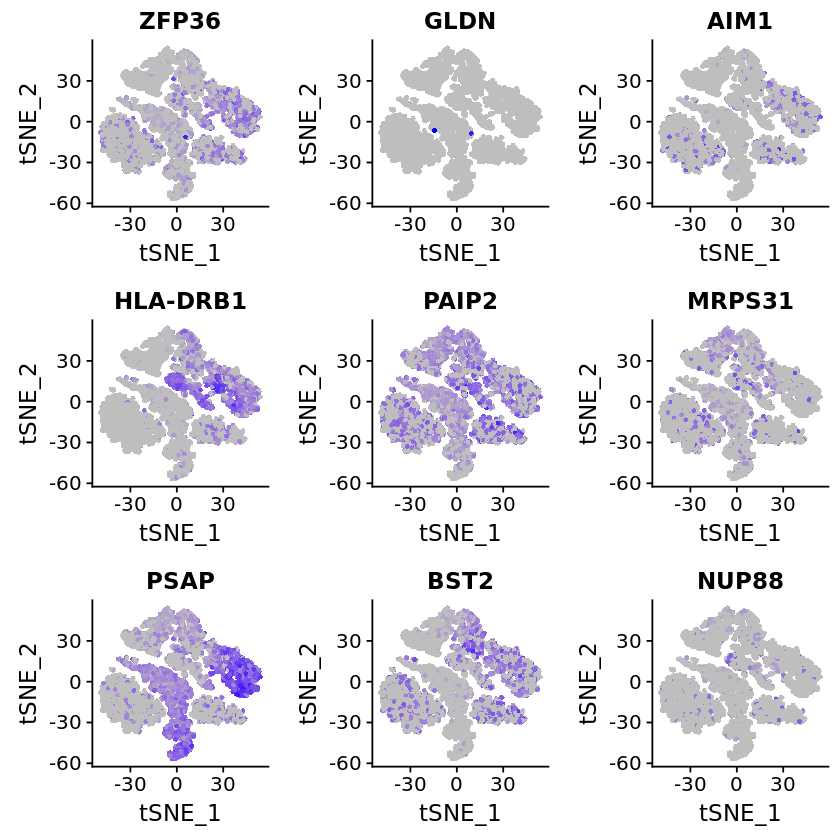

In [87]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.2, cols.use = c("grey", "blue"), reduction.use = "tsne")

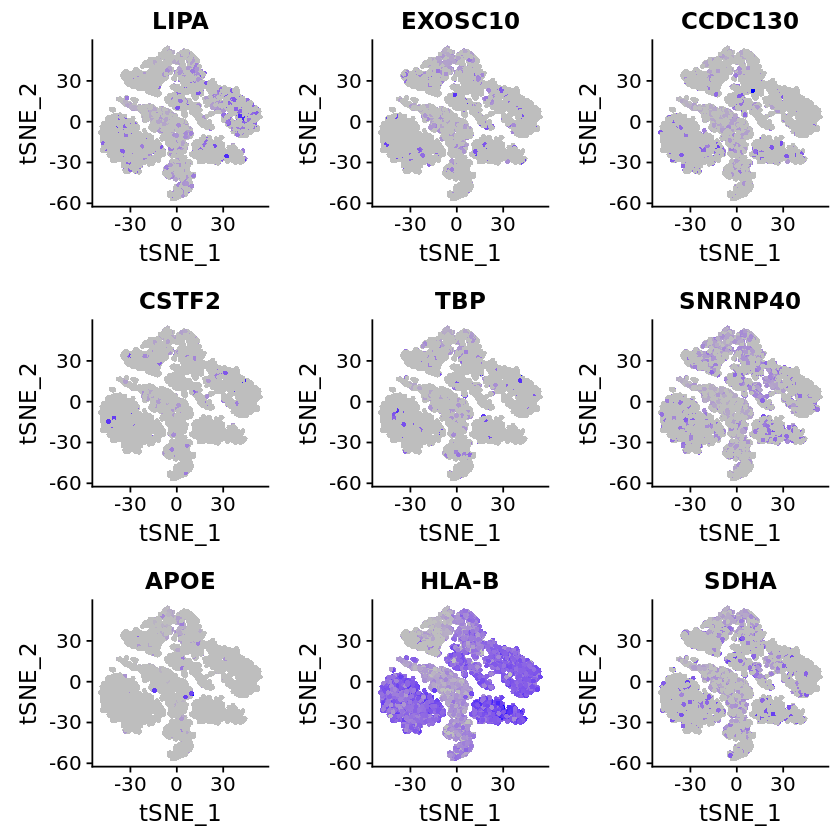

In [88]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.3, cols.use = c("grey", "blue"), reduction.use = "tsne")

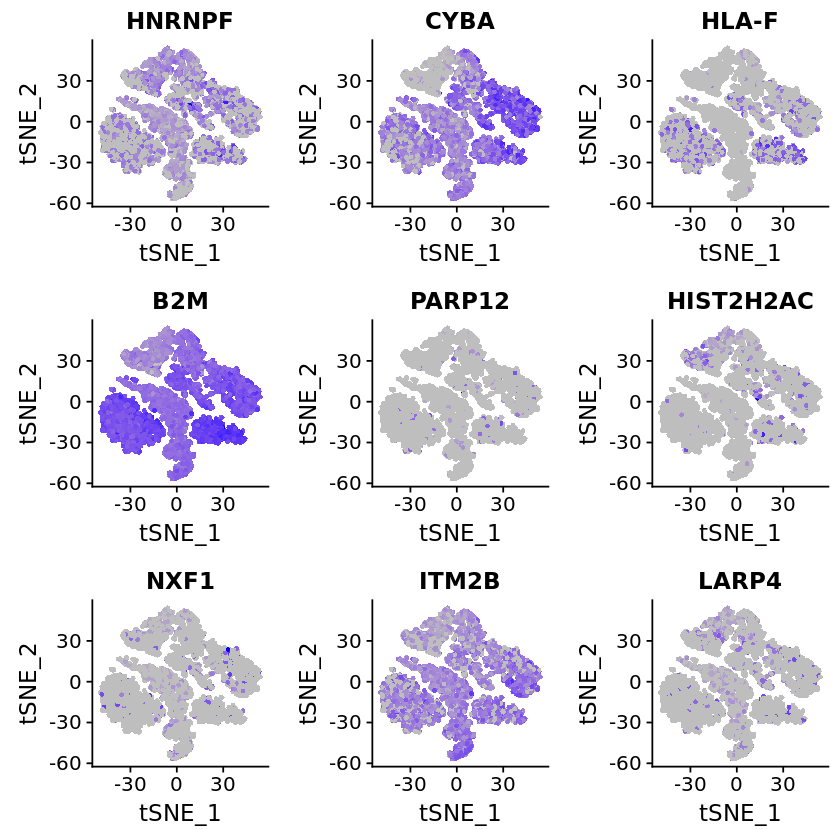

In [89]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.4, cols.use = c("grey", "blue"), reduction.use = "tsne")

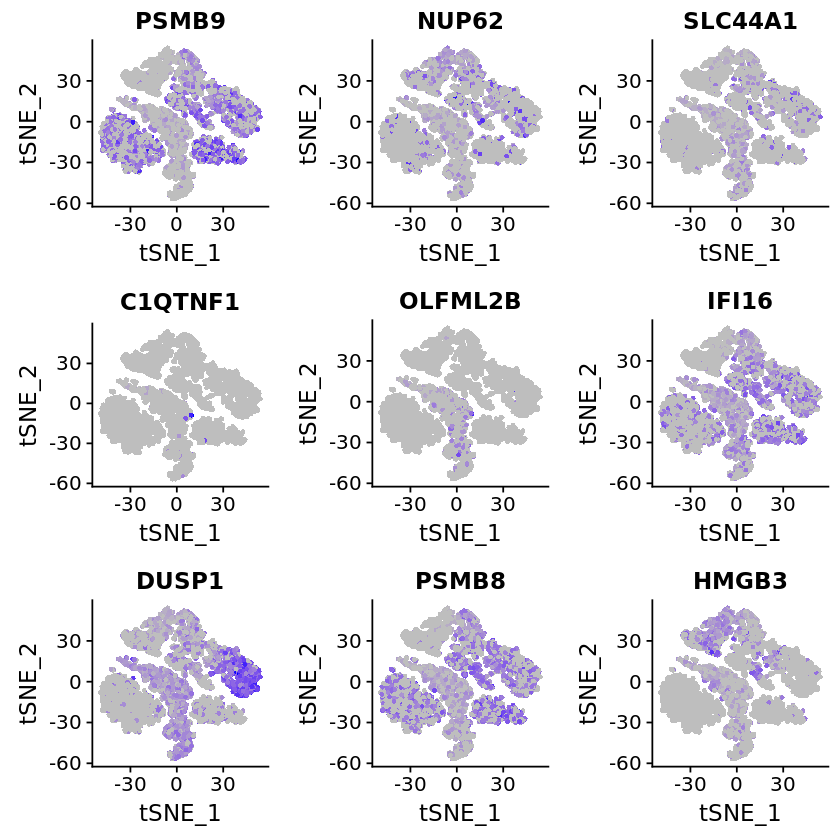

In [90]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.5, cols.use = c("grey", "blue"), reduction.use = "tsne")

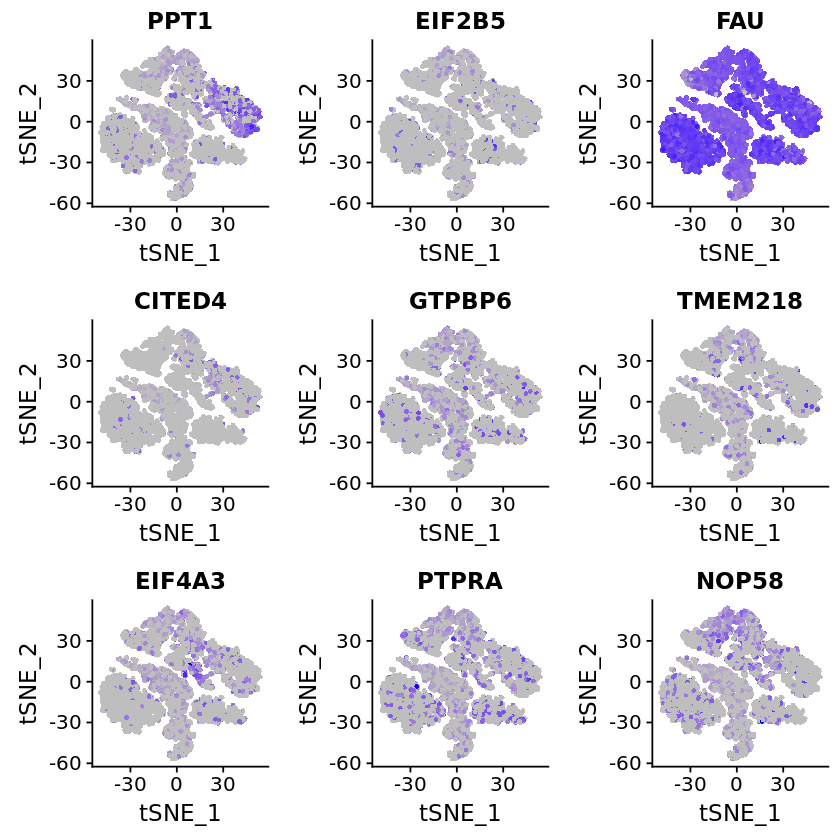

In [91]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.6, cols.use = c("grey", "blue"), reduction.use = "tsne")

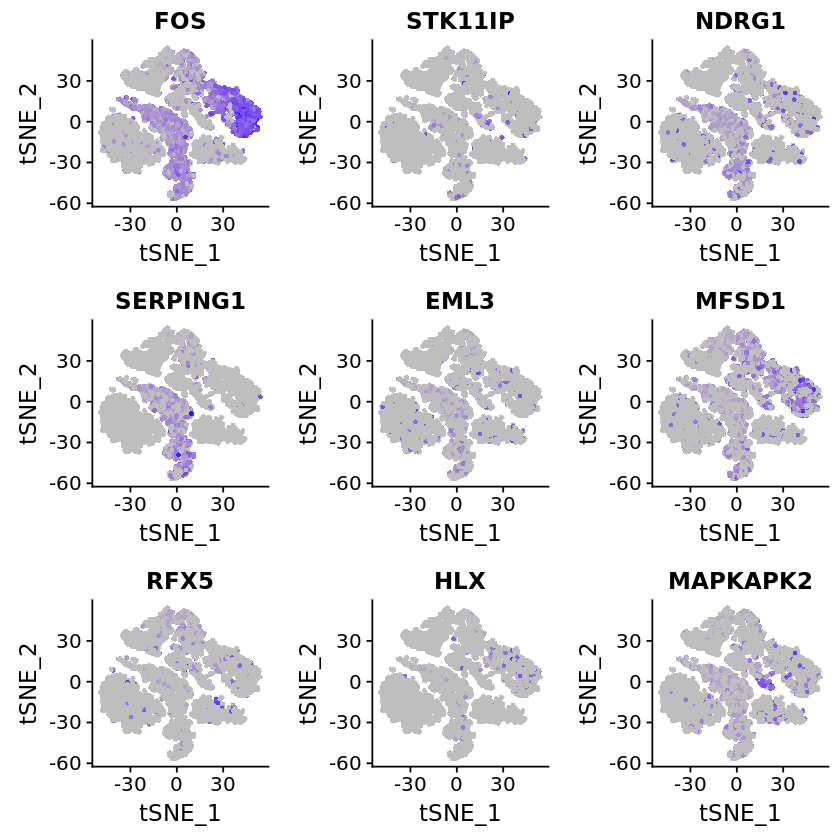

In [92]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.7, cols.use = c("grey", "blue"), reduction.use = "tsne")

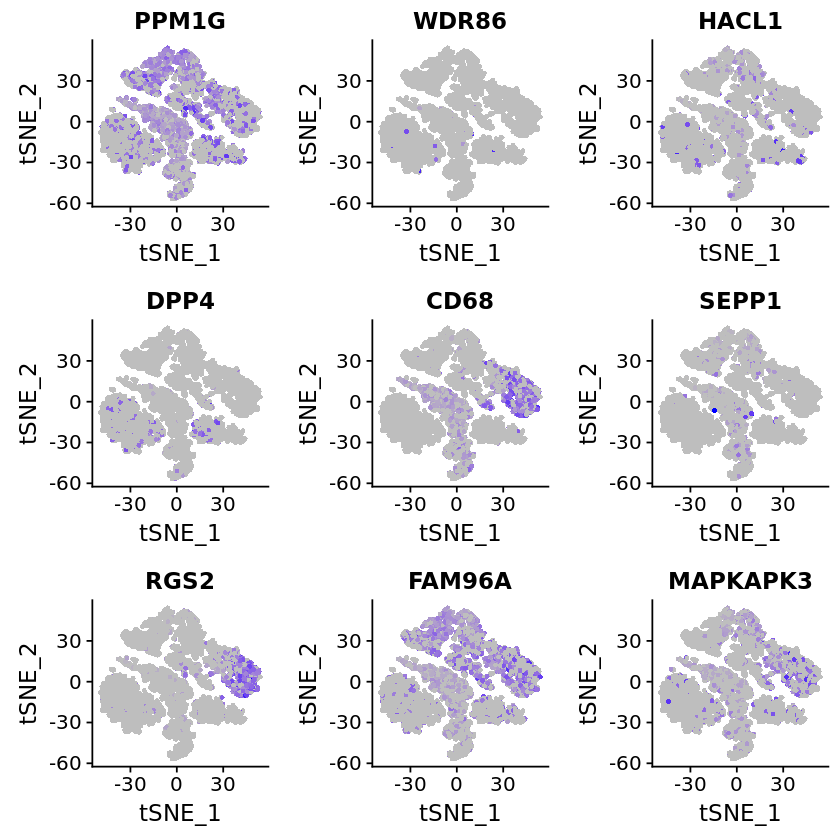

In [93]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.8, cols.use = c("grey", "blue"), reduction.use = "tsne")

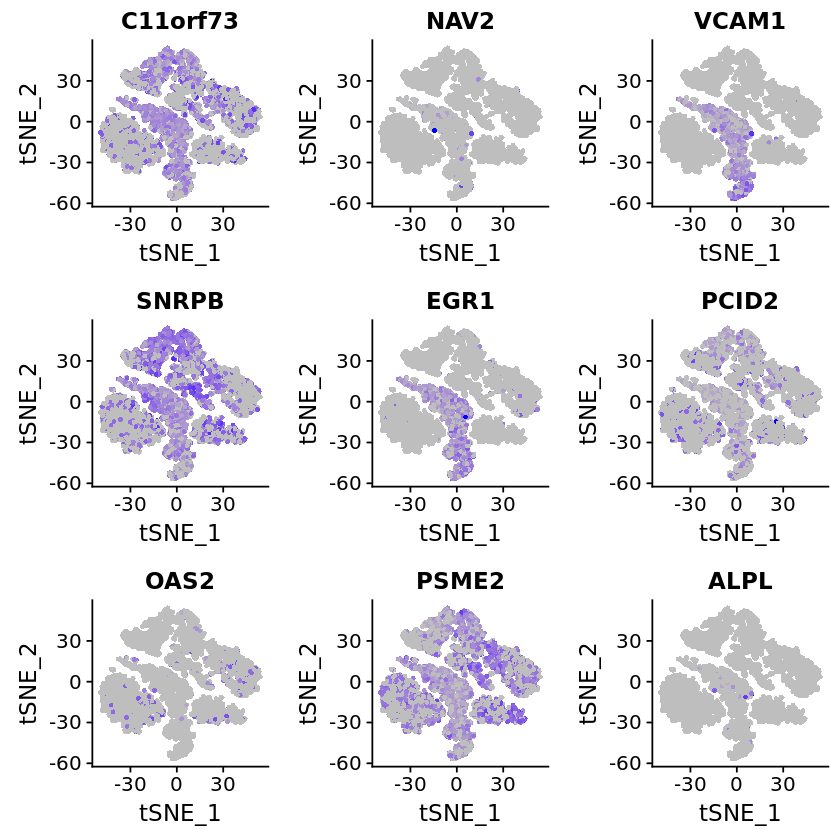

In [94]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.9, cols.use = c("grey", "blue"), reduction.use = "tsne")

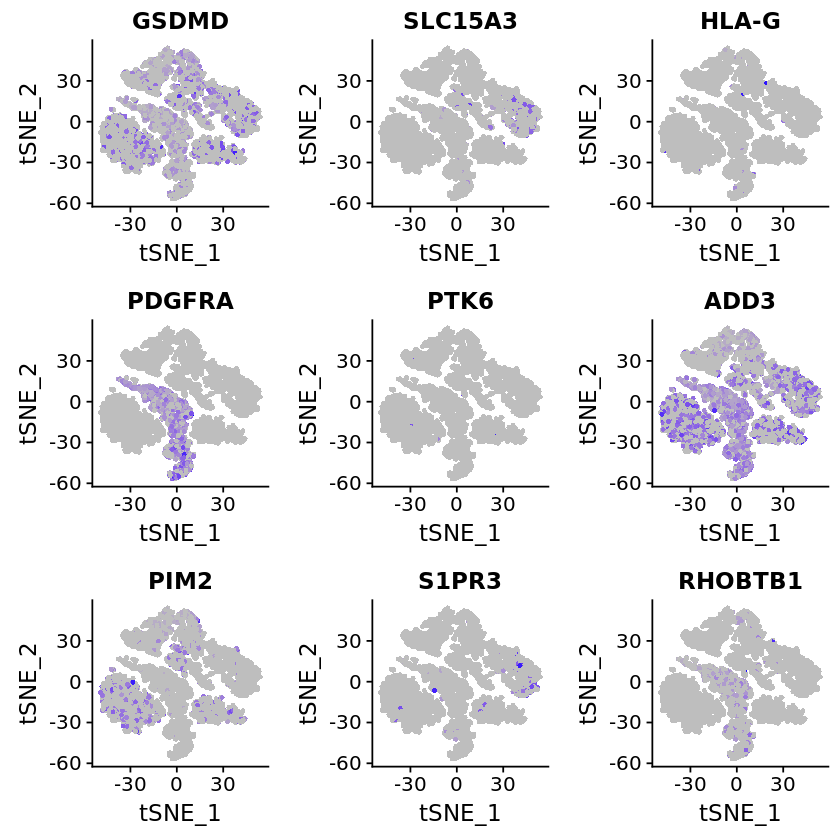

In [95]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.10, cols.use = c("grey", "blue"), reduction.use = "tsne")

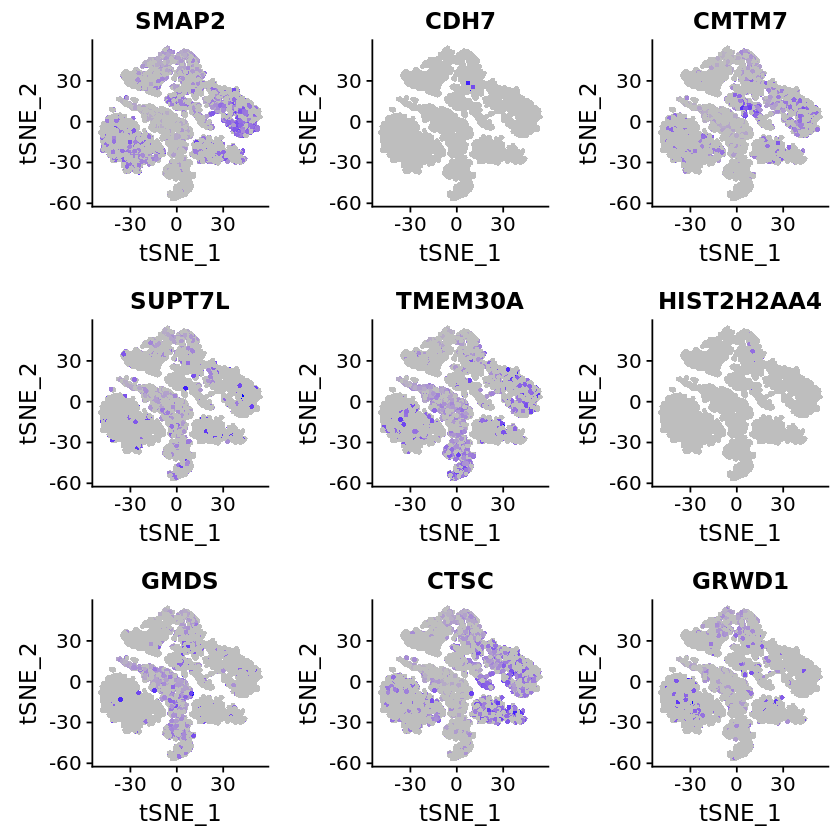

In [96]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.11, cols.use = c("grey", "blue"), reduction.use = "tsne")

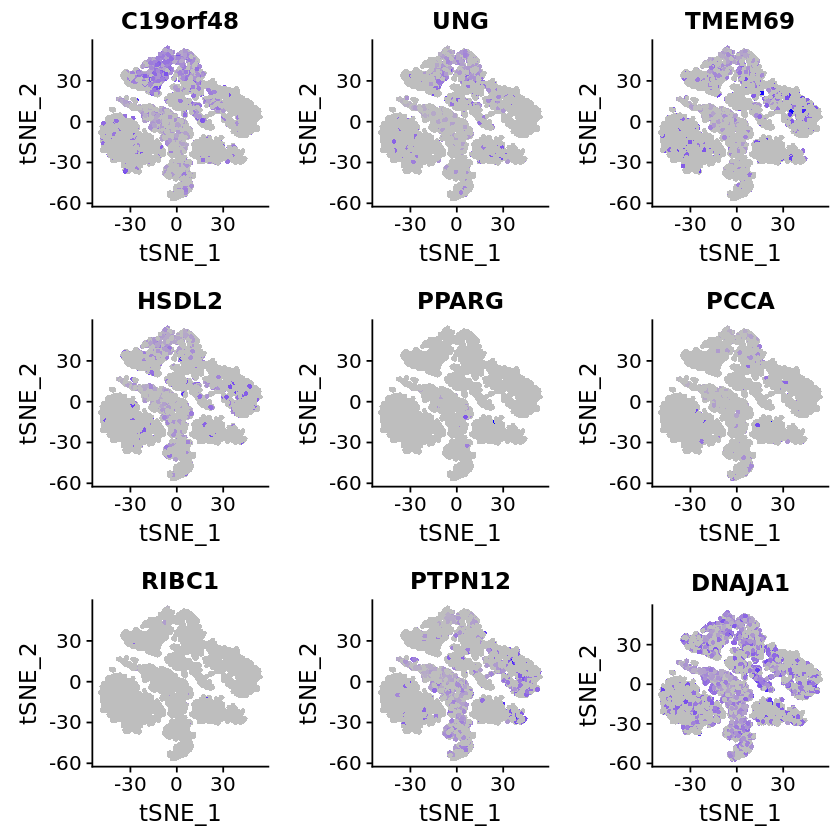

In [97]:
FeaturePlot(object = cells, features.plot = ghaz_clust3.12, cols.use = c("grey", "blue"), reduction.use = "tsne")

### Ghazanfari et al. cluster 5 expressed genes

In [98]:
ghaz_clust5 <- c("DKK3", "CSRP1", "COL8A1", "LDLR", "LIMS2", "STC2", "ASNS", "POSTN", "HOMER2")
ghaz_clust5.2 <- c("LOX", "ITGA11", "PDE7B", "PSAT1", "ASNS", "COL12A1", "TAGLN", "KRT7", "HAPLN1")
ghaz_clust5.3 <- c("LOXL1", "LMCD1", "COL1A2", "DACT1", "HAS1", "MTHFD2", "CRYAB", "FLNC", "COL5A2")
ghaz_clust5.4 <- c("CRABP2", "DSTN", "CRIP2", "MFAP2", "CDH2", "CD151", "SDC2", "CNN1", "SLC1A5")
ghaz_clust5.5 <- c("WSB2", "PPP1R3C", "PLAA", "IARS", "COL1A1", "DSTN", "FOXD1", "THBS1", "AFAP1")

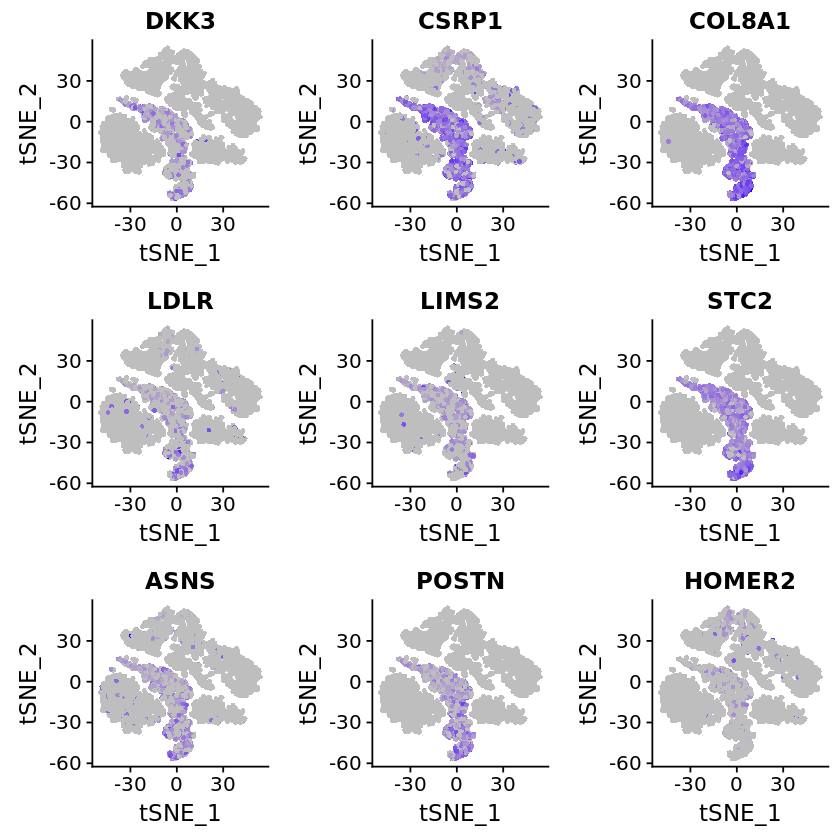

In [99]:
FeaturePlot(object = cells, features.plot = ghaz_clust5, cols.use = c("grey", "blue"), reduction.use = "tsne")

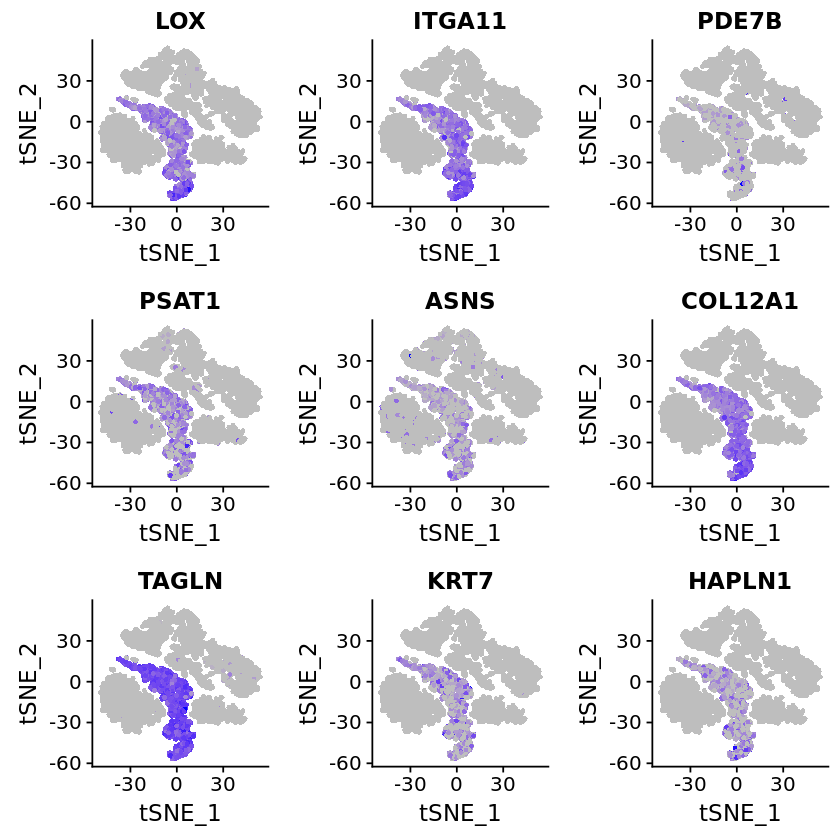

In [100]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.2, cols.use = c("grey", "blue"), reduction.use = "tsne")

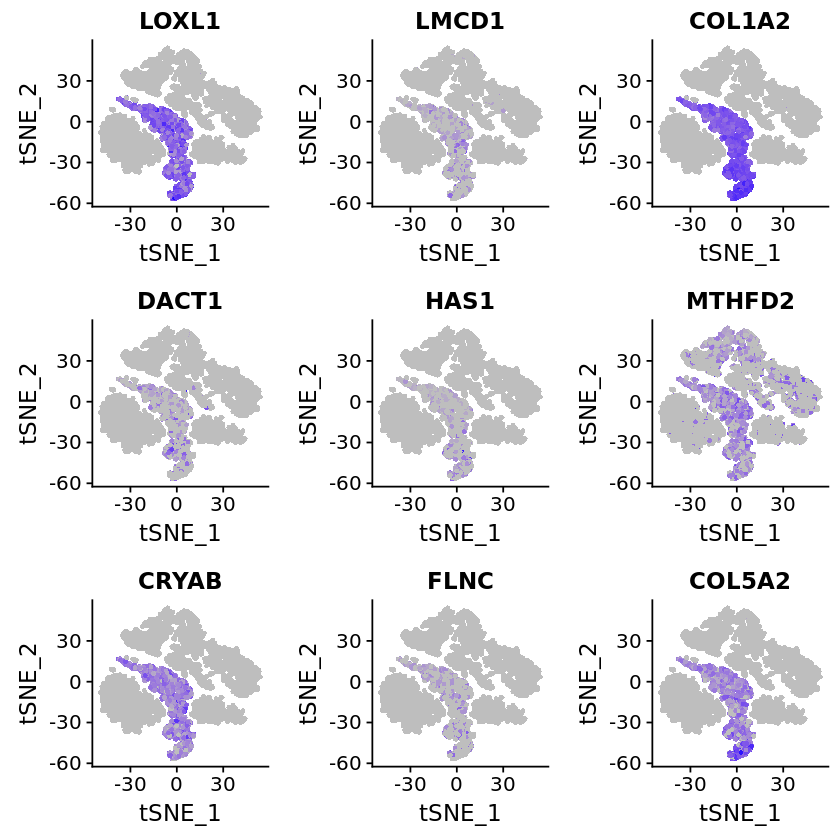

In [101]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.3, cols.use = c("grey", "blue"), reduction.use = "tsne")

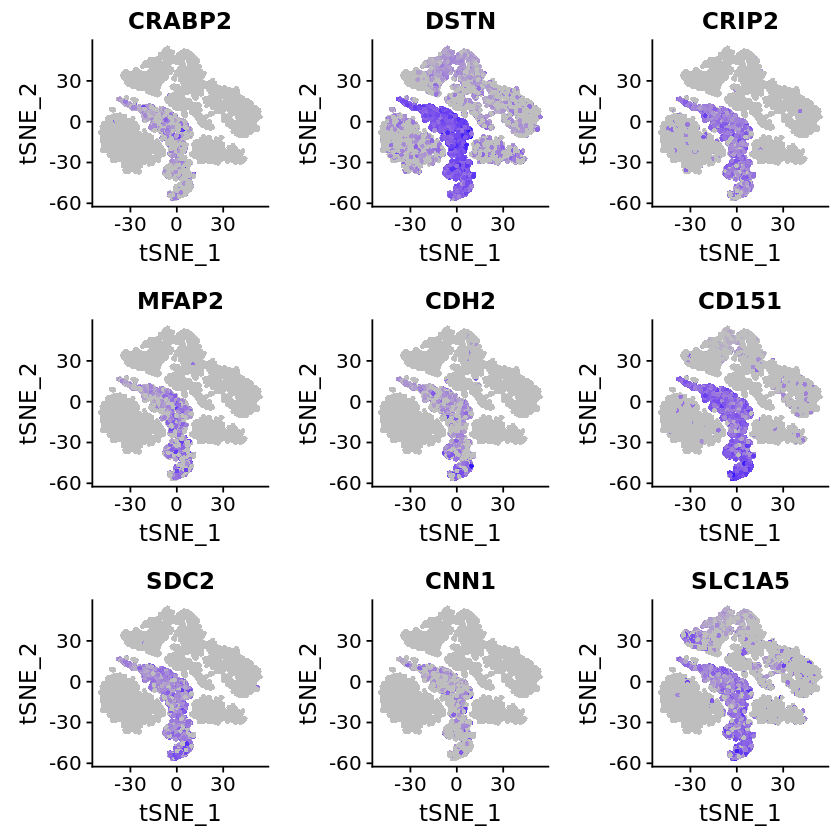

In [102]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.4, cols.use = c("grey", "blue"), reduction.use = "tsne")

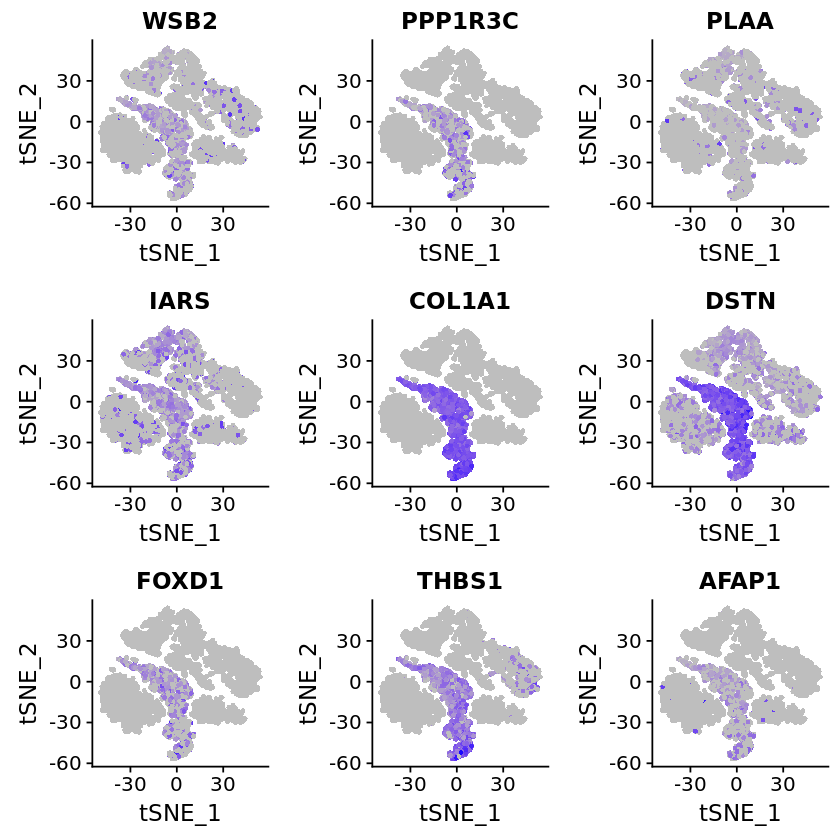

In [103]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.5, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [104]:
ghaz_clust5.6 <- c("DACT1", "CKB", "CARS", "THBS3", "B4GALT2", "COL4A1", "CALD1", "TRIB3", "NUPR1")
ghaz_clust5.7 <- c("MFAP5", "MYL9", "MTHFD2", "HAPLN1", "PYCR1", "NDUFA10", "DAG1", "MTCH1", "MYL6")
ghaz_clust5.8 <- c("FRMD6", "TUBB2B", "LBH", "HSPB7", "RAB23", "MYL6", "PALM", "MID1", "SLC16A5")
ghaz_clust5.9 <- c( "POSTN", "TAGLN", "CBS", "HCFC1R1", "FLRT2", "COL5A1", "SPARC", "PCBD1", "DPYSL3")
ghaz_clust5.10 <- c("TGDS", "SYT11", "C9orf3", "PHGDH", "FARP1", "ZFPL1", "BEND6", "PCBP4", "PEA15")
# Not found: "KIAA164", "C11orf41",  "C16orf7", "KIAA0363"

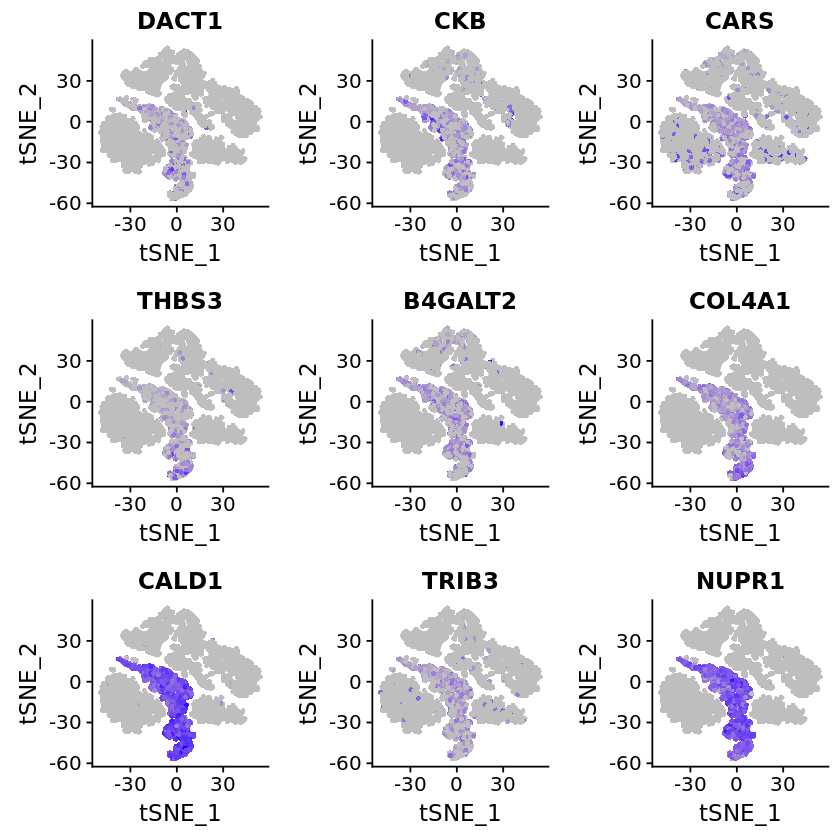

In [105]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.6, cols.use = c("grey", "blue"), reduction.use = "tsne")

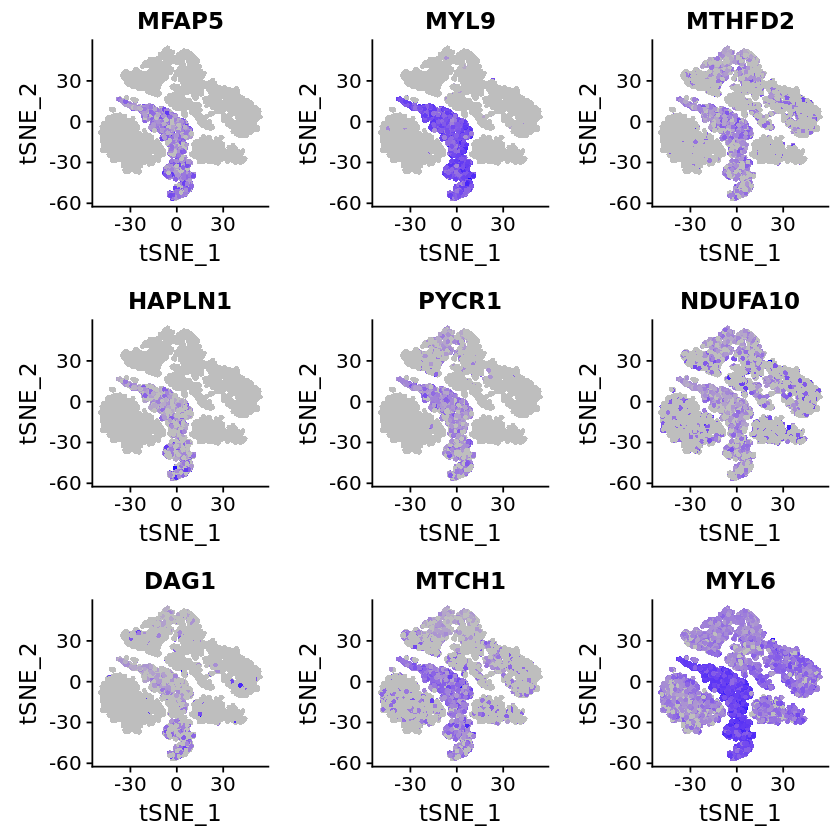

In [106]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.7, cols.use = c("grey", "blue"), reduction.use = "tsne")

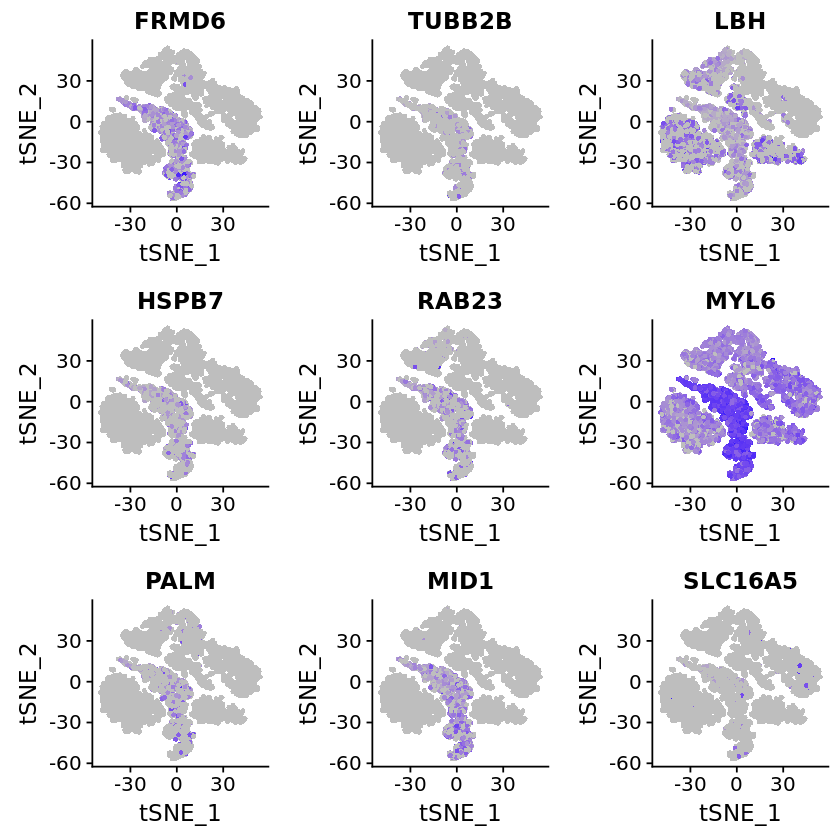

In [107]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.8, cols.use = c("grey", "blue"), reduction.use = "tsne")

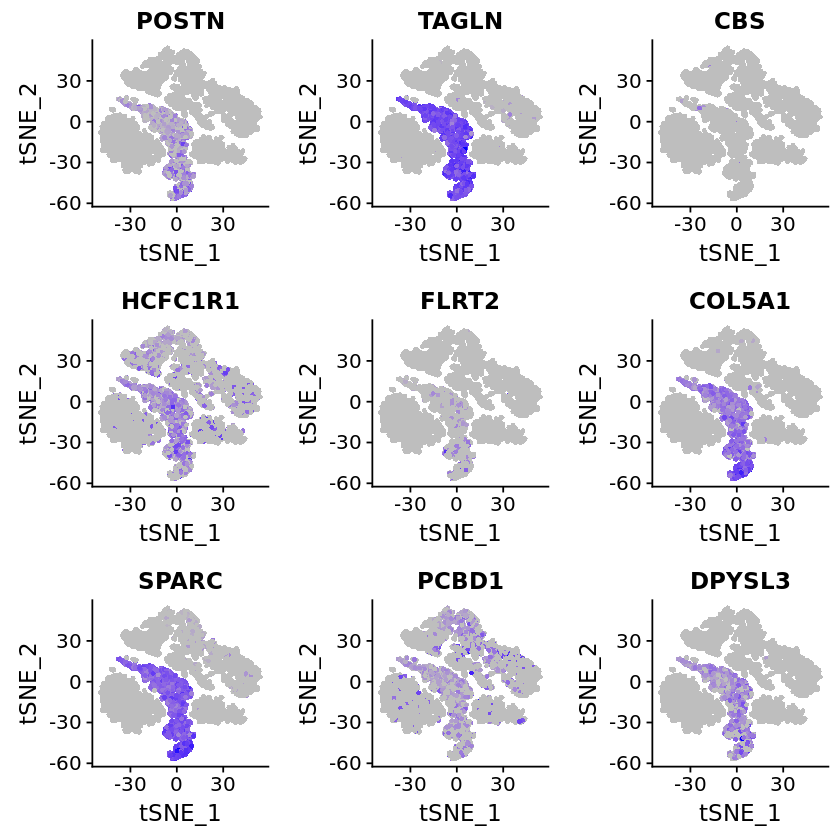

In [108]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.9, cols.use = c("grey", "blue"), reduction.use = "tsne")

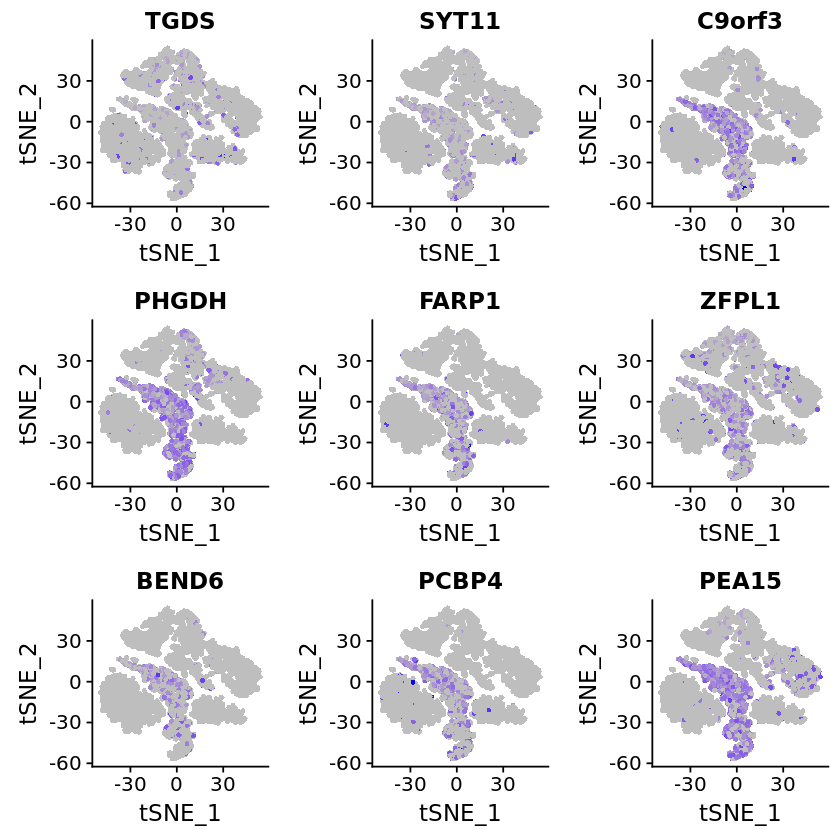

In [109]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.10, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [110]:
ghaz_clust5.11 <- c("SH3BP4", "FRMD6", "LIMA1", "BCAR3", "CHST14", "ENAH", "CLTB", "TULP4", "MLH3")
ghaz_clust5.12 <- c("SLC2A1", "PTPRF", "ALPK2", "NUAK1", "LOXL3", "PALLD", "TPM1", "ACTB", "LYPD1")
ghaz_clust5.13 <- c("HCFC1R1", "MAP1A", "FAM69A", "LARGE", "ANXA5", "CARS", "RIMS3", "ARHGDIA", "TNS1")
ghaz_clust5.14 <- c("TUFT1", "C1orf198", "PCK2",  "KCNK2", "LRSAM1", "FAT1", "EFS", "ATF4", "EIF1")
ghaz_clust5.15 <- c("TP53I11", "COMP", "LMOD1", "EHD2", "SLIT3", "TRNP1", "TPM1", "EVL", "VLDLR")
# Not found: "C5orf23", "TMEM90B", "FER1L3",

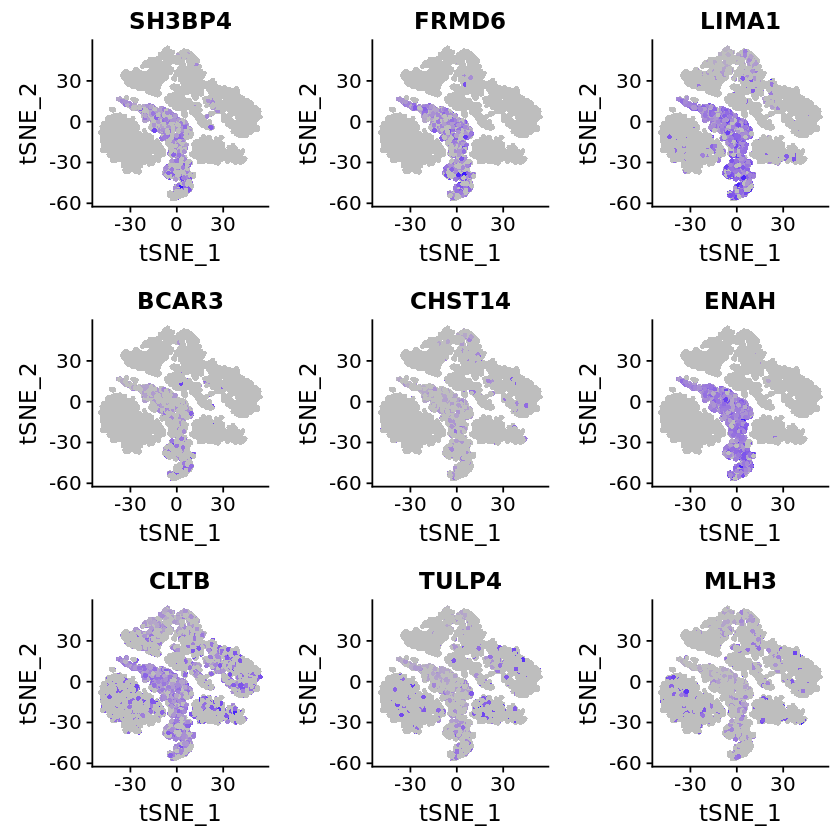

In [111]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.11, cols.use = c("grey", "blue"), reduction.use = "tsne")

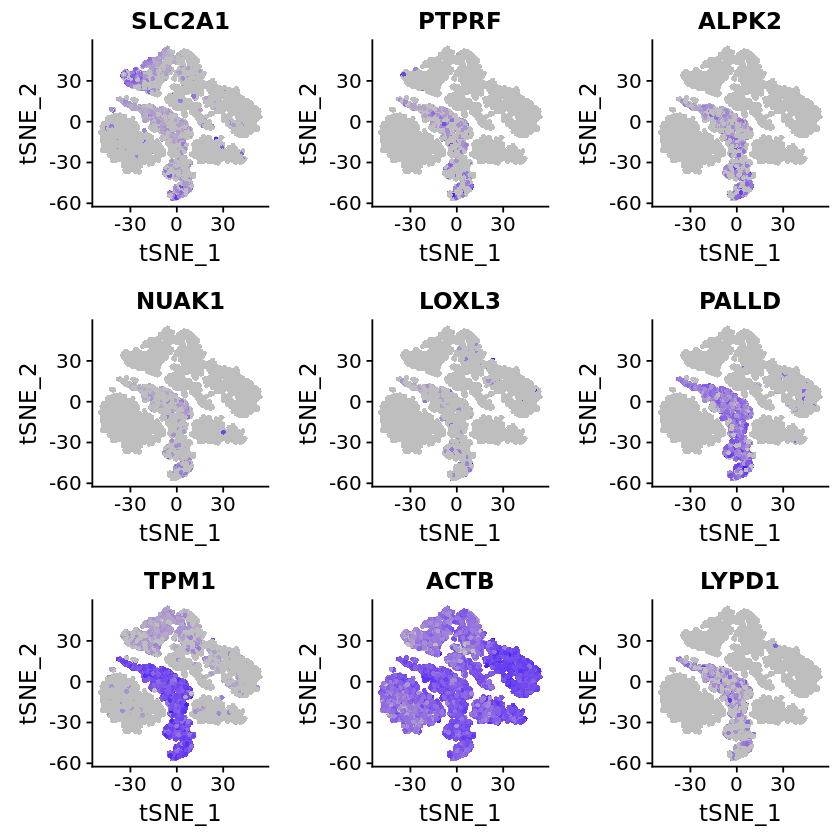

In [112]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.12, cols.use = c("grey", "blue"), reduction.use = "tsne")

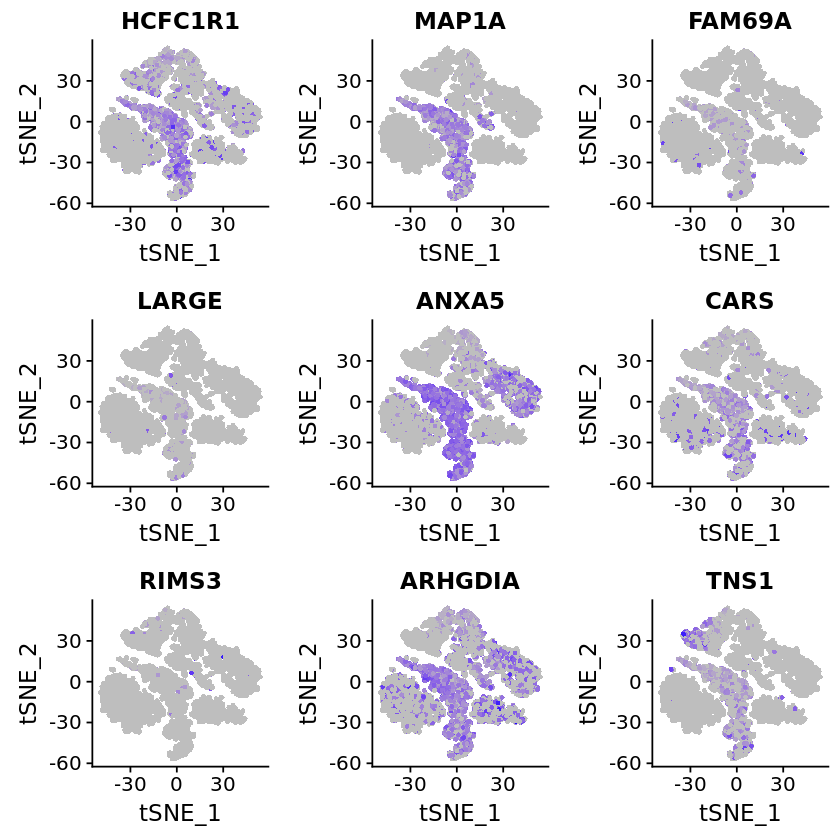

In [113]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.13, cols.use = c("grey", "blue"), reduction.use = "tsne")

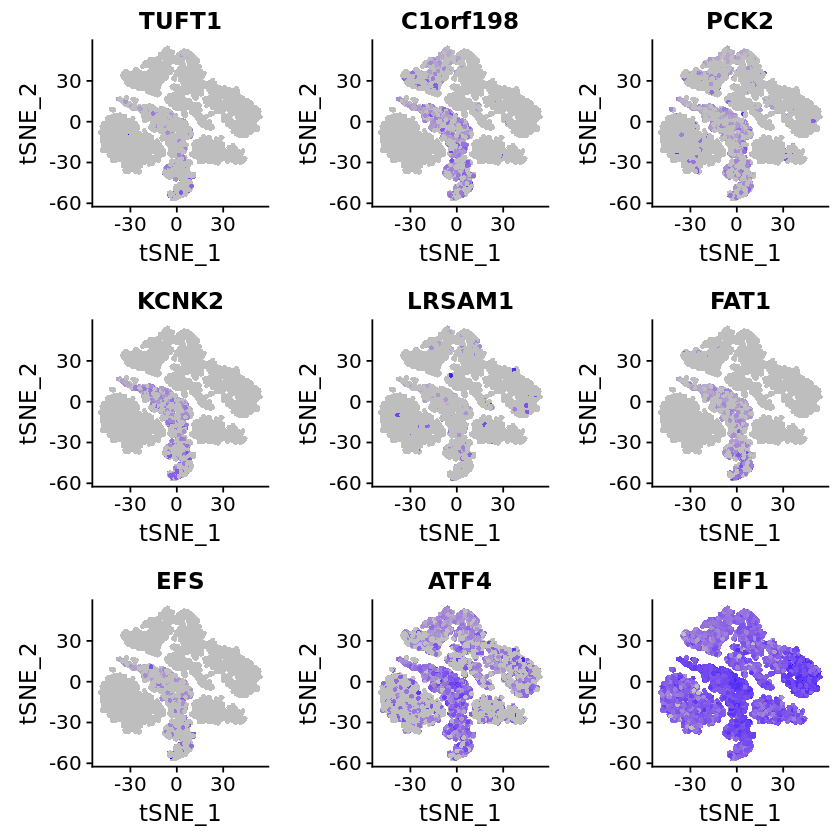

In [114]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.14, cols.use = c("grey", "blue"), reduction.use = "tsne")

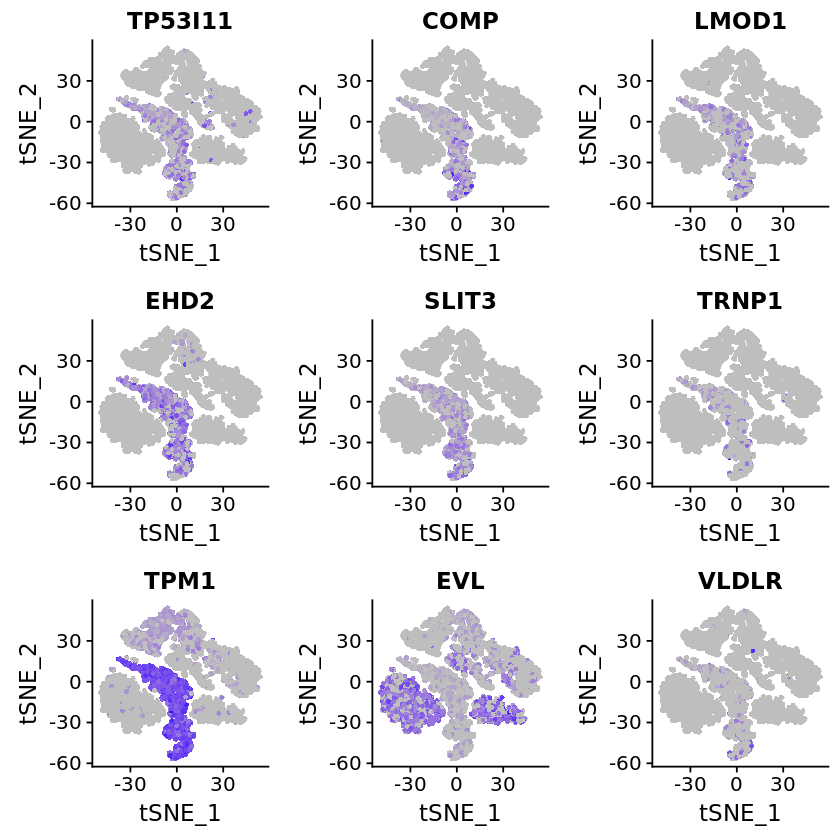

In [115]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.15, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [116]:
ghaz_clust5.16 <- c("GALNT10", "TSPO", "TBC1D20", "RUSC2", "DACT3", "KCTD15", "TBCB", "ATXN2", "SCARF2")
ghaz_clust5.17 <- c("GREM1", "KLHL9",  "ESYT1", "RNH1", "UBE2D4", "SLC6A8", "MYLK", "TMEM184B", "TNK2")
ghaz_clust5.18 <- c("SLC38A2", "CBR3", "CPA4", "MYOF", "RAB23", "ITGBL1", "NFE2L1", "NDUFB7", "PDLIM1")
ghaz_clust5.19 <- c("ADCY4", "LRRC15", "FNDC1", "SNTA1", "CYB5R3", "COPZ2", "FLNA", "CNTNAP1", "COL4A2")
ghaz_clust5.20 <- c("FBXL7", "MATN2", "CABLES1", "KRT81", "HAS3", "LARGE", "UHRF1BP1", "LRRC32", "NTN4")
# Not found: "ANXA2P1", "FLJ35258","GPER", "FKBP9L", "C2orf24", "MGC42630", "MGC102966", "ANXA2P1"

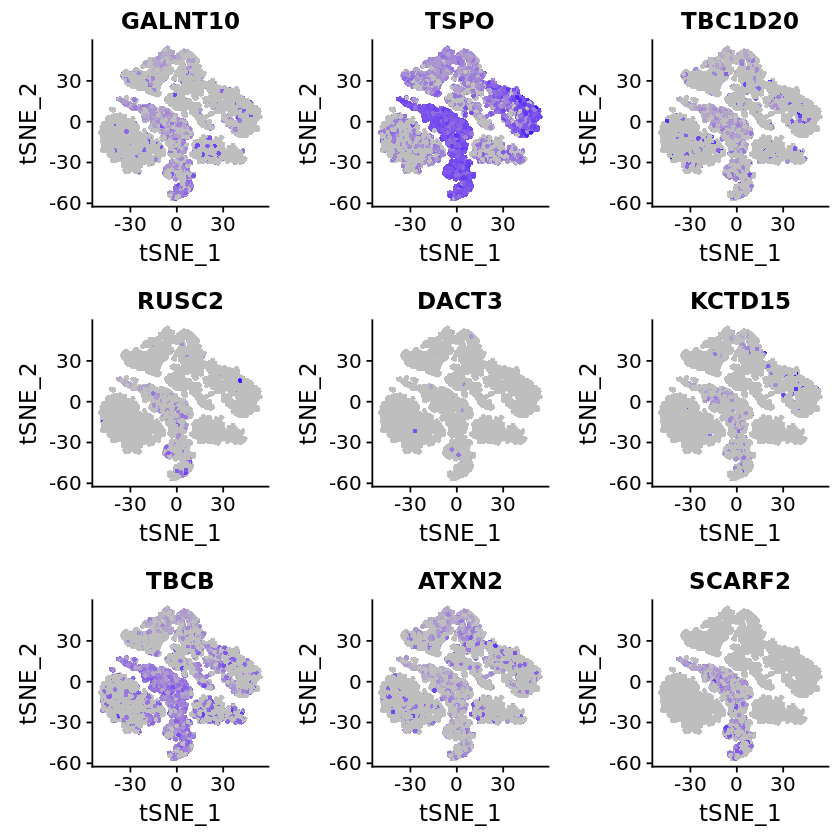

In [117]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.16, cols.use = c("grey", "blue"), reduction.use = "tsne")

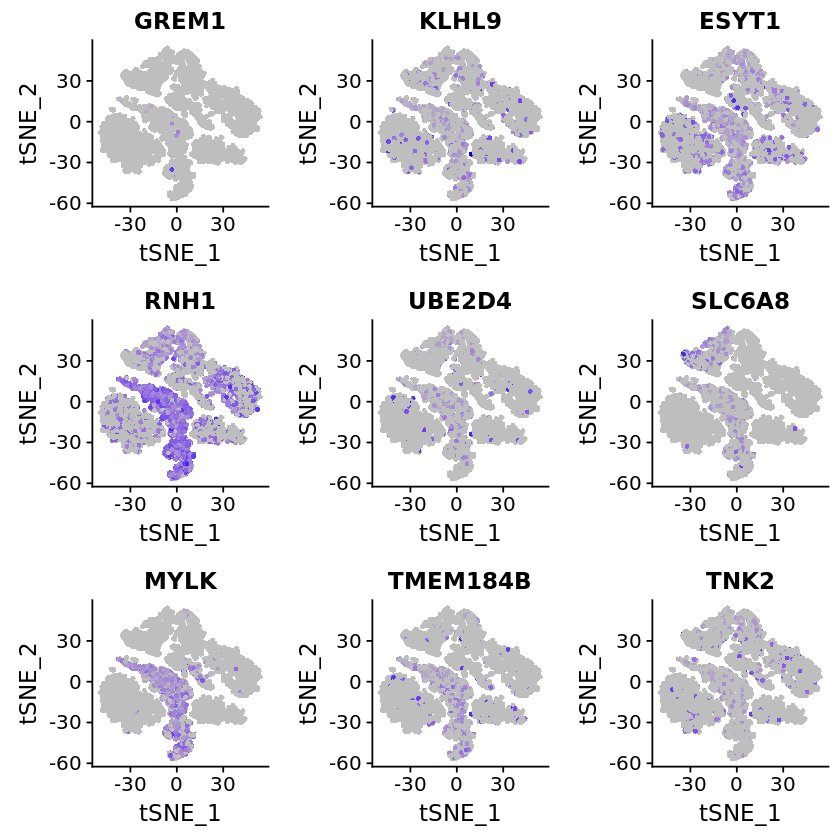

In [118]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.17, cols.use = c("grey", "blue"), reduction.use = "tsne")

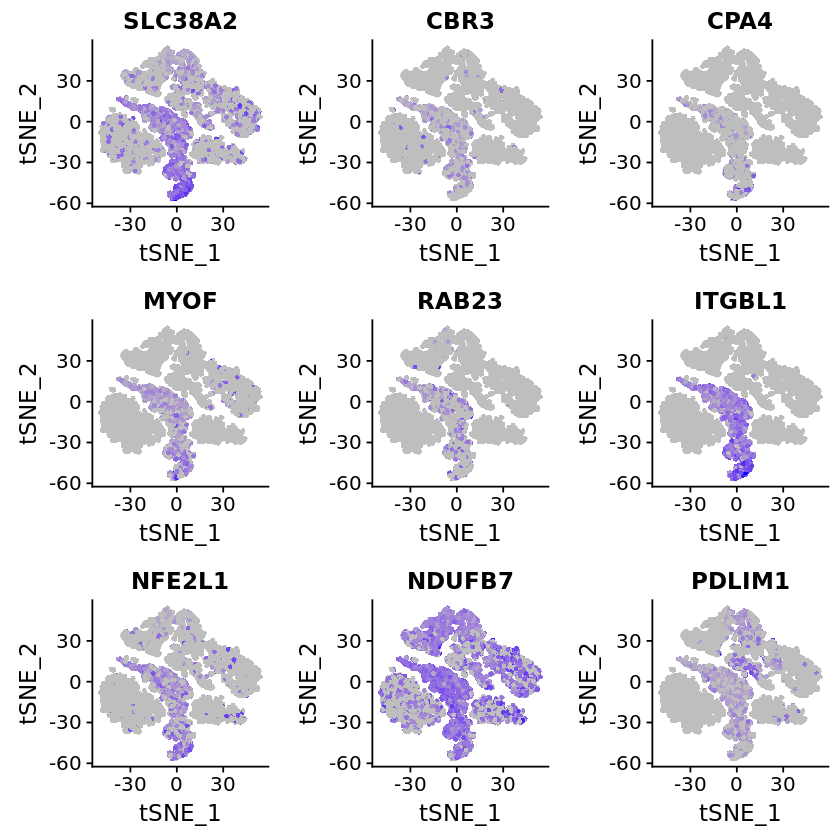

In [119]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.18, cols.use = c("grey", "blue"), reduction.use = "tsne")

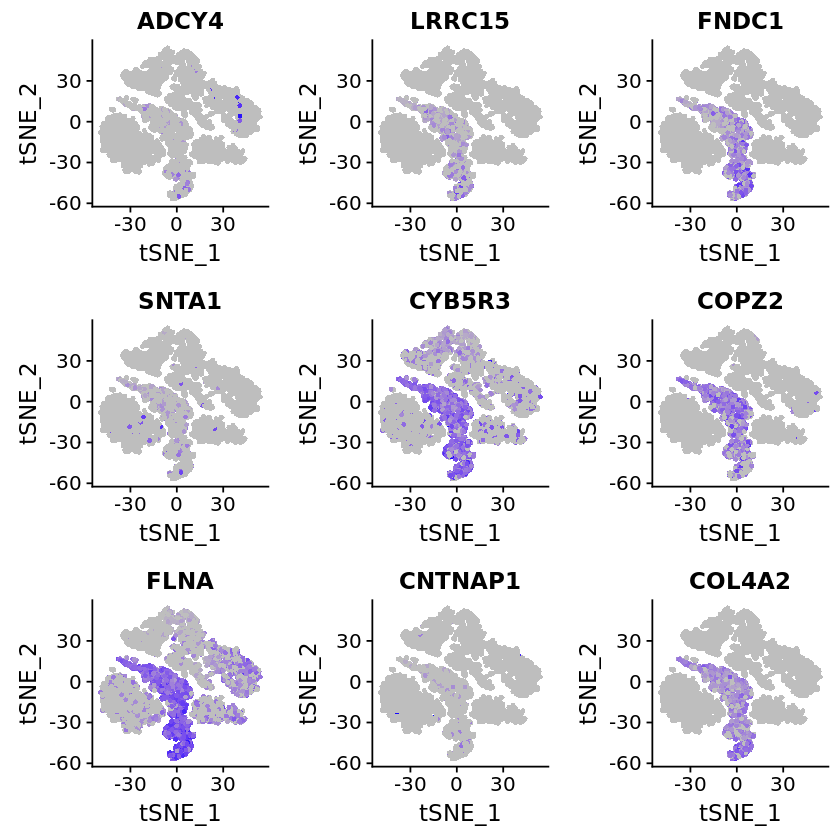

In [120]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.19, cols.use = c("grey", "blue"), reduction.use = "tsne")

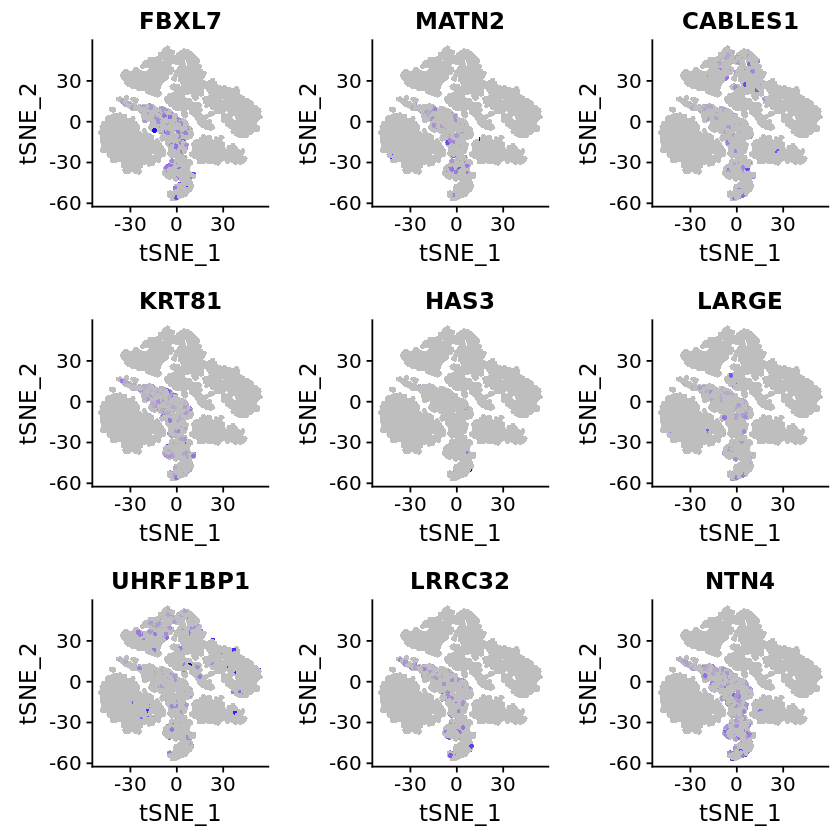

In [121]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.20, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [122]:
ghaz_clust5.21 <- c("FBXL5", "TBC1D20", "CDC14A", "NTM", "GCC1", "HSPB2", "GDPD1", "FNDC1", "B3GALT6")
ghaz_clust5.22 <- c("POFUT2", "S100A11",  "UNC5B", "KIFAP3", "LHPP", "SLC7A1", "ACLY", "PCK2", "CRLF1")
ghaz_clust5.23 <- c("SCRG1", "SLC7A5", "ZFHX3",  "POFUT2", "INHBE", "MYLK", "FAM180A", "P2RX6", "SEMA4F")
ghaz_clust5.24 <- c("SPTAN1", "ARL2", "TPM2", "STBD1", "NTM", "RNF150", "ATP6V0E2", "MEX3B", "SYTL2")
ghaz_clust5.25 <- c("PENK", "TPD52L1", "PTN", "FKSG30", "NAV1", "ECM1", "PFKP", "TMUB1", "P4HA3")
# Not found: "JUB", "C5orf53", "PIP3-E", "KRT78", "C1QTNF5"

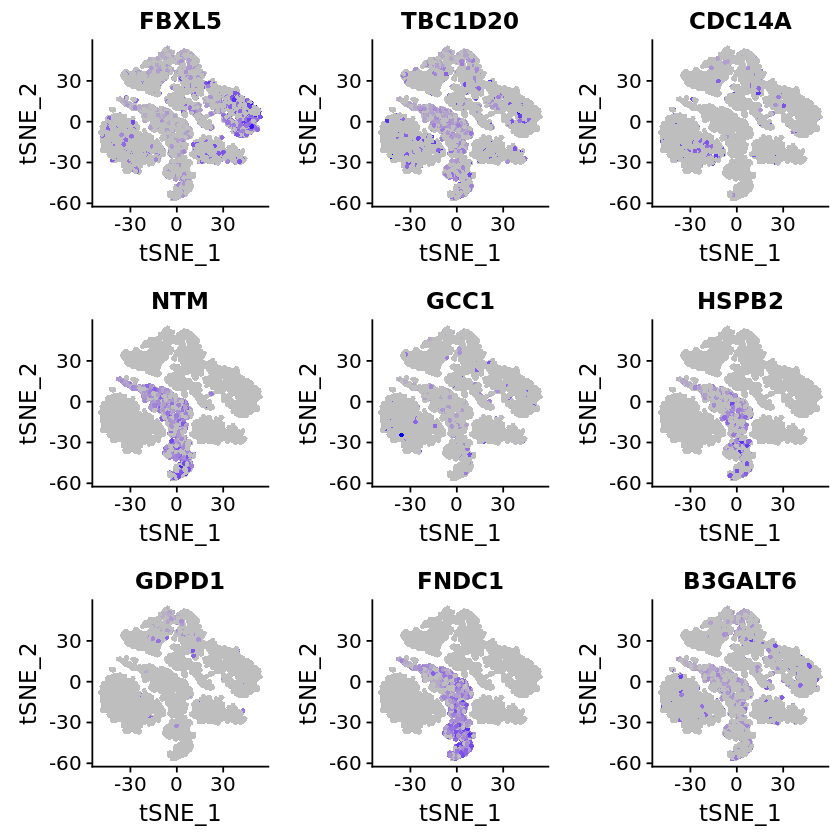

In [123]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.21, cols.use = c("grey", "blue"), reduction.use = "tsne")

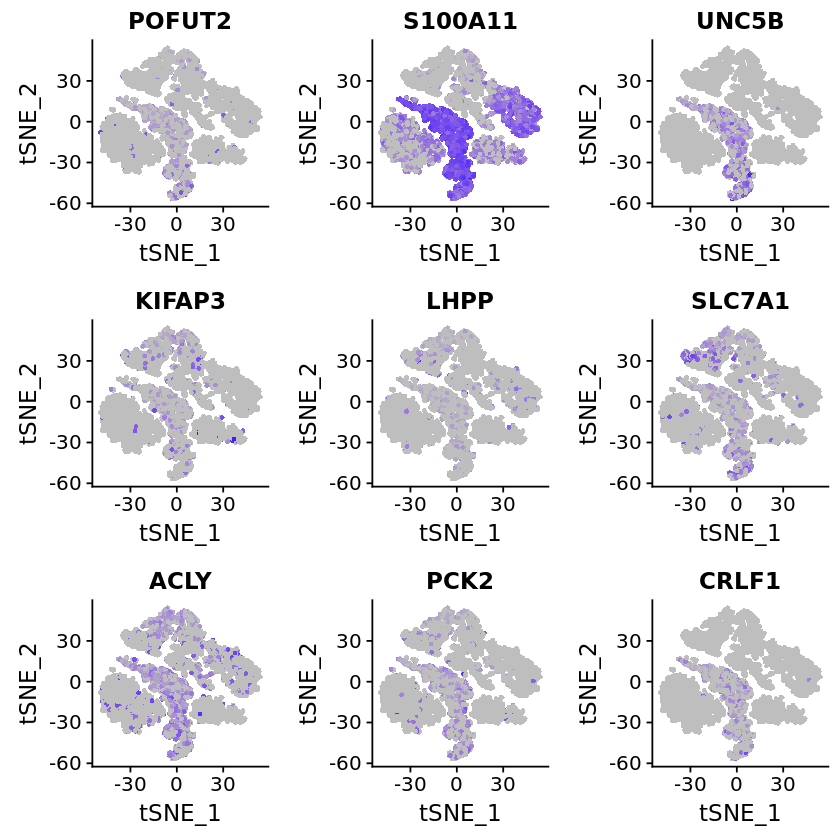

In [124]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.22, cols.use = c("grey", "blue"), reduction.use = "tsne")

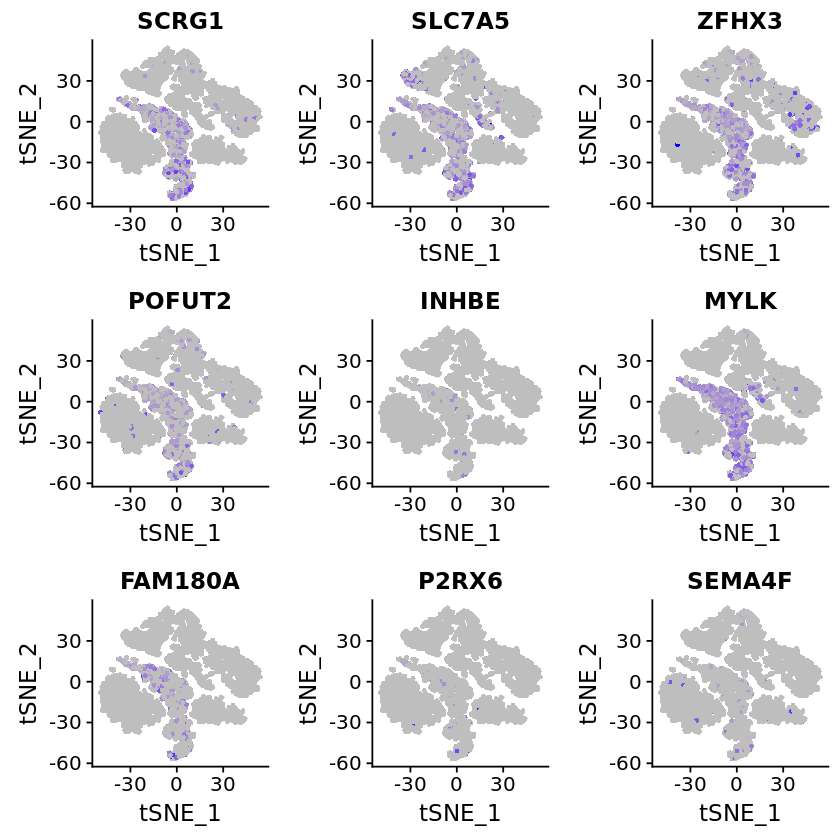

In [125]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.23, cols.use = c("grey", "blue"), reduction.use = "tsne")

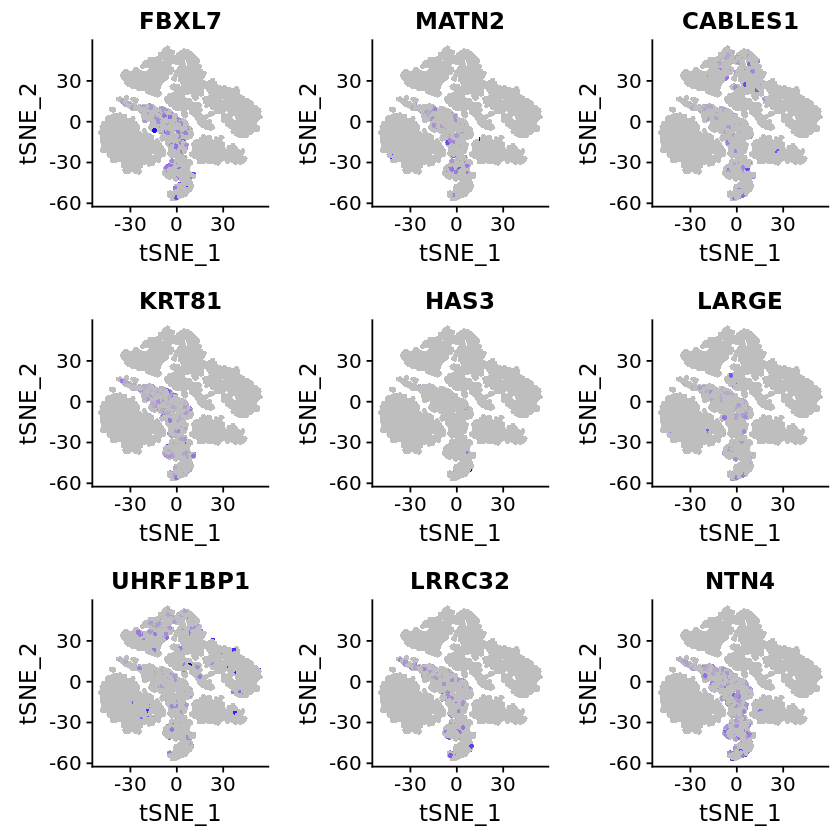

In [126]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.20, cols.use = c("grey", "blue"), reduction.use = "tsne")

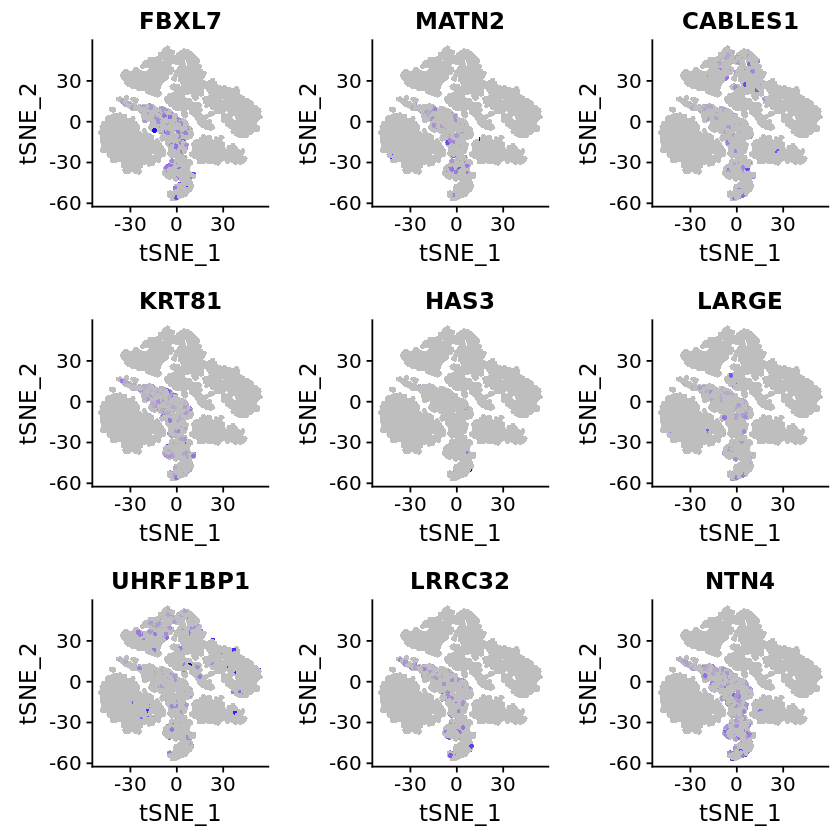

In [127]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.20, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [128]:
ghaz_clust5.26 <- c("SMPD1", "PTPRF", "ABLIM1", "CXXC5", "PPP1R14B", "CALD1", "BCAS4", "IGFBP7", "RAB11FIP2")
ghaz_clust5.27 <- c("GLS", "GDI1", "PIP5K1C", "PDGFC", "FUBP3", "GALNT1", "FSTL3", "MCAM", "WARS")
ghaz_clust5.28 <- c("ID3", "DYNLRB1", "GPR1", "HSPB8", "SLC3A2", "ID2", "COL8A2", "LSS",  "TPD52L1")
ghaz_clust5.29 <- c("ATOH8", "RAP1B", "BAMBI", "CDC42EP1", "ST8SIA4", "COL8A2", "LIMCH1", "TTC3", "PFN1")
ghaz_clust5.30 <- c("PXDN", "RBCK1", "CAP2", "THY1", "EYA2", "RHOBTB1", "RTN4", "TCEA2", "ZCCHC14")
# Not found: "TMEM166", "KIAA0427", "C14orf78", "SC4MOL", "C20orf30", "MIR889", "LEPRE1", "CXCR7"

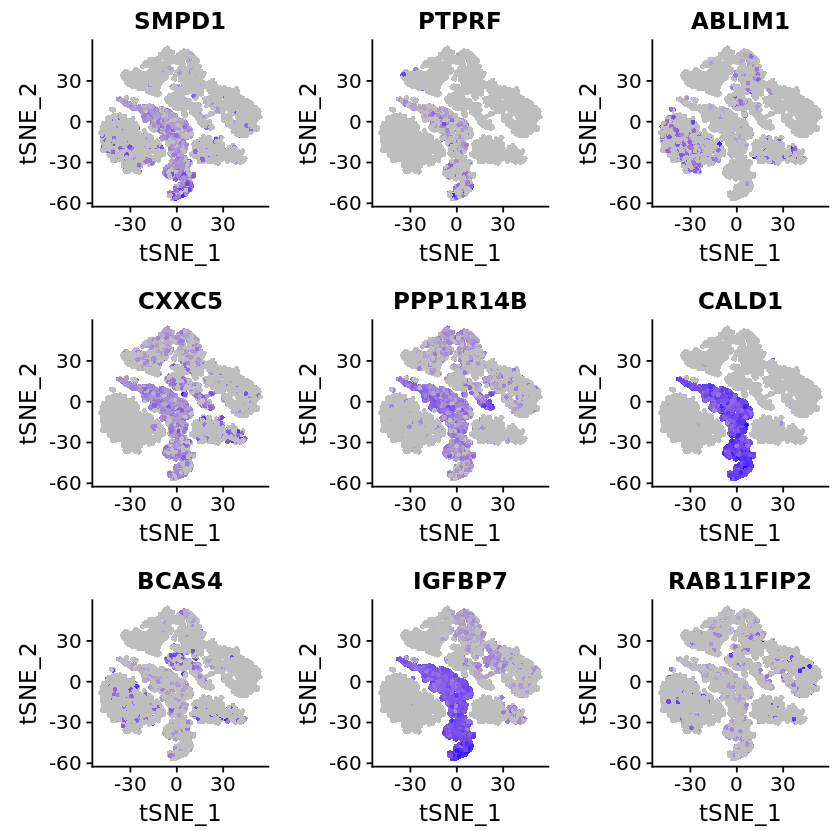

In [129]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.26, cols.use = c("grey", "blue"), reduction.use = "tsne")

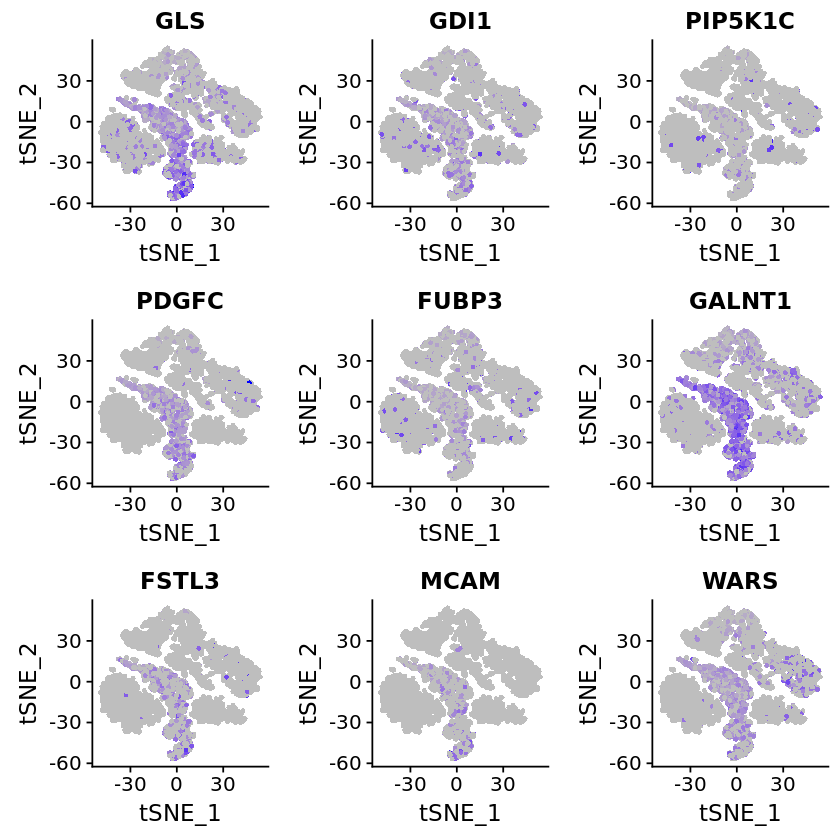

In [130]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.27, cols.use = c("grey", "blue"), reduction.use = "tsne")

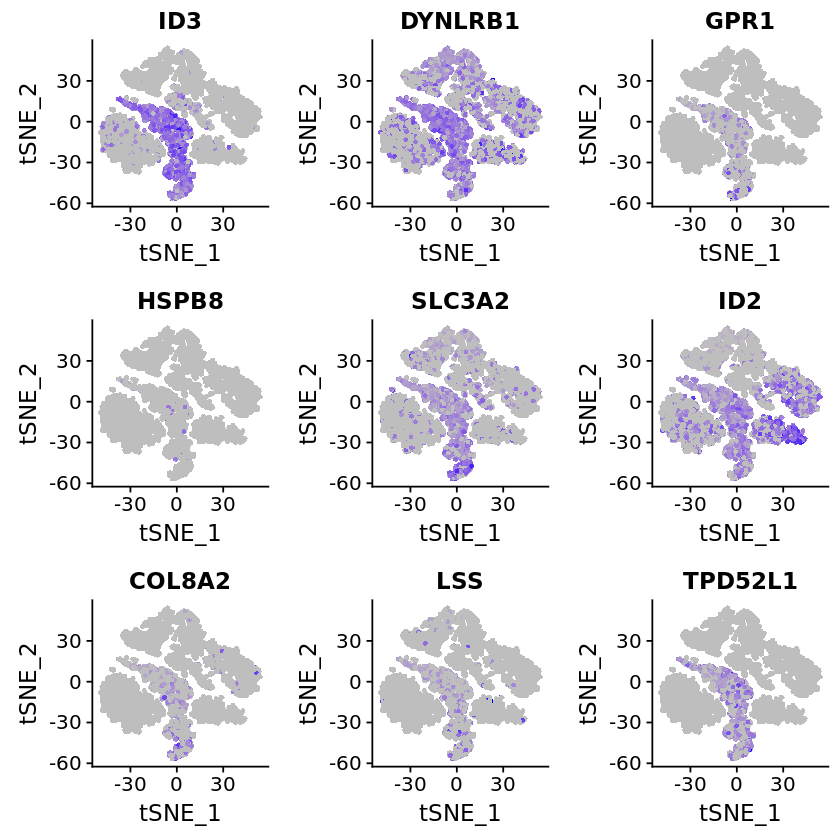

In [131]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.28, cols.use = c("grey", "blue"), reduction.use = "tsne")

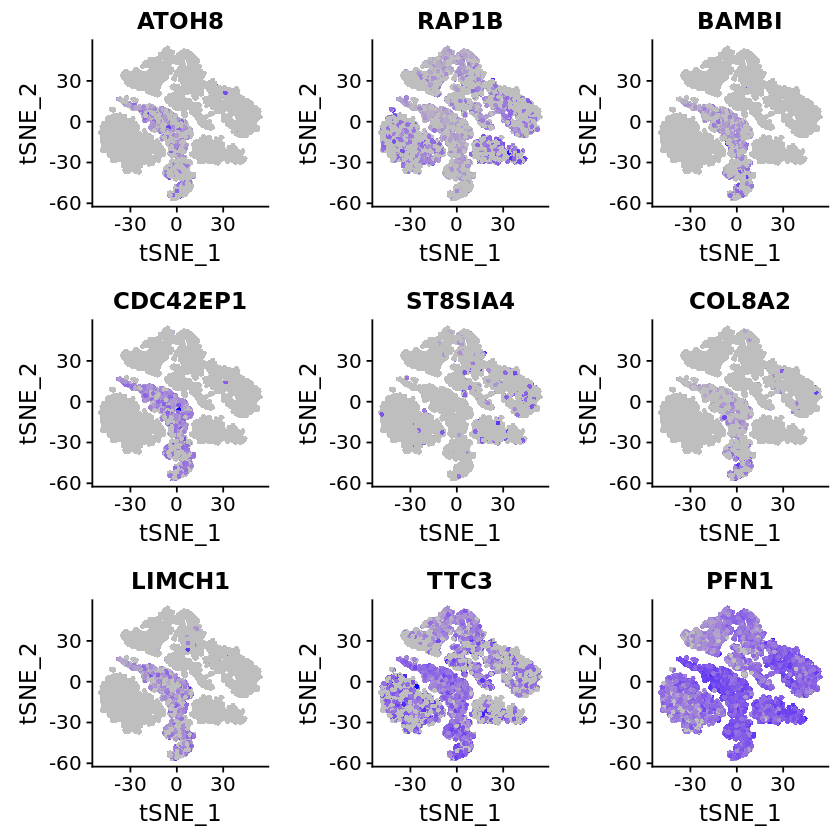

In [132]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.29, cols.use = c("grey", "blue"), reduction.use = "tsne")

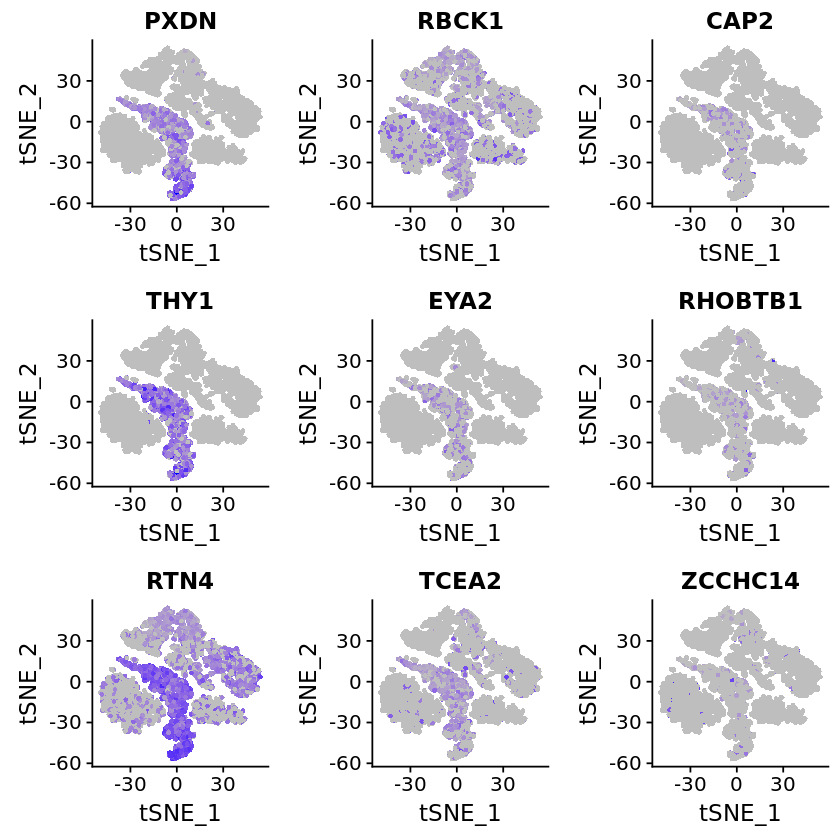

In [133]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.30, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [134]:
ghaz_clust5.30 <- c("BOK", "FAM171A1", "KCNMA1", "PARVA", "DAB2", "LMF1", "SIPA1L1", "WARS", "CREB3L2")
ghaz_clust5.31 <- c("FBXW4", "CTGF", "ALCAM", "ENC1", "VCL", "CTGF", "CYB5R3", "FZD2", "C7orf50")
ghaz_clust5.32 <- c("COL16A1", "MYH9", "CNN2", "KCTD11", "CSPG4", "MYH9", "SLC1A4", "MET", "IL11")
ghaz_clust5.33 <- c("TMEM47", "PRSS23", "ADM2", "NLRX1", "GRPEL2", "SOX4", "SEC61A1", "BGN", "ZNF197")
ghaz_clust5.34 <- c("NUAK1", "PLS3", "ISLR", "EIF4EBP1", "CLSTN1", "YIF1B", "C6orf48", "NAGK", "LAYN")
ghaz_clust5.35 <- c("ABI3BP", "SORBS2", "SASH1", "SIRPA", "TP53INP2")
# Not Found: "MGC72080", "C5orf13", "SCAND2", "PPAP2A", "FLJ40504", "DCI", "C18orf1"

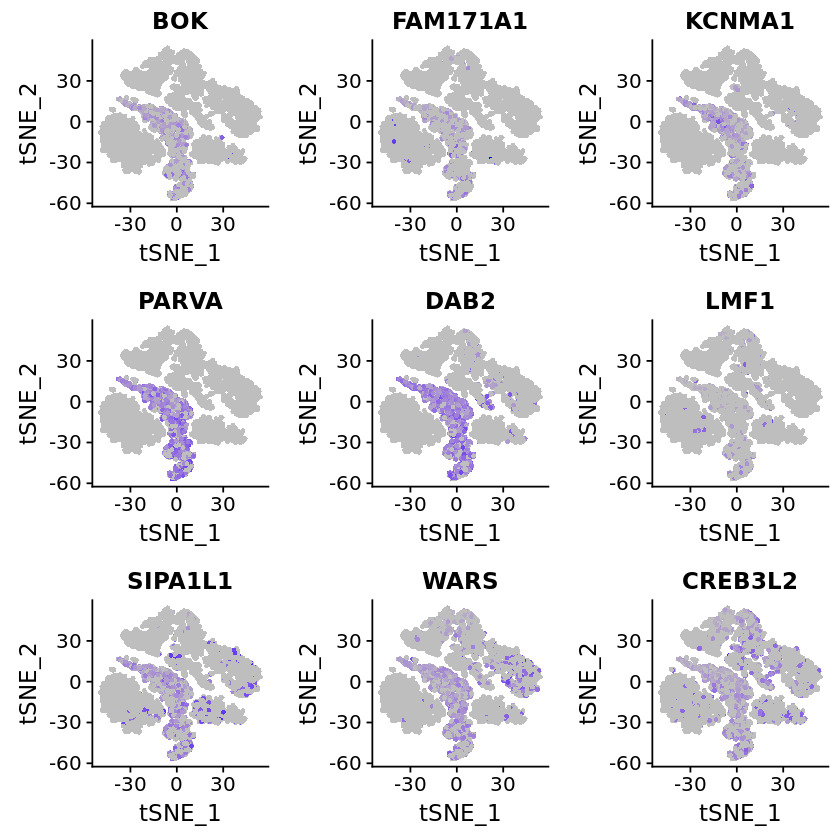

In [135]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.30, cols.use = c("grey", "blue"), reduction.use = "tsne")

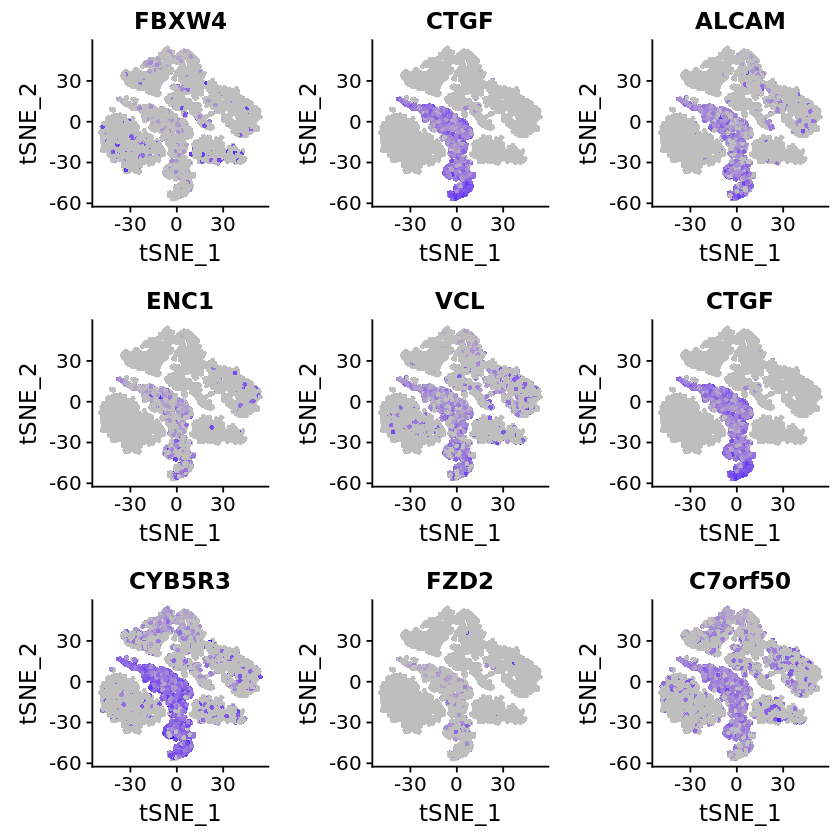

In [136]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.31, cols.use = c("grey", "blue"), reduction.use = "tsne")

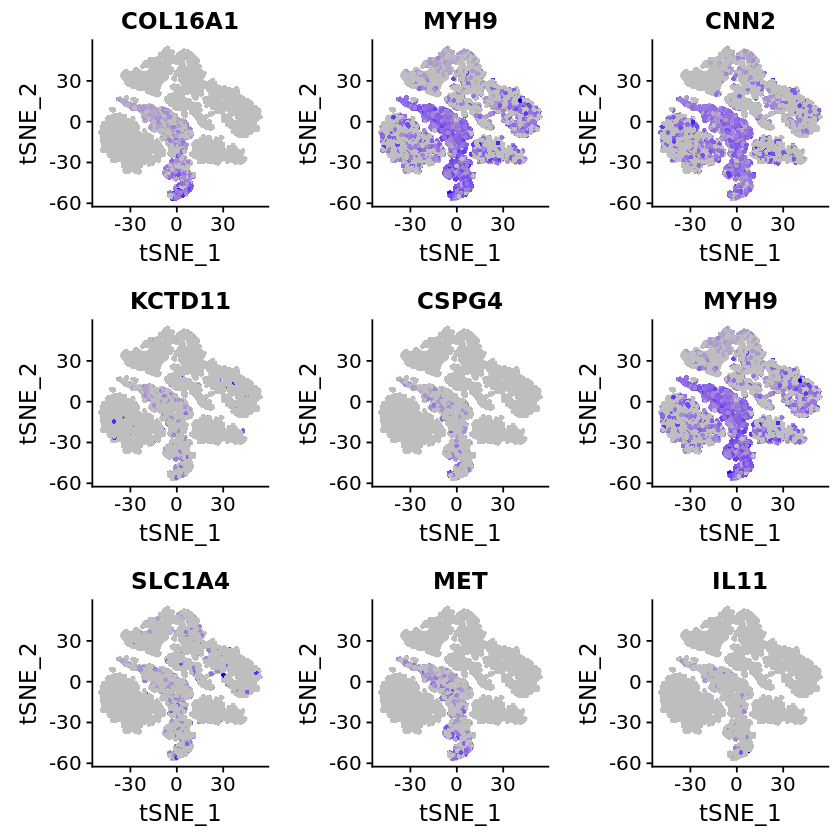

In [137]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.32, cols.use = c("grey", "blue"), reduction.use = "tsne")

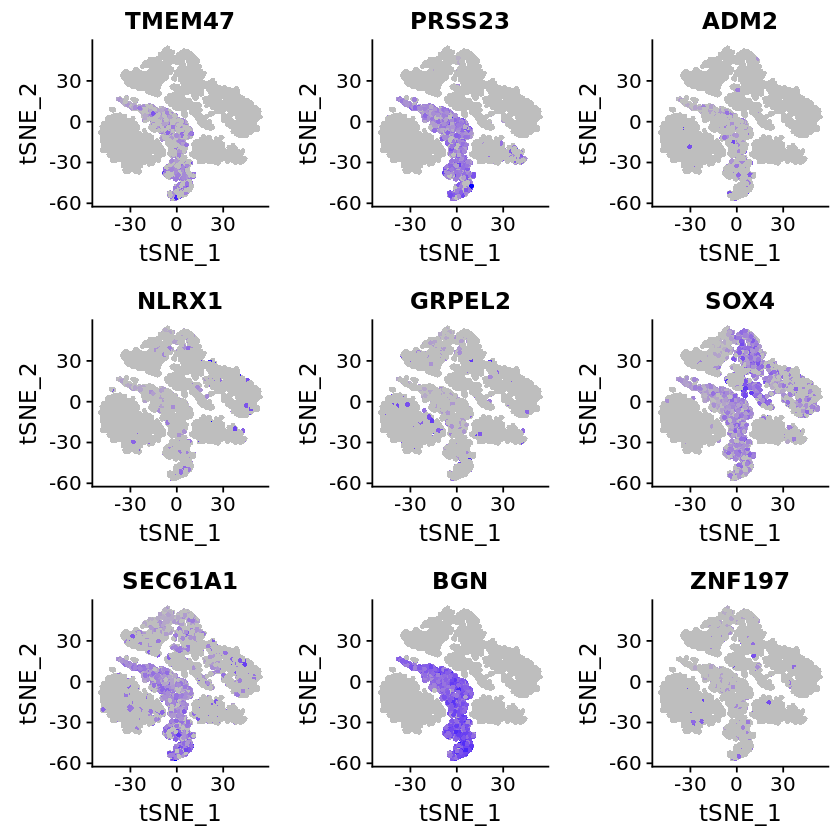

In [138]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.33, cols.use = c("grey", "blue"), reduction.use = "tsne")

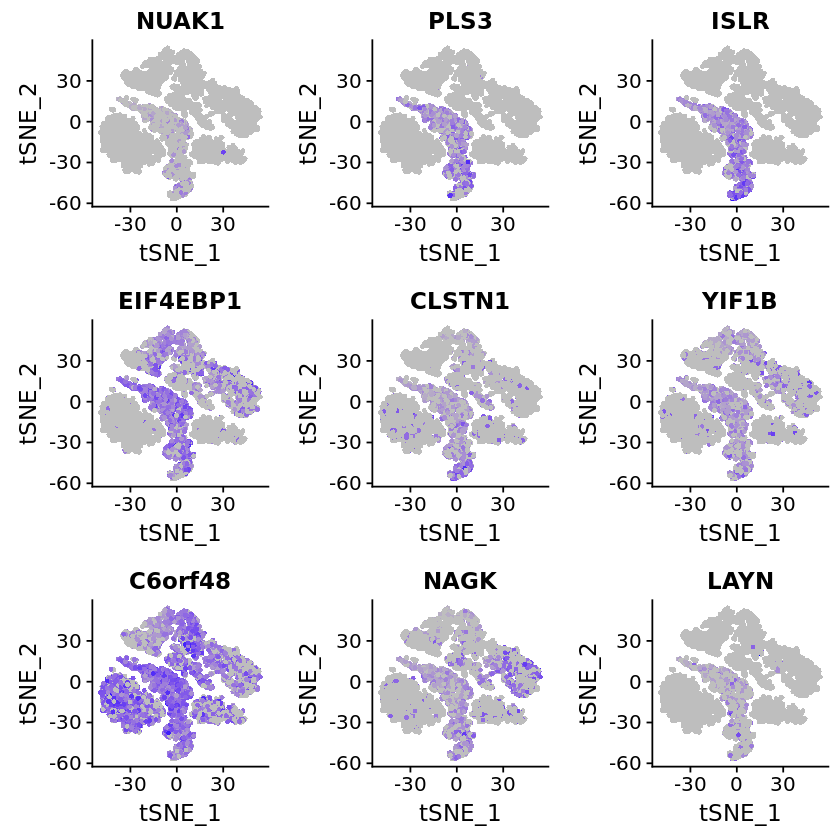

In [139]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.34, cols.use = c("grey", "blue"), reduction.use = "tsne")

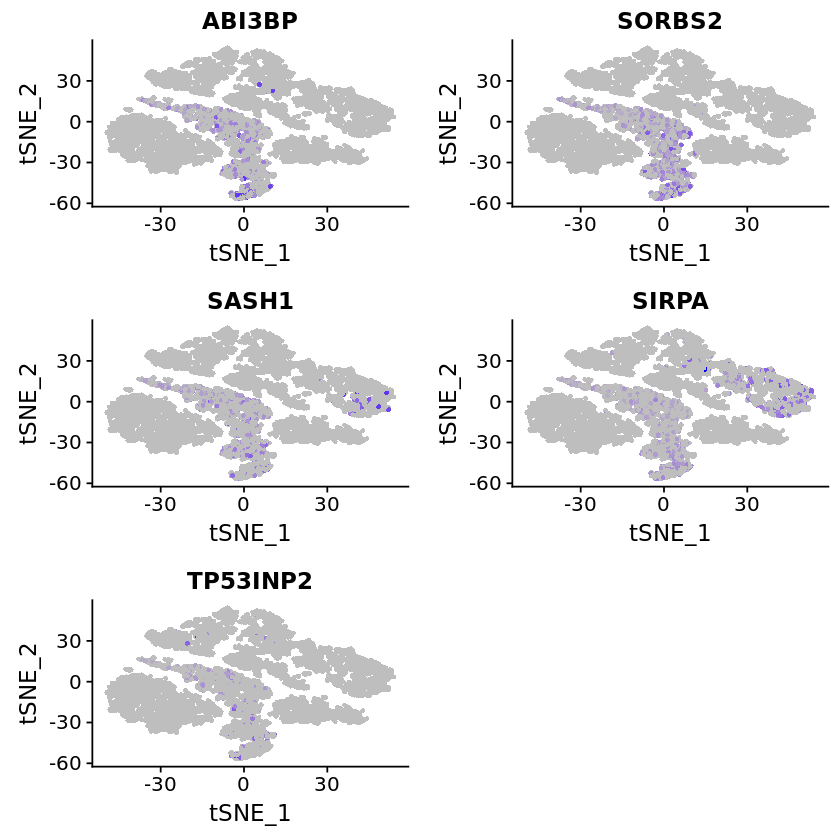

In [140]:
FeaturePlot(object = cells, features.plot = ghaz_clust5.35, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [120]:
# 2/14/19 Ghaz 116 c3c5 genes
ghaz_candidate <- c('CSTF2', 'PARP12', 'OLFML2B', 'STK11IP', 'WDR86', 'DPP4', 'NAV2', 'VCAM1', 'EGR1', 'ALPL', 'HLA-G', 'PTK6', 'S1PR3', 'RHOBTB1', 'CDH7', 'HIST2H2AA4', 'PCCA', 'RIBC1', 'DKK3', 'COL8A1', 'LDLR', 'LIMS2', 'LOX', 'ITGA11', 'PDE7B', 'PSAT1', 'LOXL1', 'LMCD1', 'DACT1', 'CRIP2', 'MFAP2', 'CDH2', 'AFAP1', 'THBS3', 'CALD1', 'TRIB3', 'NUPR1', 'MYL9', 'FRMD6', 'PALM', 'MID1', 'SLC16A5', 'COL5A1', 'SYT11', 'C9orf3', 'FARP1', 'BEND6', 'PCBP4', 'SH3BP4', 'BCAR3', 'ENAH', 'TULP4', 'PTPRF', 'LOXL3', 'PALLD', 'FAM69A', 'LARGE', 'RIMS3', 'TUFT1', 'LRSAM1', 'FAT1', 'TP53I11', 'EHD2', 'VLDLR', 'RUSC2', 'DACT3', 'KCTD15', 'CBR3', 'ITGBL1', 'ADCY4', 'SNTA1', 'COPZ2', 'CNTNAP1', 'MATN2', 'SCARF2', 'LYPD6B', 'TMEM184B', 'NTN4', 'CDC14A', 'GCC1', 'POFUT2', 'UNC5B', 'SCRG1', 'TPM2', 'RNF150', 'TPD52L1', 'ECM1', 'P4HA3', 'P2RX6', 'SEMA4F', 'PIP5K1C', 'FSTL3', 'COL8A2', 'ATOH8', 'CDC42EP1', 'LIMCH1', 'PXDN', 'LSS', 'ZCCHC14', 'BOK', 'FAM171A1', 'KCNMA1', 'LMF1', 'CTGF', 'ENC1', 'KCTD11', 'SLC1A4', 'ADM2', 'NLRX1', 'PLS3', 'FZD2', 'ZNF197', 'LAYN', 'SORBS2', 'SASH1', 'TP53INP2')

In [121]:
length(ghaz_candidate)

[1] 116

In [122]:
table(cells@ident)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2461 1738 1168 1065  953  854  831  791  493  396  364  329  305  240  172  119 

In [123]:
ghaz_c3c5.ct <- matrix(0, nrow = 0, ncol = 16)
colnames(ghaz_c3c5.ct) <- c(0:15)
ghaz_c3c5.ct

0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15


In [124]:
ghaz_c3c5_all.exp <- cells@data[ghaz_candidate, ]
dim(ghaz_c3c5_all.exp)

[1]   116 12279

In [125]:
ghaz_c3c5.exp <- matrix(0, nrow = 116, ncol = 2)
row.names(ghaz_c3c5.exp) <- c(0:115)
colnames(ghaz_c3c5.exp) <- c("Percent genes expressed (<=)", "Total cells") 
ghaz_c3c5.exp[,1] <- c(116:1)/116
ghaz_c3c5.exp

,Percent genes expressed (<=),Total cells
0,1.0000000,0
1,0.9913793,0
2,0.9827586,0
3,0.9741379,0
4,0.9655172,0
5,0.9568966,0
6,0.9482759,0
7,0.9396552,0
8,0.9310345,0
9,0.9224138,0


In [126]:
ghaz_c3c5_all.exp_zeros <- colSums(ghaz_c3c5_all.exp == 0)

In [127]:
total_counts.ghaz_c3c5 <- c()
for (n in 0:115) {
    tmp <- which(ghaz_c3c5_all.exp_zeros <= n)
    total_counts.ghaz_c3c5 <- c(total_counts.ghaz_c3c5, length(tmp))
    tmp2 <- data.frame(table(factor(cells@meta.data[tmp, "res.0.6"], levels = unique(cells@meta.data$res.0.6))))
    names <- tmp2$Var1
    tmp2.df <- as.data.frame(t(tmp2[,"Freq"]))
    colnames(tmp2.df) <- names
    rownames(tmp2.df) <- n
    ghaz_c3c5.ct <- rbind(ghaz_c3c5.ct, tmp2.df)
}


In [128]:
ghaz_c3c5.exp[,2] <- total_counts.ghaz_c3c5

In [129]:
ghaz_c3c5.exp

,Percent genes expressed (<=),Total cells
0,1.0000000,0
1,0.9913793,0
2,0.9827586,0
3,0.9741379,0
4,0.9655172,0
5,0.9568966,0
6,0.9482759,0
7,0.9396552,0
8,0.9310345,0
9,0.9224138,0


In [130]:
ghaz_c3c5.ct
dim(ghaz_c3c5.ct)

,5,9,1,15,0,3,12,10,4,8,11,7,2,14,6,13
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


[1] 116  16

In [131]:
ghaz_c3c5.table <- cbind(ghaz_c3c5.exp, ghaz_c3c5.ct)
head(ghaz_c3c5.table)

,Percent genes expressed (<=),Total cells,5,9,1,15,0,3,12,10,4,8,11,7,2,14,6,13
0,1.0000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0.9913793,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0.9827586,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0.9741379,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0.9655172,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0.9568966,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [132]:
write.table(ghaz_c3c5.table, file = "BMAC_MSC_Ghazc3c5_counts.txt", quote = FALSE, row.names = FALSE, sep = "\t")

In [145]:
ghaz_c3c5.ct[70:90,]

,5,9,1,15,0,3,12,10,4,8,11,7,2,14,6,13
69,523,16,429,0,0,0,0,0,0,0,0,0,0,0,0,0
70,560,20,506,0,0,0,0,0,0,0,0,0,0,0,0,0
71,592,26,576,0,0,0,0,0,0,0,0,0,0,0,0,0
72,621,37,650,0,0,0,0,0,0,0,0,0,0,0,0,0
73,652,42,725,0,0,0,0,0,0,0,0,0,0,0,0,0
74,677,57,812,0,0,0,0,0,0,0,0,0,0,0,0,0
75,702,72,886,0,0,0,0,0,0,0,0,0,0,0,0,0
76,725,87,961,0,0,0,0,0,0,0,0,0,0,0,0,0
77,737,106,1031,0,0,0,0,0,0,0,0,0,0,0,0,0
78,754,123,1104,0,0,0,0,0,0,0,0,0,0,0,0,0


In [146]:
116-85

[1] 31

In [151]:
# establish liberal definition for ghazc3c5 expressing at least 31/116 genes
ghaz_c3c5.expgenes <- which(ghaz_c3c5_all.exp_zeros <= 0)

In [152]:
cells@meta.data$Ghaz_c3c5_lib <- rep("no", nrow(cells@meta.data))
cells@meta.data[ghaz_c3c5.expgenes,]$Ghaz_c3c5_lib <- rep("yes", length(ghaz_c3c5.expgenes))
table(cells@meta.data$Ghaz_c3c5_lib)


   no 
12279 

In [150]:
# Select set of genes
p <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Ghaz_c3c5_lib", pt.size = 0.05, do.return = TRUE,
             plot.order = "yes", cols.use = c("light grey", "blue"), no.legend = TRUE)
#tiff(filename = "20190214_Figures/Fig1_ghazc3c5_lib_31-116.tiff",
#    width = 1500, height = 1500, units = "px", res = 300)
plot(p)
dev.off()

png 
  2

In [154]:
# Expressing all genes (all grey) set which(ghaz_c3c5_all.exp_zeros <= 0)
p <- DimPlot(object = cells, reduction.use = "tsne", group.by = "Ghaz_c3c5_lib", pt.size = 0.05, do.return = TRUE,
             plot.order = "no", cols.use = c("light grey"), no.legend = TRUE)
tiff(filename = "20190214_Figures/Fig1_ghazc3c5_all_116.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(p)
dev.off()

png 
  2

### Find genes from Ghazanfari et al. clusters 3 and 5 that are expressed in cultured MSCs and in < 10% of all other clusters - unidentified clusters are exempt from the 10% criteria
* Genes expressed in clusters 1, 5, and 9 and <10% in all others
* unidentified clusters 13 and 15 do not need to meet the 10% criteria

In [61]:
table(cells@meta.data$library_id)
table(cells@ident)
head(cells@meta.data)


JTW01 JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG01  MG02  MG03 
 2978   780  1759  1016   676   563  1166  1112  1294   935 


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2461 1738 1168 1065  953  854  831  791  493  396  364  329  305  240  172  119 

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,labels,pt.size,Jia,Silva,Silva78,Dominici,Ghaz_surf
AAACCTGAGAAACCAT-1,5360,41716,bmac_msc_nojtw02,JTW01,0.02879543,5,5,14,10,18,Cultured MSCs,0.5,yes,no,yes,yes,no
AAACCTGAGCGATTCT-1,2309,7932,bmac_msc_nojtw02,JTW01,0.08827238,8,9,10,5,11,Cultured MSCs,0.5,yes,no,yes,no,no
AAACCTGCACAAGCCC-1,3437,14686,bmac_msc_nojtw02,JTW01,0.02404468,1,1,3,8,7,Cultured MSCs,0.5,no,no,no,no,no
AAACCTGCAGATGAGC-1,3773,21028,bmac_msc_nojtw02,JTW01,0.03143876,5,5,1,17,9,Cultured MSCs,0.5,yes,no,yes,no,no
AAACCTGGTGCGCTTG-1,3978,21707,bmac_msc_nojtw02,JTW01,0.03382021,1,1,3,8,12,Cultured MSCs,0.5,no,no,yes,no,no
AAACCTGTCACCACCT-1,6547,58719,bmac_msc_nojtw02,JTW01,0.02635434,5,5,14,10,18,Cultured MSCs,0.5,yes,no,yes,yes,no


In [62]:
samples

ERROR: Error in eval(expr, envir, enclos): object 'samples' not found


In [3]:
ghaz_c3c5 <- c('CTSC', 'TNFRSF1B', 'STOM', 'APBB1IP', 'HLA-E', 'FOSB', 'PSME1', 'SLC7A2', 'APOL3', 'ZFP36', 'GLDN', 'AIM1', 'HLA-DRB1', 'PAIP2', 'MRPS31', 'PSAP', 'BST2', 'NUP88', 'LIPA', 'EXOSC10', 'CCDC130', 'CSTF2', 'TBP', 'SNRNP40', 'APOE', 'HLA-B', 'SDHA', 'HNRNPF', 'CYBA', 'HLA-F', 'B2M', 'PARP12', 'HIST2H2AC', 'NXF1', 'ITM2B', 'LARP4', 'PSMB9', 'NUP62', 'SLC44A1', 'C1QTNF1', 'OLFML2B', 'IFI16', 'DUSP1', 'PSMB8', 'HMGB3', 'PPT1', 'EIF2B5', 'FAU', 'CITED4', 'GTPBP6', 'TMEM218', 'EIF4A3', 'PTPRA', 'NOP58', 'FOS', 'STK11IP', 'NDRG1', 'SERPING1', 'EML3', 'MFSD1', 'RFX5', 'HLX', 'MAPKAPK2', 'PPM1G', 'WDR86', 'HACL1', 'DPP4', 'CD68', 'SEPP1', 'RGS2', 'FAM96A', 'MAPKAPK3', 'C11orf73', 'NAV2', 'VCAM1', 'SNRPB', 'EGR1', 'PCID2', 'OAS2', 'PSME2', 'ALPL', 'GSDMD', 'SLC15A3', 'HLA-G', 'PDGFRA', 'PTK6', 'ADD3', 'PIM2', 'S1PR3', 'RHOBTB1', 'SMAP2', 'CDH7', 'CMTM7', 'SUPT7L', 'TMEM30A', 'HIST2H2AA4', 'GMDS', 'CTSC', 'GRWD1', 'C19orf48', 'UNG', 'TMEM69', 'HSDL2', 'PPARG', 'PCCA', 'RIBC1', 'PTPN12', 'DNAJA1', 'DKK3', 'CSRP1', 'COL8A1', 'LDLR', 'LIMS2', 'STC2', 'ASNS', 'POSTN', 'HOMER2', 'LOX', 'ITGA11', 'PDE7B', 'PSAT1', 'ASNS', 'COL12A1', 'TAGLN', 'KRT7', 'HAPLN1', 'LOXL1', 'LMCD1', 'COL1A2', 'DACT1', 'HAS1', 'MTHFD2', 'CRYAB', 'FLNC', 'COL5A2', 'CRABP2', 'DSTN', 'CRIP2', 'MFAP2', 'CDH2', 'CD151', 'SDC2', 'CNN1', 'SLC1A5', 'WSB2', 'PPP1R3C', 'PLAA', 'IARS', 'COL1A1', 'DSTN', 'FOXD1', 'THBS1', 'AFAP1', 'DACT1', 'CKB', 'CARS', 'THBS3', 'B4GALT2', 'COL4A1', 'CALD1', 'TRIB3', 'NUPR1', 'MFAP5', 'MYL9', 'MTHFD2', 'HAPLN1', 'PYCR1', 'NDUFA10', 'DAG1', 'MTCH1', 'MYL6', 'FRMD6', 'TUBB2B', 'LBH', 'HSPB7', 'RAB23', 'MYL6', 'PALM', 'MID1', 'SLC16A5', 'POSTN', 'TAGLN', 'CBS', 'HCFC1R1', 'FLRT2', 'COL5A1', 'SPARC', 'PCBD1', 'DPYSL3', 'TGDS', 'SYT11', 'C9orf3', 'PHGDH', 'FARP1', 'ZFPL1', 'BEND6', 'PCBP4', 'PEA15', 'SH3BP4', 'FRMD6', 'LIMA1', 'BCAR3', 'CHST14', 'ENAH', 'CLTB', 'TULP4', 'MLH3', 'SLC2A1', 'PTPRF', 'ALPK2', 'NUAK1', 'LOXL3', 'PALLD', 'TPM1', 'ACTB', 'LYPD1', 'HCFC1R1', 'MAP1A', 'FAM69A', 'LARGE', 'ANXA5', 'CARS', 'RIMS3', 'ARHGDIA', 'TNS1', 'TUFT1', 'C1orf198', 'PCK2', 'KCNK2', 'LRSAM1', 'FAT1', 'EFS', 'ATF4', 'EIF1', 'TP53I11', 'COMP', 'LMOD1', 'EHD2', 'SLIT3', 'TRNP1', 'TPM1', 'EVL', 'VLDLR', 'GALNT10', 'TSPO', 'TBC1D20', 'RUSC2', 'DACT3', 'KCTD15', 'TBCB', 'GREM1', 'KLHL9', 'ESYT1', 'RNH1', 'UBE2D4', 'SLC6A8', 'MYLK', 'SLC38A2', 'CBR3', 'CPA4', 'MYOF', 'RAB23', 'ITGBL1', 'NFE2L1', 'NDUFB7', 'PDLIM1', 'ADCY4', 'LRRC15', 'FNDC1', 'SNTA1', 'CYB5R3', 'COPZ2', 'FLNA', 'CNTNAP1', 'FBXL7', 'MATN2', 'CABLES1', 'KRT81', 'HAS3', 'LARGE', 'UHRF1BP1', 'LRRC32', 'SCARF2', 'LYPD6B', 'ATXN2', 'TMEM184B', 'TNK2', 'COL4A2', 'NTN4', 'FBXL5', 'TBC1D20', 'CDC14A', 'NTM', 'GCC1', 'HSPB2', 'GDPD1', 'FNDC1', 'POFUT2', 'S100A11', 'UNC5B', 'KIFAP3', 'LHPP', 'SLC7A1', 'ACLY', 'SCRG1', 'SLC7A5', 'ZFHX3', 'POFUT2', 'INHBE', 'MYLK', 'FAM180A', 'SPTAN1', 'ARL2', 'TPM2', 'NTM', 'RNF150', 'ATP6V0E2', 'MEX3B', 'SYTL2', 'PENK', 'TPD52L1', 'PTN', 'NAV1', 'ECM1', 'PFKP', 'TMUB1', 'P4HA3', 'B3GALT6', 'PCK2', 'P2RX6', 'SEMA4F', 'CRLF1', 'SMPD1', 'PTPRF', 'ABLIM1', 'CXXC5', 'PPP1R14B', 'CALD1', 'BCAS4', 'GLS', 'GDI1', 'PIP5K1C', 'PDGFC', 'FUBP3', 'GALNT1', 'FSTL3', 'MCAM', 'ID3', 'DYNLRB1', 'GPR1', 'HSPB8', 'SLC3A2', 'ID2', 'COL8A2', 'ATOH8', 'RAP1B', 'BAMBI', 'CDC42EP1', 'ST8SIA4', 'COL8A2', 'LIMCH1', 'PXDN', 'RBCK1', 'CAP2', 'THY1', 'EYA2', 'RHOBTB1', 'RTN4', 'TCEA2', 'WARS', 'LSS', 'IGFBP7', 'RAB11FIP2', 'TTC3', 'ZCCHC14', 'TPD52L1', 'PFN1', 'BOK', 'FAM171A1', 'KCNMA1', 'PARVA', 'DAB2', 'LMF1', 'SIPA1L1', 'WARS', 'CREB3L2', 'FBXW4', 'CTGF', 'ALCAM', 'ENC1', 'VCL', 'CTGF', 'CYB5R3', 'COL16A1', 'MYH9', 'CNN2', 'KCTD11', 'CSPG4', 'MYH9', 'SLC1A4', 'MET', 'TMEM47', 'PRSS23', 'ADM2', 'NLRX1', 'GRPEL2', 'SOX4', 'SEC61A1', 'BGN', 'NUAK1', 'PLS3', 'ISLR', 'EIF4EBP1', 'CLSTN1', 'YIF1B', 'FZD2', 'C7orf50', 'IL11', 'ZNF197', 'C6orf48', 'NAGK', 'LAYN', 'ABI3BP', 'SORBS2', 'SASH1', 'SIRPA', 'TP53INP2')

In [4]:
# Remove duplicates from ghaz_c3c5
ghaz_c3c5 <- unique(ghaz_c3c5)
length(ghaz_c3c5)

[1] 396

In [5]:
ghaz_c3c5.exp <- cells@data[ghaz_c3c5, ]
dim(ghaz_c3c5.exp)

[1]   396 12279

In [6]:
ghaz_c3c5.scaled <- cells@scale.data[ghaz_c3c5, ]
head(ghaz_c3c5.scaled)

,AAACCTGAGAAACCAT-1,AAACCTGAGCGATTCT-1,AAACCTGCACAAGCCC-1,AAACCTGCAGATGAGC-1,AAACCTGGTGCGCTTG-1,AAACCTGTCACCACCT-1,AAACCTGTCGCCCTTA-1,AAACGGGAGCGATAGC-1,AAACGGGAGTCCGTAT-1,AAACGGGAGTGCGTGA-1,⋯,TTGGCAATCGAATGCT-11,TTGTAGGCATAAAGGT-11,TTTACTGCAAGCCGTC-11,TTTACTGGTTGACGTT-11,TTTCCTCAGGACAGCT-11,TTTCCTCGTATAGGGC-11,TTTCCTCGTGGCCCTA-11,TTTCCTCTCACCAGGC-11,TTTGCGCAGCGTCAAG-11,TTTGGTTCAATGGAGC-11
CTSC,0.0008776558,-0.6135732,-0.3988100,-0.3160610,-0.3099939,0.2618342,-0.28176172,-0.3822064,0.99105373,-0.4235107,⋯,-0.6051059,-0.5377215,-0.5689836,-0.6689822,-0.4219672,-0.6348870,-0.5525991,-0.5825619,-0.6630424,-0.3498955
TNFRSF1B,0.1904092725,-0.6671777,-0.1544210,-0.1144645,-0.1205543,0.8142376,-0.04864505,-0.2150370,0.02792224,-0.1601147,⋯,-0.4054134,-0.3232520,-0.3440781,-0.6413614,-0.1781962,-0.5212157,-0.3070132,2.6355317,-0.6170733,-0.3308724
STOM,-0.6174277525,-0.4831254,0.6810938,-0.5096214,-0.5150278,0.2092122,-0.51208777,-0.4974771,-0.59504111,0.8348731,⋯,-0.4149207,-0.4329807,5.2522315,-0.4421033,0.7870172,-0.4292186,-0.4193575,2.4092649,3.2123912,-0.5496456
APBB1IP,-0.1388907576,-0.5050519,-0.4293979,-0.3615309,-0.3543393,0.3713034,-0.34550038,-0.3989205,0.30944967,-0.4511875,⋯,2.8083135,-0.5183304,-0.5425624,-0.5634101,1.4730315,-0.5609165,-0.5362862,-0.5462894,-0.5638003,0.4060255
HLA-E,0.7202197798,-0.2975377,-0.5027471,-0.3130517,0.2853719,1.4515340,-0.28609098,-0.3895158,0.87669347,-1.2200310,⋯,0.8871315,-1.4940522,-1.6125418,1.0101974,0.6415913,1.3265365,1.2427729,-0.1284191,-1.5852069,-0.5399103
FOSB,0.5935761645,3.3827536,2.4168059,0.5445007,-0.8279355,-0.6177743,-0.03661186,1.9258356,1.35756269,2.3941902,⋯,-0.2884172,-0.3694909,-0.2893335,-0.6004652,-0.4991224,-0.4481640,-0.2670047,-0.3226045,-0.5656724,-1.1776912


In [66]:
# Store gene expression based on cluster membership
ghaz_c3c5.clustexp <- matrix(0, nrow = 396, ncol = 16)
row.names(ghaz_c3c5.clustexp) <- row.names(ghaz_c3c5.exp)
colnames(ghaz_c3c5.clustexp) <- paste("Cluster", 0:15, sep = "_")
head(ghaz_c3c5.clustexp)
dim(ghaz_c3c5.clustexp)
# percentage of cells in each cluster that express a given gene

,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12,Cluster_13,Cluster_14,Cluster_15
CTSC,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
TNFRSF1B,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
STOM,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
APBB1IP,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
HLA-E,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
FOSB,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


[1] 396  16

In [67]:
# Calculate percentage of cluster gene expression and fill ghaz_c3c5.clustexp
for (cluster in 0:15) {
    membership <- which(cells@ident == cluster)
    for (gene in row.names(ghaz_c3c5.clustexp)) {
        ghaz_c3c5.clustexp[gene, paste("Cluster", cluster, sep = "_")] <- length(which(ghaz_c3c5.exp[gene, membership] > 0))/length(membership)
    }
}

In [68]:
head(ghaz_c3c5.clustexp)

,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12,Cluster_13,Cluster_14,Cluster_15
CTSC,0.12474604,0.11507480,0.3287671,0.36807512,0.23294858,0.27985948,0.4512635,0.46776233,0.02434077,0.07323232,0.08241758,0.15501520,0.53114754,0.72916667,0.70348837,0.13445378
TNFRSF1B,0.07110931,0.03797468,0.3912671,0.15023474,0.19727177,0.09367681,0.1672684,0.03792668,0.04056795,0.02525253,0.05494505,0.02431611,0.23606557,0.18333333,0.75581395,0.04201681
STOM,0.04754165,0.24050633,0.1318493,0.18122066,0.54879328,0.36533958,0.1444043,0.34639697,0.78904665,0.19949495,0.03021978,0.07294833,0.27868852,0.07500000,0.06976744,0.07563025
APBB1IP,0.18976026,0.20483314,0.2679795,0.20375587,0.25183631,0.23536300,0.3152828,0.33881163,0.02231237,0.07323232,0.19780220,0.53191489,0.24918033,0.55416667,0.29651163,0.07563025
HLA-E,0.89069484,0.68642117,0.7525685,0.91830986,0.17313746,0.83489461,0.6028881,0.76991150,0.08519270,0.61868687,0.89835165,0.83282675,0.97377049,0.75000000,0.89534884,0.89075630
FOSB,0.01747257,0.73647871,0.3073630,0.03286385,0.04512067,0.82201405,0.2551143,0.18457649,0.00811359,0.70454545,0.04670330,0.02431611,0.01967213,0.05833333,0.06395349,0.50420168


In [243]:
# Look for genes that have > 0 exp percentage in Cluster_1, 5, and 9
# AND < 0.10 in all other clusters
#msc_clusts <- c("Cluster_1", "Cluster_5", "Cluster_9")
#msc_clusts <- c(2, 6, 10)
#candidate_ghazgenes <- which(ghaz_c3c5.exp[,msc_clusts] > rep(0,length(msc_clusts)) & ghaz_c3c5.exp[,-msc_clusts] < rep(0.1, ncol(ghaz_c3c5.clustexp-length(msc_clusts))))
#candidate_ghazgenes

In [69]:
ghaz_c3c5.clustexp.df <- data.frame(ghaz_c3c5.clustexp)

In [70]:
head(ghaz_c3c5.clustexp.df)

,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12,Cluster_13,Cluster_14,Cluster_15
CTSC,0.12474604,0.11507480,0.3287671,0.36807512,0.23294858,0.27985948,0.4512635,0.46776233,0.02434077,0.07323232,0.08241758,0.15501520,0.53114754,0.72916667,0.70348837,0.13445378
TNFRSF1B,0.07110931,0.03797468,0.3912671,0.15023474,0.19727177,0.09367681,0.1672684,0.03792668,0.04056795,0.02525253,0.05494505,0.02431611,0.23606557,0.18333333,0.75581395,0.04201681
STOM,0.04754165,0.24050633,0.1318493,0.18122066,0.54879328,0.36533958,0.1444043,0.34639697,0.78904665,0.19949495,0.03021978,0.07294833,0.27868852,0.07500000,0.06976744,0.07563025
APBB1IP,0.18976026,0.20483314,0.2679795,0.20375587,0.25183631,0.23536300,0.3152828,0.33881163,0.02231237,0.07323232,0.19780220,0.53191489,0.24918033,0.55416667,0.29651163,0.07563025
HLA-E,0.89069484,0.68642117,0.7525685,0.91830986,0.17313746,0.83489461,0.6028881,0.76991150,0.08519270,0.61868687,0.89835165,0.83282675,0.97377049,0.75000000,0.89534884,0.89075630
FOSB,0.01747257,0.73647871,0.3073630,0.03286385,0.04512067,0.82201405,0.2551143,0.18457649,0.00811359,0.70454545,0.04670330,0.02431611,0.01967213,0.05833333,0.06395349,0.50420168


In [71]:
#msc_thresh <- 0.5
# Genes that show up in < 10% of unidentified (and MSC) clusters
other_thresh <- 0.1
candidate_ghazgenes <- subset(ghaz_c3c5.clustexp.df, 
                             Cluster_0 < other_thresh & Cluster_2 < other_thresh & Cluster_3 < other_thresh & Cluster_4 < other_thresh &
                             Cluster_6 < other_thresh & Cluster_7 < other_thresh & Cluster_8 < other_thresh & Cluster_10 < other_thresh &
                             Cluster_11 < other_thresh & Cluster_12 < other_thresh  & Cluster_14 < other_thresh)
# MSC clusters - Cluster_1 > msc_thresh & Cluster_5 > msc_thresh & Cluster_9 > msc_thresh
# Unidentified clusters - Cluster_13 < other_thresh & Cluster_15 < other_thresh

In [72]:
dim(candidate_ghazgenes)

[1] 185  16

In [73]:
candidate_ghazgenes

,Cluster_0,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12,Cluster_13,Cluster_14,Cluster_15
SLC7A2,0.0000000000,0.008055236,0.0000000000,0.0009389671,0.000000000,0.009367681,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.003039514,0.000000000,0.000000000,0.000000000,0.008403361
GLDN,0.0000000000,0.003452244,0.0000000000,0.0000000000,0.000000000,0.007025761,0.002406739,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.012500000,0.000000000,0.008403361
CSTF2,0.0113774888,0.050057537,0.0085616438,0.0122065728,0.095487933,0.114754098,0.034897714,0.041719343,0.028397566,0.037878788,0.005494505,0.051671733,0.013114754,0.045833333,0.029069767,0.008403361
PARP12,0.0312880943,0.027042578,0.0505136986,0.0375586854,0.028331584,0.043325527,0.054151625,0.054361568,0.026369168,0.012626263,0.068681319,0.063829787,0.042622951,0.029166667,0.093023256,0.058823529
C1QTNF1,0.0000000000,0.030494822,0.0000000000,0.0009389671,0.001049318,0.046838407,0.000000000,0.002528445,0.000000000,0.007575758,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.008403361
OLFML2B,0.0004063389,0.204833142,0.0042808219,0.0000000000,0.005246590,0.188524590,0.002406739,0.001264223,0.000000000,0.148989899,0.000000000,0.000000000,0.000000000,0.000000000,0.011627907,0.000000000
STK11IP,0.0105648111,0.077675489,0.0308219178,0.0103286385,0.039874082,0.100702576,0.050541516,0.048040455,0.008113590,0.073232323,0.005494505,0.048632219,0.016393443,0.133333333,0.011627907,0.016806723
WDR86,0.0060950833,0.013808976,0.0000000000,0.0075117371,0.001049318,0.004683841,0.002406739,0.002528445,0.000000000,0.002525253,0.000000000,0.015197568,0.000000000,0.004166667,0.005813953,0.008403361
DPP4,0.0658268996,0.024741082,0.0034246575,0.0882629108,0.001049318,0.039812646,0.020457280,0.008849558,0.000000000,0.042929293,0.002747253,0.003039514,0.003278689,0.062500000,0.000000000,0.000000000
NAV2,0.0004063389,0.053509781,0.0008561644,0.0018779343,0.000000000,0.135831382,0.006016847,0.003792668,0.000000000,0.035353535,0.000000000,0.003039514,0.000000000,0.000000000,0.000000000,0.016806723


In [74]:
rownames(candidate_ghazgenes)

[1] "SLC7A2"     "GLDN"       "CSTF2"      "PARP12"     "C1QTNF1"   
  [6] "OLFML2B"    "STK11IP"    "WDR86"      "DPP4"       "NAV2"      
 [11] "VCAM1"      "EGR1"       "ALPL"       "HLA-G"      "PDGFRA"    
 [16] "PTK6"       "S1PR3"      "RHOBTB1"    "CDH7"       "HIST2H2AA4"
 [21] "PPARG"      "PCCA"       "RIBC1"      "DKK3"       "COL8A1"    
 [26] "LDLR"       "LIMS2"      "STC2"       "POSTN"      "LOX"       
 [31] "ITGA11"     "PDE7B"      "PSAT1"      "COL12A1"    "KRT7"      
 [36] "HAPLN1"     "LOXL1"      "LMCD1"      "COL1A2"     "DACT1"     
 [41] "HAS1"       "CRYAB"      "FLNC"       "COL5A2"     "CRABP2"    
 [46] "CRIP2"      "MFAP2"      "CDH2"       "SDC2"       "CNN1"      
 [51] "PPP1R3C"    "COL1A1"     "FOXD1"      "AFAP1"      "THBS3"     
 [56] "COL4A1"     "CALD1"      "TRIB3"      "NUPR1"      "MFAP5"     
 [61] "MYL9"       "FRMD6"      "TUBB2B"     "HSPB7"      "PALM"      
 [66] "MID1"       "SLC16A5"    "CBS"        "FLRT2"      "COL5A1"    
 [71] "DPYSL3"     "SYT11"      "C9orf3"     "FARP1"      "BEND6"     
 [76] "PCBP4"      "SH3BP4"     "BCAR3"      "ENAH"       "TULP4"     
 [81] "PTPRF"      "ALPK2"      "NUAK1"      "LOXL3"      "PALLD"     
 [86] "LYPD1"      "FAM69A"     "LARGE"      "RIMS3"      "TUFT1"     
 [91] "KCNK2"      "LRSAM1"     "FAT1"       "EFS"        "TP53I11"   
 [96] "COMP"       "LMOD1"      "EHD2"       "SLIT3"      "TRNP1"     
[101] "VLDLR"      "RUSC2"      "DACT3"      "KCTD15"     "GREM1"     
[106] "CBR3"       "CPA4"       "ITGBL1"     "ADCY4"      "LRRC15"    
[111] "FNDC1"      "SNTA1"      "COPZ2"      "CNTNAP1"    "FBXL7"     
[116] "MATN2"      "KRT81"      "HAS3"       "LRRC32"     "SCARF2"    
[121] "LYPD6B"     "TMEM184B"   "COL4A2"     "NTN4"       "CDC14A"    
[126] "NTM"        "GCC1"       "HSPB2"      "POFUT2"     "UNC5B"     
[131] "SCRG1"      "INHBE"      "FAM180A"    "TPM2"       "RNF150"    
[136] "PENK"       "TPD52L1"    "PTN"        "ECM1"       "P4HA3"     
[141] "P2RX6"      "SEMA4F"     "CRLF1"      "PIP5K1C"    "FSTL3"     
[146] "MCAM"       "GPR1"       "HSPB8"      "COL8A2"     "ATOH8"     
[151] "BAMBI"      "CDC42EP1"   "LIMCH1"     "PXDN"       "CAP2"      
[156] "THY1"       "EYA2"       "LSS"        "ZCCHC14"    "BOK"       
[161] "FAM171A1"   "KCNMA1"     "PARVA"      "LMF1"       "CTGF"      
[166] "ENC1"       "COL16A1"    "KCTD11"     "CSPG4"      "SLC1A4"    
[171] "MET"        "TMEM47"     "ADM2"       "NLRX1"      "BGN"       
[176] "PLS3"       "ISLR"       "FZD2"       "IL11"       "ZNF197"    
[181] "LAYN"       "ABI3BP"     "SORBS2"     "SASH1"      "TP53INP2"

In [75]:
cand_ghaz1 <- c('SLC7A2', 'GLDN', 'CSTF2', 'PARP12', 'C1QTNF1', 'OLFML2B', 'STK11IP', 'WDR86', 'DPP4')
cand_ghaz2 <- c('NAV2', 'VCAM1', 'EGR1', 'ALPL', 'HLA-G', 'PDGFRA', 'PTK6', 'S1PR3', 'RHOBTB1')
cand_ghaz3 <- c('STC2', 'POSTN', 'LOX', 'ITGA11', 'PDE7B', 'PSAT1', 'COL12A1', 'KRT7', 'HAPLN1')
cand_ghaz4 <- c('LOXL1', 'LMCD1', 'COL1A2', 'DACT1', 'HAS1', 'CRYAB', 'FLNC', 'COL5A2', 'CRABP2')
cand_ghaz5 <- c('CRIP2', 'MFAP2', 'CDH2', 'SDC2', 'CNN1', 'PPP1R3C', 'COL1A1', 'FOXD1', 'AFAP1')

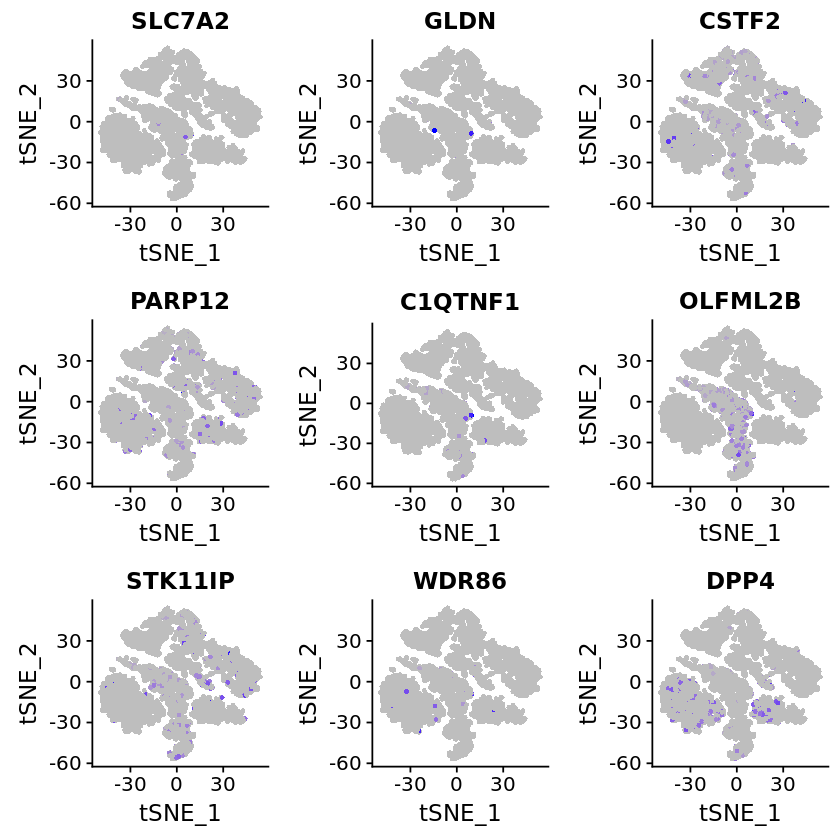

In [76]:
FeaturePlot(object = cells, features.plot = cand_ghaz1, cols.use = c("grey", "blue"), reduction.use = "tsne")

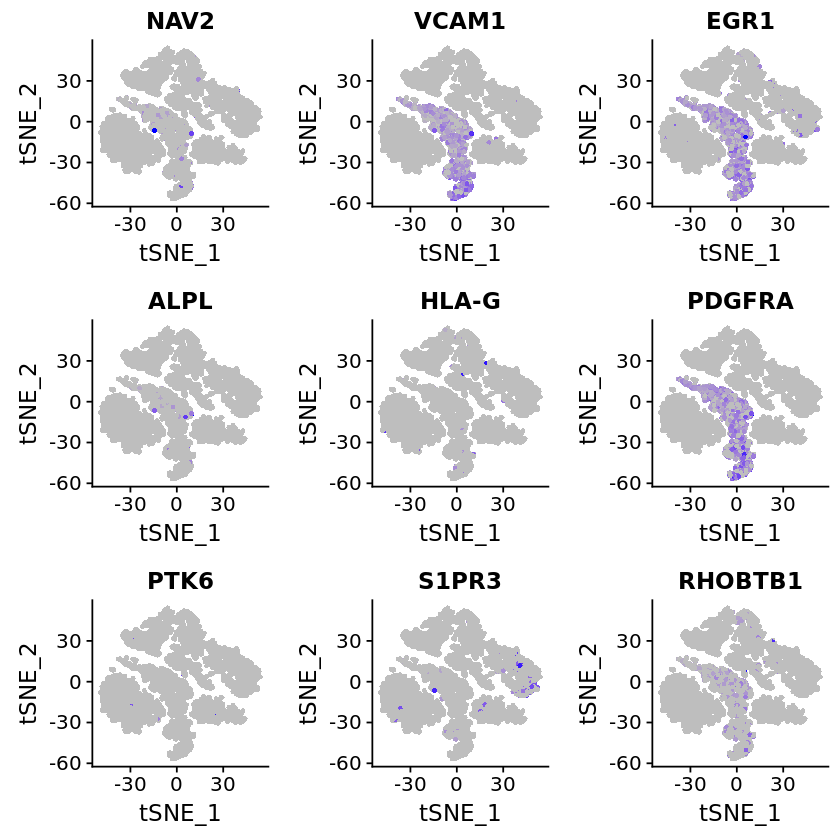

In [77]:
FeaturePlot(object = cells, features.plot = cand_ghaz2, cols.use = c("grey", "blue"), reduction.use = "tsne")

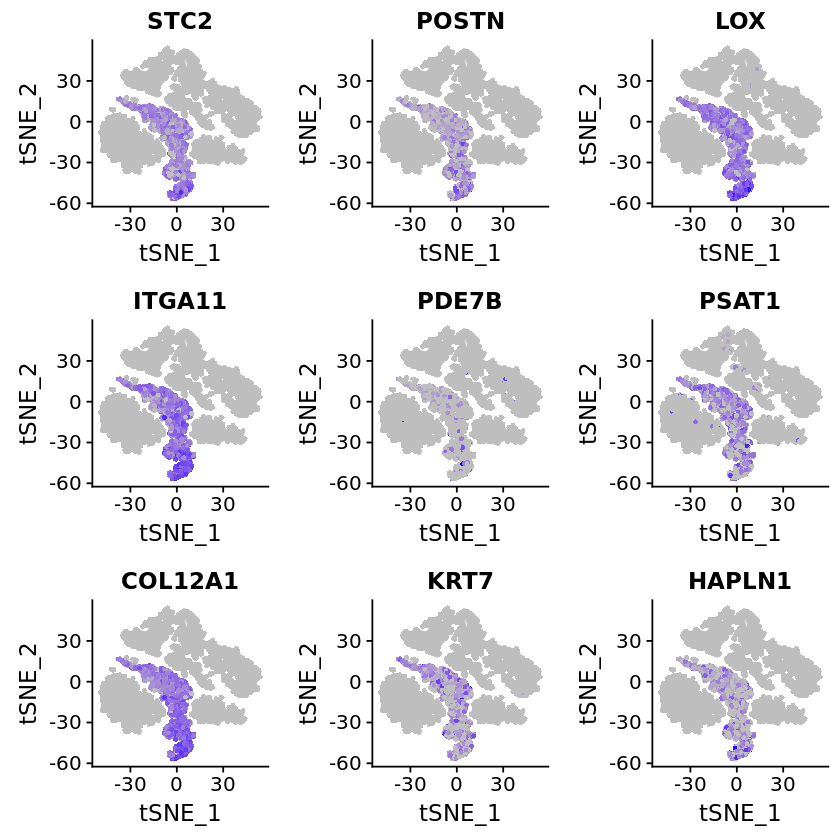

In [78]:
FeaturePlot(object = cells, features.plot = cand_ghaz3, cols.use = c("grey", "blue"), reduction.use = "tsne")

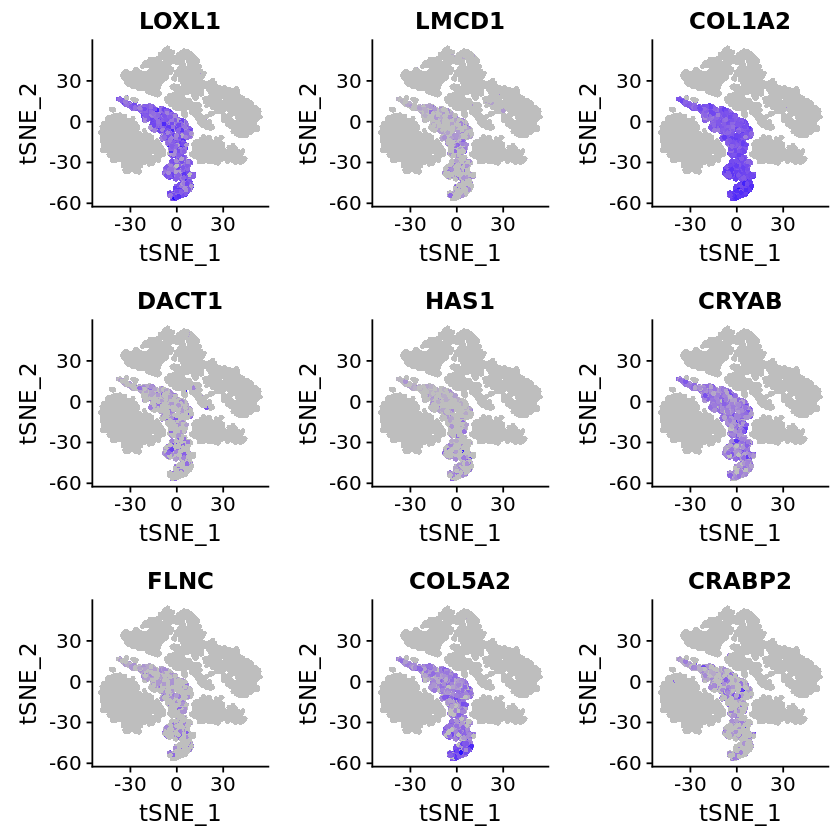

In [79]:
FeaturePlot(object = cells, features.plot = cand_ghaz4, cols.use = c("grey", "blue"), reduction.use = "tsne")

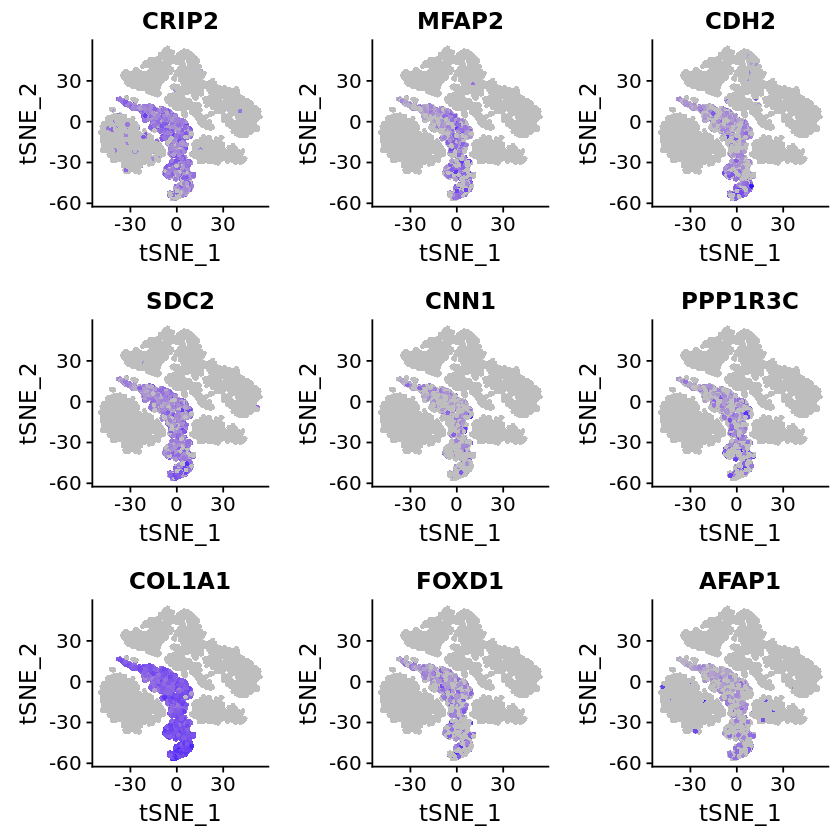

In [80]:
FeaturePlot(object = cells, features.plot = cand_ghaz5, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [81]:
cand_ghaz6 <- c('THBS3', 'COL4A1', 'CALD1', 'TRIB3', 'NUPR1', 'MFAP5', 'MYL9', 'FRMD6', 'TUBB2B')
cand_ghaz7 <- c('HSPB7', 'PALM', 'MID1', 'SLC16A5', 'CBS', 'FLRT2', 'COL5A1', 'DPYSL3', 'SYT11')
cand_ghaz8 <- c('C9orf3', 'FARP1', 'BEND6', 'PCBP4', 'SH3BP4', 'BCAR3', 'ENAH', 'TULP4', 'PTPRF')
cand_ghaz9 <- c('ALPK2', 'NUAK1', 'LOXL3', 'PALLD', 'LYPD1', 'FAM69A', 'LARGE', 'RIMS3', 'TUFT1')
cand_ghaz10 <- c('KCNK2', 'LRSAM1', 'FAT1', 'EFS', 'TP53I11', 'COMP', 'LMOD1', 'EHD2', 'SLIT3')

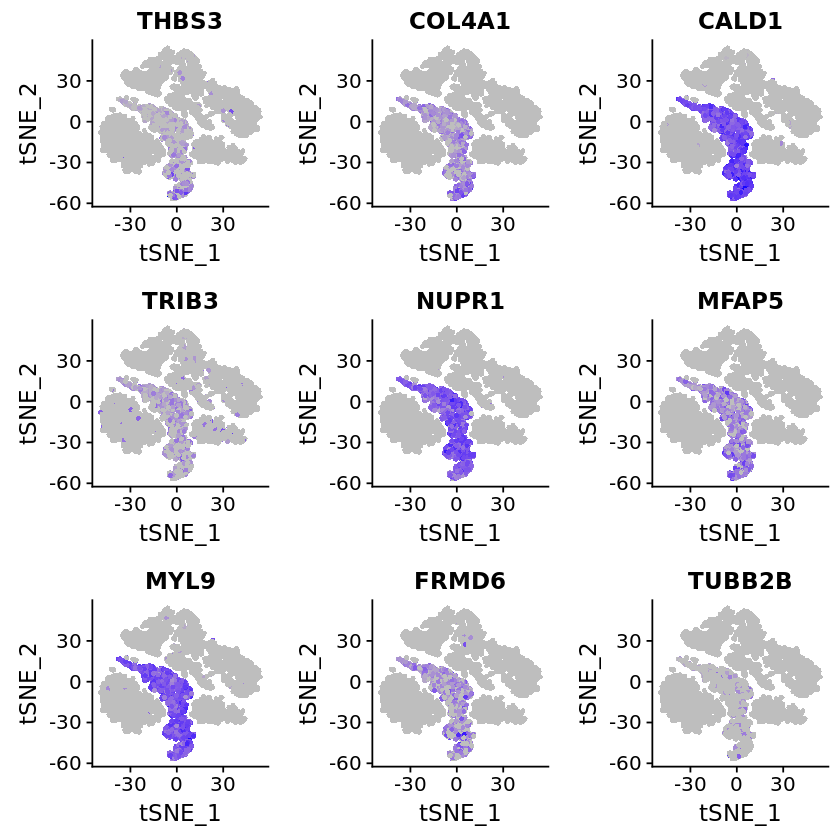

In [82]:
FeaturePlot(object = cells, features.plot = cand_ghaz6, cols.use = c("grey", "blue"), reduction.use = "tsne")

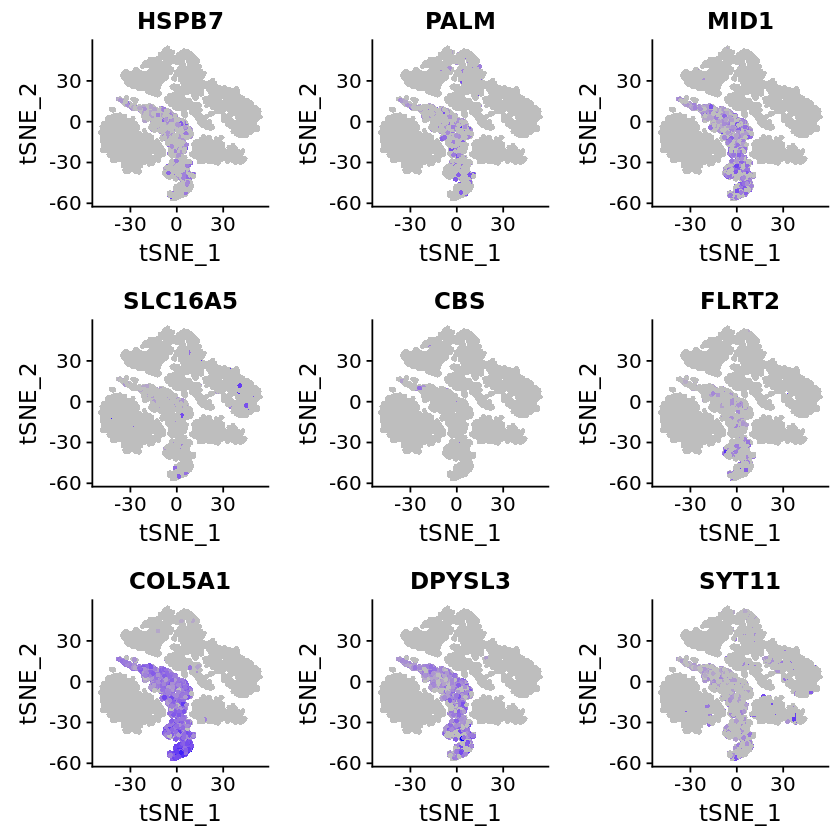

In [83]:
FeaturePlot(object = cells, features.plot = cand_ghaz7, cols.use = c("grey", "blue"), reduction.use = "tsne")

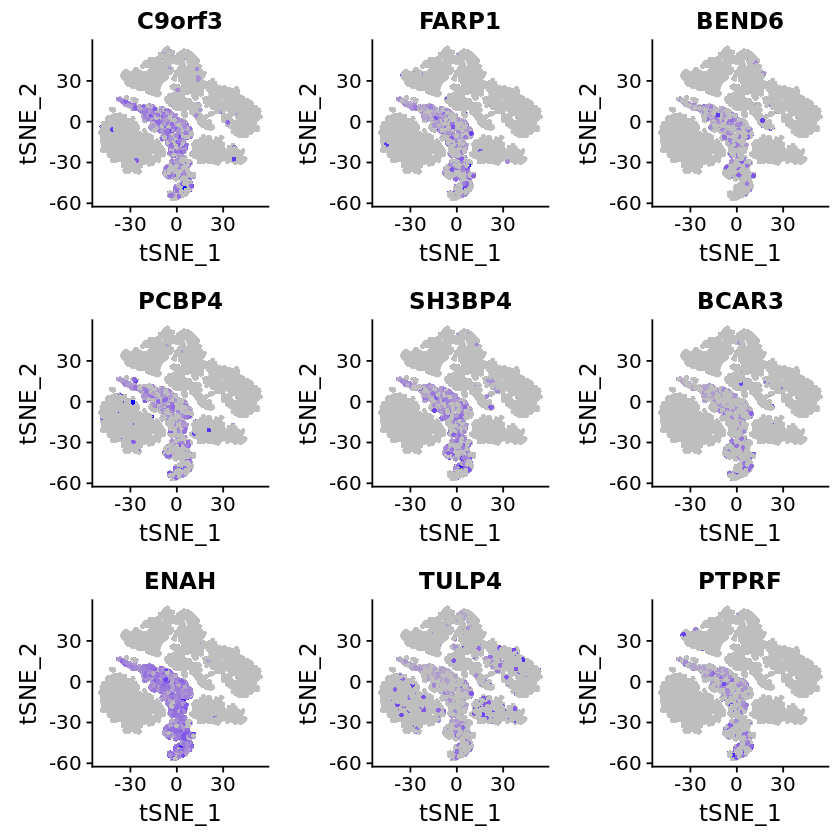

In [84]:
FeaturePlot(object = cells, features.plot = cand_ghaz8, cols.use = c("grey", "blue"), reduction.use = "tsne")

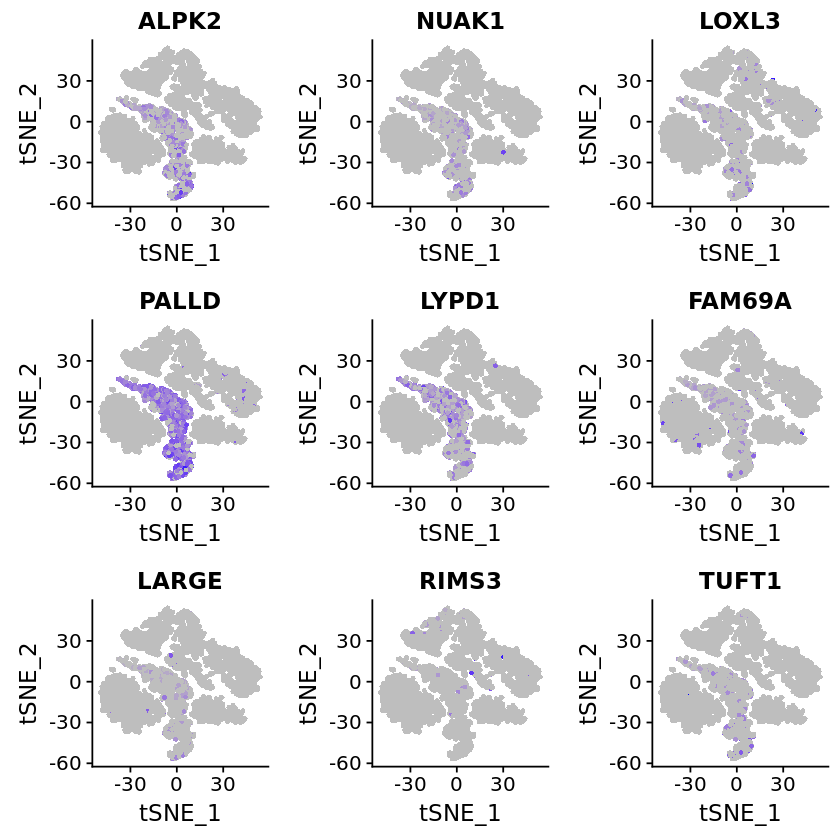

In [85]:
FeaturePlot(object = cells, features.plot = cand_ghaz9, cols.use = c("grey", "blue"), reduction.use = "tsne")

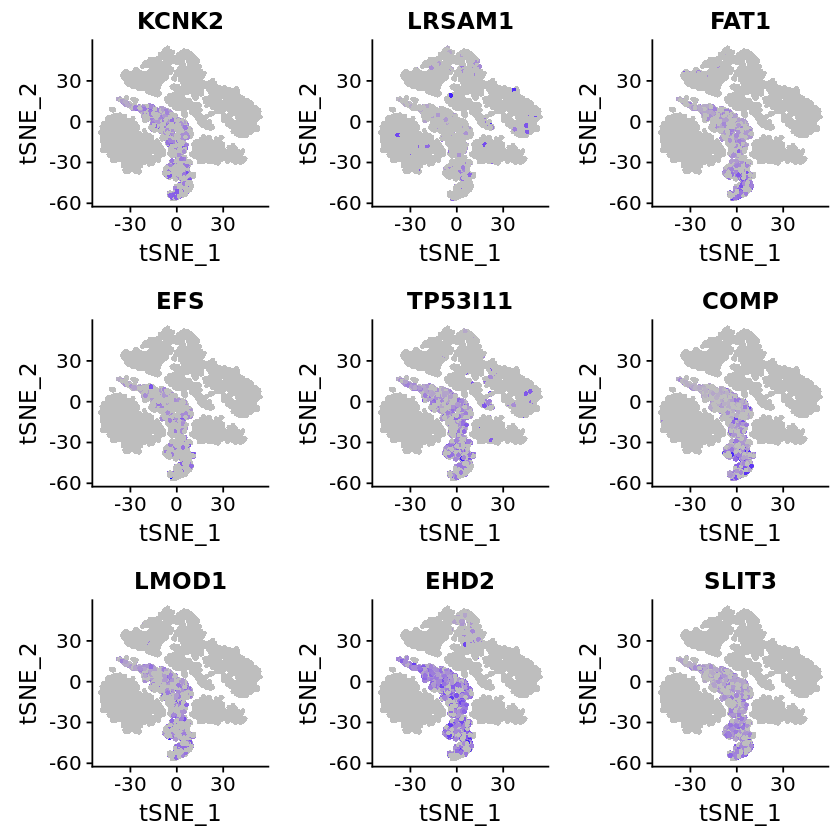

In [86]:
FeaturePlot(object = cells, features.plot = cand_ghaz10, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [88]:
cand_ghaz11 <- c('TRNP1', 'VLDLR', 'RUSC2', 'DACT3', 'KCTD15', 'GREM1', 'CBR3', 'CPA4', 'ITGBL1')
cand_ghaz12 <- c('ADCY4', 'LRRC15', 'FNDC1', 'SNTA1', 'COPZ2', 'CNTNAP1', 'FBXL7', 'MATN2', 'KRT81')
cand_ghaz13 <- c('HAS3', 'LRRC32', 'SCARF2', 'LYPD6B', 'TMEM184B', 'COL4A2', 'NTN4', 'CDC14A', 'NTM')
cand_ghaz14 <- c('GCC1', 'HSPB2', 'POFUT2', 'UNC5B', 'SCRG1', 'INHBE', 'FAM180A', 'TPM2', 'RNF150')
cand_ghaz15 <- c('PENK', 'TPD52L1', 'PTN', 'ECM1', 'P4HA3', 'P2RX6', 'SEMA4F', 'CRLF1', 'PIP5K1C')

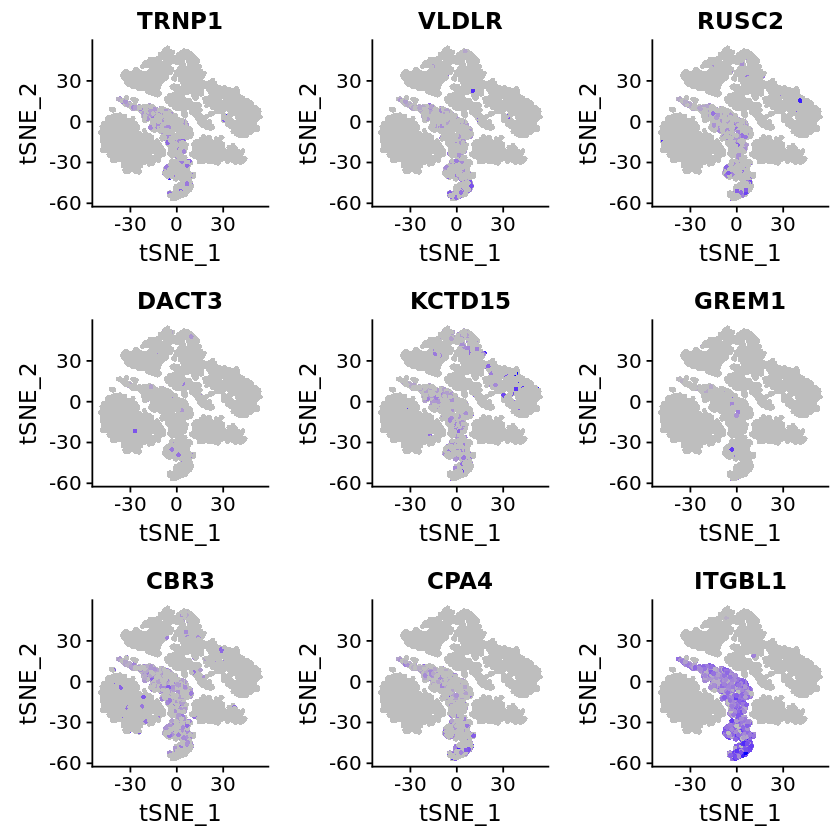

In [89]:
FeaturePlot(object = cells, features.plot = cand_ghaz11, cols.use = c("grey", "blue"), reduction.use = "tsne")

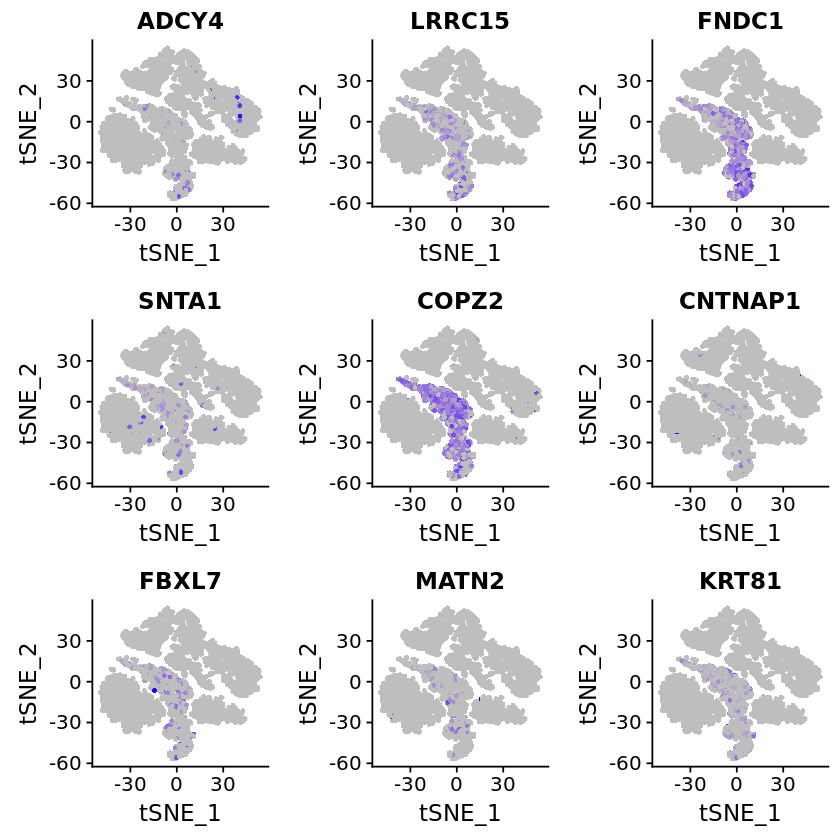

In [90]:
FeaturePlot(object = cells, features.plot = cand_ghaz12, cols.use = c("grey", "blue"), reduction.use = "tsne")

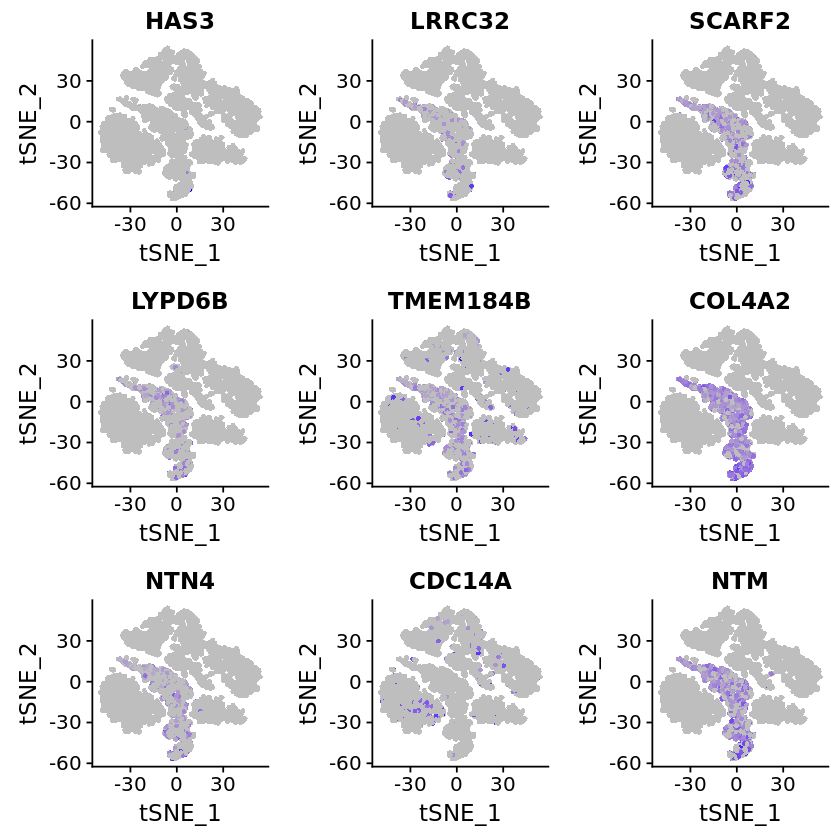

In [91]:
FeaturePlot(object = cells, features.plot = cand_ghaz13, cols.use = c("grey", "blue"), reduction.use = "tsne")

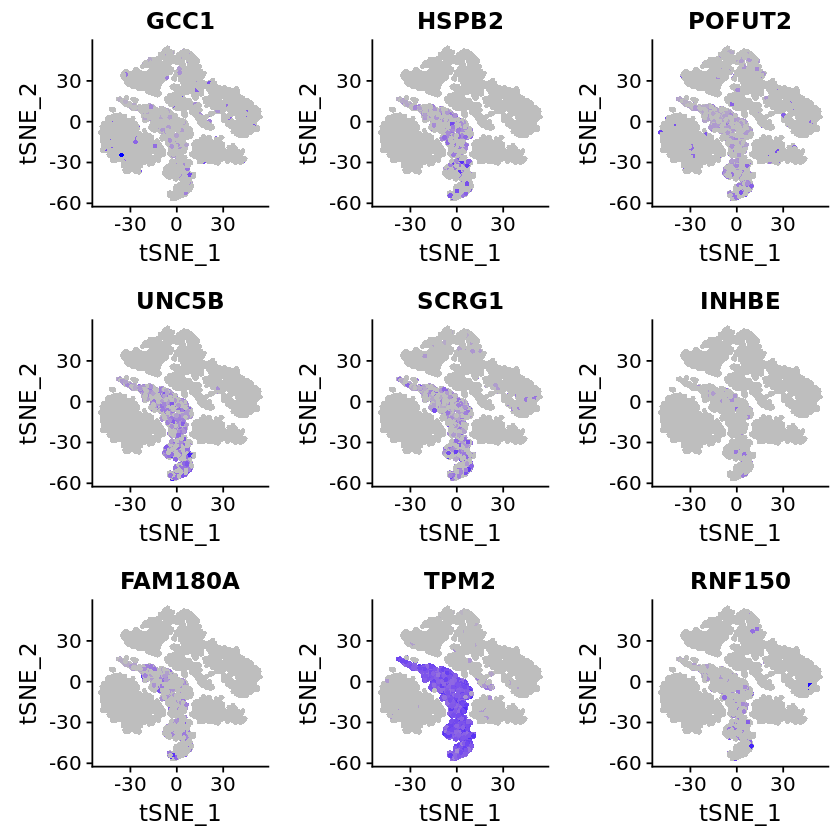

In [92]:
FeaturePlot(object = cells, features.plot = cand_ghaz14, cols.use = c("grey", "blue"), reduction.use = "tsne")

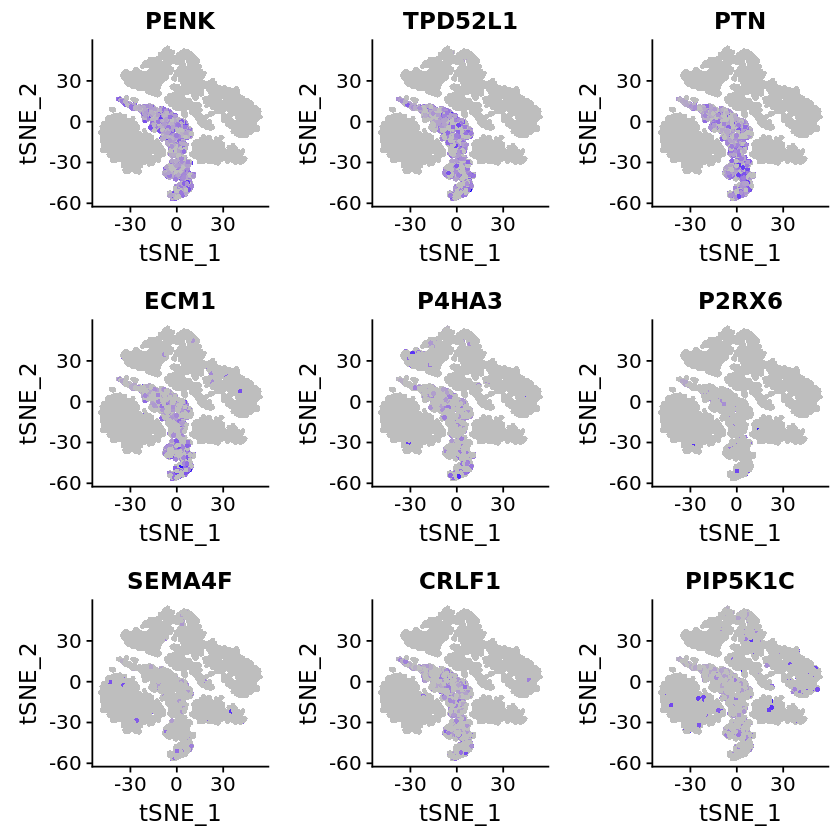

In [93]:
FeaturePlot(object = cells, features.plot = cand_ghaz15, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [94]:
cand_ghaz16 <- c('FSTL3', 'MCAM', 'GPR1', 'HSPB8', 'COL8A2', 'ATOH8', 'BAMBI', 'CDC42EP1', 'LIMCH1')
cand_ghaz17 <- c('PXDN', 'CAP2', 'THY1', 'EYA2', 'LSS', 'ZCCHC14', 'BOK', 'FAM171A1', 'KCNMA1')
cand_ghaz18 <- c('PARVA', 'LMF1', 'CTGF', 'ENC1', 'COL16A1', 'KCTD11', 'CSPG4', 'SLC1A4', 'MET')
cand_ghaz19 <- c('TMEM47', 'ADM2', 'NLRX1', 'BGN', 'PLS3', 'ISLR', 'FZD2', 'IL11', 'ZNF197')
cand_ghaz20 <- c('LAYN', 'ABI3BP', 'SORBS2', 'SASH1', 'TP53INP2')

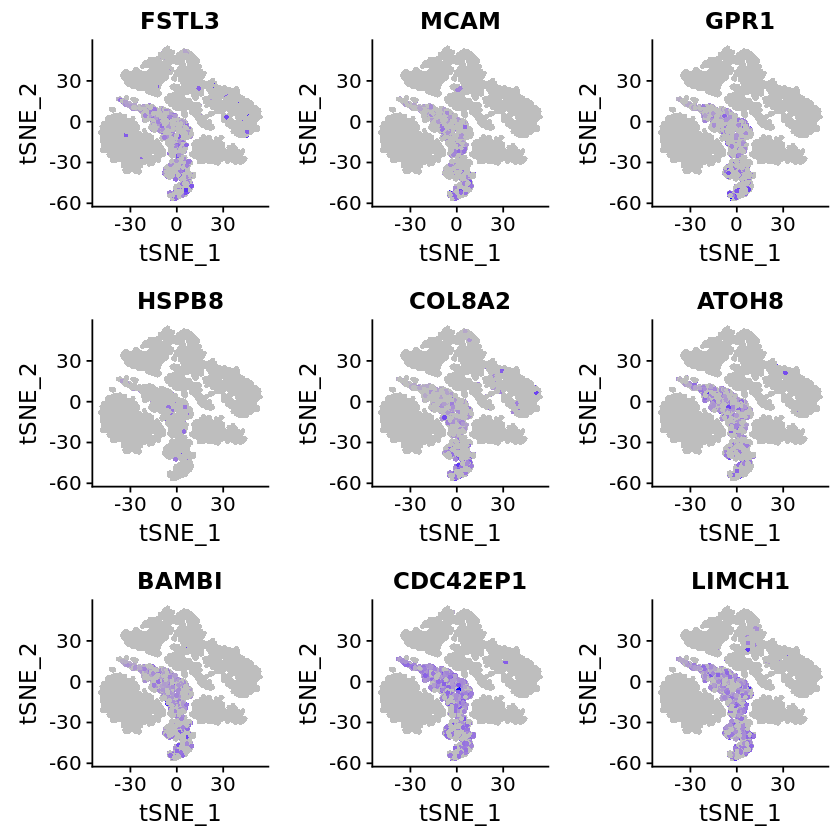

In [95]:
FeaturePlot(object = cells, features.plot = cand_ghaz16, cols.use = c("grey", "blue"), reduction.use = "tsne")

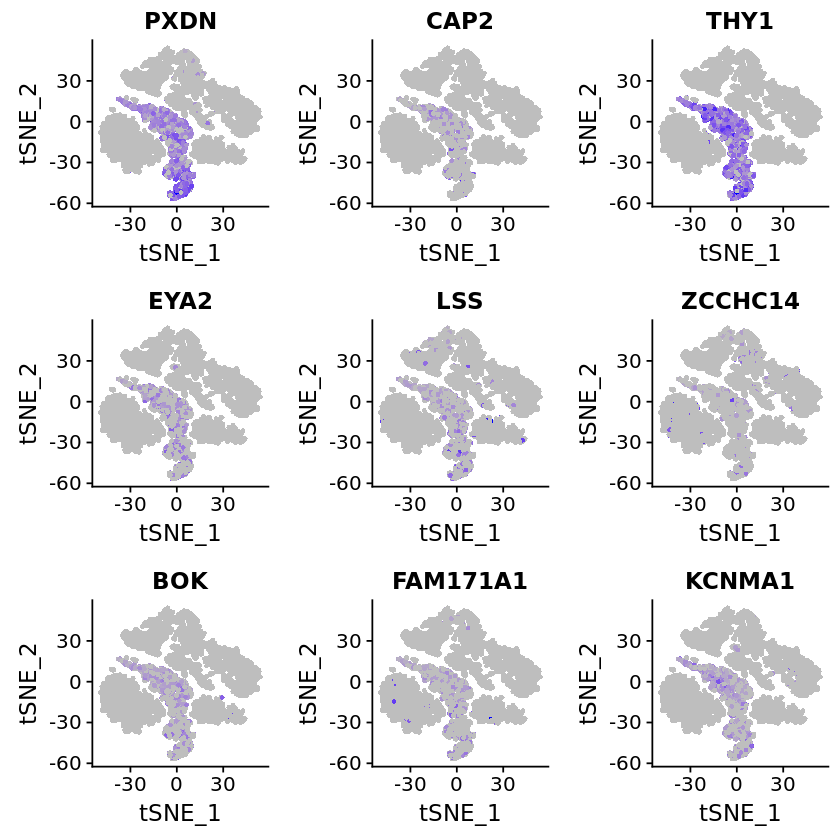

In [96]:
FeaturePlot(object = cells, features.plot = cand_ghaz17, cols.use = c("grey", "blue"), reduction.use = "tsne")

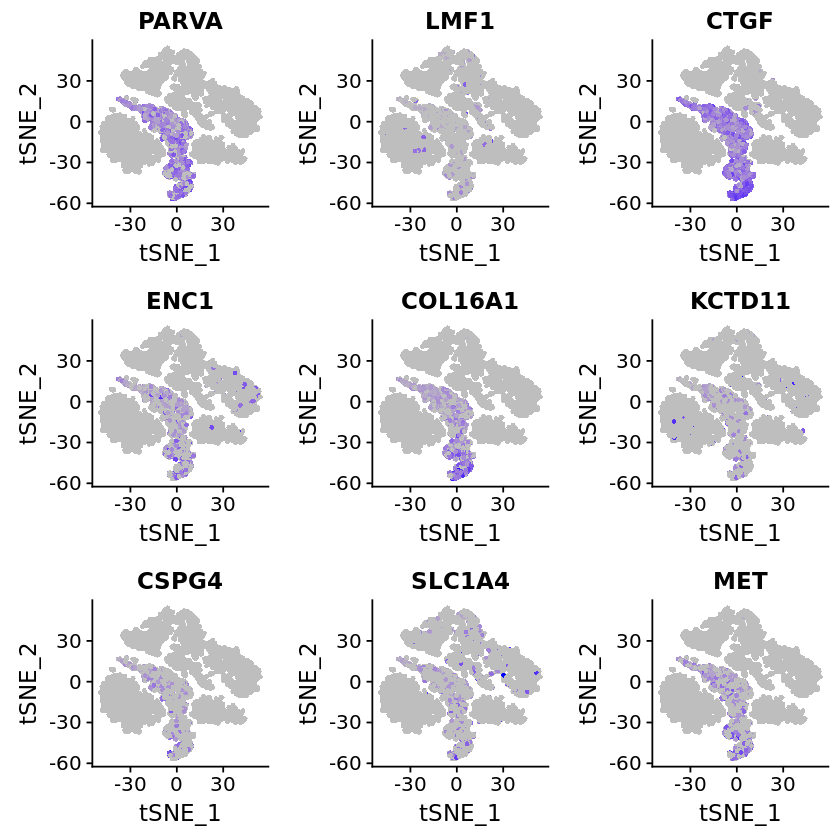

In [97]:
FeaturePlot(object = cells, features.plot = cand_ghaz18, cols.use = c("grey", "blue"), reduction.use = "tsne")

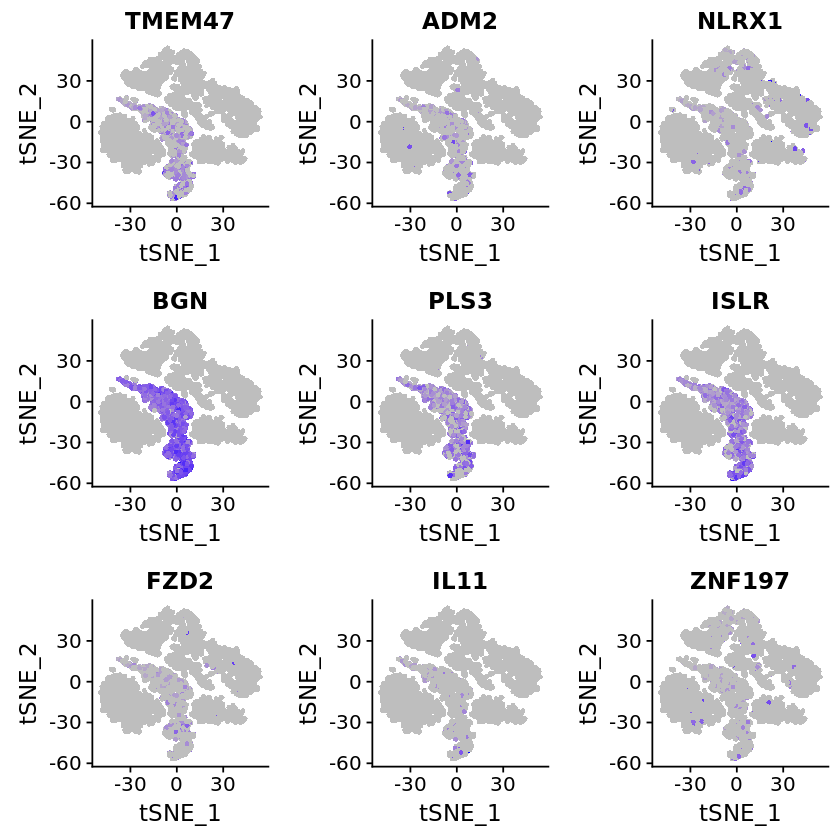

In [98]:
FeaturePlot(object = cells, features.plot = cand_ghaz19, cols.use = c("grey", "blue"), reduction.use = "tsne")

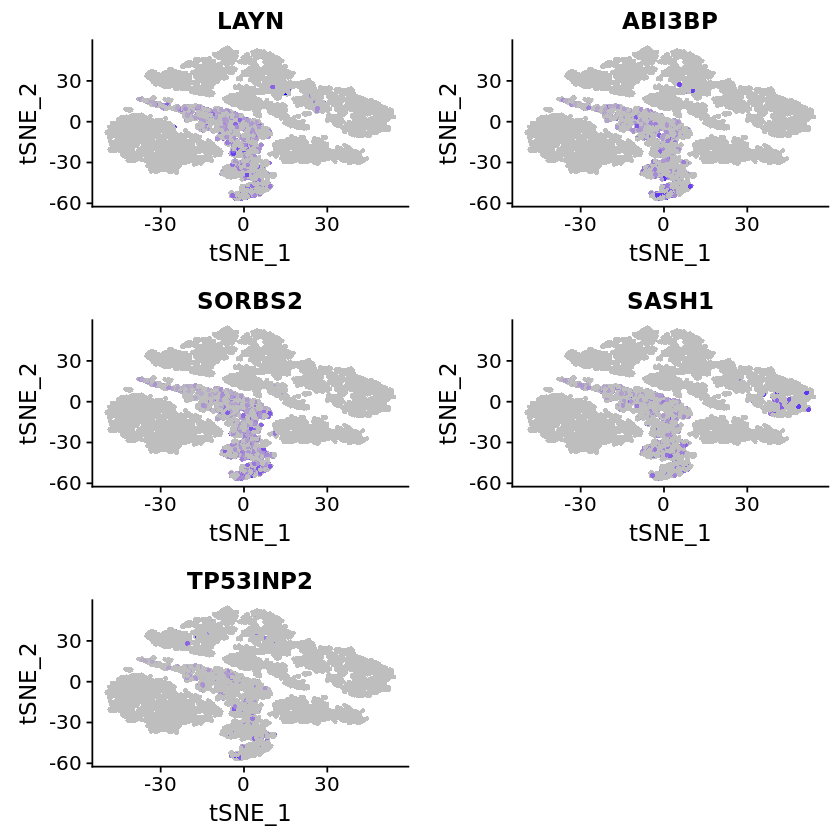

In [99]:
FeaturePlot(object = cells, features.plot = cand_ghaz20, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [87]:
# Get list of Ghazanfari et al. cluster 3 and 5 genes
# subset cells@data[ghaz_genes, ]
# find genes that are expressed in mscs at __ rate
#     -of these genes, which are expressed in < 10% of cells in other clusters (not 1, 5, 9)

### Ghazanfari et al. transcription factors relevant to BM-MSCs
The list of genes was taken from Table 1 of the main text. "Next, to more specifically identify possible regulatory molecules relevant to BM-MSC properties, transcription factors were identified among the genes in clusters 3 and 5 (Table 1). Some of these transcription factors have been reported to play a role in the regulation of BM-MSCs or other stem cells, including: FOS, FOSB, HMGB3, EGR1, PPARG, ATF4, NFE2L1 and SOX4." Ghazanfari et al. 2017

In [141]:
ghaz_clust3_TFs <- c("FOS", "FOSB", "TBP", "HMGB3", "RFX5", "HLX", "EGR1", "PPARG")
ghaz_clust5_TFs <- c("FOXD1", "ATF4", "NFE2L1", "ZFHX3", "ID3", "ID2", "ATOH8", "CREB3L2", "SOX4", "ZNF197")
# Not found: TULP

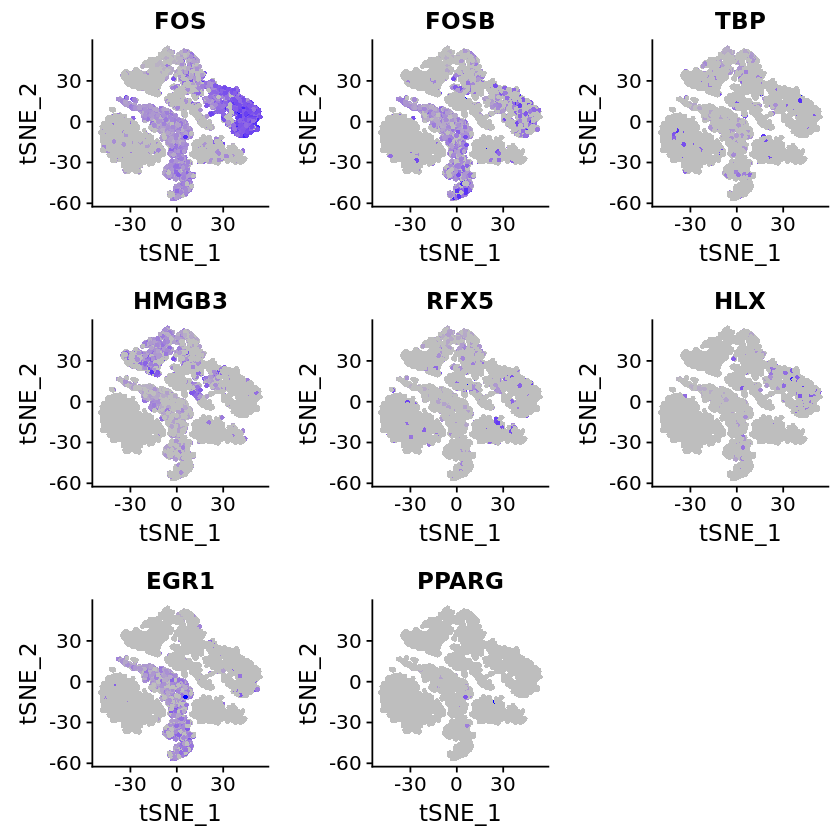

In [142]:
FeaturePlot(object = cells, features.plot = ghaz_clust3_TFs, cols.use = c("grey", "blue"), reduction.use = "tsne")

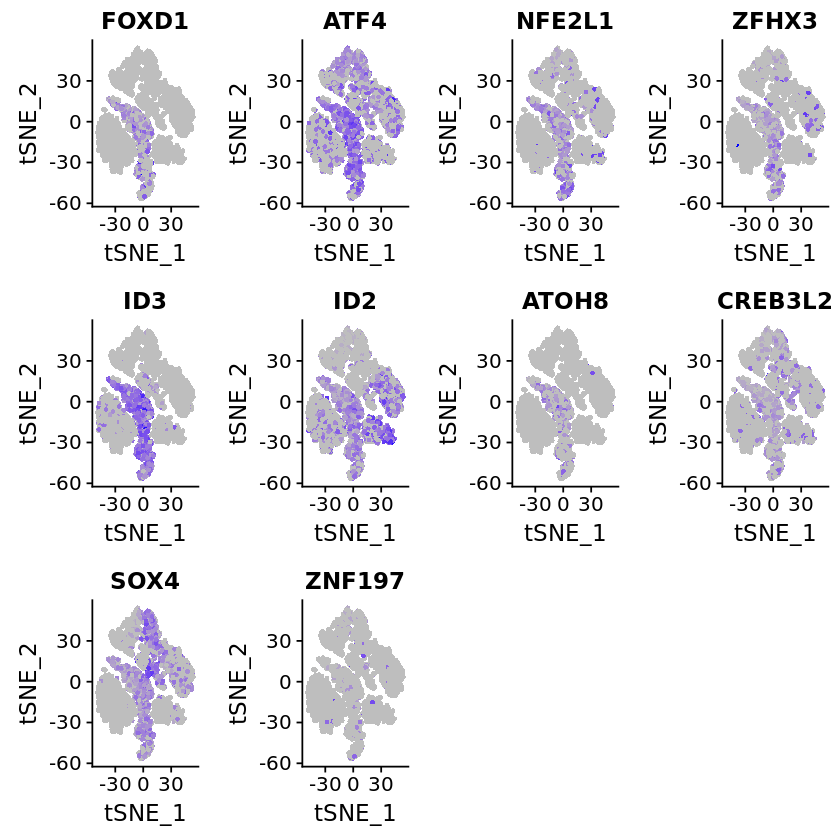

In [144]:
FeaturePlot(object = cells, features.plot = ghaz_clust5_TFs, cols.use = c("grey", "blue"), reduction.use = "tsne",
            png.file = "ghaz_clust5_TFs.png")

## Highly expressed genes in Ghazanfari et al. for uncultured MSCs
* Obtained from transcriptome of primary MSCs "Ghazanfari_Primary-MSCs.xlsx"
* Filtered by pval = 0 and expression > 10,000 in all samples

In [114]:
#highexp_ghaz <- c("LAIR1", "TMSB4X", "RPL18A", "CLUAP1", "GNB2L1", "RPLP2", "RPL18", "OAZ1", "RPS16", 
#                  "RPL6", "RPL32", "PSAP", "KIAA0101", "FAM177A1", "MSH3", "PDCD7", "ZNF674", "VCAM1")
#highexp_ghaz <- c("CFD", "PSAP", "TF", "TXNIP", "VCAM1", "THY1", "MCAM", "ALCAM", "SHCBP1")
# 3x greater avg expression in primary cells vs. cultured cells
#highexp_ghaz <- c("ADCY3", "ALOX5AP", "ARHGDIB", "BPI", "CAMP", "CD74", "CXCL12", "CXCL16", "DEFA1B")
# Not found: "LOC91561", "LOC388474", "LOC100129758", "F2RIMAA", "LOC401019", "LOC440733", "NAG18", "LOC100132593",
# "ANXA2P2", "C19orf31", "LOC100133465", "LOC729439", "ORC6L", "RRP7B", "LOC100133876", "RN7SL1", "MGC16703GGA1"

In [92]:
#FeaturePlot(object = cells, features.plot = highexp_ghaz, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [122]:
#highexp_ghaz2 <- c("EBF3", "FCN1", "FCRLA", "FOLR3", "GMFG", "HCST", "HERC5", "HLA-DMA", "HLA-DMB")

In [146]:
#FeaturePlot(object = cells, features.plot = highexp_ghaz2, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [136]:
#highexp_ghaz3 <- c("IRF7", "IRF8", "ITGB2", "LCN2", "LCP1", "LEPR", "LTBP2", "PADI4", "PLAC8")

In [147]:
#FeaturePlot(object = cells, features.plot = highexp_ghaz3, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [175]:
#highexp_ghaz4 <- c("PLEK", "PSMB10", "RAC2", "S100A8", "S100A9", "TYROBP", "YTHDC1", "HBB")

In [148]:
#FeaturePlot(object = cells, features.plot = highexp_ghaz4, cols.use = c("grey", "blue"), reduction.use = "tsne")

In [185]:
#test <- c("TAGLN", "NUPR1", "CALD1", "FN1", "SPARC", "NNMT", "TPM2", "SERPINE2", "IGFBP3")

In [149]:
#test <- c("CD14", "FCGR3A", "FCGR3B", "CD34")
#FeaturePlot(object = cells, features.plot = test, cols.use = c("grey", "blue"), reduction.use = "tsne")

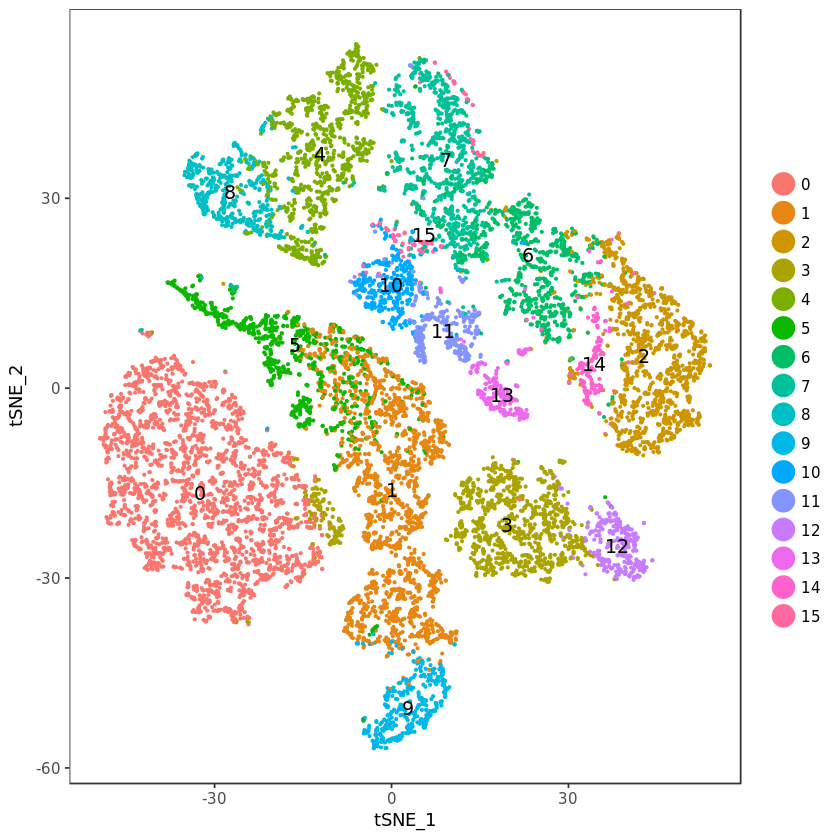

In [46]:
#png(filename = "OriginalClustering_bmac_msc_noJTW02.png",
#    width = 1500, height = 1500, units = "px", res = 300)
TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5)
#dev.off()

## Observations
* Based on transcriptional profiles provided by Jia et al. 2002, Silva et al. 2003, and Dominici et al. 2006, clusters 1, 5, and 9 exhibit transcriptional characteristics of MSCs.
* Clusters 1, 5 and 9 appear to be closely related as they are grouped together on the tSNE plot.
* Clusters 1, 5, and 9 don't match the surface marker description of MSCs provided by Ghazanfari et al. 2017.
* The same clusters only match half of the conventional markers for primary BM-MSCs.
* Genes expressed in Ghazanfari et al. cluster 3 have seemingly random expression in this data set
* Many of the genes listed in Ghazanfari et al. cluster 5 are highly expressed only in clusters 1, 5, and 9. "Cluster 5 consisted of genes mainly inovlved in cell adhesion, cytoskeleton organization, cell motion, and vasculature development." (Ghazandari et al.)
* About half of the transcription factors from Ghazanfari et al. are expressed in clusters 1, 5, and 9. However, they are not exclusive to these clusters and also show up in other clusters. 

## Sample composition of clusters 1, 5, and 9

In [3]:
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,labels,pt.size
AAACCTGAGAAACCAT-1,5360,41716,bmac_msc_nojtw02,JTW01,0.02879543,5,5,14,10,18,Cultured MSCs,0.5
AAACCTGAGCGATTCT-1,2309,7932,bmac_msc_nojtw02,JTW01,0.08827238,8,9,10,5,11,Cultured MSCs,0.5
AAACCTGCACAAGCCC-1,3437,14686,bmac_msc_nojtw02,JTW01,0.02404468,1,1,3,8,7,Cultured MSCs,0.5
AAACCTGCAGATGAGC-1,3773,21028,bmac_msc_nojtw02,JTW01,0.03143876,5,5,1,17,9,Cultured MSCs,0.5
AAACCTGGTGCGCTTG-1,3978,21707,bmac_msc_nojtw02,JTW01,0.03382021,1,1,3,8,12,Cultured MSCs,0.5
AAACCTGTCACCACCT-1,6547,58719,bmac_msc_nojtw02,JTW01,0.02635434,5,5,14,10,18,Cultured MSCs,0.5


In [79]:
tiff(filename = "20190207_Figures/Fig1_bmac_msc.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
p <- DimPlot(object = cells, reduction.use = "tsne", group.by = "library_id", pt.size = 0.05, do.return = TRUE, no.legend = TRUE)
plot(p)
dev.off()

png 
  2

In [9]:
pbuild <- ggplot_build(p)
pdata <- pbuild$data[[1]]

In [10]:
unique(pdata$colour)

[1] "#F8766D" "#D89000" "#A3A500" "#39B600" "#00BF7D" "#00BFC4" "#00B0F6"
 [8] "#9590FF" "#E76BF3" "#FF62BC"

In [46]:
cells@meta.data$labels <- rep("Cultured MSCs", nrow(cells@meta.data))
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,labels,pt.size,Dominici,Ghaz_surf,Jia,Silva,Silva78
AAACCTGAGAAACCAT-1,5360,41716,bmac_msc_nojtw02,JTW01,0.02879543,5,5,14,10,18,Cultured MSCs,0.5,yes,no,yes,no,yes
AAACCTGAGCGATTCT-1,2309,7932,bmac_msc_nojtw02,JTW01,0.08827238,8,9,10,5,11,Cultured MSCs,0.5,no,no,yes,no,yes
AAACCTGCACAAGCCC-1,3437,14686,bmac_msc_nojtw02,JTW01,0.02404468,1,1,3,8,7,Cultured MSCs,0.5,no,no,no,no,no
AAACCTGCAGATGAGC-1,3773,21028,bmac_msc_nojtw02,JTW01,0.03143876,5,5,1,17,9,Cultured MSCs,0.5,no,no,yes,no,yes
AAACCTGGTGCGCTTG-1,3978,21707,bmac_msc_nojtw02,JTW01,0.03382021,1,1,3,8,12,Cultured MSCs,0.5,no,no,no,no,yes
AAACCTGTCACCACCT-1,6547,58719,bmac_msc_nojtw02,JTW01,0.02635434,5,5,14,10,18,Cultured MSCs,0.5,yes,no,yes,no,yes


In [47]:
cells@meta.data$labels[which(cells@meta.data$library_id != "JTW01")] <- rep("BMAC", length(which(cells@meta.data$library_id != "JTW01")))

In [48]:
cells@meta.data$labels[which(cells@meta.data$res.0.6 %in% c(1, 5, 9) & cells@meta.data$library_id != "JTW01")] <- rep("Possible MSCs", length(which(cells@meta.data$res.0.6 %in% c(1, 5, 9) & cells@meta.data$library_id != "JTW01")))

In [49]:
cells@meta.data[which(cells@meta.data$labels == "Possible MSCs"),]

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,labels,pt.size,Dominici,Ghaz_surf,Jia,Silva,Silva78
AGGGTGAAGCACCGCT-3,2527,8559,bmac_msc_nojtw02,JTW03,0.04002347,1,1,3,5,7,Possible MSCs,2,no,no,no,no,no
TTTACTGGTAATCACC-3,3597,17555,bmac_msc_nojtw02,JTW03,0.03698006,5,5,1,17,9,Possible MSCs,2,no,no,no,no,no
ACGCCGACAGGTGCCT-4,2044,5053,bmac_msc_nojtw02,JTW05,0.13996828,5,5,1,17,9,Possible MSCs,2,no,no,no,no,no
GTCAAGTTCAGCTGGC-4,2109,5111,bmac_msc_nojtw02,JTW05,0.02573238,1,1,3,5,7,Possible MSCs,2,no,no,no,no,no
GTGGGTCAGACGACGT-4,2701,7180,bmac_msc_nojtw02,JTW05,0.04534471,1,1,3,5,7,Possible MSCs,2,no,yes,no,no,no
CCGGTAGGTTAAGTAG-5,2514,6608,bmac_msc_nojtw02,JTW06,0.02165233,1,1,3,5,7,Possible MSCs,2,no,no,no,no,no
GACTGCGTCTACCAGA-5,4506,24001,bmac_msc_nojtw02,JTW06,0.04109018,5,5,1,17,9,Possible MSCs,2,no,no,no,no,no
AAATGCCCACCTGGTG-6,1874,4759,bmac_msc_nojtw02,JTW07,0.02735115,5,5,1,17,9,Possible MSCs,2,no,no,no,no,no
CACAGGCTCAGAGCTT-8,2539,8578,bmac_msc_nojtw02,JTW10,0.04351884,5,5,1,17,9,Possible MSCs,2,no,no,no,no,no
CGACTTCGTGCTAGCC-8,2027,6764,bmac_msc_nojtw02,JTW10,0.07363596,5,5,14,10,18,Possible MSCs,2,no,no,no,no,no


In [50]:
table(cells@meta.data$labels)


         BMAC Cultured MSCs Possible MSCs 
         9290          2978            11 

In [55]:
cells@meta.data$pt.size <- rep(0.05, nrow(cells@meta.data))

In [56]:
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,labels,pt.size,Dominici,Ghaz_surf,Jia,Silva,Silva78
AAACCTGAGAAACCAT-1,5360,41716,bmac_msc_nojtw02,JTW01,0.02879543,5,5,14,10,18,Cultured MSCs,0.05,yes,no,yes,no,yes
AAACCTGAGCGATTCT-1,2309,7932,bmac_msc_nojtw02,JTW01,0.08827238,8,9,10,5,11,Cultured MSCs,0.05,no,no,yes,no,yes
AAACCTGCACAAGCCC-1,3437,14686,bmac_msc_nojtw02,JTW01,0.02404468,1,1,3,8,7,Cultured MSCs,0.05,no,no,no,no,no
AAACCTGCAGATGAGC-1,3773,21028,bmac_msc_nojtw02,JTW01,0.03143876,5,5,1,17,9,Cultured MSCs,0.05,no,no,yes,no,yes
AAACCTGGTGCGCTTG-1,3978,21707,bmac_msc_nojtw02,JTW01,0.03382021,1,1,3,8,12,Cultured MSCs,0.05,no,no,no,no,yes
AAACCTGTCACCACCT-1,6547,58719,bmac_msc_nojtw02,JTW01,0.02635434,5,5,14,10,18,Cultured MSCs,0.05,yes,no,yes,no,yes


In [57]:
cells@meta.data$pt.size[which(cells@meta.data$labels == "Possible MSCs")] <- rep(2, length(which(cells@meta.data$labels == "Possible MSCs")))

In [91]:
p1 <- DimPlot(object = cells, reduction.use = "tsne", group.by = "labels", pt.size = 0.05, do.return = TRUE,
        plot.order = "Possible MSCs", cols.use = c("grey", "blue", "green"), no.legend = TRUE) #+ ggtitle("Clustering BMAC cells with cultured MSCs") 
tiff(filename = "20190207_Figures/Fig4_BMACClusteredWithMSCs.tiff",
    width = 1500, height = 1500, units = "px", res = 300)
plot(p1)
dev.off()

png 
  2

In [131]:
# Check cells@meta.data$res.0.6
clust1_4_9 <- which(cells@meta.data$res.0.6 %in% c(1, 4, 9))
length(clust1_4_9)
table(cells@meta.data$library_id[clust1_4_9])

[1] 2994


JTW01 JTW02 JTW03 JTW05 JTW06 JTW07 JTW10  MG02 
 2977     5     2     3     2     1     3     1 

In [163]:
# Do JTW01 cells show up in any other clusters?
jtw01_samples <- which(cells@meta.data$library_id == "JTW01")
length(jtw01_samples)
table(cells@meta.data$res.0.6[jtw01_samples])

[1] 2978


   1   15    5    9 
1733    1  848  396 

* The majority of clusters 1, 5, and 9 are made up of JTW01. However there are a few cells from other samples that clustered with the purchased MSC samples.
* 1 JTW01 cell shows up in cluster 15. All other JTW01 cells are in clusters 1, 5 and 9.

In [2]:
#save(cells, file = "bmac_msc_nojtw02_cells.RData")
load(file = "bmac_msc_nojtw02_cells.RData")

In [4]:
ghaz_42genes <- c("VCAM1", "PDGFRA", "COL8A1", "STC2", "POSTN", "LOX", "ITGA11", "PSAT1", "COL12A1", "LOXL1", "COL1A2", "CRYAB", "COL5A2", "CRIP2", "CDH2", "SDC2", "COL1A1", "COL4A1", "CALD1", "NUPR1", "MFAP5", "MYL9", "FRMD6", "COL5A1", "DPYSL3", "ENAH", "PALLD", "COMP", "SLIT3", "ITGBL1", "FNDC1", "COL4A2", "NTM", "PENK", "PTN", "PXDN", "THY1", "PARVA", "CTGF", "COL16A1", "BGN", "ISLR")


In [6]:
ghaz42 <- cells@scale.data[ghaz_42genes,]
dim(ghaz42)
head(ghaz42)

[1]    42 12279

,AAACCTGAGAAACCAT-1,AAACCTGAGCGATTCT-1,AAACCTGCACAAGCCC-1,AAACCTGCAGATGAGC-1,AAACCTGGTGCGCTTG-1,AAACCTGTCACCACCT-1,AAACCTGTCGCCCTTA-1,AAACGGGAGCGATAGC-1,AAACGGGAGTCCGTAT-1,AAACGGGAGTGCGTGA-1,⋯,TTGGCAATCGAATGCT-11,TTGTAGGCATAAAGGT-11,TTTACTGCAAGCCGTC-11,TTTACTGGTTGACGTT-11,TTTCCTCAGGACAGCT-11,TTTCCTCGTATAGGGC-11,TTTCCTCGTGGCCCTA-11,TTTCCTCTCACCAGGC-11,TTTGCGCAGCGTCAAG-11,TTTGGTTCAATGGAGC-11
VCAM1,-0.03381378,-0.8207613,1.5583121,0.1172356,-0.8513538,-0.83737807,-0.79176859,0.3230366,2.2600633,1.022775,⋯,-0.09134223,-0.2141698,-0.1059618,-0.4431499,-0.4135608,-0.2725355,-0.08520849,-0.1409397,-0.4034817,-1.257533
PDGFRA,0.82596526,-0.5849023,2.0854613,0.2534931,-1.0182677,0.86697454,0.14627510,1.5556195,0.1753730,4.538995,⋯,-0.07799415,-0.2566528,-0.1373623,-0.2414095,-0.5553089,-0.1663856,-0.14482900,-0.1438098,-0.2212716,-1.252831
COL8A1,-1.61443544,2.3656686,1.5838959,-0.2749187,0.9561478,-0.85506162,-0.06950623,1.1076450,-0.4112293,1.722040,⋯,-0.13114697,-0.3303849,-0.1882644,-0.3964708,-0.6613833,-0.2715035,-0.18760932,-0.2060529,-0.3650533,-1.565696
STC2,0.03444181,2.8884676,0.1759352,0.6745925,2.1406377,-1.71952854,3.66965165,0.6970319,-0.6398352,2.690043,⋯,-0.08003587,-0.2907560,-0.1386227,-0.3773091,-0.6404173,-0.2368588,-0.13612893,-0.1595612,-0.3422846,-1.622199
POSTN,-0.42972425,3.0039674,2.7001219,-0.1232243,2.4951593,-0.05845036,0.29108791,-0.7104926,-0.6716910,2.353209,⋯,-0.09752448,-0.2251065,-0.1253568,-0.3473441,-0.4350806,-0.2275932,-0.11629763,-0.1469420,-0.3186073,-1.135784
LOX,-0.48004609,2.0264567,0.8725289,2.2240763,0.2279984,-1.40604562,0.95813440,1.0931751,0.7241553,1.188182,⋯,-0.08867987,-0.3108263,-0.1494082,-0.4115363,-0.6792133,-0.2587657,-0.14575623,-0.1726893,-0.3735920,-1.728634


In [7]:
write.table(ghaz42, file = "BMAC_MSCs_ghaz_42genes.txt", quote = FALSE, 
            sep = "\t", row.names = TRUE, col.names = NA)

## Find IDs of cells that cluster with MSCs (not in JTW01)

In [3]:
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,labels,pt.size
AAACCTGAGAAACCAT-1,5360,41716,bmac_msc_nojtw02,JTW01,0.02879543,5,5,14,10,18,Cultured MSCs,0.5
AAACCTGAGCGATTCT-1,2309,7932,bmac_msc_nojtw02,JTW01,0.08827238,8,9,10,5,11,Cultured MSCs,0.5
AAACCTGCACAAGCCC-1,3437,14686,bmac_msc_nojtw02,JTW01,0.02404468,1,1,3,8,7,Cultured MSCs,0.5
AAACCTGCAGATGAGC-1,3773,21028,bmac_msc_nojtw02,JTW01,0.03143876,5,5,1,17,9,Cultured MSCs,0.5
AAACCTGGTGCGCTTG-1,3978,21707,bmac_msc_nojtw02,JTW01,0.03382021,1,1,3,8,12,Cultured MSCs,0.5
AAACCTGTCACCACCT-1,6547,58719,bmac_msc_nojtw02,JTW01,0.02635434,5,5,14,10,18,Cultured MSCs,0.5


In [4]:
pos_mscs <- which(cells@meta.data$res.0.6 %in% c(1, 5, 9) & cells@meta.data$library_id != "JTW01")
length(pos_mscs) #should = 11

[1] 11

In [5]:
cells@meta.data[which(cells@meta.data$labels == "Possible MSCs"),]

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,labels,pt.size
AGGGTGAAGCACCGCT-3,2527,8559,bmac_msc_nojtw02,JTW03,0.04002347,1,1,3,5,7,Possible MSCs,2
TTTACTGGTAATCACC-3,3597,17555,bmac_msc_nojtw02,JTW03,0.03698006,5,5,1,17,9,Possible MSCs,2
ACGCCGACAGGTGCCT-4,2044,5053,bmac_msc_nojtw02,JTW05,0.13996828,5,5,1,17,9,Possible MSCs,2
GTCAAGTTCAGCTGGC-4,2109,5111,bmac_msc_nojtw02,JTW05,0.02573238,1,1,3,5,7,Possible MSCs,2
GTGGGTCAGACGACGT-4,2701,7180,bmac_msc_nojtw02,JTW05,0.04534471,1,1,3,5,7,Possible MSCs,2
CCGGTAGGTTAAGTAG-5,2514,6608,bmac_msc_nojtw02,JTW06,0.02165233,1,1,3,5,7,Possible MSCs,2
GACTGCGTCTACCAGA-5,4506,24001,bmac_msc_nojtw02,JTW06,0.04109018,5,5,1,17,9,Possible MSCs,2
AAATGCCCACCTGGTG-6,1874,4759,bmac_msc_nojtw02,JTW07,0.02735115,5,5,1,17,9,Possible MSCs,2
CACAGGCTCAGAGCTT-8,2539,8578,bmac_msc_nojtw02,JTW10,0.04351884,5,5,1,17,9,Possible MSCs,2
CGACTTCGTGCTAGCC-8,2027,6764,bmac_msc_nojtw02,JTW10,0.07363596,5,5,14,10,18,Possible MSCs,2


In [6]:
pos_mscs.names <- row.names(cells@meta.data[pos_mscs,])
pos_mscs.names

[1] "AGGGTGAAGCACCGCT-3"  "TTTACTGGTAATCACC-3"  "ACGCCGACAGGTGCCT-4" 
 [4] "GTCAAGTTCAGCTGGC-4"  "GTGGGTCAGACGACGT-4"  "CCGGTAGGTTAAGTAG-5" 
 [7] "GACTGCGTCTACCAGA-5"  "AAATGCCCACCTGGTG-6"  "CACAGGCTCAGAGCTT-8" 
[10] "CGACTTCGTGCTAGCC-8"  "CGACCTTGTCTAGTGT-10"

## Plot possible MSCs (not in JTW01)

In [16]:
head(cells@scale.data[,pos_mscs.names])

,AAGGCAGAGAATCTCC-2,ACCTTTATCCCTAACC-2,CAGCGACCAGGAATGC-2,GACGTGCCATTCGACA-2,GCAGTTATCTCTAGGA-2,AGGGTGAAGCACCGCT-3,TTTACTGGTAATCACC-3,ACGCCGACAGGTGCCT-4,GTCAAGTTCAGCTGGC-4,GTGGGTCAGACGACGT-4,CCGGTAGGTTAAGTAG-5,GACTGCGTCTACCAGA-5,AAATGCCCACCTGGTG-6,CACAGGCTCAGAGCTT-8,CGACTTCGTGCTAGCC-8,GACCTGGGTCACTGGC-8,CGACCTTGTCTAGTGT-10
RP11-34P13.7,-0.03471776,-0.054997845,-0.03991545,-0.02549251,-0.045581956,-0.03545487,-0.03238449,-0.12906010,-0.02216626,-0.04046152,-0.01831211,-0.03607607,-0.02368952,-0.03872508,-0.06695026,-0.03852406,-0.02741793
FO538757.2,-0.39393083,-0.372310952,-0.33598935,-0.30229622,-0.350121331,-0.37281612,-0.42604577,-0.57407402,-0.31766237,2.25639739,2.45082674,-0.47834105,-0.31895044,-0.38080050,-0.43638795,-0.36586672,-0.32099543
AP006222.2,-0.39576138,-0.165861483,-0.15636547,-0.15086793,-0.161606458,-0.31739004,-0.52425277,-0.29310289,-0.22928513,-0.28844516,-0.26167053,-0.67606993,-0.22204625,-0.31982445,-0.29494050,-0.26993140,-0.20051282
RP4-669L17.10,-0.07362963,-0.072784517,-0.05814708,-0.04445274,-0.063787954,-0.06767644,-0.08235833,-0.15148058,-0.04803495,-0.06982035,-0.04723918,-0.09858635,-0.04881982,-0.07088194,-0.09466633,-0.06647718,-0.05041819
RP11-206L10.9,-0.17617659,-0.171386427,-0.15478029,-0.13930067,-0.161206267,-0.16817801,-0.18813117,-0.26193965,-0.14463583,-0.17010351,-0.14428267,-0.20890209,7.05623981,-0.17182057,-0.19813045,5.79992241,-0.14683314
FAM87B,-0.10981459,0.004904361,-0.01363450,-0.03268866,-0.007288542,-0.07973817,-0.16077002,0.06611225,-0.06656771,-0.06170769,-0.08418614,-0.21154722,-0.06166200,-0.07585744,-0.02538087,-0.05769014,-0.04824284


In [17]:
library(limma)

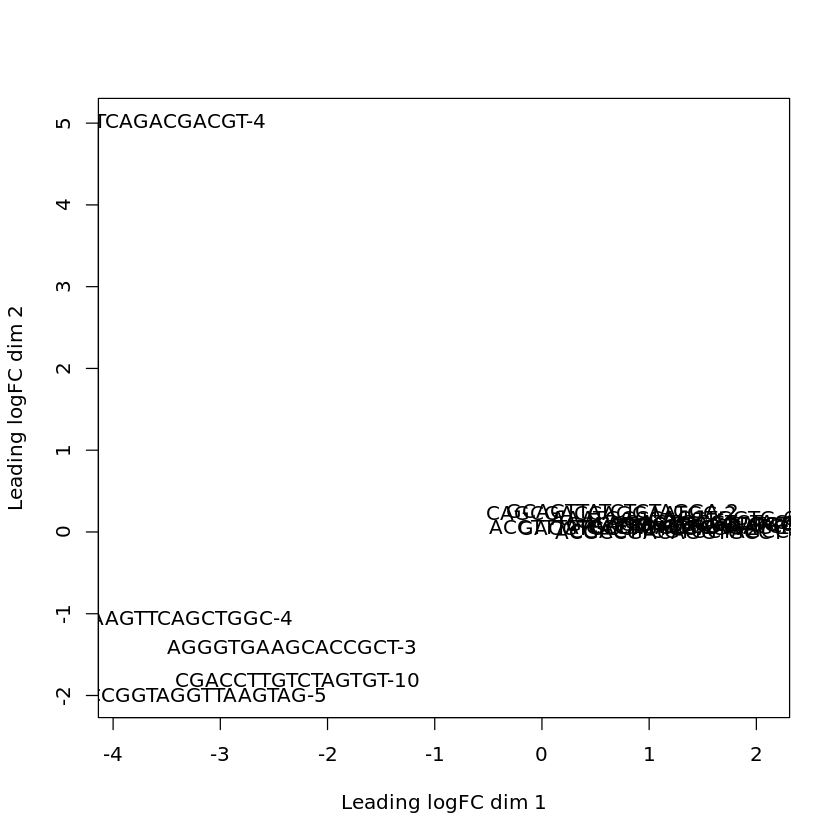

In [18]:
plotMDS(cells@scale.data[,pos_mscs.names], labels = pos_mscs.names)

In [19]:
# Expression heatmap of Jia et al. genes
jia_genes <- c("FN1", "COL1A2", "COL1A1", "SPARC", "EEF1A1", "ACTG1", "ACTB", "TAGLN", "FTH1", 
               "ANXA2", "CTGF", "TGFBI", "VIM", "IGFBP4", "RPLP0", "DCN", "COL3A1", "CALU", 
               "TIMP1", "THBS1", "FTL", "COL5A2")

In [20]:
cells@scale.data[jia_genes, pos_mscs.names]

,AAGGCAGAGAATCTCC-2,ACCTTTATCCCTAACC-2,CAGCGACCAGGAATGC-2,GACGTGCCATTCGACA-2,GCAGTTATCTCTAGGA-2,AGGGTGAAGCACCGCT-3,TTTACTGGTAATCACC-3,ACGCCGACAGGTGCCT-4,GTCAAGTTCAGCTGGC-4,GTGGGTCAGACGACGT-4,CCGGTAGGTTAAGTAG-5,GACTGCGTCTACCAGA-5,AAATGCCCACCTGGTG-6,CACAGGCTCAGAGCTT-8,CGACTTCGTGCTAGCC-8,GACCTGGGTCACTGGC-8,CGACCTTGTCTAGTGT-10
FN1,-0.80097053,2.48301978,2.5563695,2.59710472,2.5218317,0.45253136,-1.15806487,-1.0152411,0.6957150,1.2382510,0.2254462,-1.61481923,-0.2415778,-0.6041306,-0.6850077,-0.45949106,1.26424485
COL1A2,-0.79311029,2.89269770,2.7201162,2.07043842,2.7969387,1.01610838,-1.14656046,-1.0021806,1.8485343,1.1952637,1.8542150,-1.59844346,-0.2398883,-0.5981935,-0.6773402,-0.45506607,1.56831747
COL1A1,-0.80058689,2.90822518,2.6373314,2.66638227,1.9011690,-0.57614500,-1.16275943,-0.9884735,0.8585601,1.1407119,0.6474688,-1.62395702,-0.2377527,-0.6001112,-0.6732997,-0.45376712,0.71215489
SPARC,-0.82494444,2.67845048,2.6134538,2.81285089,2.7074174,1.35020505,-1.18955804,-1.0237491,0.6390460,1.2019489,1.2924910,-1.65453714,-0.2568365,-0.6233919,-0.6999722,-0.47594586,-0.21341952
EEF1A1,-0.62588816,-0.03719031,0.2374692,-0.06541357,0.6095242,0.45032097,-0.34509475,-0.5091305,-1.8101856,-1.1712184,-1.0465875,-1.09158834,-1.5191176,-0.7852384,-0.2694322,-1.14828752,-0.79411763
ACTG1,0.96567561,1.33534672,1.2142669,1.64699020,1.7405923,0.01212761,0.63123263,0.7069533,-0.5061677,-0.1701241,-0.7089284,-0.29327775,0.5931720,0.4990803,0.4461740,0.53901464,0.04080430
ACTB,1.11540268,-0.10951369,0.4287570,-0.05005754,1.2164059,-0.32977050,1.48218355,0.3797629,-0.5081804,-0.8336875,-1.4763384,0.02927833,1.7303915,2.0287361,0.1960687,1.38719021,-0.06496078
TAGLN,-0.84755434,2.85235047,2.8639887,2.79650610,3.0540238,0.73913231,-1.24262677,-0.6420533,1.2237404,1.3445197,0.4929001,-1.71709909,-0.2965406,-0.6172015,-0.5737693,-0.46247691,1.35772312
FTH1,-0.22373724,0.80424737,1.9527822,2.39769697,1.6362492,1.56097970,-0.80650718,-0.4940370,1.0902558,0.4595859,1.3927136,-1.90276439,-0.6791519,-0.4256647,-0.1148970,-0.29731194,1.60523437
ANXA2,0.51740512,2.33408169,1.1178497,2.20025783,2.3791609,-0.86258003,-0.35586805,0.4476406,1.2016515,0.7014957,0.7805765,-0.89727218,0.7730266,0.8970025,0.5228658,0.62453013,-0.53673657



Attaching package: ‘gplots’

The following object is masked from ‘package:stats’:

    lowess



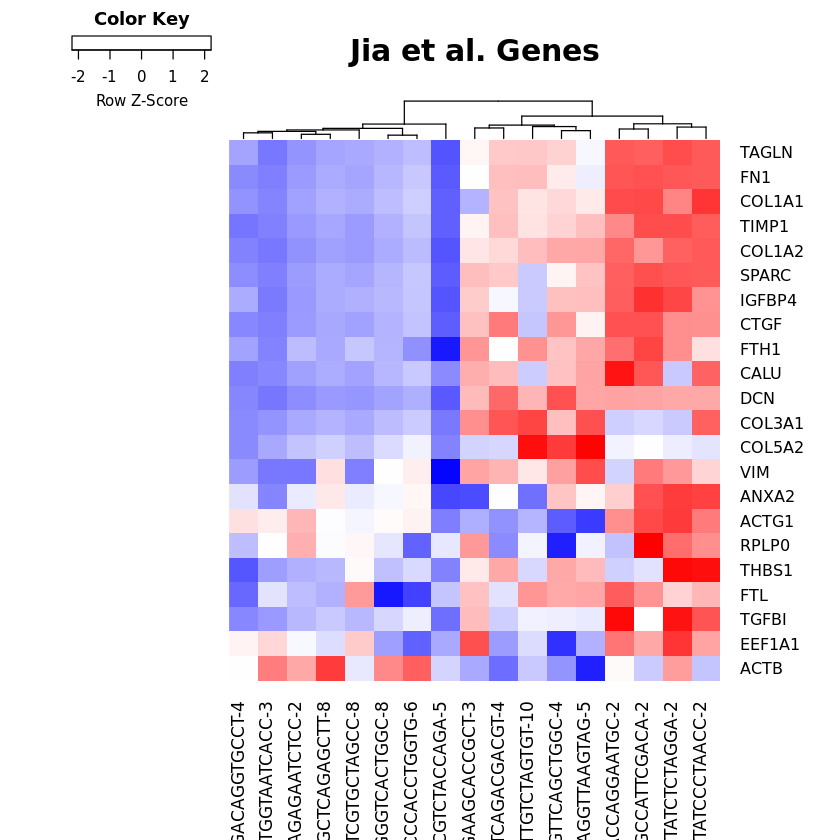

In [21]:
library(gplots)
#my_group <- as.factor(v$targets$condition)
#my_col <- brewer.pal(nlevels(my_group), "Set2")[my_group]
mycol <- colorpanel(1000, "blue", "white", "red")
heatmap.2(cells@scale.data[jia_genes, pos_mscs.names], scale = "row", 
          labRow = jia_genes, labCol = pos_mscs.names,  
          #legend = unique(my_group), 
          col = mycol, trace = "none", density.info = "none", 
          #ColSideColors = my_col, key=T,
          margin = c(8,6), lhei = c(2,10), dendrogram = "column", 
          main = "Jia et al. Genes")

    #heatmap.2(DMPs1.sig, scale="row", col = coul, cexRow=.5, labCol=pheno$Sample_Name,
    #   ColSideColors=my_col, key=T, trace="none", margins=c(5,10))
    #legend("topleft", fill = unique(my_col), cex = .85,
    #legend = unique(my_group), inset=c(0,.15))
# Color key is broken. Blue = -2; White = 0; Red = 2

In [22]:
silva_genes <- c("COL1A1", "COL4A1", "SPARC", "MMP2", "TGFB1", "EEF1A1", "FN1", "MYL9", "TAGLN", 
                 "LTBP2", "GJA1", "BGN", "ANXA2", "IGFBP4", "IGFBP6", "HMOX1", "TPM2", "CTGF", 
                 "LGALS1", "SNX1", "ITGA2", "ITGA5", "CD151")

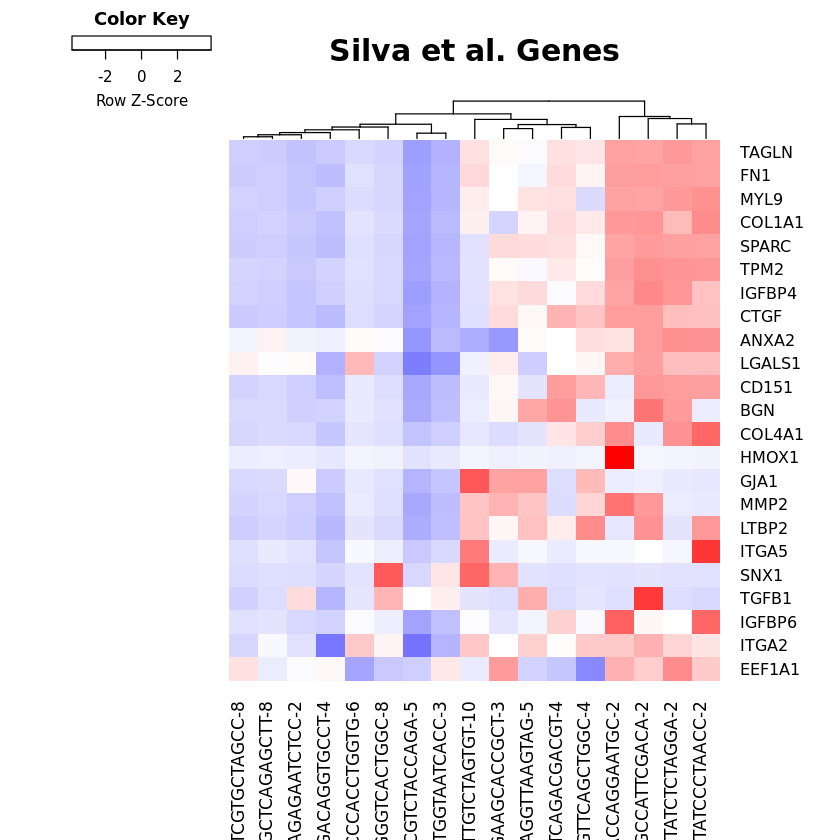

In [29]:
#library(gplots)
#my_group <- as.factor(v$targets$condition)
#my_col <- brewer.pal(nlevels(my_group), "Set2")[my_group]
mycol <- colorpanel(1000, "blue", "white", "red")
heatmap.2(cells@scale.data[silva_genes, pos_mscs.names], scale = "row", 
          labRow = silva_genes, labCol = pos_mscs.names,  
          #legend = unique(my_group), 
          col = mycol, trace = "none", density.info = "none", 
          #ColSideColors = my_col, key=T,
          margin = c(8,6), lhei = c(2,10), dendrogram = "column", 
          main = "Silva et al. Genes")

In [30]:
dominici_genes <- c("ENG", "NT5E", "THY1", "PTPRC", "CD34", "CD14", "CD79A", "CD19", "HLA-DRA", "HLA-DRB1", "HLA-DRB5")

In [31]:
cells@scale.data[dominici_genes, pos_mscs.names]

,AAGGCAGAGAATCTCC-2,ACCTTTATCCCTAACC-2,CAGCGACCAGGAATGC-2,GACGTGCCATTCGACA-2,GCAGTTATCTCTAGGA-2,AGGGTGAAGCACCGCT-3,TTTACTGGTAATCACC-3,ACGCCGACAGGTGCCT-4,GTCAAGTTCAGCTGGC-4,GTGGGTCAGACGACGT-4,CCGGTAGGTTAAGTAG-5,GACTGCGTCTACCAGA-5,AAATGCCCACCTGGTG-6,CACAGGCTCAGAGCTT-8,CGACTTCGTGCTAGCC-8,GACCTGGGTCACTGGC-8,CGACCTTGTCTAGTGT-10
ENG,-0.8098479,-0.3119078,-0.16033992,3.86154487,4.97031826,-0.5892814,-1.16221588,-1.289292464,-0.2251551,2.1262202,1.5604764,-1.63161287,-0.2167563,-0.6232306,-0.78352679,-0.4772972,-0.1851662
NT5E,-0.5201847,-0.1027065,-0.04631546,6.76342865,-0.07090328,-0.3626819,-0.77564783,-0.543483557,3.6206730,-0.3161532,4.6429539,-1.09334319,-0.1399338,-0.3756720,-0.39449237,-0.2737538,-0.1053282
THY1,-0.7395175,-0.1049507,-0.04290989,0.00581641,-0.07116966,-0.5092975,-1.11443631,-0.648108659,-0.2187121,-0.4349258,-0.3058572,-1.57192923,-0.2007225,-0.5238603,-0.51375984,-0.3757883,2.3498281
PTPRC,-0.7014683,-1.2647047,-1.24359164,-1.21550404,-1.24783588,-0.8762555,1.41773420,2.424673460,-1.0333986,-0.9540069,-0.9512768,1.29915831,0.9783207,0.6025364,0.10416695,0.1659840,-1.1114526
CD34,-0.2100535,-0.1207962,-0.14346689,-0.16601423,-0.13535471,-0.1898517,-0.24503677,-0.028995283,-0.1905137,-0.1745522,-0.2047384,-0.27569474,-0.1862385,-0.1850271,-0.13227027,-0.1732759,-0.1748504
CD14,-0.1792651,-0.4928883,-0.36126767,-0.23338415,-0.40977573,-0.2300889,-0.08572415,-1.093821867,-0.1590218,-0.2918543,-0.1057853,-0.03376218,-0.1769311,-0.2584159,-0.52874903,-0.2846844,-0.2229151
CD79A,-0.2348431,-0.2972978,-0.34821070,-0.39496448,-0.32817985,-0.2748845,-0.17260911,-0.003801714,-0.3627589,-0.2752993,-0.3569890,-0.07950012,-0.3620395,-0.2636428,-0.19137556,-0.2911691,-0.3623368
CD19,3.2415628,-0.1378311,-0.17476266,-0.20909808,-0.16042905,-0.1408137,-0.09114599,0.065600056,-0.1951920,-0.1373451,-0.1950951,-0.04116275,-0.1937074,-0.1327033,-0.07527202,-0.1468258,-0.1911184
HLA-DRA,-0.6034284,-0.9551613,-0.87112888,-0.78724530,-0.90105390,0.6427364,0.92117033,-1.288496944,1.5505489,0.5231841,-0.6337822,1.13096343,-0.7060567,0.4451682,0.84557958,1.2327993,-0.7503241
HLA-DRB1,-0.5168913,-0.8373612,-0.73143087,-0.62750327,-0.77000159,-0.5799061,1.33824847,1.270684242,3.0157917,2.5555085,-0.4924651,1.14867945,0.7672818,0.3046895,1.43677511,1.0212006,-0.6054937


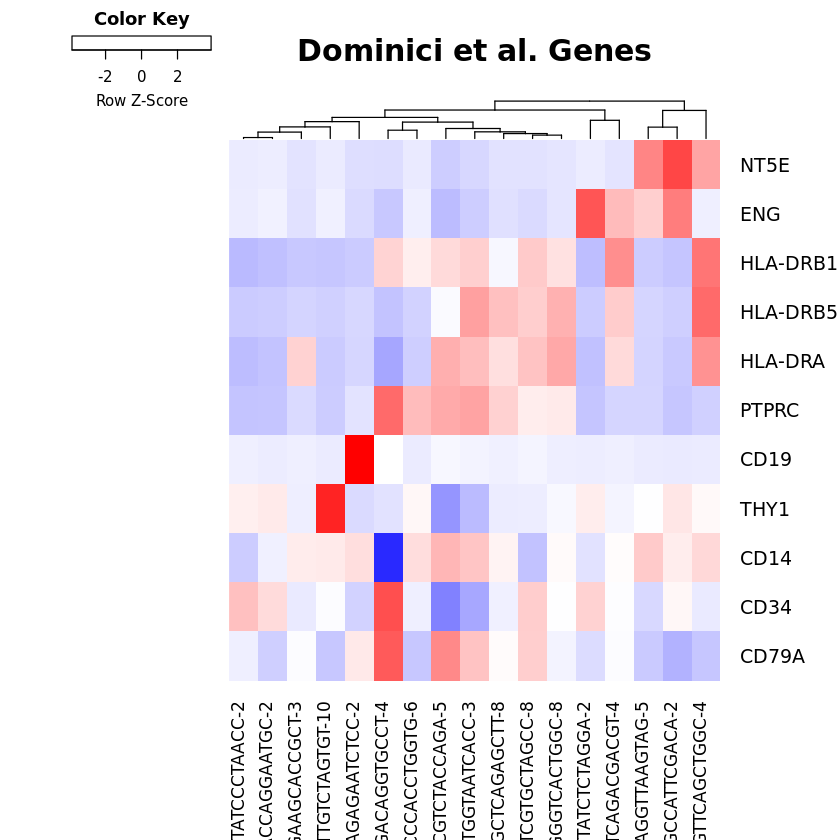

In [32]:
mycol <- colorpanel(1000, "blue", "white", "red")
heatmap.2(cells@scale.data[dominici_genes, pos_mscs.names], scale = "row", 
          labRow = dominici_genes, labCol = pos_mscs.names,  
          #legend = unique(my_group), 
          col = mycol, trace = "none", density.info = "none", 
          #ColSideColors = my_col, key=T,
          margin = c(8,6), lhei = c(2,10), dendrogram = "column", 
          main = "Dominici et al. Genes")

# Identifying Cell Types
Get list of genes defining each cell type from Severin "Blood cells gene marker_SR.xlsx"
* B-cells - CD19, CD21, CD22, FCGR2B
* T-cells - CD3delta/gamma, CD28, TRalpha/beta, MAL, LAT, TCRIM, FYN, ZAP70 (at least 2x higher than in B-cells)
* CD4+ T-cell subpopulation - CD4, ANK3, MXI1, CTSB (min 2x higher than in CD8+ subpopulation)
* CD8+ T-cell subpopulation - CD8A/B, IL2RB, KLRC1, KLRG1 (min 2x higher than in CD4+ subpopulation)
* Monocytes - CD3, CD19, CD56
    * Subtype 1 - CD14, VCAN, S100A8, S100A9, FC1
    * Subtype 2 - LAIR2
    * Subtype 3 - G0S2, NAMPT, NEAT1, AL137655, CSF3R
    * Subtype 4 - PRF1, GNLY, CTSW
* Granuloctyes - CSF2RB, CSF3R, IL1R2, IL1RN, IL8RB, IL13RA1 (these markers could be derived from eosinophils, basophils, paltelets, or reticulocytes
* Dendritic cells - high CD100, mid CD34
    * Subtype 1 - CLEC9A
    * Subtype 2 - CD1CA
    * Subtype 3 - CD1CB
    * Subtype 4 - CD1C-, CD141-, CD11C+
    * Subtype 5 - AXL, SIGLEC6

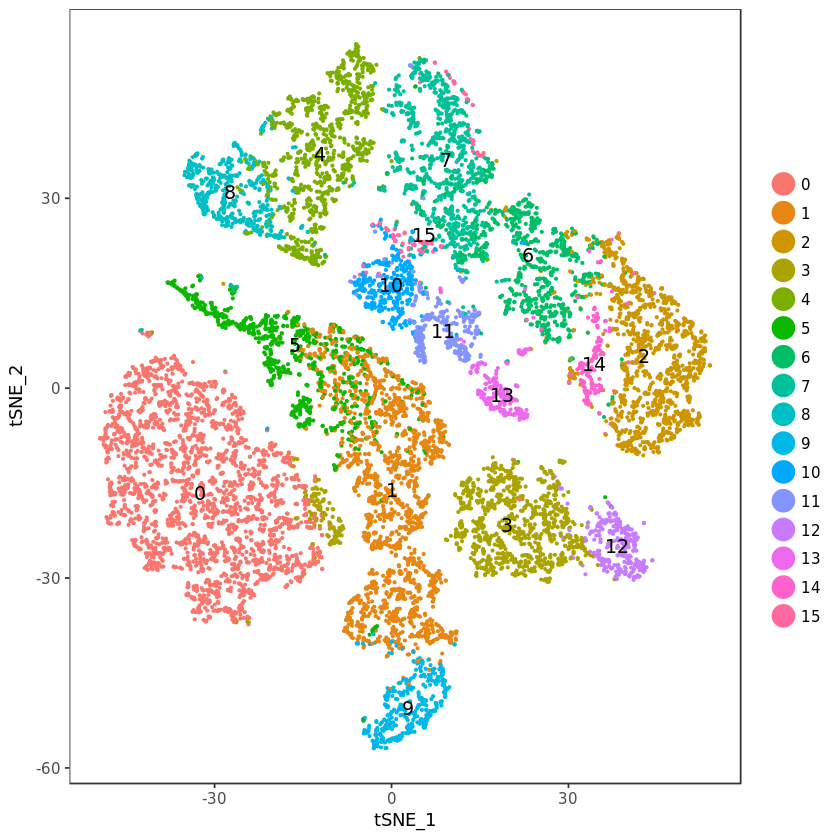

In [3]:
TSNEPlot(cells, do.label = T, do.return = T, pt.size = 0.5)

### Monocytes
* Definition from Yeo lab and Satija Lab - CD14, LYZ
* Defintiions from Severin:
    * Monocytes - CD3, CD19, CD56
        * Subtype 1 - CD14, VCAN, S100A8, S100A9, FC1
        * Subtype 2 - LAIR2
        * Subtype 3 - G0S2, NAMPT, NEAT1, AL137655, CSF3R
        * Subtype 4 - PRF1, GNLY, CTSW

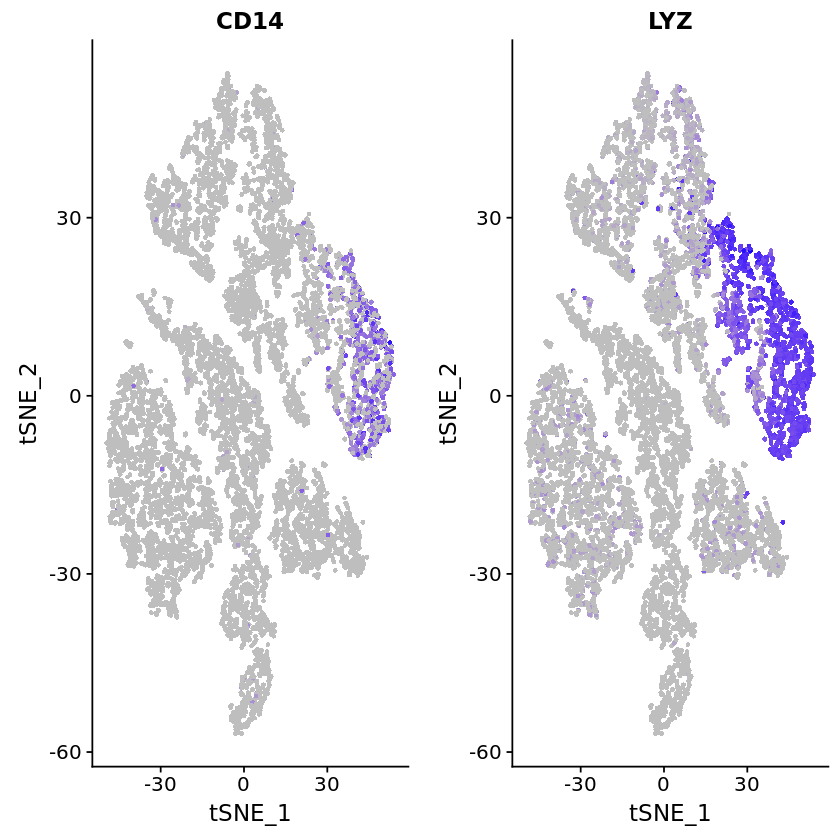

In [4]:
# Monocytes
FeaturePlot(object = cells, features.plot = c("CD14", "LYZ"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

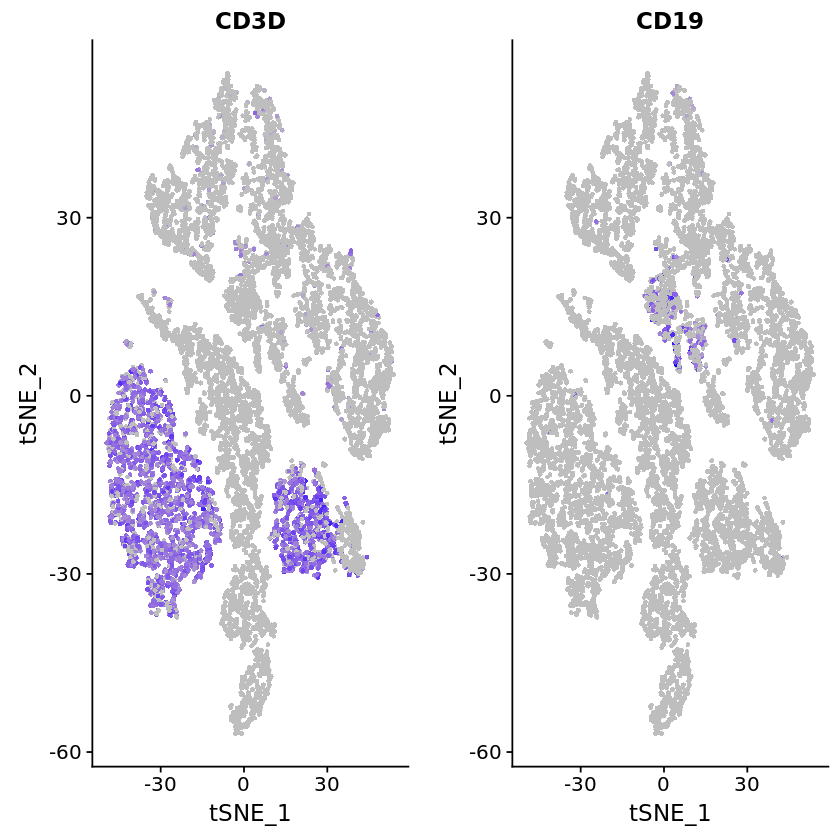

In [5]:
FeaturePlot(object = cells, features.plot = c("CD3D", "CD19"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
#CD3 -> CD3D
#CD56 -> NCAM, both not found

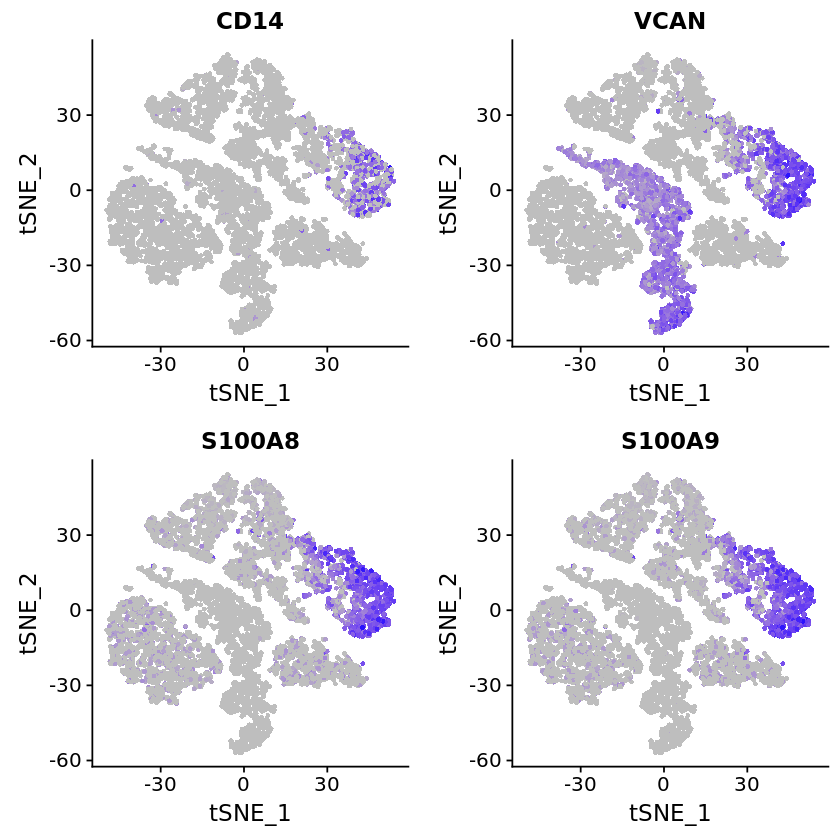

In [6]:
# Monocyte subtype 1
FeaturePlot(object = cells, features.plot = c("CD14", "VCAN", "S100A8", "S100A9"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
# not found FC1

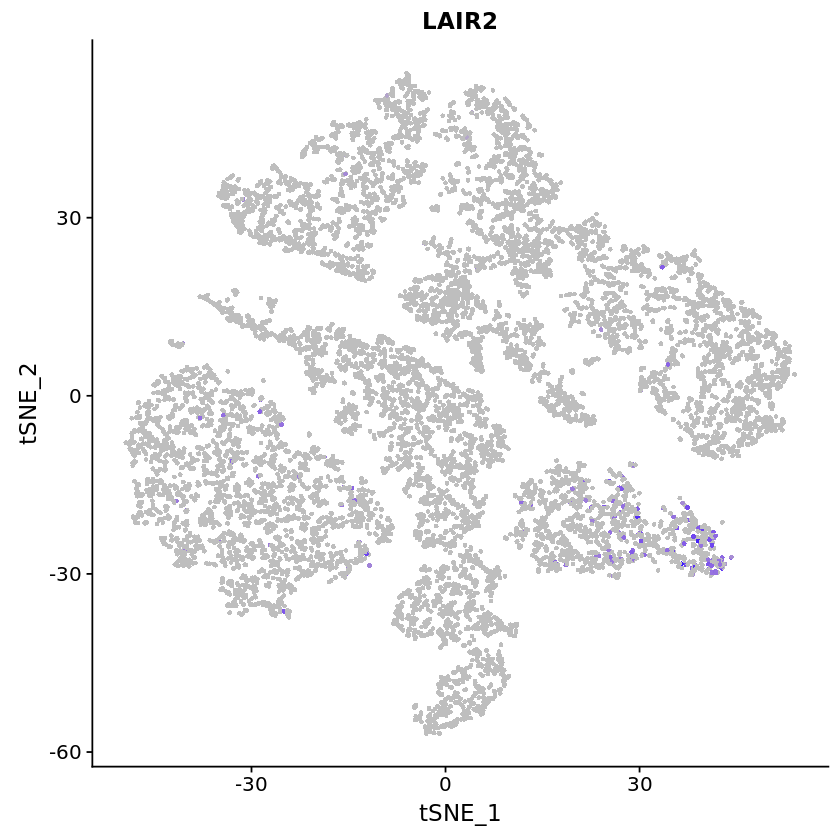

In [7]:
# Monocyte subtype 2
FeaturePlot(object = cells, features.plot = c("LAIR2"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

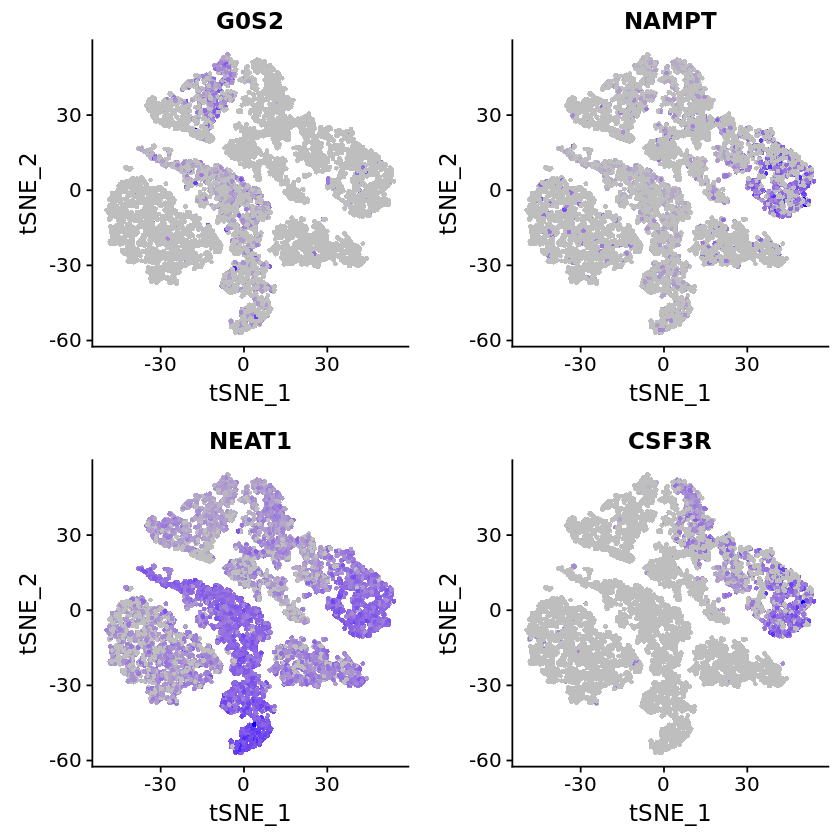

In [8]:
# Monocyte subtype 3
FeaturePlot(object = cells, features.plot = c("G0S2", "NAMPT", "NEAT1", "CSF3R"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
# AL137655 -> FAM157A both not expressed

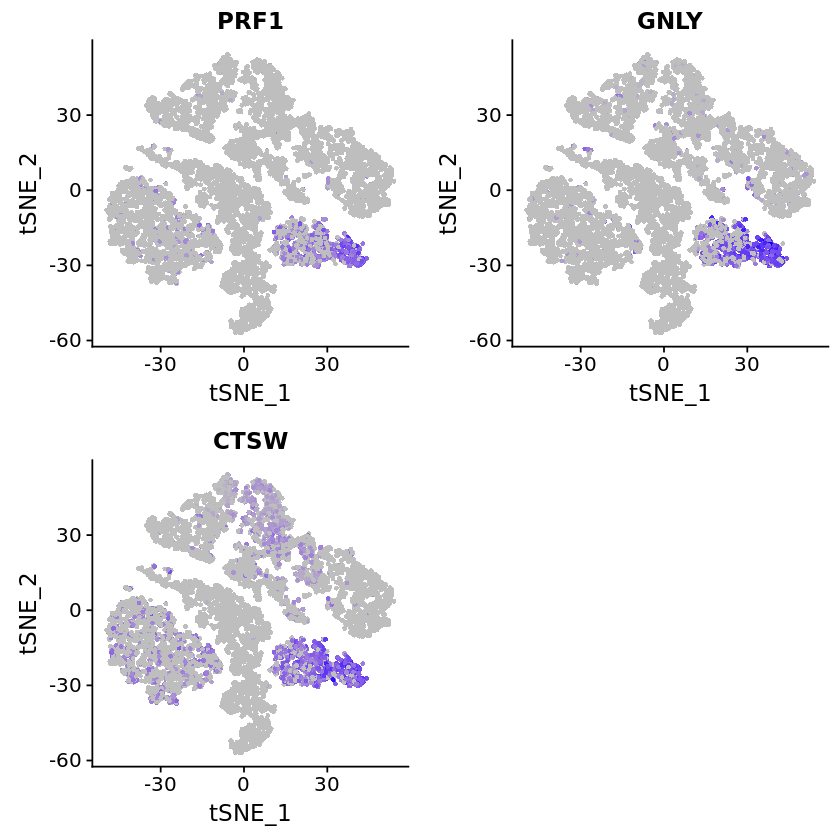

In [9]:
# Monocyte subtype 4
FeaturePlot(object = cells, features.plot = c("PRF1", "GNLY", "CTSW"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

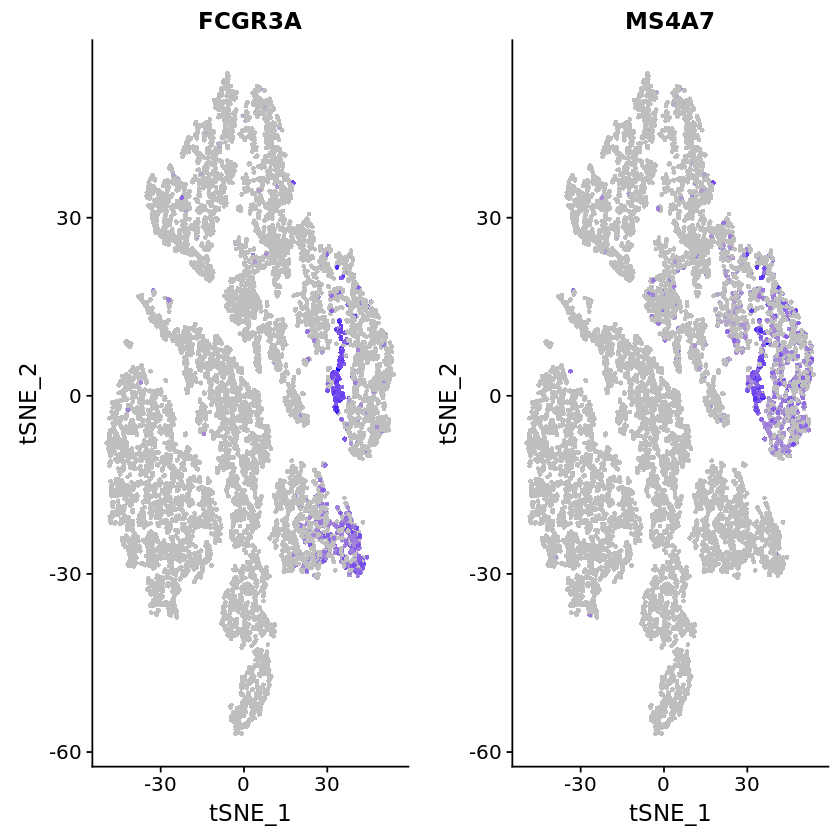

In [10]:
# FCGR3A+ Monocytes
FeaturePlot(object = cells, features.plot = c("FCGR3A", "MS4A7"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

### T-cells
* Yeo lab - CD3D, CD3E, CD4
* Satija lab - CD4 T cells - IL7R
*            - CD8 T cells - CD8A
* Severin - T-cells - CD3delta/gamma, CD28, TRalpha/beta, MAL, LAT, TCRIM, FYN, ZAP70 (at least 2x higher than in B-cells)
* CD4+ T-cell subpopulation - CD4, ANK3, MXI1, CTSB (min 2x higher than in CD8+ subpopulation)
* CD8+ T-cell subpopulation - CD8A/B, IL2RB, KLRC1, KLRG1 (min 2x higher than in CD4+ subpopulation)

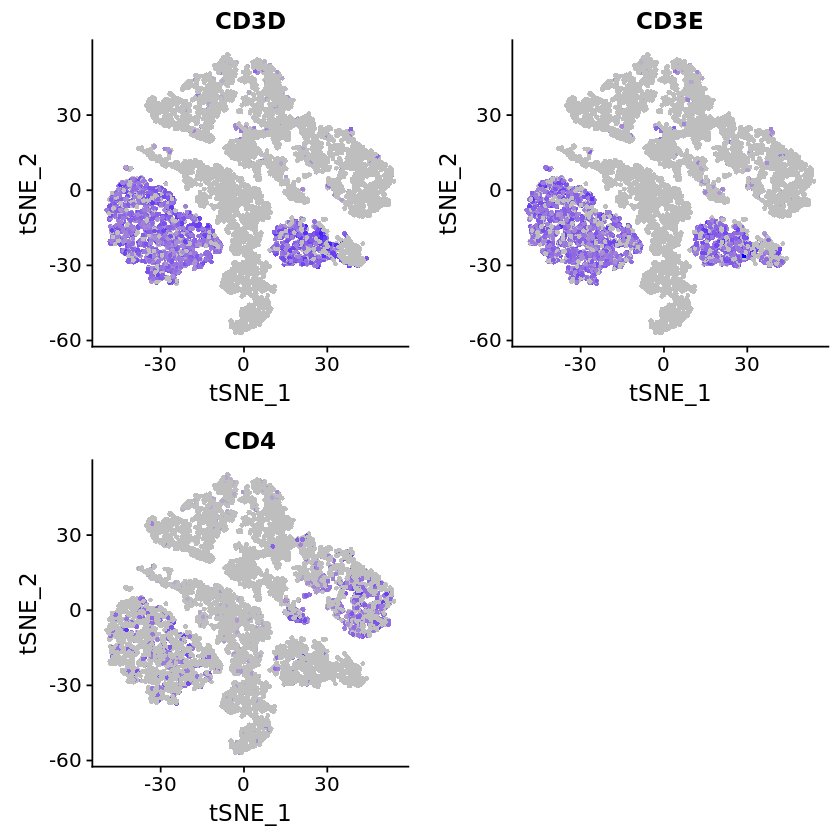

In [11]:
# Yeo Lab
FeaturePlot(object = cells, features.plot = c("CD3D", "CD3E", "CD4"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

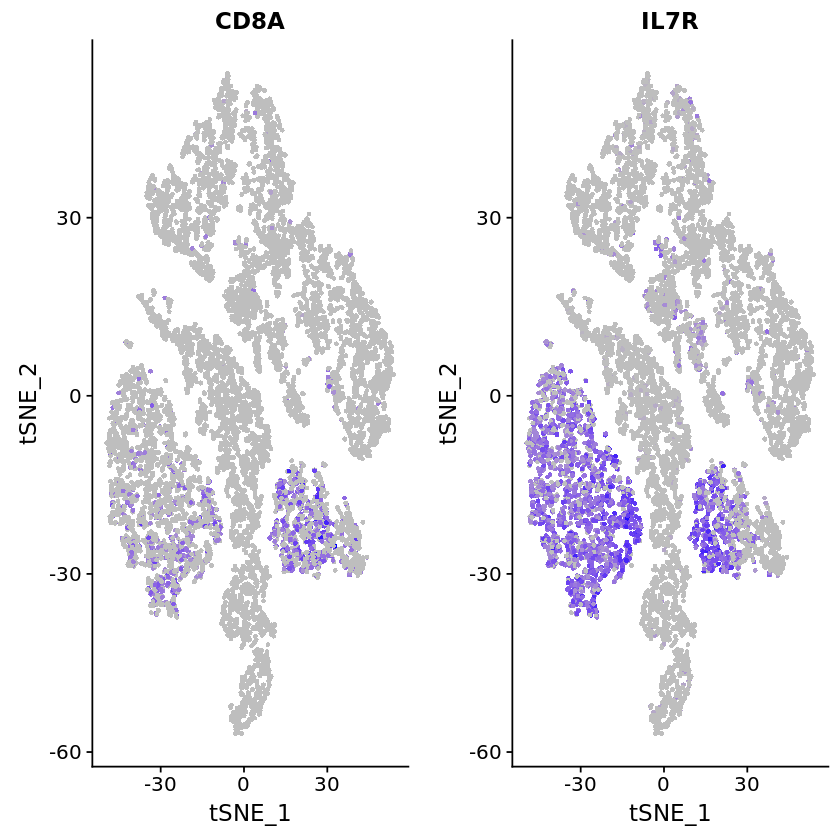

In [12]:
# Satija lab
FeaturePlot(object = cells, features.plot = c("CD8A", "IL7R"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

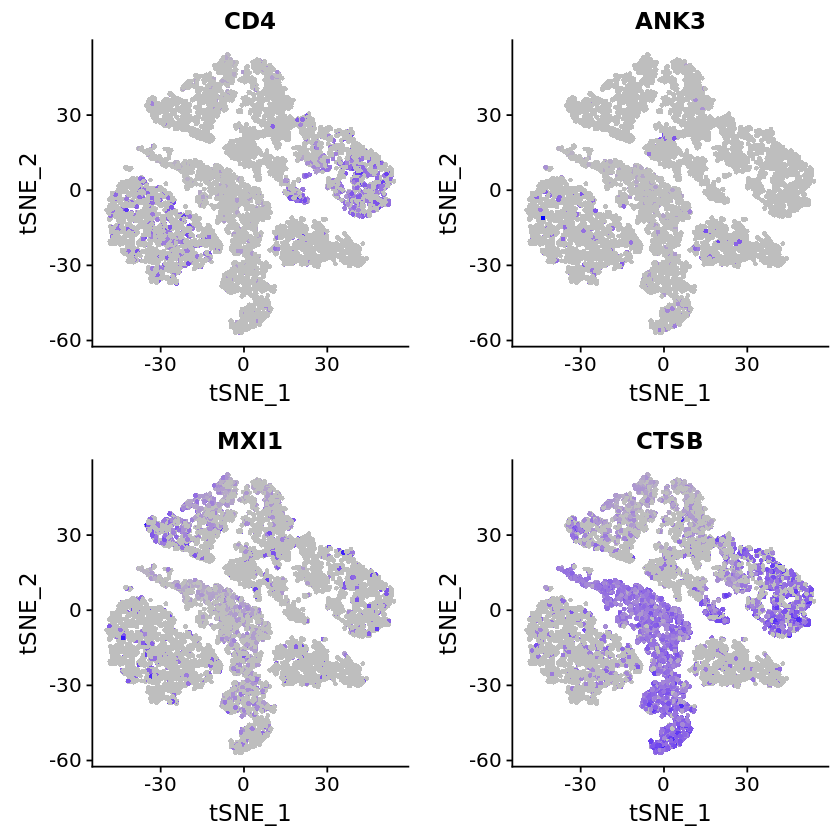

In [13]:
# Severin CD4
FeaturePlot(object = cells, features.plot = c("CD4", "ANK3", "MXI1", "CTSB"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

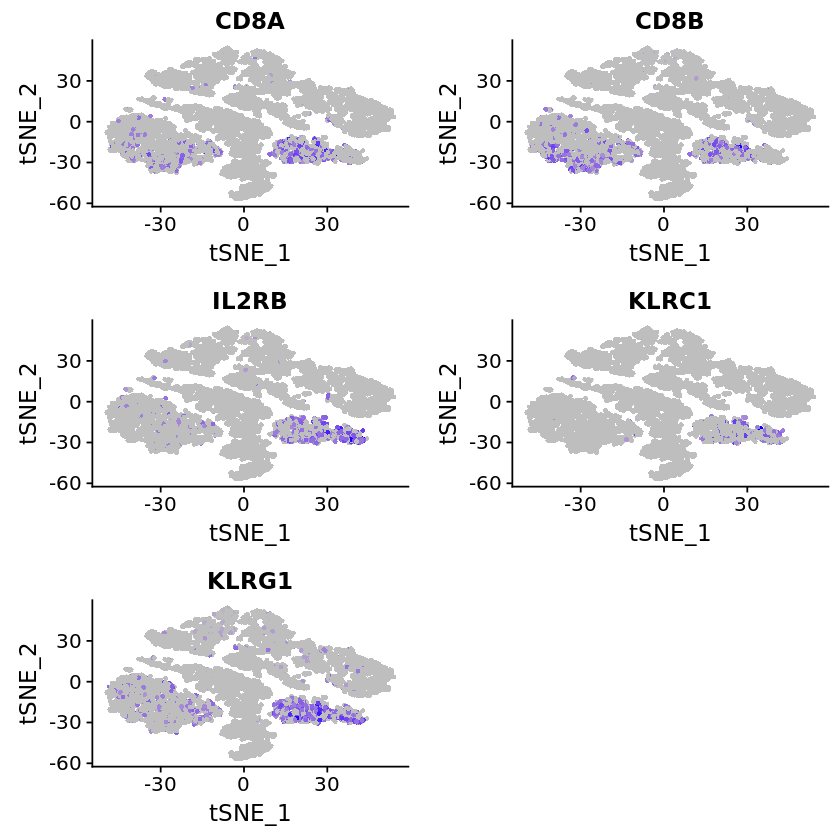

In [14]:
# Severin CD8
FeaturePlot(object = cells, features.plot = c("CD8A", "CD8B", "IL2RB", "KLRC1", "KLRG1"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

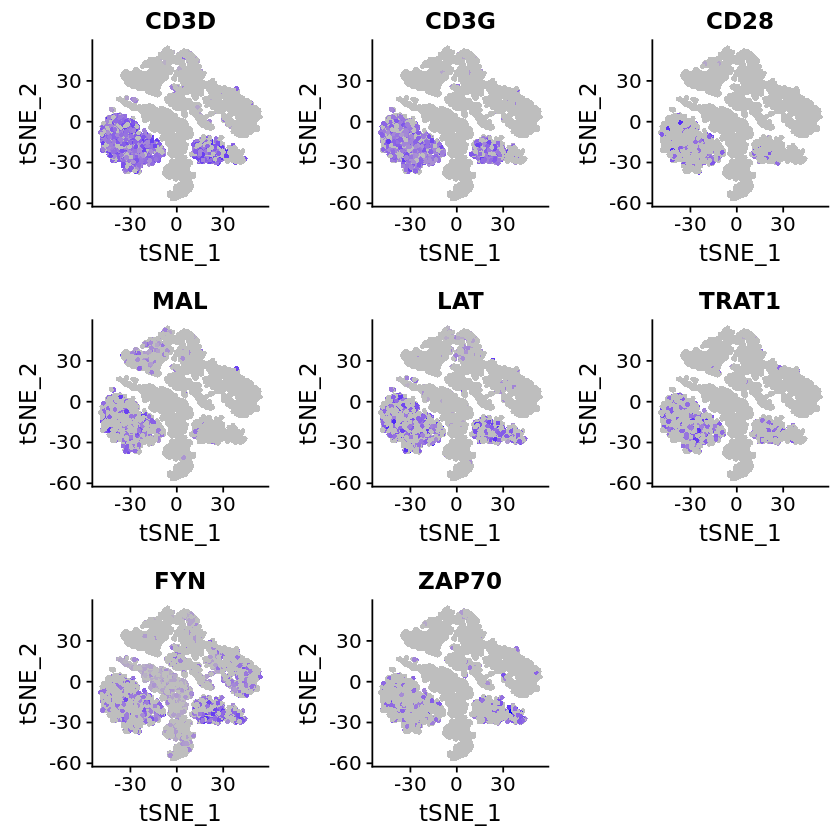

In [15]:
# Severin T cells 
FeaturePlot(object = cells, features.plot = c("CD3D", "CD3G", "CD28", "MAL", "LAT", "TRAT1", "FYN", "ZAP70"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
# TR alpha -> TCRA, IMD7 not found
# TR beta not found
# TCRIM -> TRAT1

### B-cells
* Yeo lab - CD79A, CD79B
* Satija lab - MS4A1
* Severin: B-cells - CD19, CD21, CD22, FCGR2B

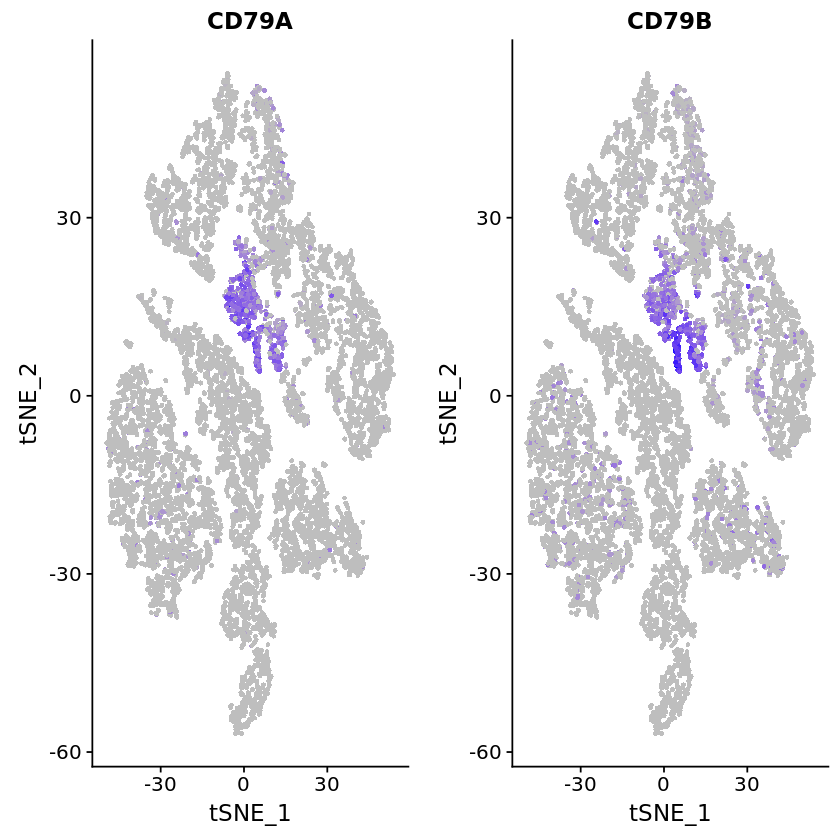

In [352]:
# Yeo
FeaturePlot(object = cells, features.plot = c("CD79A", "CD79B"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

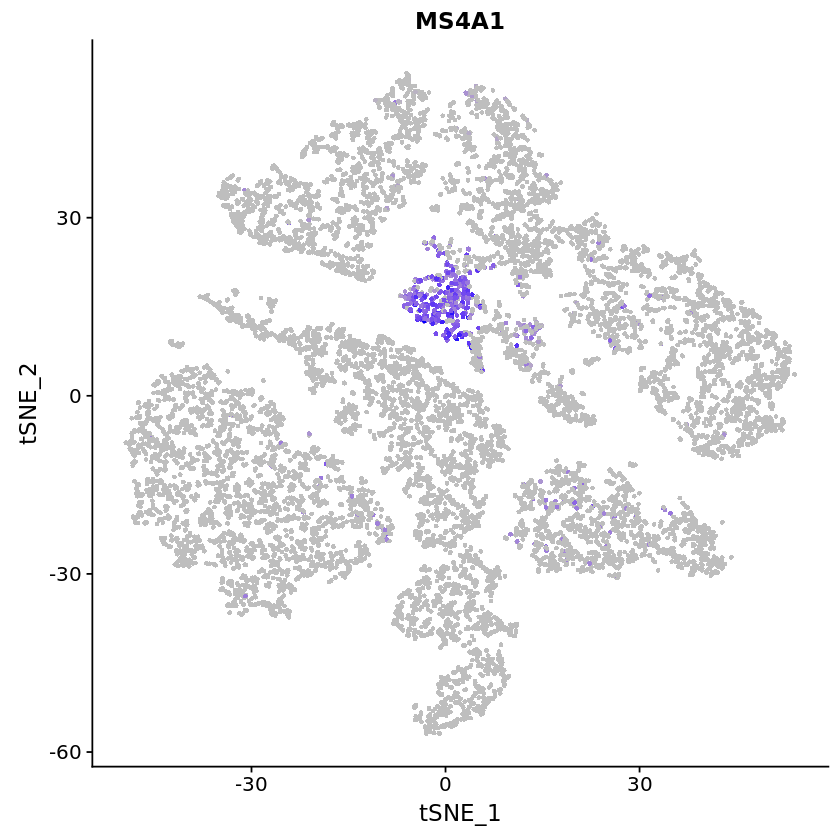

In [353]:
# Satija
FeaturePlot(object = cells, features.plot = c("MS4A1"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

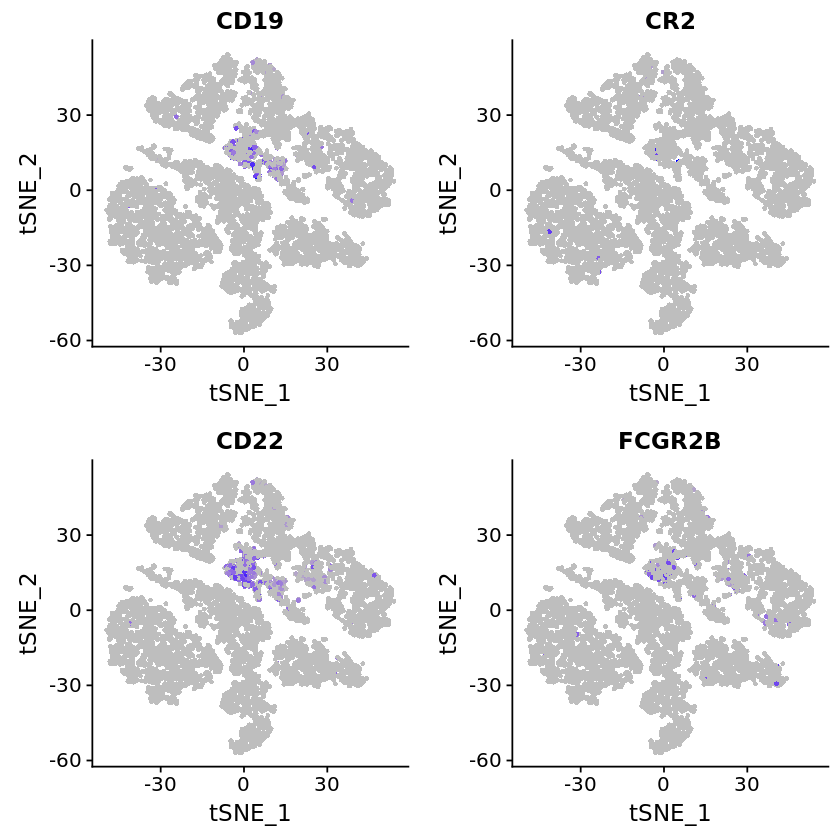

In [355]:
# Severin
FeaturePlot(object = cells, features.plot = c("CD19", "CR2", "CD22", "FCGR2B"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
# CD21 -> CR2

### Granuloctyes
* Severin: Granuloctyes - CSF2RB, CSF3R, IL1R2, IL1RN, IL8RB, IL13RA1 (these markers could be derived from eosinophils, basophils, paltelets, or reticulocytes
* Update from 10/22/18 - MPO for neutrophils

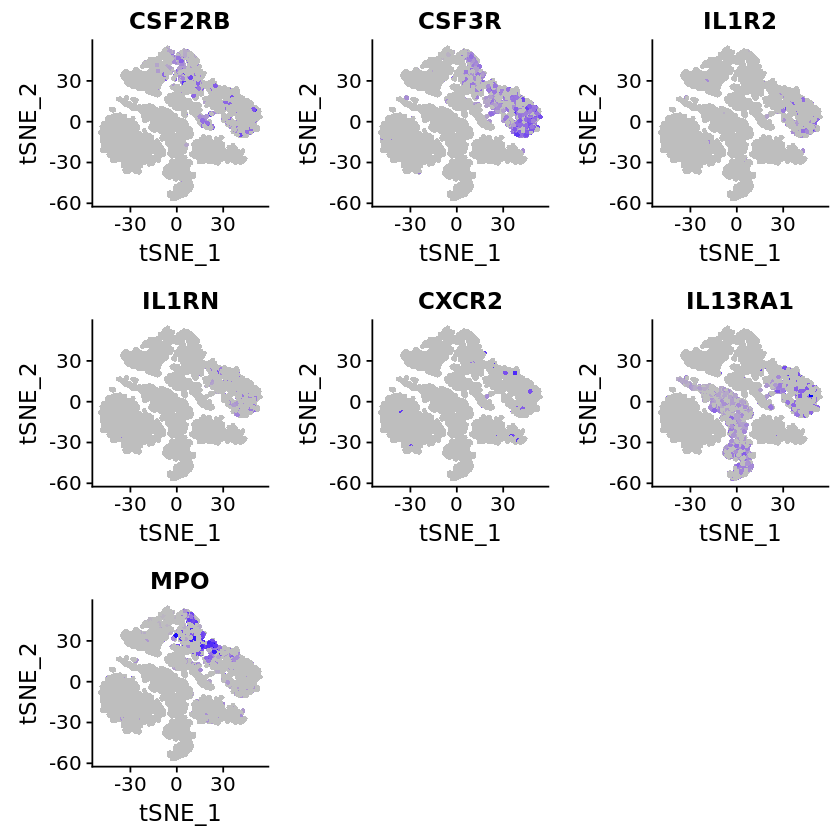

In [16]:
FeaturePlot(object = cells, features.plot = c("CSF2RB", "CSF3R", "IL1R2", "IL1RN", "CXCR2", "IL13RA1", "MPO"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
# IL8RB -> CXCR2

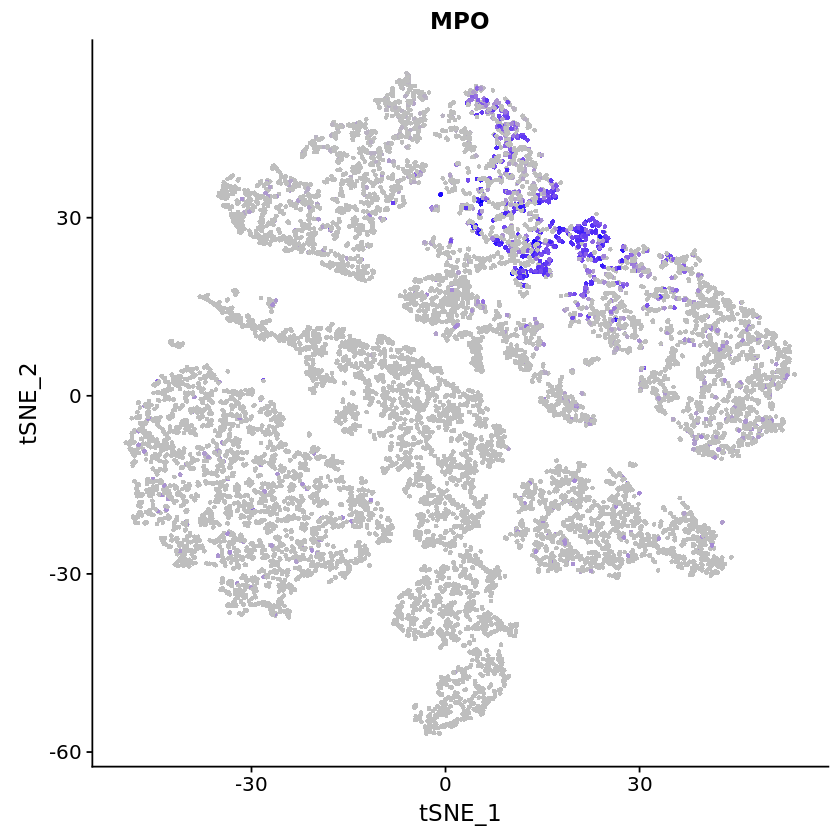

In [17]:
FeaturePlot(object = cells, features.plot = c("MPO"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

### Dendritic cells
* Satija lab - FCER1A, CST3
* Severin: * Dendritic cells - high CD100, mid CD34
    * Subtype 1 - CLEC9A
    * Subtype 2 - CD1CA
    * Subtype 3 - CD1CB
    * Subtype 4 - CD1C-, CD141-, CD11C+
    * Subtype 5 - AXL, SIGLEC6

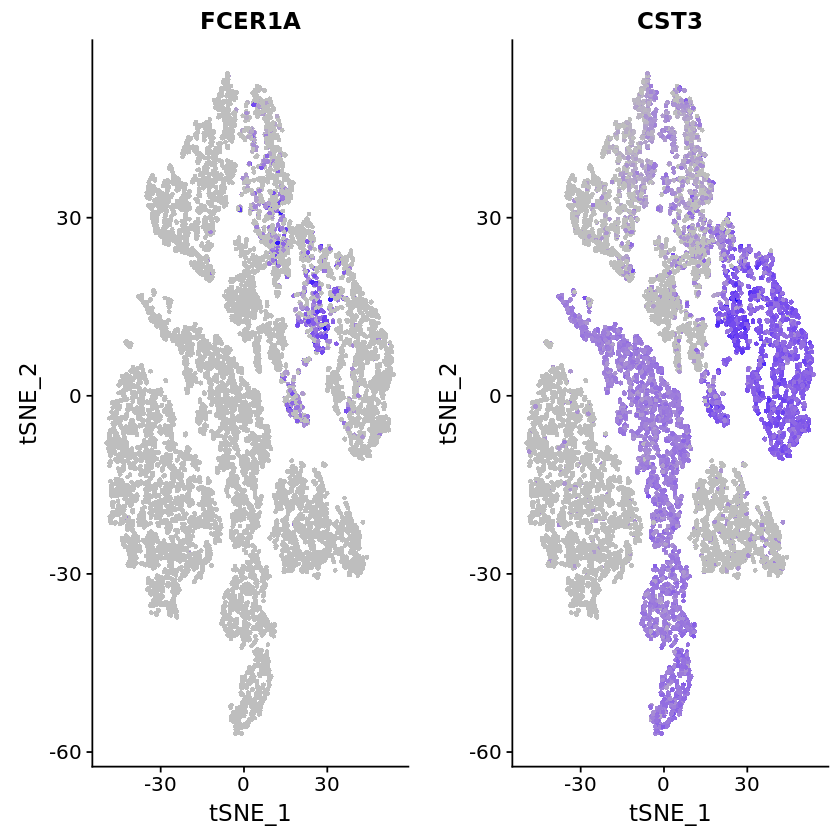

In [359]:
#Satija 
FeaturePlot(object = cells, features.plot = c("FCER1A", "CST3"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

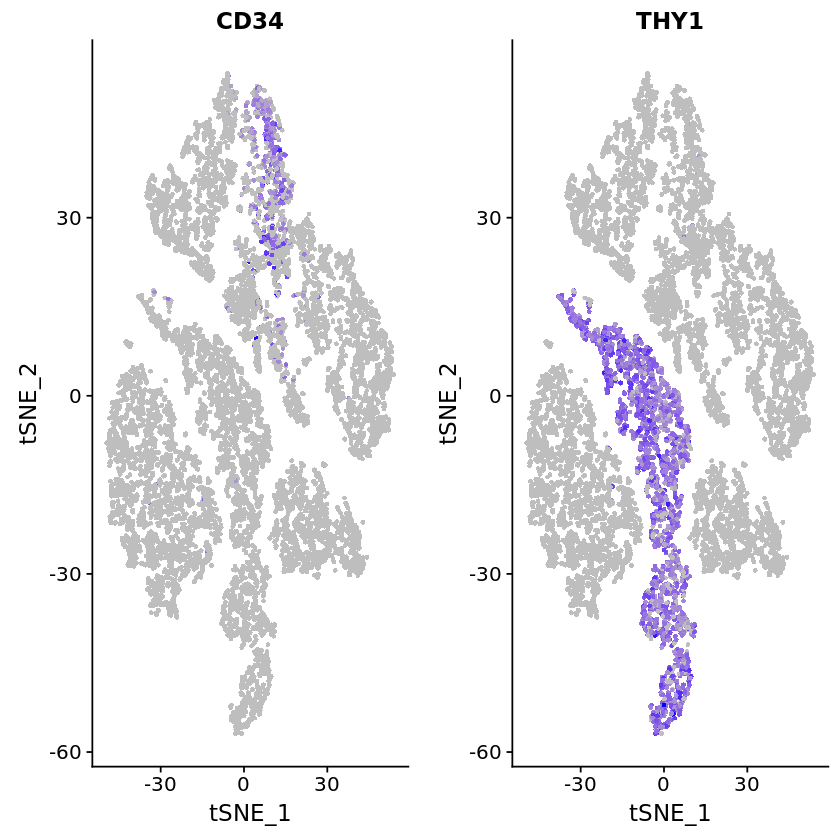

In [19]:
#Severin
FeaturePlot(object = cells, features.plot = c("CD34", "THY1"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
# CD100 -> SEMA4D "SEMA4D"

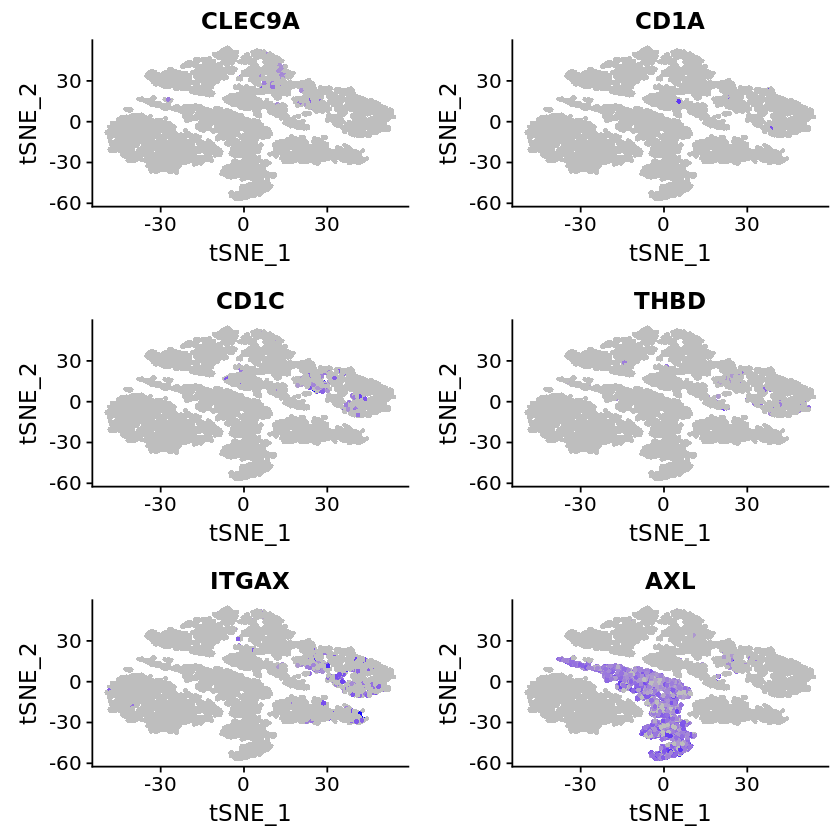

In [370]:
FeaturePlot(object = cells, features.plot = c("CLEC9A", "CD1A", "CD1C", "THBD", "ITGAX", "AXL"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
# CD1B not found
# CD141 -> THBD
# CD11C -> ITGAX
# SIGLEC6 -> CD33L, CD327 not found

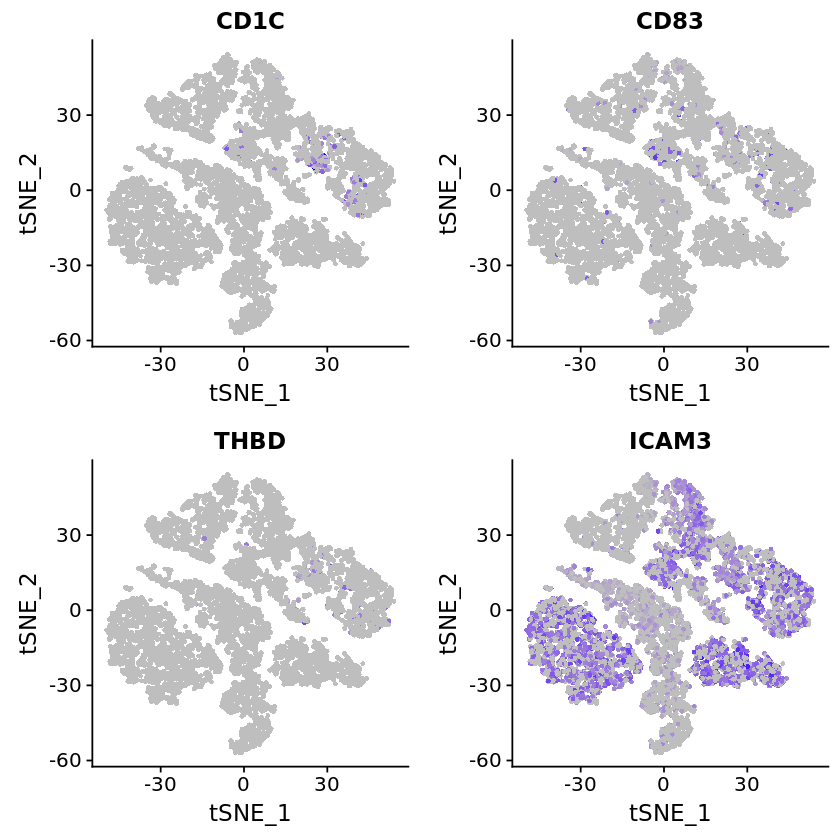

In [382]:
# biolegend essential markers
FeaturePlot(object = cells, features.plot = c("CD1C", "CD83", "THBD", "ICAM3"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")
# CD141 - THBD
# CD209 - ICAM3
# MHC II - not found

### NK cells 
* Both Yeo and Satija - GNLY, NKG7

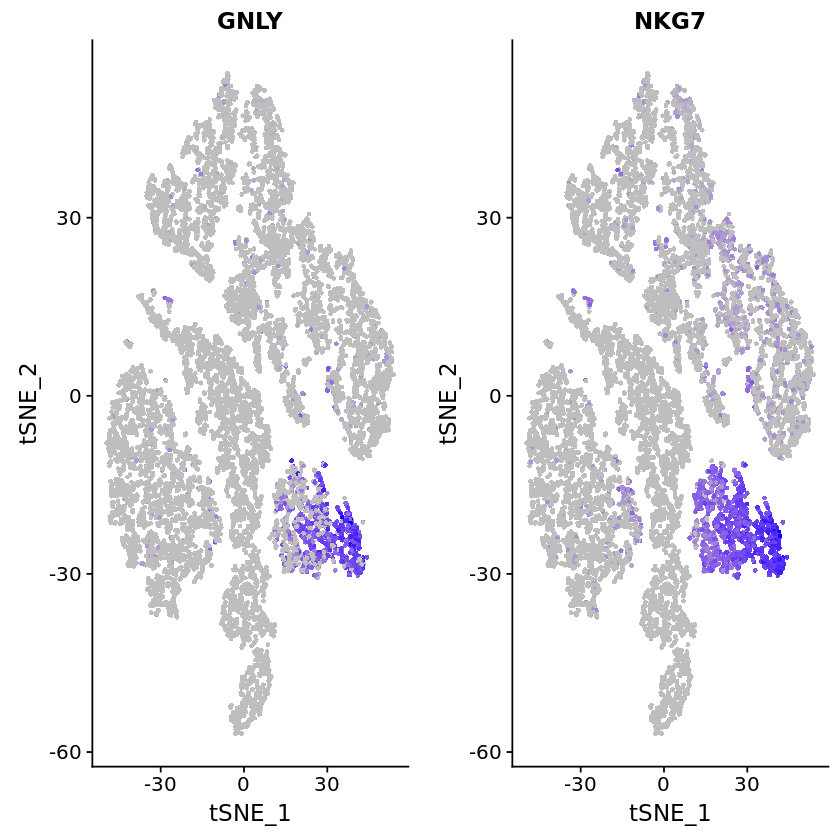

In [371]:
FeaturePlot(object = cells, features.plot = c("GNLY", "NKG7"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

### Erythroctyes
* Yeo lab - HBA1/2

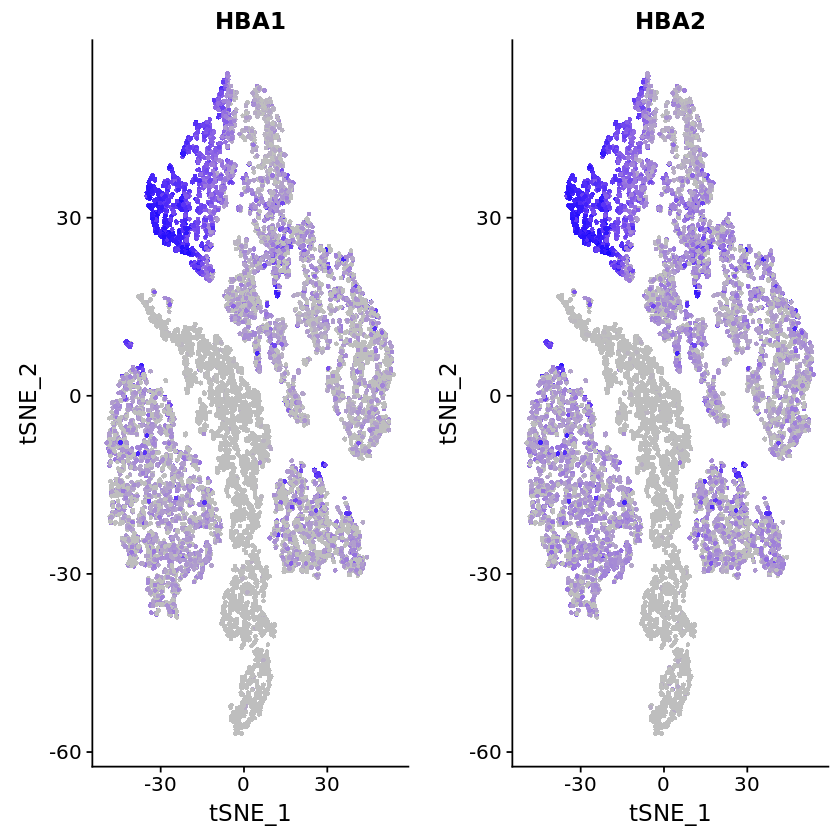

In [372]:
FeaturePlot(object = cells, features.plot = c("HBA1", "HBA2"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

### Megakaryocytes
* Yeo lab - PPBP

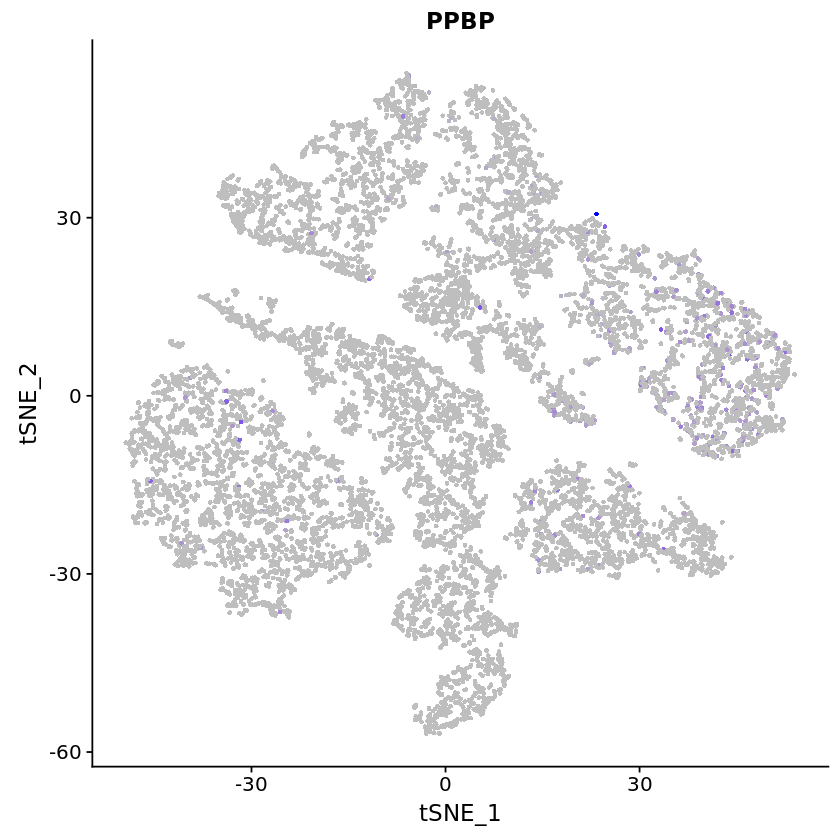

In [373]:
FeaturePlot(object = cells, features.plot = c("PPBP"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

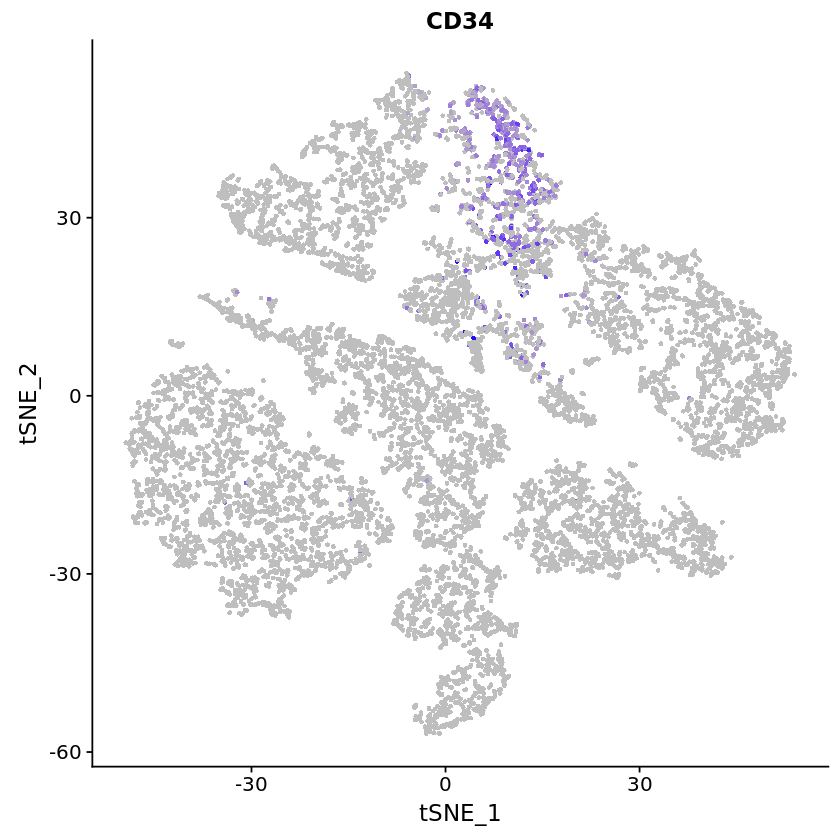

In [374]:
FeaturePlot(object = cells, features.plot = c("CD34"), 
            cols.use = c("grey", "blue"), reduction.use = "tsne")

In [3]:
# Run this before changing cluster IDs
cells <- SetAllIdent(cells, id = "res.0.6")

In [4]:
#Cluster 0 – T cells
#Cluster 1 – Cultured MSCs
#Cluster 2 – monocytes
#Cluster 3 – T cells
#Cluster 4 - Erythrocytes
#Cluster 5 – Cultured MSCs
#Cluster 6 – Monocytes/Neutrophils (also expresses MPO for neutrophils)
#Cluster 7 – CD34+ progenitors
#Cluster 8 – Erythrocytes
#Cluster 9 – Cultured MSCs
#Cluster 10 – B cells
#Cluster 11 – B cells
#Cluster 12 – NK cells
#Cluster 13 – Dendritic cells/Monocyte precursor (IRF8)
#Cluster 14 – FCGR3A+ Monocytes
#Cluster 15 – Lymphoblasts/Bcells/Dendritic/Mature B lymphocyte? 

numerical.cluster.ids <- c(0:15)
new.cluster.ids <- c("T cells", "MSCs", "Monocytes", "T cells", "Erythrocytes", 
                     "MSCs", "Monocytes/Neutrophils", "CD34+", "Erythrocytes", "MSCs", 
                     "B cells", "B cells", "NK cells", "Dendritic cells", "FCGR3A+ Monocytes",
                     "Lymphoblast")

In [5]:
cells@ident <- plyr::mapvalues(x = cells@ident, from = numerical.cluster.ids, to = new.cluster.ids)

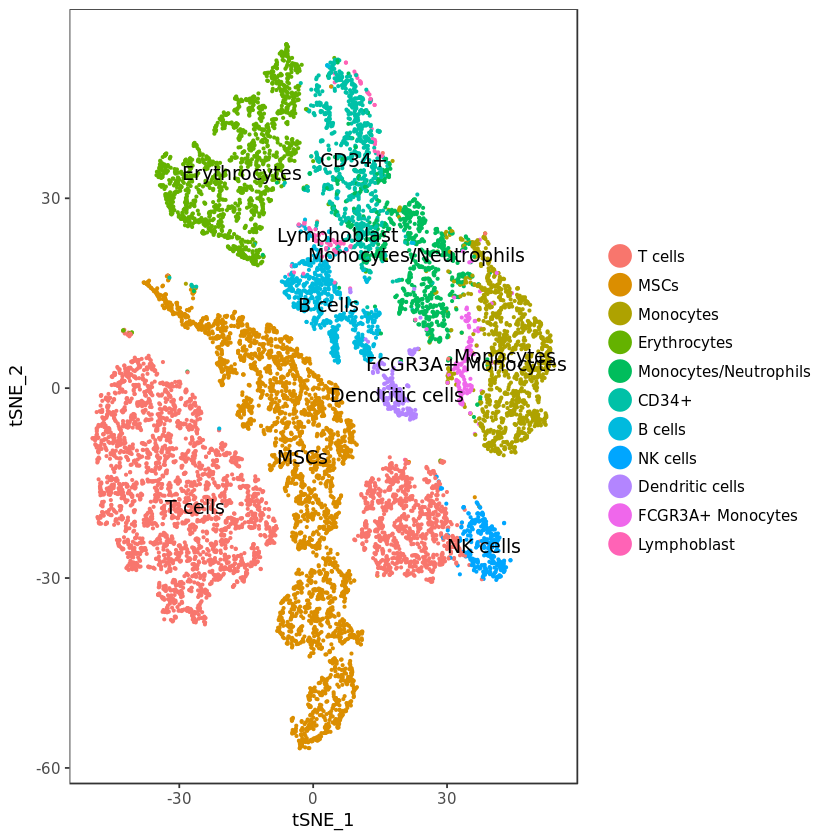

In [6]:
#png(filename = "BMAC__MSC_noJTW02_celltypes_legend.png",
#    width = 1500, height = 1500, units = "px", res = 300)
TSNEPlot(object = cells, do.label = TRUE, pt.size = 0.5, label.size = 4, no.legend = F)
#dev.off()

## Heatmap and unsupervised hierarchical for all genes

In [24]:
dim(ghaz_c3c5.scaled)

[1]   396 12279

In [28]:
write.table(ghaz_c3c5.scaled, file = "BMAC_MSC_noJTW02_Ghazc3c5_norm.txt", sep = "\t", quote = FALSE, col.names = NA)

In [27]:
write.table(cells@meta.data, file = "BMAC_MSC_noJTW02_meta.txt", sep = "\t", quote = FALSE, col.names = NA)

In [3]:
head(cells@scale.data)

,AAACCTGAGAAACCAT-1,AAACCTGAGCGATTCT-1,AAACCTGCACAAGCCC-1,AAACCTGCAGATGAGC-1,AAACCTGGTGCGCTTG-1,AAACCTGTCACCACCT-1,AAACCTGTCGCCCTTA-1,AAACGGGAGCGATAGC-1,AAACGGGAGTCCGTAT-1,AAACGGGAGTGCGTGA-1,⋯,TTGGCAATCGAATGCT-11,TTGTAGGCATAAAGGT-11,TTTACTGCAAGCCGTC-11,TTTACTGGTTGACGTT-11,TTTCCTCAGGACAGCT-11,TTTCCTCGTATAGGGC-11,TTTCCTCGTGGCCCTA-11,TTTCCTCTCACCAGGC-11,TTTGCGCAGCGTCAAG-11,TTTGGTTCAATGGAGC-11
RP11-34P13.7,-0.02371439,-0.07982839,-0.0206273,-0.02710861,-0.02926006,-0.0206785,-0.02064064,-0.03468317,-0.03518961,-0.01753414,⋯,-0.03260285,-0.02865820,-0.02727464,-0.06571816,-0.02115396,-0.04911941,-0.02313983,-0.03181668,-0.062202520,-0.06164136
FO538757.2,0.08459568,-0.49701153,-0.3647879,0.74645150,-0.44053534,-0.6755138,-0.41985693,-0.42795255,-0.55764651,-0.34099507,⋯,-0.31498900,-0.33112548,-0.31098198,-0.41539299,-0.35597757,-0.36604299,-0.30239787,-0.32248902,-0.404338204,-0.54931719
AP006222.2,-0.17041619,-0.32789246,-0.4531764,1.04886816,-0.62111243,-0.2316571,2.06854157,-0.52820063,-0.95108060,2.07193683,⋯,-0.17541371,-0.26602640,-0.21271878,-0.19252960,-0.41912971,-0.18717088,-0.22361528,-0.20759985,-0.189408201,-0.67281485
RP4-669L17.10,-0.12493849,-0.10767589,-0.0654950,-0.08491704,-0.08838257,-0.1575970,-0.08181818,-0.08492689,-0.12339387,-0.05828657,⋯,-0.05133933,-0.05592299,-0.04988257,-0.08277151,-0.06291020,-0.06730588,-0.04712942,-0.05352264,-0.079317316,-0.12226089
RP11-206L10.9,-0.24927974,-0.21640051,-0.1681412,-0.19375736,-0.19816553,-0.2946309,-0.19055816,-0.19253309,1.33639845,-0.15874617,⋯,-0.14674199,-0.15368206,-0.14561190,-0.18450123,-0.16450499,-0.16597232,-0.14250625,-0.14986914,-0.180331548,2.06112177
FAM87B,-0.37695570,-0.01596875,-0.1522686,-0.19729194,-0.20016422,2.9453199,-0.21829594,-0.15803943,-0.31117443,10.00000000,⋯,-0.03282674,-0.07184961,-0.05456757,0.01167957,-0.13907012,-0.01180094,-0.06486837,-0.04574565,0.007429328,-0.16937057


In [ ]:
# Instead of all genes, try running it with only the scaled data ghaz candidate genes (ghaz_c3c5.scaled)
library(gplots)
library(RColorBrewer)
my_group <- as.factor(cells@ident)
my_col <- colorRampPalette(brewer.pal(nlevels(my_group), "Set2"))#[my_group]
mycol <- colorpanel(1000, "blue", "white", "red")
heatmap.2(ghaz_c3c5.scaled, scale = "row", 
          labRow = rownames(ghaz_c3c5.scaled), labCol = colnames(ghaz_c3c5.scaled),  
          #legend = unique(my_group), 
          col = mycol, trace = "none", density.info = "none", 
          ColSideColors = my_col, key=T,
          margin = c(8,6), lhei = c(2,10), dendrogram = "column", 
          main = ".")

Warning message in brewer.pal(nlevels(my_group), "Set2"):
“n too large, allowed maximum for palette Set2 is 8
Returning the palette you asked for with that many colors
”

In [4]:
install.packages("heatmap3") #for faster clustering

also installing the dependency ‘fastcluster’

Updating HTML index of packages in '.Library'
Making 'packages.html' ... done


In [10]:
library(gplots)
library(heatmap3)
library(RColorBrewer)
my_group <- as.factor(cells@ident)
my_col <- colorRampPalette(brewer.pal(nlevels(my_group), "Set2"))[my_group]
mycol <- colorpanel(1000, "blue", "white", "red")
heatmap3(ghaz_c3c5.scaled, 
         showColDendro = T, 
         showRowDendro = T, 
         col = mycol, 
         hclustfun = hclust,
         ColSideColors = my_col,
         main = "Hierarchical clustering of Ghazanfari C3C5 genes")

Warning message in brewer.pal(nlevels(my_group), "Set2"):
“n too large, allowed maximum for palette Set2 is 8
Returning the palette you asked for with that many colors
”

ERROR: Error in if (!is.character(ColSideColors) & nrow(ColSideColors) != nc) stop("'ColSideColors' must be a character vector or matrix of length ncol(x)"): argument is of length zero


In [23]:
?DoHeatmap

In [ ]:
dim(cells@scale.data)

In [ ]:
my_group <- as.factor(cells@ident)
my_col <- colorRampPalette(brewer.pal(nlevels(my_group), "Set2"))[my_group]
mycol <- colorpanel(1000, "blue", "white", "red")
png(filename = "BMAC_MSC_noJTW02_heatmap_clustering.png",
    width = 3000, height = 3000, units = "px", res = 300)

dev.off()

# Calculate cell type composition for each sample

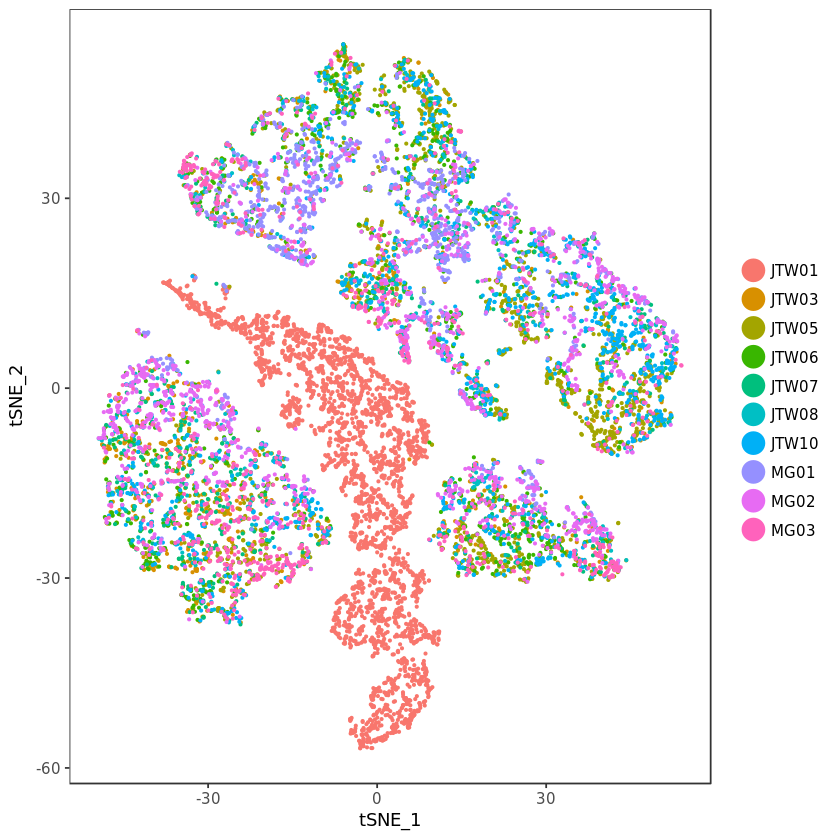

In [13]:
# Colored by sample
DimPlot(object = cells, reduction.use = "tsne", group.by = "library_id", pt.size = 0.5, do.return = TRUE)

In [14]:
head(cells@meta.data)
dim(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,labels,pt.size
AAACCTGAGAAACCAT-1,5360,41716,bmac_msc_nojtw02,JTW01,0.02879543,5,5,14,10,18,Cultured MSCs,0.5
AAACCTGAGCGATTCT-1,2309,7932,bmac_msc_nojtw02,JTW01,0.08827238,8,9,10,5,11,Cultured MSCs,0.5
AAACCTGCACAAGCCC-1,3437,14686,bmac_msc_nojtw02,JTW01,0.02404468,1,1,3,8,7,Cultured MSCs,0.5
AAACCTGCAGATGAGC-1,3773,21028,bmac_msc_nojtw02,JTW01,0.03143876,5,5,1,17,9,Cultured MSCs,0.5
AAACCTGGTGCGCTTG-1,3978,21707,bmac_msc_nojtw02,JTW01,0.03382021,1,1,3,8,12,Cultured MSCs,0.5
AAACCTGTCACCACCT-1,6547,58719,bmac_msc_nojtw02,JTW01,0.02635434,5,5,14,10,18,Cultured MSCs,0.5


[1] 12279    12

In [15]:
table(cells@meta.data$library_id)
table(cells@ident)


JTW01 JTW03 JTW05 JTW06 JTW07 JTW08 JTW10  MG01  MG02  MG03 
 2978   780  1759  1016   676   563  1166  1112  1294   935 


          T cells              MSCs         Monocytes      Erythrocytes 
             3526              2988              1999              1446 
            CD34+           B cells          NK cells   Dendritic cells 
              791               693               305               240 
FCGR3A+ Monocytes       Lymphoblast 
              172               119 

In [28]:
sample_names <- unique(cells@meta.data$library_id)
#cellpops <- matrix(0, nrow = 10, ncol = 16) #numeric names
cellpops <- matrix(0, nrow = 10, ncol = 10) #labels
row.names(cellpops) <- sample_names
#colnames(cellpops) <- c(0:15) #numeric names
colnames(cellpops) <- unique(cells@ident)
head(cellpops)
dim(cellpops)

,MSCs,Lymphoblast,T cells,NK cells,B cells,Erythrocytes,CD34+,Monocytes,FCGR3A+ Monocytes,Dendritic cells
JTW01,0,0,0,0,0,0,0,0,0,0
JTW03,0,0,0,0,0,0,0,0,0,0
JTW05,0,0,0,0,0,0,0,0,0,0
JTW06,0,0,0,0,0,0,0,0,0,0
JTW07,0,0,0,0,0,0,0,0,0,0
JTW08,0,0,0,0,0,0,0,0,0,0


[1] 10 10

In [29]:
cells@meta.data$new.ident <- cells@ident
head(cells@meta.data)

,nGene,nUMI,orig.ident,library_id,percent.mito,res.0.5,res.0.6,res.0.8,res.1,res.1.5,labels,pt.size,new.ident
AAACCTGAGAAACCAT-1,5360,41716,bmac_msc_nojtw02,JTW01,0.02879543,5,5,14,10,18,Cultured MSCs,0.5,MSCs
AAACCTGAGCGATTCT-1,2309,7932,bmac_msc_nojtw02,JTW01,0.08827238,8,9,10,5,11,Cultured MSCs,0.5,MSCs
AAACCTGCACAAGCCC-1,3437,14686,bmac_msc_nojtw02,JTW01,0.02404468,1,1,3,8,7,Cultured MSCs,0.5,MSCs
AAACCTGCAGATGAGC-1,3773,21028,bmac_msc_nojtw02,JTW01,0.03143876,5,5,1,17,9,Cultured MSCs,0.5,MSCs
AAACCTGGTGCGCTTG-1,3978,21707,bmac_msc_nojtw02,JTW01,0.03382021,1,1,3,8,12,Cultured MSCs,0.5,MSCs
AAACCTGTCACCACCT-1,6547,58719,bmac_msc_nojtw02,JTW01,0.02635434,5,5,14,10,18,Cultured MSCs,0.5,MSCs


In [30]:
# Fill cellpops with cluster membership counts
for (sample in sample_names) {
    #tmp <- cells@meta.data[which(cells@meta.data$library_id == sample), "res.0.6"] #numeric
    tmp <- cells@meta.data[which(cells@meta.data$library_id == sample), "new.ident"]
    #tmp <- factor(tmp, levels = c(0:15)) #numeric
    tmp <- factor(tmp, levels = unique(cells@meta.data$new.ident))
    tmp <- table(tmp)
    cellpops[sample, ] <- tmp
}

In [76]:
cellpops

,MSCs,Lymphoblast,T cells,NK cells,B cells,Erythrocytes,CD34+,Monocytes,FCGR3A+ Monocytes,Dendritic cells
JTW01,2977,1,0,0,0,0,0,0,0,0
JTW03,2,9,446,26,65,115,14,92,7,4
JTW05,3,49,568,33,81,152,203,548,44,78
JTW06,2,5,409,23,91,197,113,142,13,21
JTW07,1,3,325,19,34,89,37,152,8,8
JTW08,0,3,221,29,73,70,27,118,0,22
JTW10,2,18,383,19,64,80,97,440,15,48
MG01,0,16,133,19,50,474,199,176,29,16
MG02,1,3,600,69,127,108,65,238,53,30
MG03,0,12,441,68,108,161,36,93,3,13


In [77]:
# Create percentages table from cellpops
cellpops.pct <- cellpops
#cellpops.pct$Total <- rowsum(cellpops.pct, group = row.names(cellpops.pct))
head(cellpops.pct)

,MSCs,Lymphoblast,T cells,NK cells,B cells,Erythrocytes,CD34+,Monocytes,FCGR3A+ Monocytes,Dendritic cells
JTW01,2977,1,0,0,0,0,0,0,0,0
JTW03,2,9,446,26,65,115,14,92,7,4
JTW05,3,49,568,33,81,152,203,548,44,78
JTW06,2,5,409,23,91,197,113,142,13,21
JTW07,1,3,325,19,34,89,37,152,8,8
JTW08,0,3,221,29,73,70,27,118,0,22


In [78]:
Total <- rowSums(cellpops.pct)

In [79]:
cellpops.pct <- cellpops.pct/Total
cellpops.pct

,MSCs,Lymphoblast,T cells,NK cells,B cells,Erythrocytes,CD34+,Monocytes,FCGR3A+ Monocytes,Dendritic cells
JTW01,0.9996642042,0.0003357958,0.0000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.000000000,0.000000000
JTW03,0.0025641026,0.0115384615,0.5717949,0.03333333,0.08333333,0.14743590,0.01794872,0.11794872,0.008974359,0.005128205
JTW05,0.0017055145,0.0278567368,0.3229107,0.01876066,0.04604889,0.08641273,0.11540648,0.31154065,0.025014213,0.044343377
JTW06,0.0019685039,0.0049212598,0.4025591,0.02263780,0.08956693,0.19389764,0.11122047,0.13976378,0.012795276,0.020669291
JTW07,0.0014792899,0.0044378698,0.4807692,0.02810651,0.05029586,0.13165680,0.05473373,0.22485207,0.011834320,0.011834320
JTW08,0.0000000000,0.0053285968,0.3925400,0.05150977,0.12966252,0.12433393,0.04795737,0.20959147,0.000000000,0.039076377
JTW10,0.0017152659,0.0154373928,0.3284734,0.01629503,0.05488851,0.06861063,0.08319039,0.37735849,0.012864494,0.041166381
MG01,0.0000000000,0.0143884892,0.1196043,0.01708633,0.04496403,0.42625899,0.17895683,0.15827338,0.026079137,0.014388489
MG02,0.0007727975,0.0023183926,0.4636785,0.05332303,0.09814529,0.08346213,0.05023184,0.18392581,0.040958269,0.023183926
MG03,0.0000000000,0.0128342246,0.4716578,0.07272727,0.11550802,0.17219251,0.03850267,0.09946524,0.003208556,0.013903743


In [21]:
# Numeric column names only
#colnames(cellpops) <- paste("Cluster_", colnames(cellpops))
#head(cellpops)

,Cluster_ 0,Cluster_ 1,Cluster_ 2,Cluster_ 3,Cluster_ 4,Cluster_ 5,Cluster_ 6,Cluster_ 7,Cluster_ 8,Cluster_ 9,Cluster_ 10,Cluster_ 11,Cluster_ 12,Cluster_ 13,Cluster_ 14,Cluster_ 15
JTW01,0,1733,0,0,0,848,0,0,0,396,0,0,0,0,0,1
JTW03,372,1,73,74,63,1,19,14,52,0,43,22,26,4,7,9
JTW05,307,2,338,261,129,1,210,203,23,0,73,8,33,78,44,49
JTW06,245,1,63,164,120,1,79,113,77,0,34,57,23,21,13,5
JTW07,265,0,93,60,40,1,59,37,49,0,20,14,19,8,8,3
JTW08,144,0,65,77,46,0,53,27,24,0,40,33,29,22,0,3


In [80]:
write.table(cellpops, file = "BMAC_MSCs_celltype_counts.txt", quote = FALSE, 
            sep = "\t", row.names = TRUE, col.names = NA)

In [81]:
write.table(cellpops.pct, file = "BMAC_MSCs_celltype_percents.txt", quote = FALSE, 
            sep = "\t", row.names = TRUE, col.names = NA)

# Percentages of cells that meet MSC definitions
* ISCT (Dominici)
* CD271+ (Ghazanfari surface markers)
* Jia et al 22 genes
* Silva et al 23 genes
* Silva et al 21 genes

In [61]:
cells

An object of class seurat in project bmac_msc_nojtw02 
 17692 genes across 12279 samples.

In [ ]:
dominici.exp <- cells@data[dominici, ]
dim(dominici.exp)
dominici.exp_zeros <- colSums(dominici.exp == 0)
dominici.expgenes <- which(dominici.exp_zeros == 0)
dominici.expgenes <- which(dominici.exp_zeros <= 3)
cells@meta.data$Dom <- rep("no", nrow(cells@meta.data))
cells@meta.data[dominici.expgenes,]$Dom <- rep("yes", length(dominici.expgenes))
table(cells@meta.data$Dom)
table(cells@meta.data[dominici.expgenes,]$library_id)

In [385]:
sessionInfo()

R version 3.4.1 (2017-06-30)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Amazon Linux AMI 2017.03

Matrix products: default
BLAS: /home/ec2-user/anaconda3/envs/R_env/lib/R/lib/libRblas.so
LAPACK: /home/ec2-user/anaconda3/envs/R_env/lib/R/lib/libRlapack.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] bindrcpp_0.2  dplyr_0.7.3   Seurat_2.3.4  Matrix_1.2-14 cowplot_0.9.1
[6] ggplot2_2.2.1

loaded via a namespace (and not attached):
  [1] Rtsne_0.13          colorspace_1.3-2    class_7.3-14       
  [4] modeltools_0.2-21   ggridges_0.5.1    